<a href="https://colab.research.google.com/github/schokoro/AttentionNMT/blob/jap_en/jap_en_translate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Первым делом проверим какая карточка нам досталась. Лучшим вариантом будет `Tesla P100-PCIE-16GB`, на остальных будет считаться медленнее.

In [1]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if device.type == 'cpu':
    raise RuntimeError
else:
    print(torch.cuda.get_device_name(0))

Tesla P100-PCIE-16GB


In [2]:
!pip install janome pandarallel  > /dev/null

In [3]:
!rm -rf AttentionNMT/
!git clone -b master https://github.com/schokoro/AttentionNMT.git > /dev/null

Cloning into 'AttentionNMT'...
remote: Enumerating objects: 118, done.
remote: Counting objects: 100% (118/118), done.
remote: Compressing objects: 100% (92/92), done.
remote: Total 118 (delta 61), reused 60 (delta 25), pack-reused 0
Receiving objects: 100% (118/118), 21.69 MiB | 9.04 MiB/s, done.
Resolving deltas: 100% (61/61), done.


In [4]:
import sys
sys.path.append('/content/AttentionNMT')

In [5]:
%load_ext autoreload

In [6]:
%reload_ext autoreload
%autoreload 2
import AttentionNMT
from AttentionNMT.transformer import Transformer, Encoder, Decoder
from AttentionNMT.utils import count_parameters, initialize_weights, translate_sentence, evaluate_blue, train, evaluate, display_attention, sentence_blue

In [7]:
%autoreload 2
from typing import Dict, List, Optional
import torch.nn as nn
from matplotlib.font_manager import FontProperties
from torchtext.data import Field, BucketIterator, TabularDataset
from tqdm.notebook import tqdm
from pandarallel import pandarallel
import spacy
import warnings
import re
import random
import math
import time
from janome.tokenizer import Tokenizer as JTokenizer
import seaborn as sns
import numpy as np
import pandas as pd

sns.set()
tqdm.pandas()
warnings.filterwarnings('ignore')
pandarallel.initialize(progress_bar=False)

%matplotlib inline

INFO: Pandarallel will run on 2 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [8]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = False

# Подготовка данных и EDA

Для обучения англо-японского переводчика будем использовать [Tanaka Corpus](http://www.edrdg.org/wiki/index.php/Tanaka_Corpus). Прямая ссылка на скачивание [здесь](ftp://ftp.monash.edu/pub/nihongo/examples.utf.gz).


In [9]:
!wget -q ftp://ftp.monash.edu/pub/nihongo/examples.utf.gz 
!gunzip -f examples.utf.gz

## Подготовка корпуса

Посмотрим, как выглядит корпус:

In [10]:
!head -4 examples.utf

A: ムーリエルは２０歳になりました。	Muiriel is 20 now.#ID=1282_4707
B: は 二十歳(はたち){２０歳} になる[01]{になりました}
A: すぐに戻ります。	I will be back soon.#ID=1284_4709
B: 直ぐに{すぐに} 戻る{戻ります}


Нам нужны только строки с префиксом `A:`
Для токенизации английского языка будем использовать spacy, для японского - токенизатор janome. Для англо-японского перевода будет лучше, если японский текст мы развернём задом наперёд. Просто поверьте. Или можете проверить. Соответственно, при переводе нам будет необходимо развернуть переведённый текст обратно.

In [11]:
reverse_src = False
reverse_trg = False

In [12]:
nlp = spacy.load("en_core_web_sm")
jt = JTokenizer()
en_remove = re.compile(r'#ID=.+')
is_token = re.compile(r'\w+')


def get_pair(line: str, reverse=reverse_src) -> Dict[str, str]:
    """
    Принимает на вход строку из файла паралелльного корпуса, возвращает словарь
     с японским и английским предложениями
    """
    jap, en = line.strip().split('\t')
    jap = jap.replace('A: ', '').strip()
    en = en_remove.sub('', en)
    return {'en': en, 'jap': jap}
  
def trg_tokenize(text: str, reverse=reverse_src) -> List[str]:
    """
    Токенизирует английский текст, возвращает список токенов.
    """
    tokens = [tok.text for tok in nlp.tokenizer(text)]
    if reverse:
        tokens.reverse()
    return tokens


def src_tokenize(text: str, reverse=reverse_trg) -> List[str]:
    """
    Токенизирует японский текст, возвращает список токенов в обратном порядке

    """
    tokens = [token.base_form for token in jt.tokenize(text)]
    if reverse:
        tokens.reverse()
    return tokens


dicts = []
with open('examples.utf', 'r') as fobj:
    for i, line in enumerate(fobj):
        if line.startswith('A:'):
            dicts.append(get_pair(line))


corpus_df = pd.DataFrame(dicts)   

Посчитаем длины предложений в символах и посмотрим их корреляцию.

In [13]:
corpus_df['en_len'] = corpus_df['en'].map(lambda x: len(x))
corpus_df['jap_len'] = corpus_df['jap'].map(lambda x: len(x))

In [14]:
corpus_df[['en_len','jap_len' ]].corr()

,en_len,jap_len
en_len,1.00000,0.80946
jap_len,0.80946,1.00000


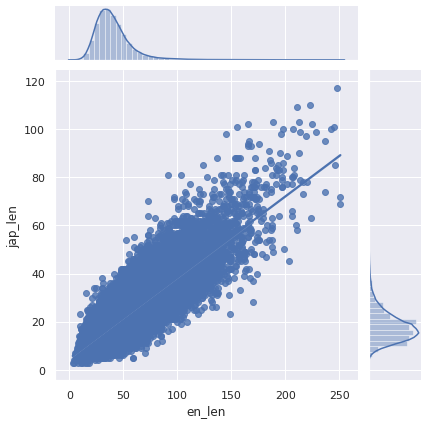

In [15]:
sns.jointplot("en_len", "jap_len", data=corpus_df, kind="reg");

А теперь - длины предложений в токенах и их корреляцию.

In [16]:
%time corpus_df['en_tok_len'] = corpus_df['en'].parallel_apply(lambda x: len(trg_tokenize(x)))

CPU times: user 71.1 ms, sys: 88.6 ms, total: 160 ms
Wall time: 6.91 s


In [17]:
%time corpus_df['jap_tok_len'] = corpus_df['jap'].parallel_apply(lambda x: len(src_tokenize(x)))

CPU times: user 188 ms, sys: 141 ms, total: 330 ms
Wall time: 2min 52s


In [18]:
corpus_df[['en_tok_len','jap_tok_len' ]].corr()

,en_tok_len,jap_tok_len
en_tok_len,1.000000,0.775551
jap_tok_len,0.775551,1.000000


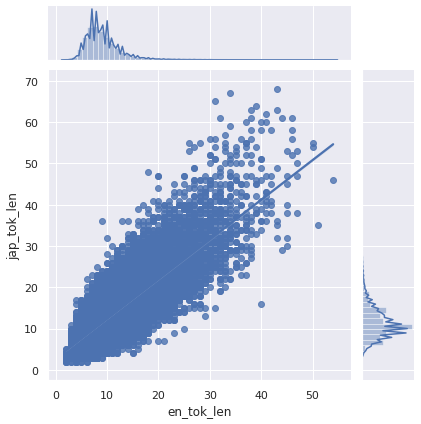

In [19]:
sns.jointplot("en_tok_len", "jap_tok_len", data=corpus_df, kind="reg")

In [20]:
corpus_df.describe()

,en_len,jap_len,en_tok_len,jap_tok_len
count,149791.000000,149791.000000,149791.000000,149791.000000
mean,40.471257,18.378414,9.307969,11.744277
std,17.418046,7.237914,3.594725,4.449128
min,3.000000,3.000000,2.000000,2.000000
25%,29.000000,14.000000,7.000000,9.000000
50%,37.000000,17.000000,9.000000,11.000000
75%,47.000000,21.000000,11.000000,14.000000
max,251.000000,117.000000,54.000000,68.000000


Выбросим из корпуса предложения длиннее чем `quantile(0.9)` и сохраним в файл.

In [21]:
corpus_df.en_tok_len.quantile(0.9), corpus_df.jap_tok_len.quantile(0.9)

(13.0, 17.0)

In [22]:
new_corpus_df = corpus_df[
    (corpus_df.en_tok_len < corpus_df.en_tok_len.quantile(0.9)) &
    (corpus_df.jap_tok_len < corpus_df.jap_tok_len.quantile(0.9)) 
]
new_corpus_df.shape

(124468, 6)

In [23]:
new_corpus_df.to_csv('jap_en_corpus.csv', index=None, columns=['jap', 'en'])

In [24]:
new_corpus_df.head()

,en,jap,en_len,jap_len,en_tok_len,jap_tok_len
0,Muiriel is 20 now.,ムーリエルは２０歳になりました。,18,16,5,10
1,I will be back soon.,すぐに戻ります。,20,8,6,5
2,I may give up soon and just nap instead.,すぐに諦めて昼寝をするかも知れない。,40,18,10,11
3,I love you.,愛してる。,11,5,4,3
4,I shouldn't have logged off.,ログアウトするんじゃなかったよ。,28,16,7,8


In [25]:
max_src = corpus_df.jap_tok_len.max() + 2
max_trg = corpus_df.en_tok_len.max() + 2

In [26]:
SRC = Field(
            tokenize = src_tokenize, 
            init_token = '<sos>', 
            eos_token = '<eos>', 
            lower = True, 
            batch_first = True)

TRG = Field(
            tokenize = trg_tokenize, 
            init_token = '<sos>', 
            eos_token = '<eos>', 
            lower = True, 
            batch_first = True)

In [27]:
%%time
trn_data_fields = [("src", SRC), ("trg", TRG)]

dataset = TabularDataset(
    path='jap_en_corpus.csv',
    format='csv',
    skip_header=True,
    fields=trn_data_fields
)

CPU times: user 2min 52s, sys: 672 ms, total: 2min 52s
Wall time: 2min 52s


In [28]:
!head -10 jap_en_corpus.csv

jap,en
ムーリエルは２０歳になりました。,Muiriel is 20 now.
すぐに戻ります。,I will be back soon.
すぐに諦めて昼寝をするかも知れない。,I may give up soon and just nap instead.
愛してる。,I love you.
ログアウトするんじゃなかったよ。,I shouldn't have logged off.
誰にでも長所と短所がある。,Everyone has both strong and weak points.
「信用して」と彼は言った。,"""Trust me,"" he said."
「これはとてもおもしろそうだね」とひろしが言います。,"""This looks pretty interesting,"" Hiroshi says."
またいつか風のように走るんだ。,Someday I'll run like the wind.


In [29]:
train_data, valid_data, test_data = dataset.split(split_ratio=[0.98, 0.01, 0.01])

In [30]:
SRC.build_vocab(train_data.src, min_freq=3)  # 
print(SRC.vocab.freqs.most_common(10))

TRG.build_vocab(train_data.trg, min_freq=3)
print(TRG.vocab.freqs.most_common(10))

print(f'SRC.vocab: {len(SRC.vocab)}, TRG.vocab: {len(TRG.vocab)}')

[('。', 121263), ('は', 93000), ('た', 51244), ('の', 48539), ('に', 48386), ('を', 47693), ('て', 34216), ('が', 30231), ('する', 27348), ('だ', 25688)]
[('.', 110949), ('the', 47479), ('to', 26434), ('i', 25470), ('a', 21899), ('is', 21009), ('he', 19815), ('you', 15689), ('of', 14215), ('in', 13549)]
SRC.vocab: 11158, TRG.vocab: 9050


In [31]:
BATCH_SIZE = 256

train_iterator, valid_iterator, test_iterator = BucketIterator.splits(
    (train_data, valid_data, test_data),
    batch_size=BATCH_SIZE,
    sort_key=lambda x: len(x.src), # the BucketIterator needs to be told what function it should use to group the data.
    sort_within_batch=False,
    shuffle=True,
    device=device)

# Тренировка модели


In [32]:
INPUT_DIM = len(SRC.vocab)
OUTPUT_DIM = len(TRG.vocab)
HID_DIM = 128
ENC_LAYERS = 3
DEC_LAYERS = 3
ENC_HEADS = 4
DEC_HEADS = 4
ENC_PF_DIM = 2 * HID_DIM
DEC_PF_DIM = 2 * HID_DIM
ENC_DROPOUT = 0.07
DEC_DROPOUT = 0.07

enc = Encoder(INPUT_DIM, 
              HID_DIM, 
              ENC_LAYERS, 
              ENC_HEADS, 
              ENC_PF_DIM, 
              dropout=ENC_DROPOUT, 
              device=device,
              max_length=max_src)

dec = Decoder(OUTPUT_DIM, 
              HID_DIM, 
              DEC_LAYERS, 
              DEC_HEADS, 
              DEC_PF_DIM,
              dropout=DEC_DROPOUT, 
              device=device,
              max_length=max_trg)

In [33]:
SRC_PAD_IDX = SRC.vocab.stoi[SRC.pad_token]
TRG_PAD_IDX = TRG.vocab.stoi[TRG.pad_token]
try:
    del model
    torch.cuda.empty_cache()
except:
    print('no model')

model = Transformer(enc, dec, SRC_PAD_IDX, TRG_PAD_IDX, device).to(device)

no model


Посчитаем количество параметров сети

In [34]:
print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 4,761,690 trainable parameters


In [35]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [36]:
model.apply(initialize_weights);
best_macro_bleu = 0
test_loss = np.inf

In [37]:
BEST_MODEL = 'best_blue_jap_en.pt'

In [38]:
cross_entropy = nn.CrossEntropyLoss(ignore_index = TRG_PAD_IDX)
LEARNING_RATE = 1.25e-3
optimizer = torch.optim.Adam(model.parameters(), lr = LEARNING_RATE)

def criterion(pred, target):
    """
    pred - BatchSize x TargetLen x VocabSize
    target - BatchSize x TargetLen
    """
    pred_flat = pred.view(-1, pred.shape[-1])  # BatchSize*TargetLen x VocabSize
    target_flat = target.view(-1)  # BatchSize*TargetLen
    return cross_entropy(pred_flat, target_flat)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=optimizer,
                                                       factor=0.2,
                                                       verbose=True,
                                                       cooldown=0, 
                                                       patience=4,              
                                                       threshold=0.01,
                                                       min_lr=5e-5)

In [39]:
train_history = []
valid_history = []
blue_history = []

In [40]:
N_EPOCHS = 30
CLIP = 1

try:
    best_valid_loss = evaluate(model, valid_iterator, criterion)
except:
    best_valid_loss = float('inf')
print(f'Loss: {best_valid_loss:7.3f}')


for epoc_num, epoch in tqdm(enumerate(range(N_EPOCHS)), total=N_EPOCHS):
    curent_lr = optimizer.param_groups[0]['lr']
    start_time = time.time()
    try:
        train_loss = train(model, train_iterator, optimizer, criterion, CLIP, 1, 1)
        valid_loss = evaluate(model, valid_iterator, criterion)
        
        scheduler.step(valid_loss)
                
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            print('Новая лучшая модель')

        macro_bleu = evaluate_blue(valid_data, SRC, TRG, model, device, max_trg, src_tokenize).mean()
        if macro_bleu > best_macro_bleu:
            best_macro_bleu = macro_bleu
            print('Новый лучший blue')            
            torch.save(model.state_dict(), BEST_MODEL)

        train_history.append(train_loss)
        valid_history.append(valid_loss)
        blue_history.append(macro_bleu)

        end_time = time.time()
        
        epoch_mins, epoch_secs = epoch_time(start_time, end_time)
        print(f'Epoch: {epoch+1:02} | Time: {epoch_mins}m {epoch_secs}s')
        
        print(f'\tMacro-average BLEU: {macro_bleu:.6f}')
        print(f'\tTrain Loss: {train_loss:.3f} | Train PPL: {math.exp(train_loss):7.3f}')
        print(f'\t Val. Loss: {valid_loss:.3f} |  Val. PPL: {math.exp(valid_loss):7.3f}')
        print('_' * 100)
    except KeyboardInterrupt:
        print(f"Epoch: {epoch+1:02} | LR: {optimizer.param_groups[0]['lr']}")
        break
    finally:
        pass

Loss:   9.131


Новая лучшая модель
Новый лучший blue
Epoch: 01 | Time: 1m 53s
	Macro-average BLEU: 0.472222
	Train Loss: 3.963 | Train PPL:  52.629
	 Val. Loss: 2.804 |  Val. PPL:  16.517
____________________________________________________________________________________________________
Новая лучшая модель
Новый лучший blue
Epoch: 02 | Time: 1m 47s
	Macro-average BLEU: 0.475731
	Train Loss: 2.514 | Train PPL:  12.355
	 Val. Loss: 2.142 |  Val. PPL:   8.518
____________________________________________________________________________________________________
Новая лучшая модель
Новый лучший blue
Epoch: 03 | Time: 1m 50s
	Macro-average BLEU: 0.497536
	Train Loss: 1.986 | Train PPL:   7.284
	 Val. Loss: 1.879 |  Val. PPL:   6.546
____________________________________________________________________________________________________
Новая лучшая модель
Новый лучший blue
Epoch: 04 | Time: 1m 48s
	Macro-average BLEU: 0.511350
	Train Loss: 1.697 | Train PPL:   5.456
	 Val. Loss: 1.747 |  Val. PPL:   5.739
_____

    Новый лучший blue
    Epoch: 29 | Time: 1m 50s
	    Macro-average BLEU: 0.564891
	    Train Loss: 0.546 | Train PPL:   1.727
	    Val. Loss: 1.596 |  Val. PPL:   4.934

Загрузим веса модели с наилучшим BLUE

In [41]:
model.load_state_dict(torch.load(BEST_MODEL))

test_loss = evaluate(model, test_iterator, criterion)

print(f'| Test Loss: {test_loss:.3f} | Test PPL: {math.exp(test_loss):7.3f} |')

| Test Loss: 1.630 | Test PPL:   5.105 |


## Анализ BLUE

CPU times: user 1min 18s, sys: 148 ms, total: 1min 18s
Wall time: 1min 18s


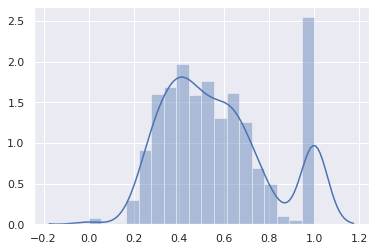

In [42]:
%%time 
valid_bleu = evaluate_blue(valid_data, SRC, TRG, model, device, max_trg, src_tokenize)
sns.distplot(valid_bleu);

CPU times: user 1min 18s, sys: 154 ms, total: 1min 18s
Wall time: 1min 18s


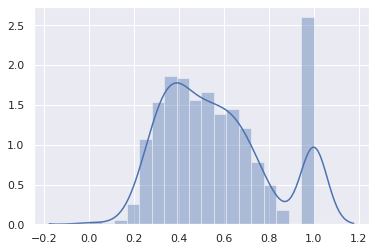

In [43]:
%%time 
test_bleu = evaluate_blue(test_data, SRC, TRG, model, device, max_trg, src_tokenize)
sns.distplot(test_bleu);

In [44]:
valid_bleu.mean(), test_bleu.mean()

(0.564891249286074, 0.5643931710002877)

# Оценка перевода. Отображение карт внимания.

Для корректного отображения карт внимания загрузим шрифт `Osaka.ttf`. Хотя, можно взять и из репозитория.

In [45]:
!wget -q https://github.com/vuthaihoc/fonts/raw/master/JUSTRAJDEEP/Osaka.ttf

fontprop_y = FontProperties(size=20)
fontprop_x = FontProperties(fname='Osaka.ttf', size=20)

src      : 私 は それ が 本当 だ と 思う 。
trg      : i think it true .
predicted: i think it is true . <eos>
     blue: 50.00%


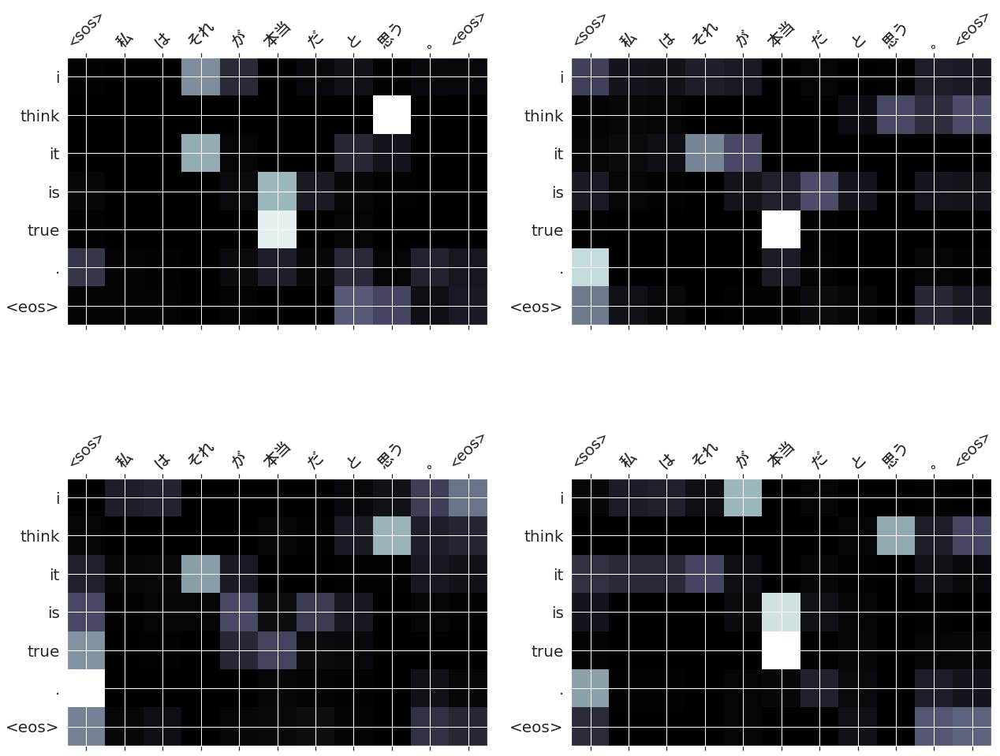

In [46]:
example_idx = random.randint(0, len(train_data) - 1)

src = vars(train_data.examples[example_idx])['src']
trg = vars(train_data.examples[example_idx])['trg']
translation, attention = translate_sentence(src, SRC, TRG, model, device, max_trg, src_tokenize)

if reverse_src:
    src.reverse()

if reverse_trg:
    trg.reverse()
    translation.reverse()

print(f'src      : {" ".join(src)}')
print(f'trg      : {" ".join(trg)}')
print(f'predicted: {" ".join(translation)}')
print(f'     blue: {100 * sentence_blue(trg, translation):.2f}%')
display_attention(src, translation, attention, n_heads = DEC_HEADS, n_rows = DEC_HEADS/2, n_cols = 2, fontprop_x=fontprop_x, fontprop_y=fontprop_y, reverse_trg=reverse_trg)

src      : そこで 誰 に 会う た の です か 。
trg      : who did you meet there ?
predicted: who did you see there ? <eos>
     blue: 50.00%


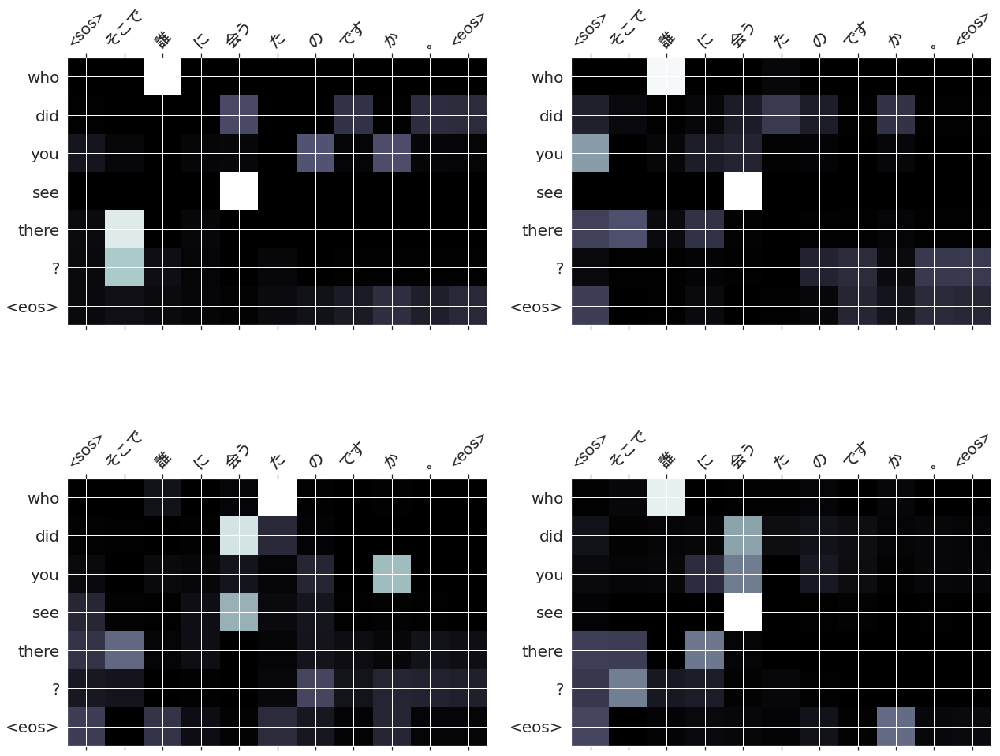

In [47]:
example_idx = random.randint(0, len(valid_data) - 1)

src = vars(valid_data.examples[example_idx])['src']
trg = vars(valid_data.examples[example_idx])['trg']
translation, attention = translate_sentence(src, SRC, TRG, model, device, max_trg, src_tokenize)

if reverse_src:
    src.reverse()

if reverse_trg:
    trg.reverse()
    translation.reverse()

print(f'src      : {" ".join(src)}')
print(f'trg      : {" ".join(trg)}')
print(f'predicted: {" ".join(translation)}')
print(f'     blue: {100 * sentence_blue(trg, translation):.2f}%')
display_attention(src, translation, attention, n_heads = DEC_HEADS, n_rows = DEC_HEADS/2, n_cols = 2, fontprop_x=fontprop_x, fontprop_y=fontprop_y, reverse_trg=reverse_trg)

src      : 松川 先生 と の 出会い を きっかけ に 、 私 の 人生 は 変わる た 。
trg      : my life changed , sparked by meeting mr matsukawa .
predicted: <unk> and my life changed my life for me . <eos>
     blue: 22.31%


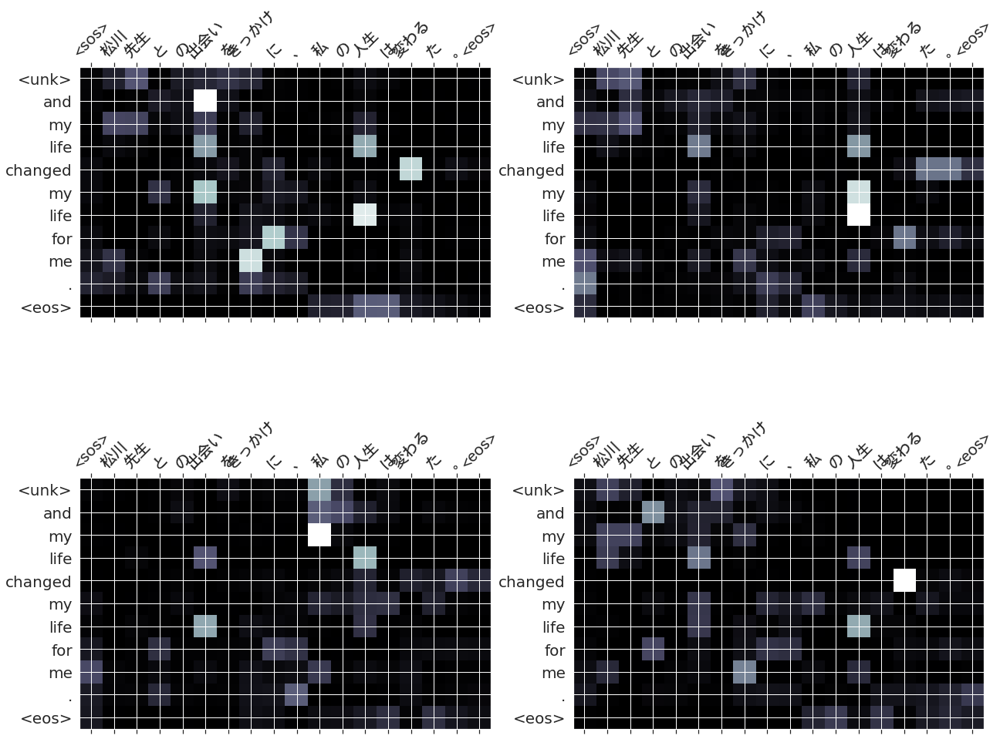

In [48]:
example_idx = random.randint(0, len(test_data) - 1)

src = vars(test_data.examples[example_idx])['src']
trg = vars(test_data.examples[example_idx])['trg']
translation, attention = translate_sentence(src, SRC, TRG, model, device, max_trg, src_tokenize)

if reverse_src:
    src.reverse()
 
if reverse_trg:
    trg.reverse()
    translation.reverse()

print(f'src      : {" ".join(src)}')
print(f'trg      : {" ".join(trg)}')
print(f'predicted: {" ".join(translation)}')
print(f'     blue: {100 * sentence_blue(trg, translation):.2f}%')
display_attention(src, translation, attention, n_heads = DEC_HEADS, n_rows = DEC_HEADS/2, n_cols = 2, fontprop_x=fontprop_x, fontprop_y=fontprop_y, reverse_trg=reverse_trg)

Выведем не более 50 предложений с `BLUE` не менее 0.9

1
src      : 彼女 は バス に 間に合う た 。
trg      : she was in time for the bus .
predicted: she was in time for the bus . <eos>
     blue: 100.00%


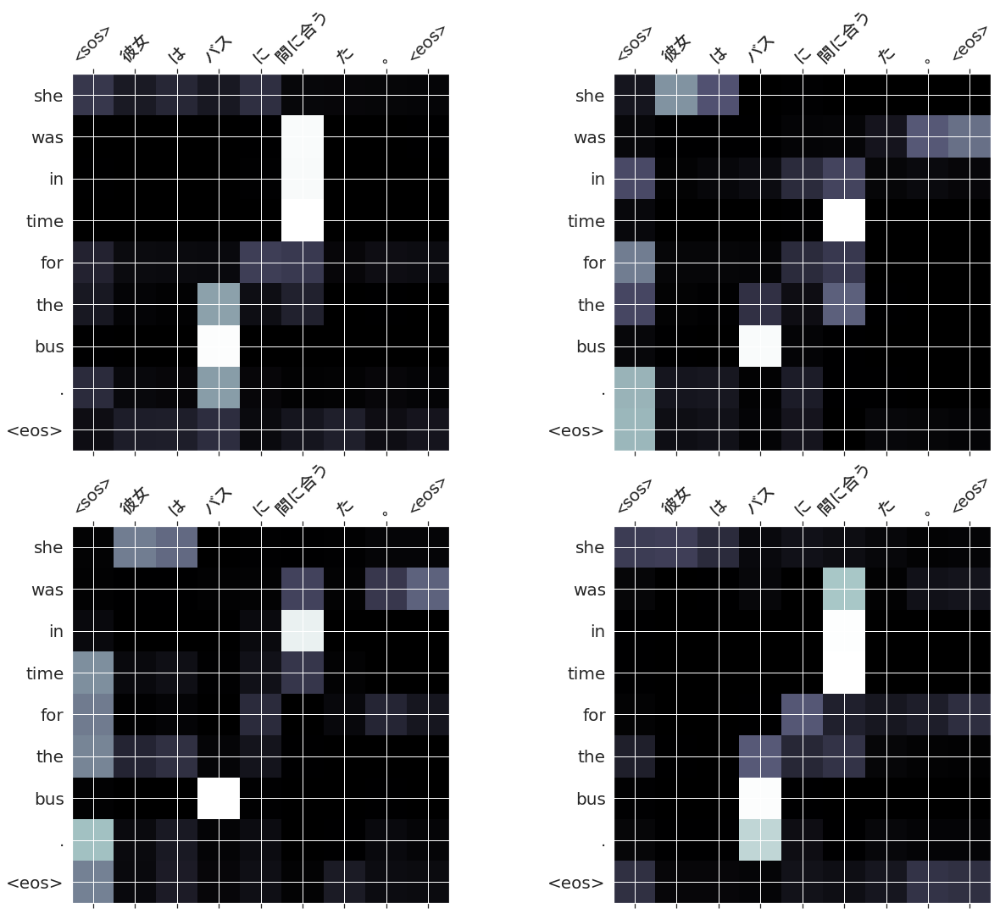

2
src      : 彼 は 二 十 歳 の とき に この 本 を 書く た 。
trg      : he wrote this book at the age of twenty .
predicted: he wrote this book at the age of twenty . <eos>
     blue: 100.00%


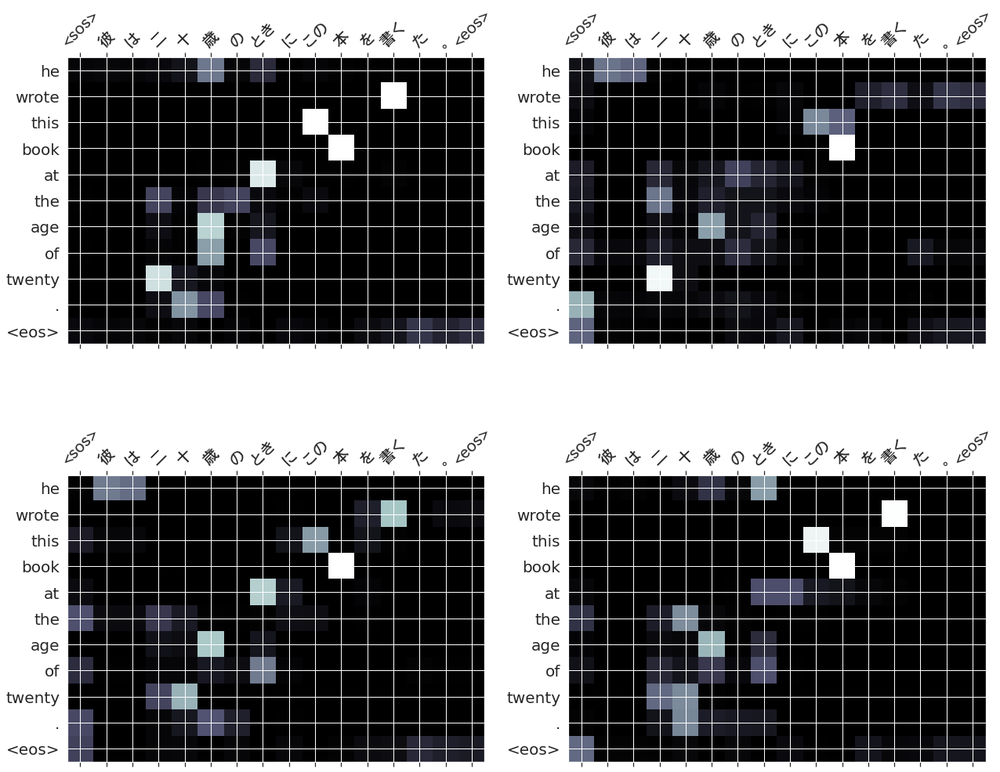

3
src      : 彼女 は ドレス を 作る て もらう た 。
trg      : she had her dress made .
predicted: she had her dress made . <eos>
     blue: 100.00%


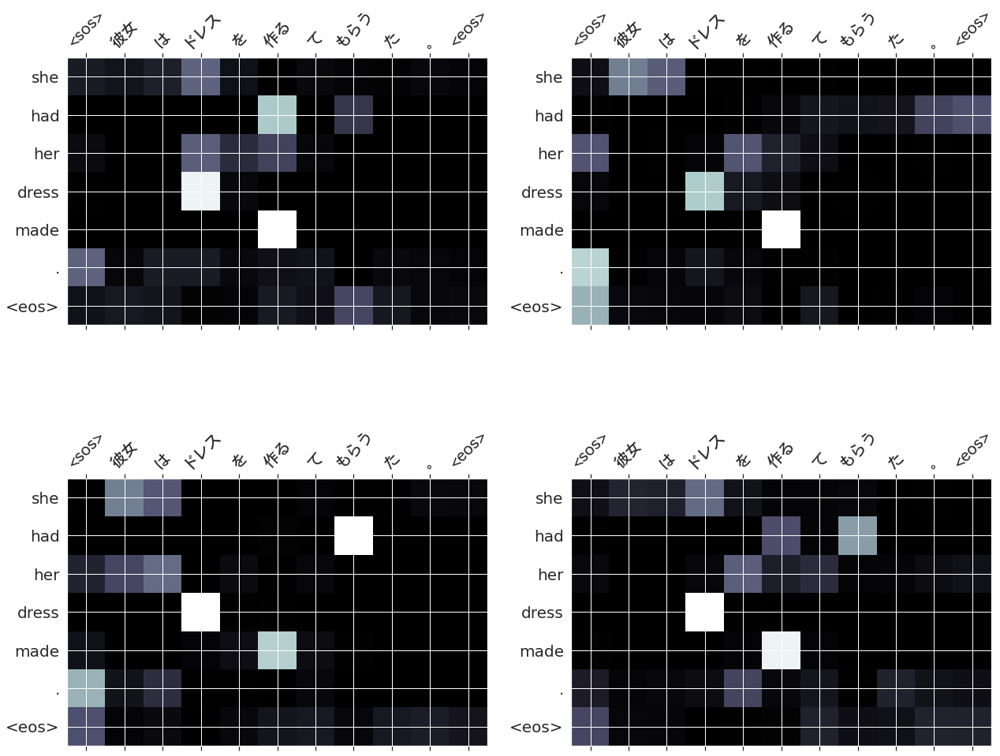

4
src      : 彼 は 何 でも 知る て いる か の よう だ 話し方 を する 。
trg      : he talks as if he knew everything .
predicted: he talks as if he knew everything . <eos>
     blue: 100.00%


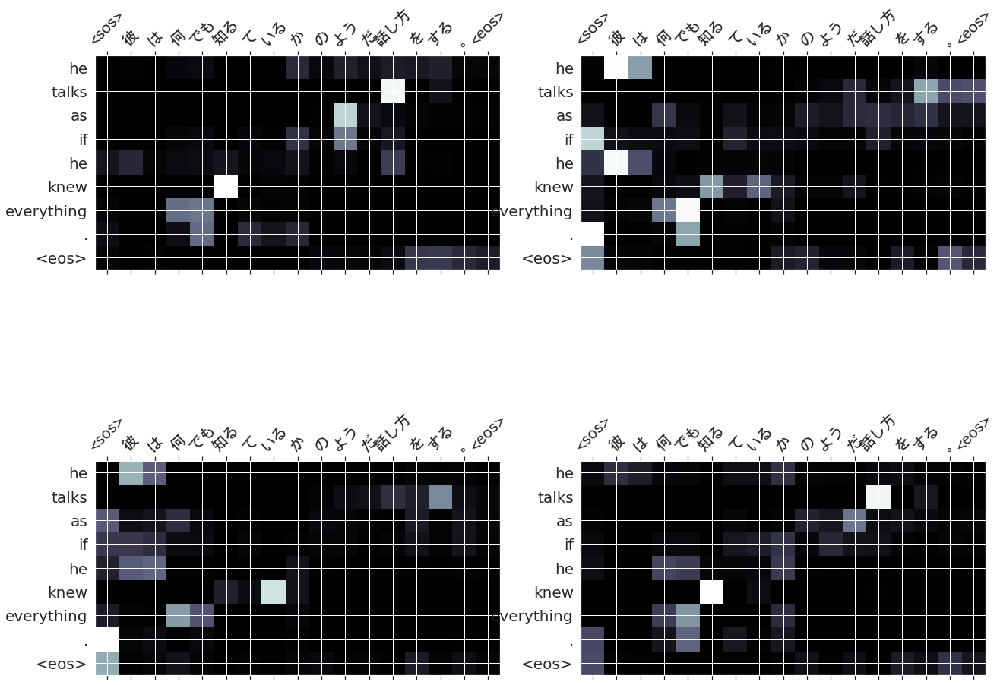

5
src      : 私 の 部屋 に は テレビ が ある 。
trg      : there is a television in my room .
predicted: there is a television in my room . <eos>
     blue: 100.00%


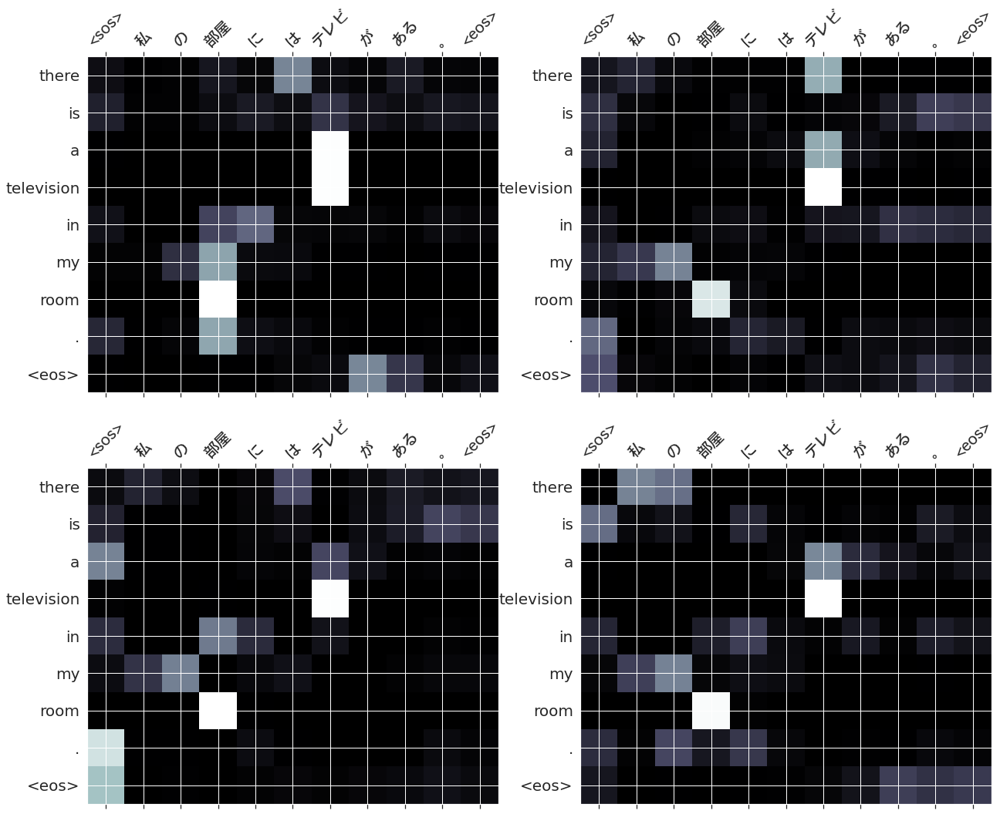

6
src      : うち の 母 は 活発 です 。
trg      : my mother is active .
predicted: my mother is active . <eos>
     blue: 100.00%


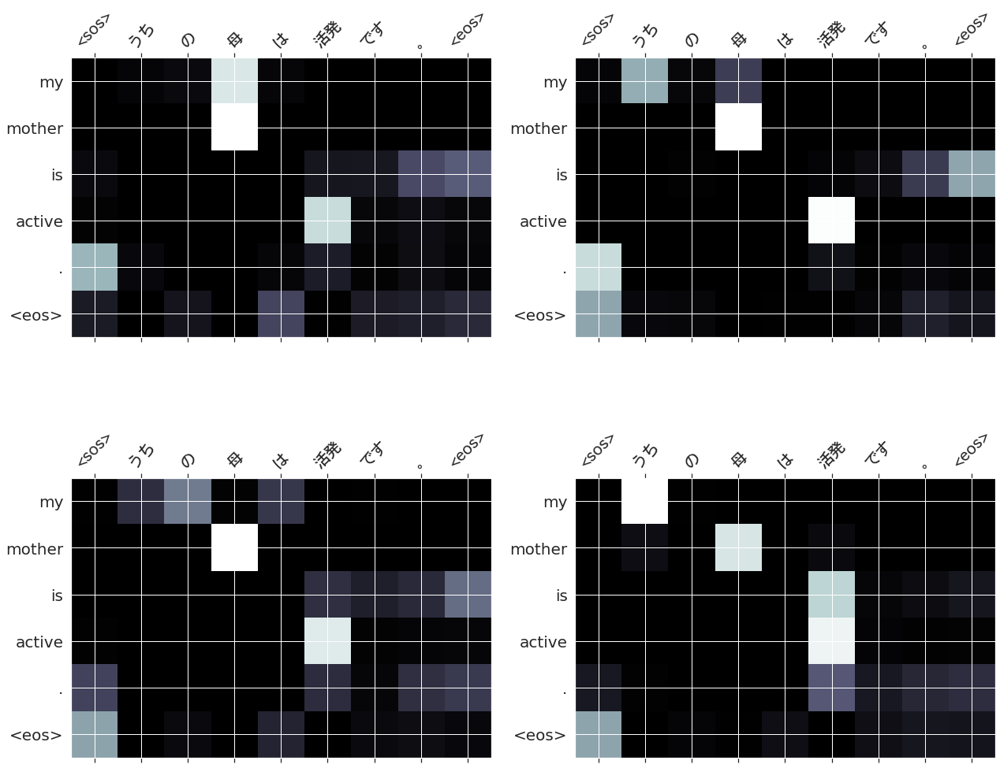

7
src      : 彼 は 昨日 この 本 を 読む だ 。
trg      : he read this book yesterday .
predicted: he read this book yesterday . <eos>
     blue: 100.00%


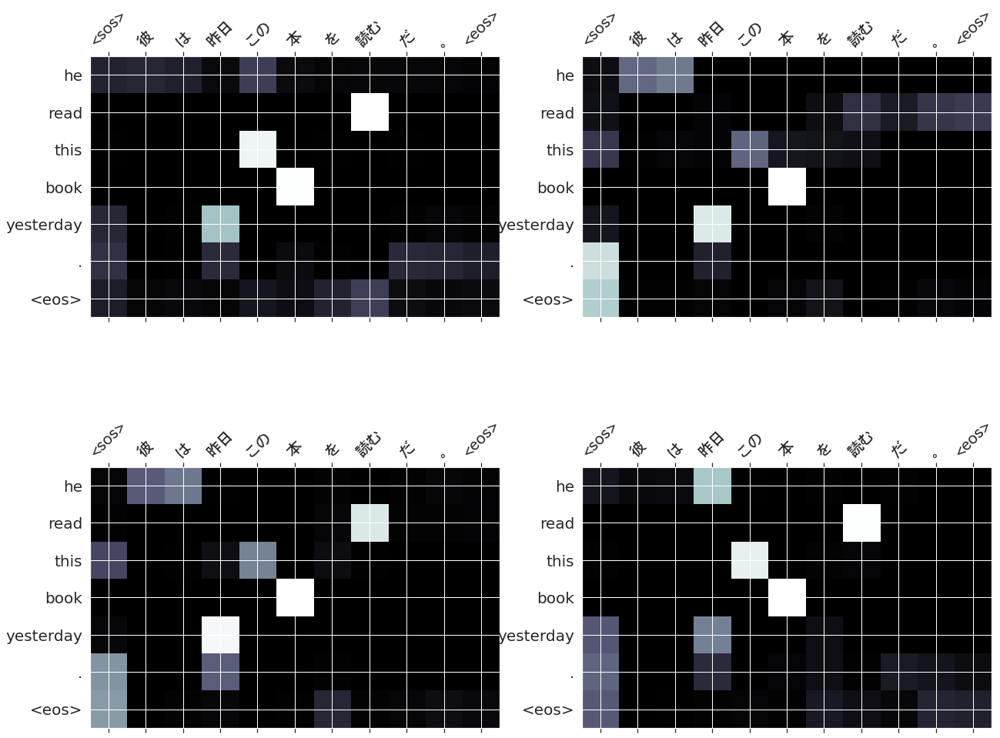

8
src      : そんな 悪習 は 廃止 する べし だ 。
trg      : such a bad custom should be done away with .
predicted: such a bad custom should be done away with . <eos>
     blue: 100.00%


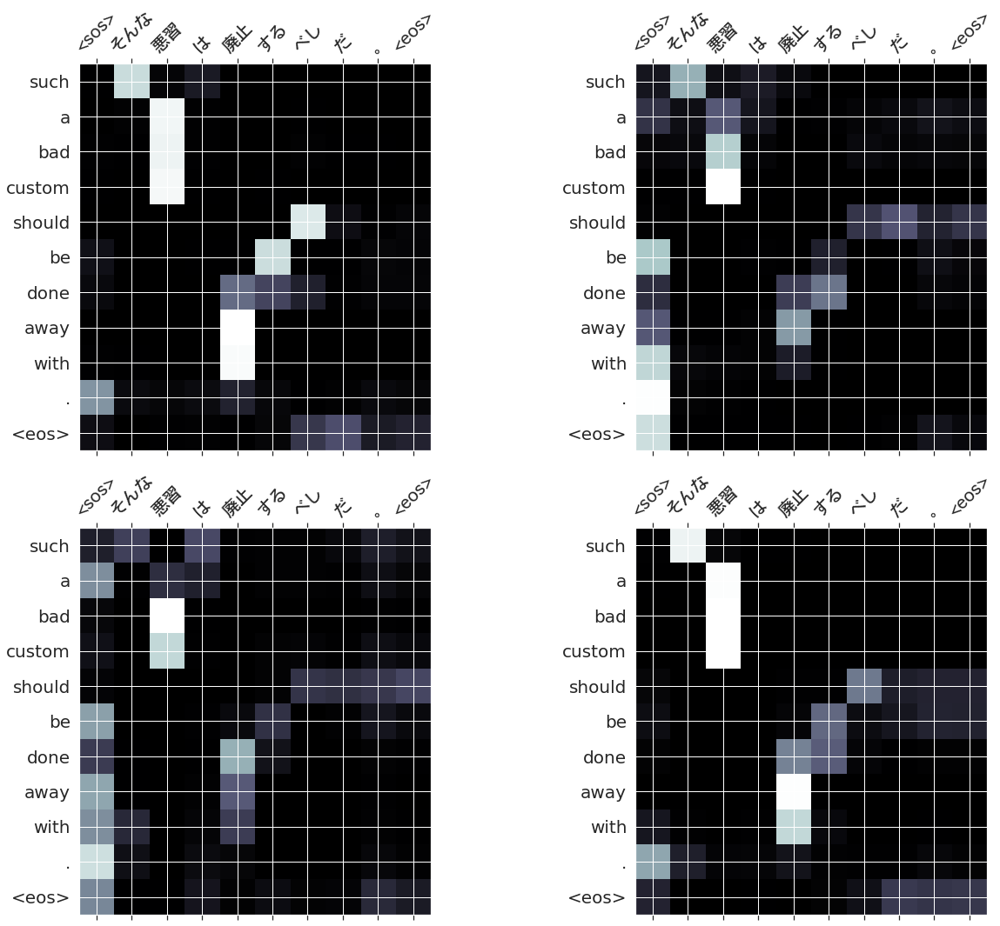

9
src      : 私 は その 少女 を 知る て いる ます 。
trg      : i know the girl .
predicted: i know the girl . <eos>
     blue: 100.00%


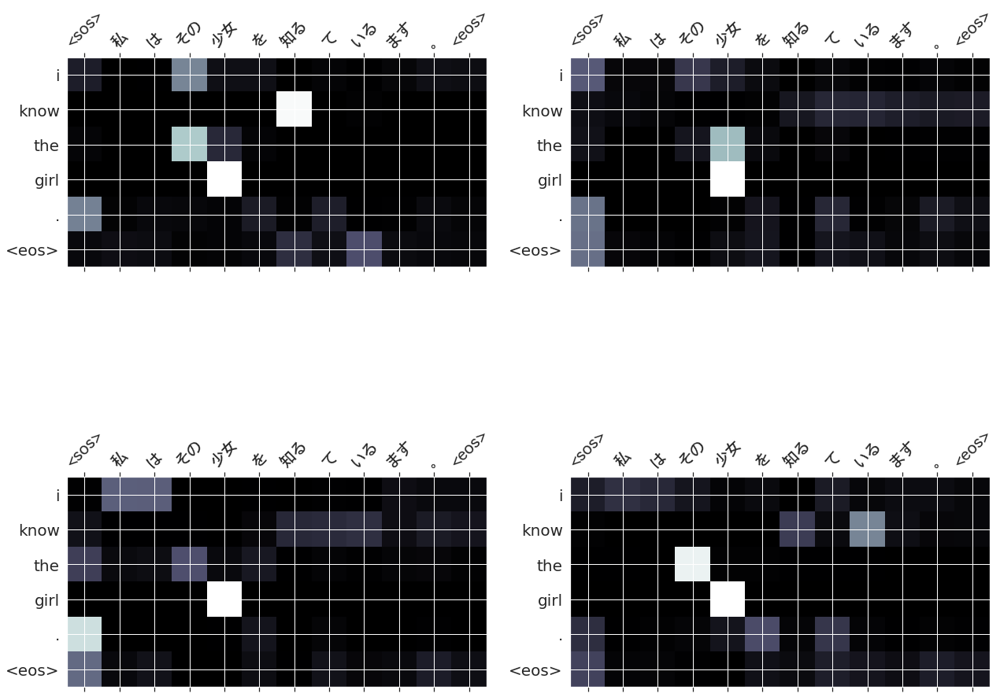

10
src      : どの チーム が 勝つ だ う か 。
trg      : which team will win ?
predicted: which team will win ? <eos>
     blue: 100.00%


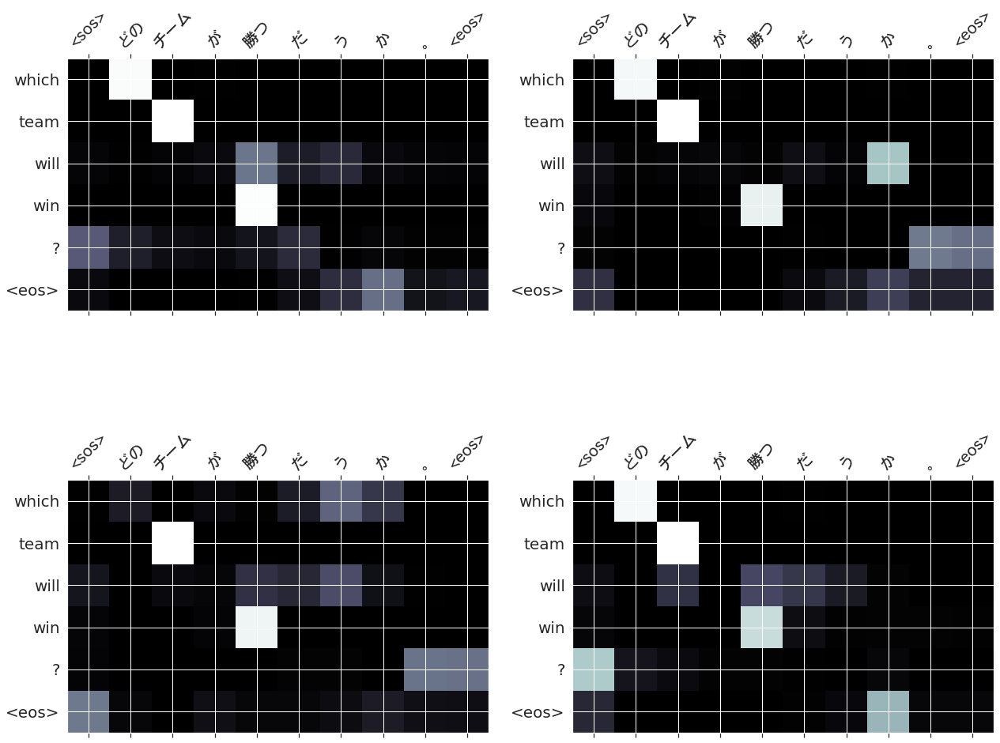

11
src      : 病気 の ため 私 は 外出 できる ない た 。
trg      : illness prevented me from going out .
predicted: illness prevented me from going out . <eos>
     blue: 100.00%


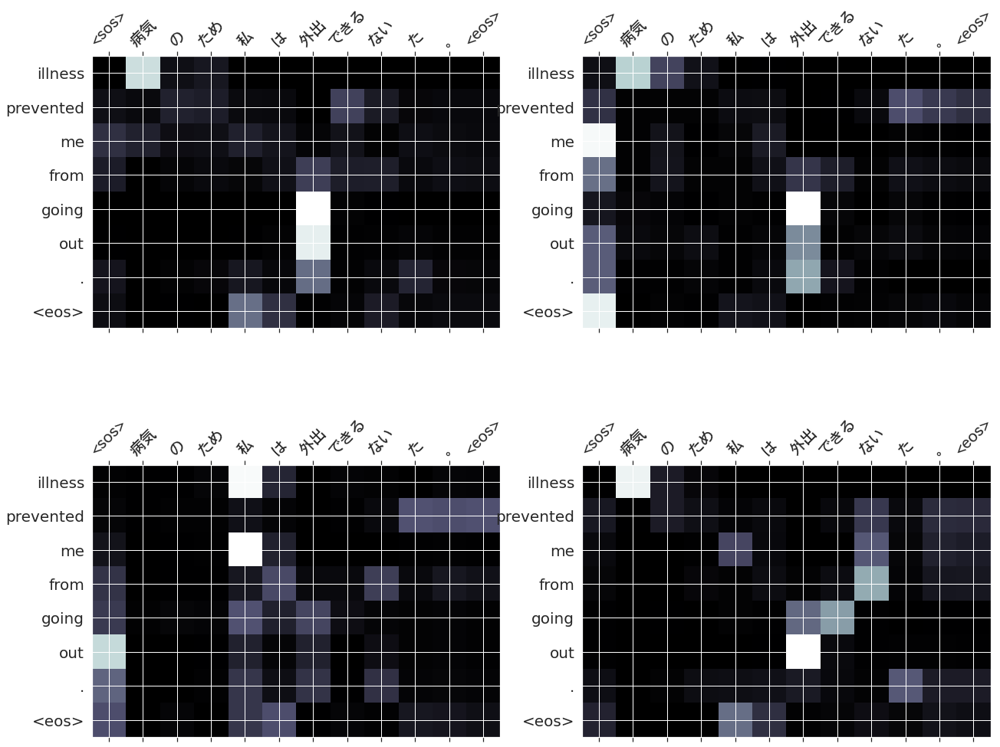

12
src      : 勘定 は 今日 支払う ない ば なる ない 。
trg      : the bill must be paid today .
predicted: the bill must be paid today . <eos>
     blue: 100.00%


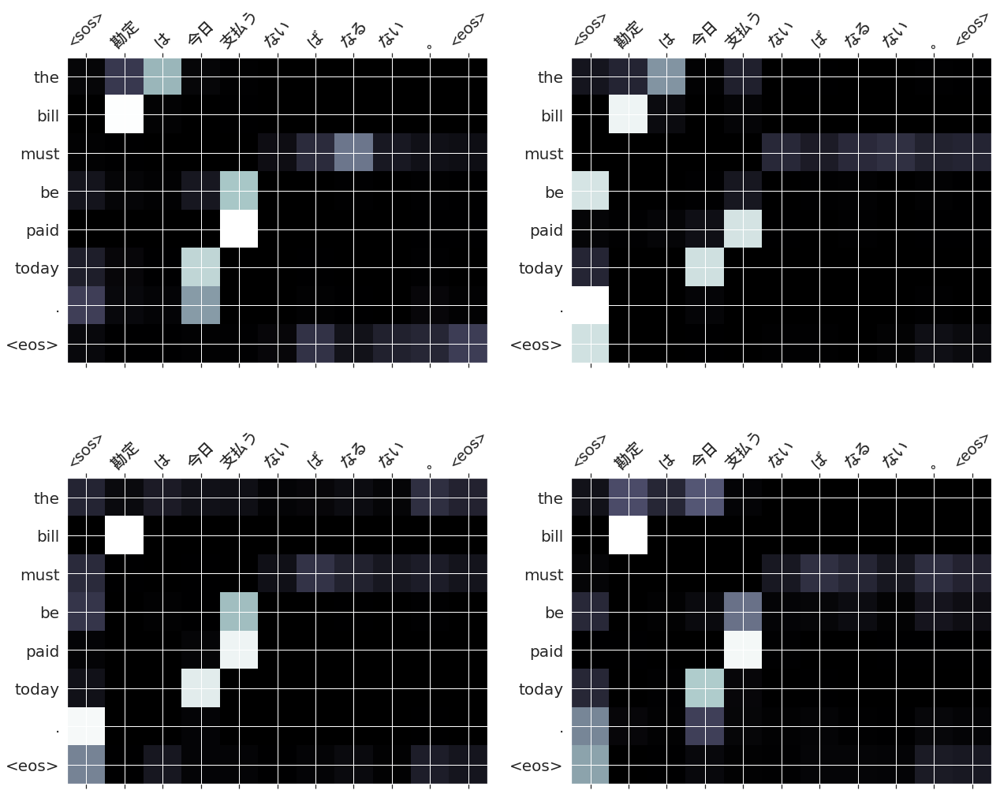

13
src      : 私 は 野球 選手 に なる たい 。
trg      : i want to be a baseball player .
predicted: i want to be a baseball player . <eos>
     blue: 100.00%


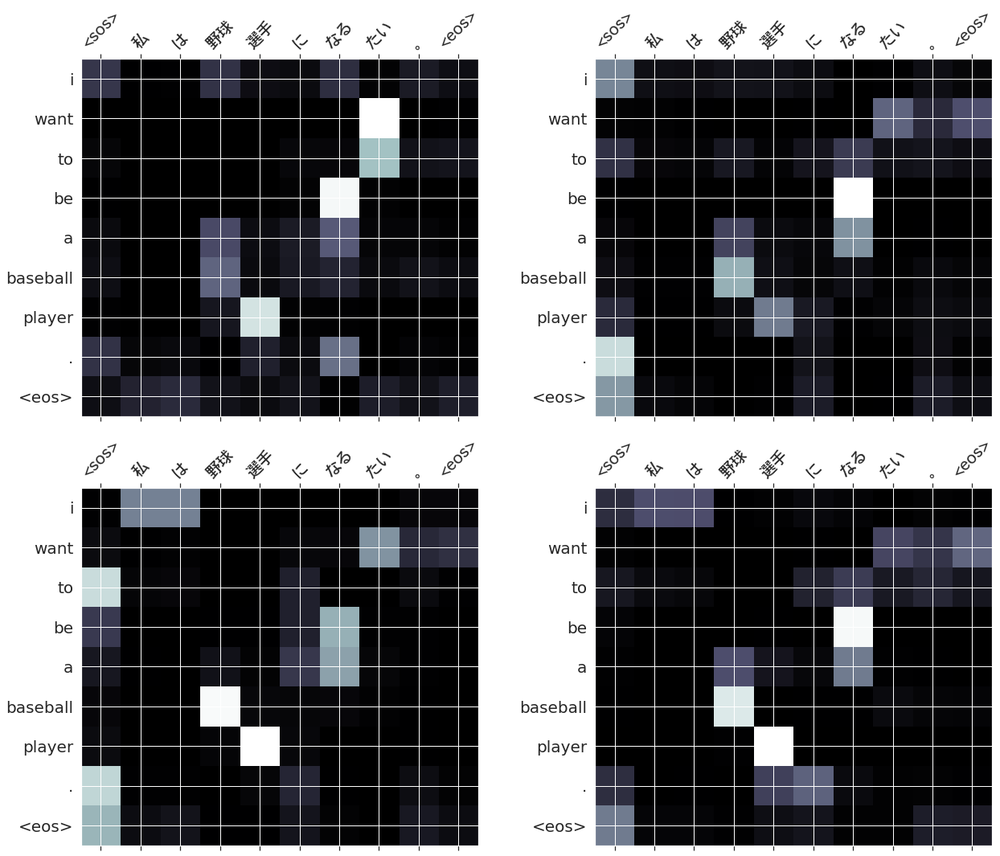

14
src      : 私 は この 自転車 を ただ で 手 に 入れる た 。
trg      : i got this bicycle for nothing .
predicted: i got this bicycle for nothing . <eos>
     blue: 100.00%


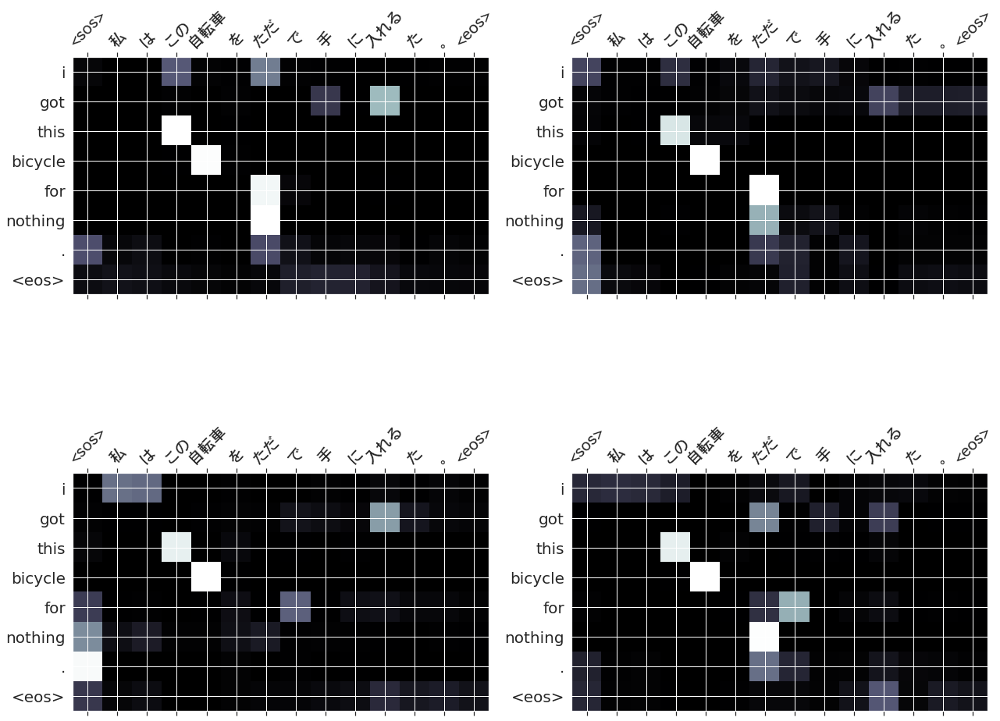

15
src      : 私 は よく 放課後 に テニス を する 。
trg      : i often play tennis after school .
predicted: i often play tennis after school . <eos>
     blue: 100.00%


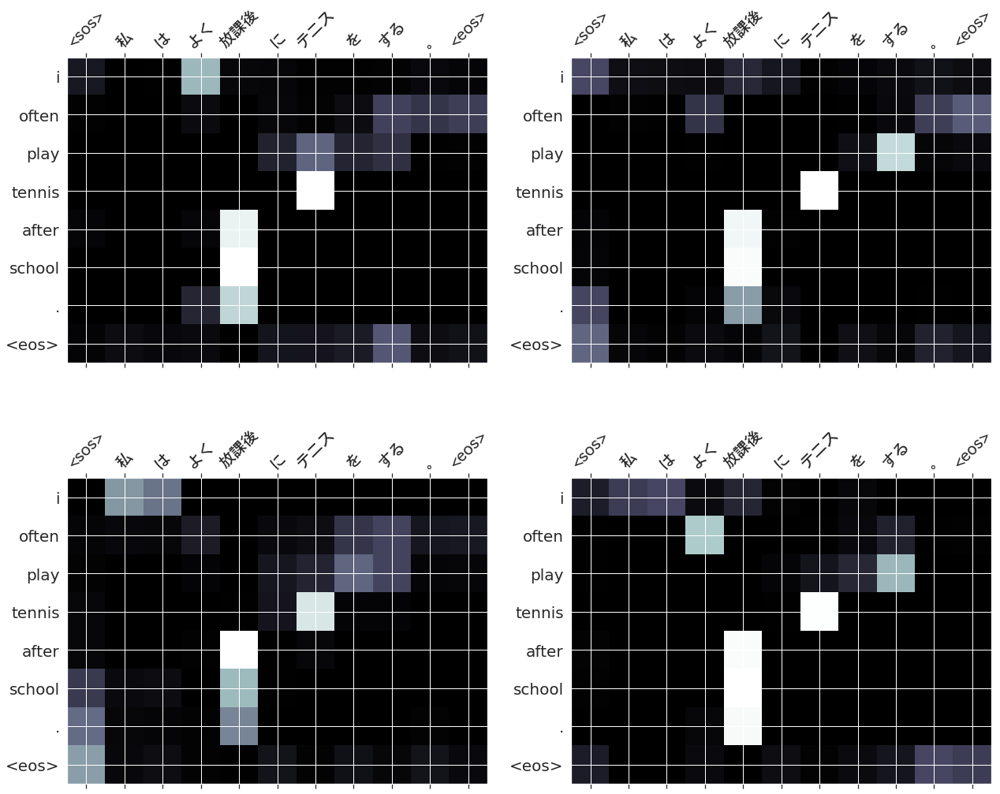

16
src      : それ について は 何 の 疑い も 無い 。
trg      : there is no doubt whatever about it .
predicted: there is no doubt whatever about it . <eos>
     blue: 100.00%


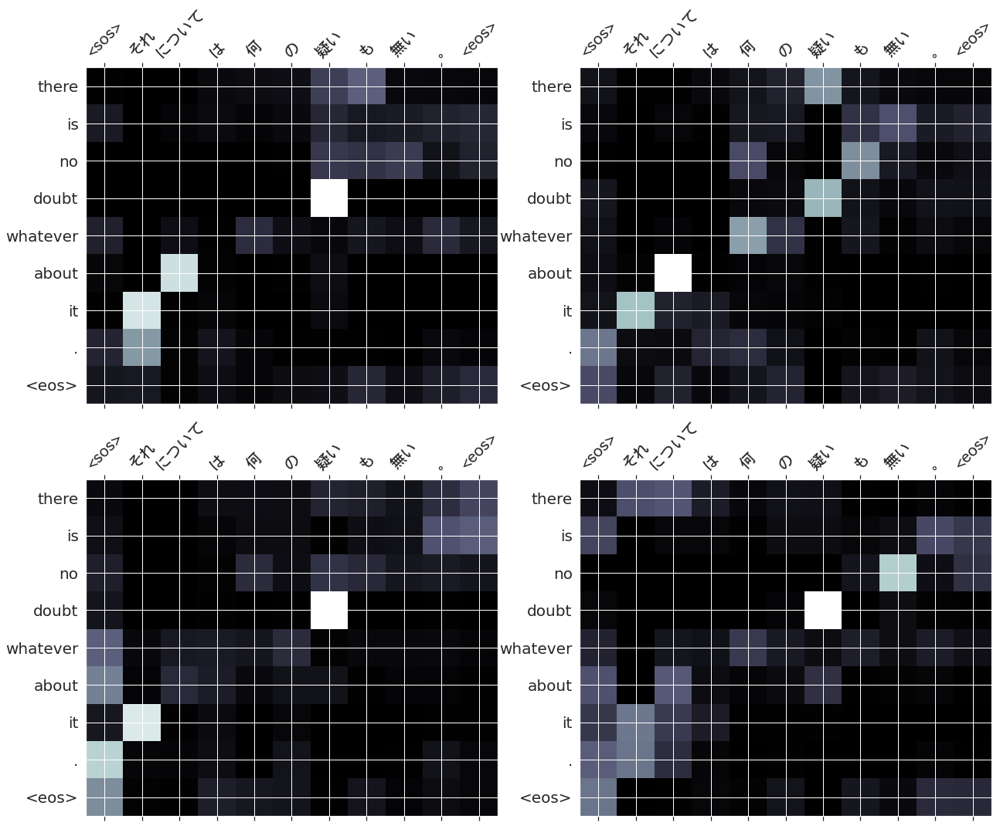

17
src      : 先週 は とても 忙しい た 。
trg      : i was very busy last week .
predicted: i was very busy last week . <eos>
     blue: 100.00%


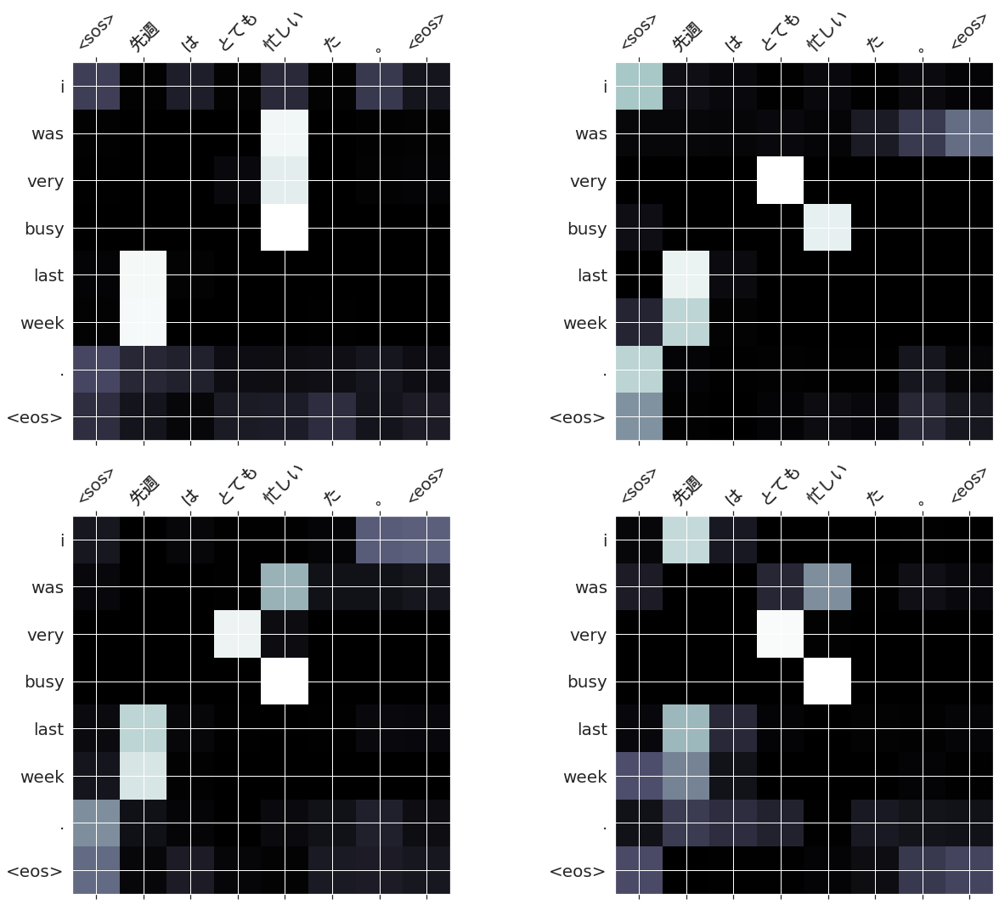

18
src      : その 弁護士 の 謝礼 は とても 高い た 。
trg      : the lawyer 's fee was very high .
predicted: the lawyer 's fee was very high . <eos>
     blue: 100.00%


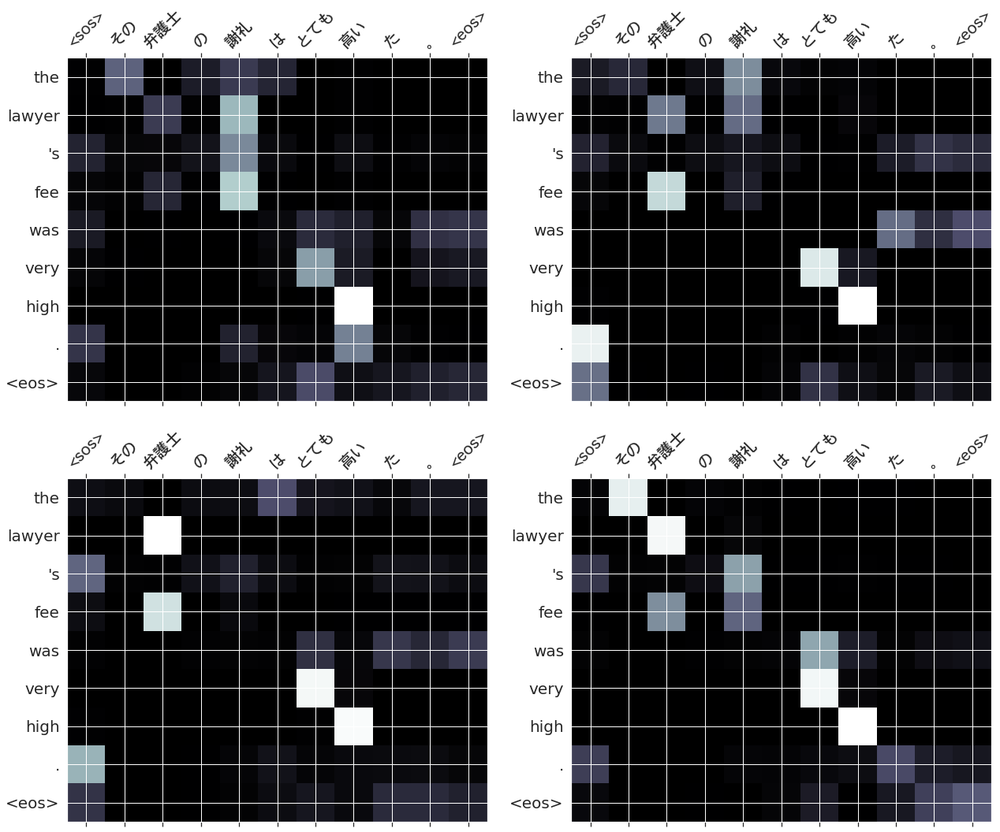

19
src      : 彼女 は 私 に 微笑む かける た 。
trg      : she smiled at me .
predicted: she smiled at me . <eos>
     blue: 100.00%


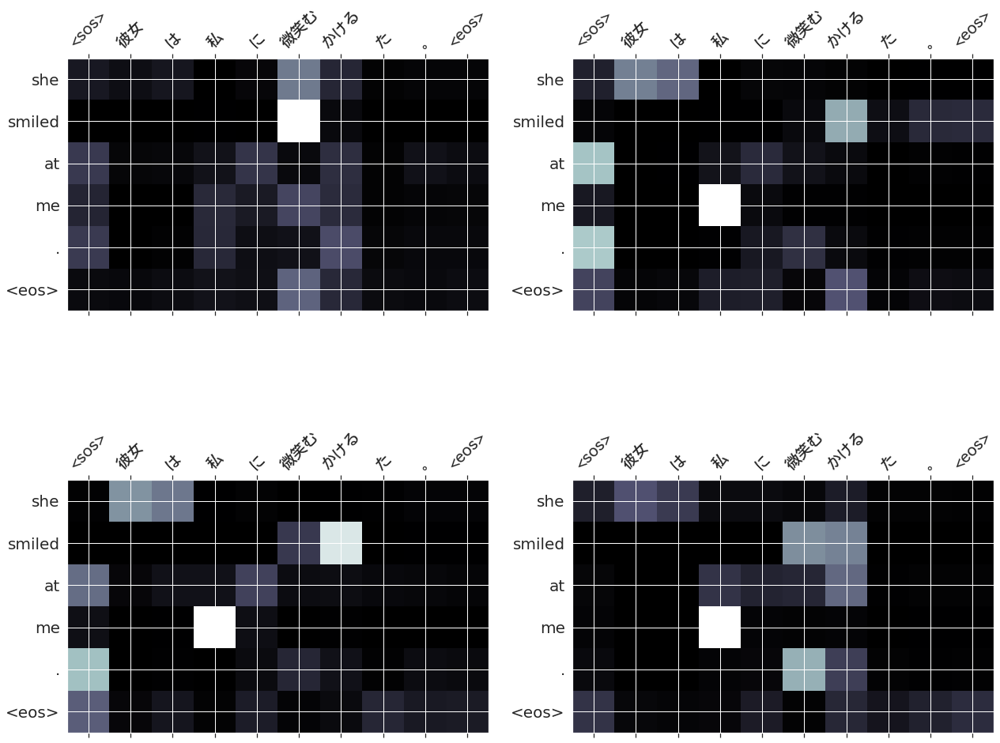

20
src      : 私 は 彼 が 出る て 行く の を 見る た 。
trg      : i saw him go out .
predicted: i saw him go out . <eos>
     blue: 100.00%


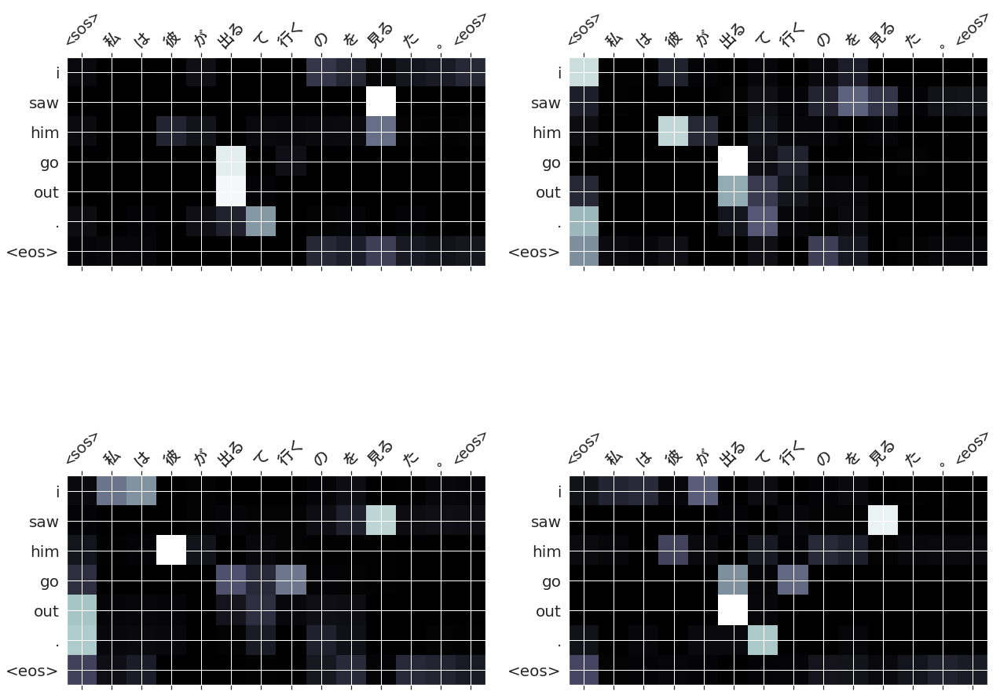

21
src      : 私 は この 荷物 を すぐ に 部屋 へ 持つ て いく て もらう たい 。
trg      : i want this luggage taken to my room at once .
predicted: i want this luggage taken to my room at once . <eos>
     blue: 100.00%


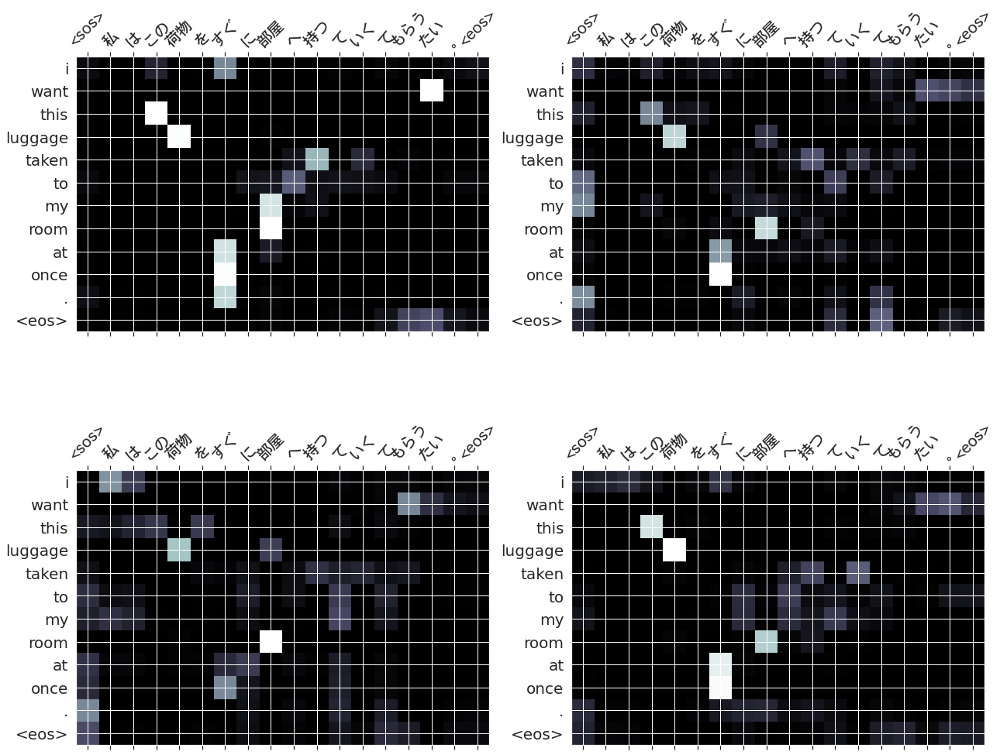

22
src      : 彼女 は 怒る た 。
trg      : she got angry .
predicted: she got angry . <eos>
     blue: 100.00%


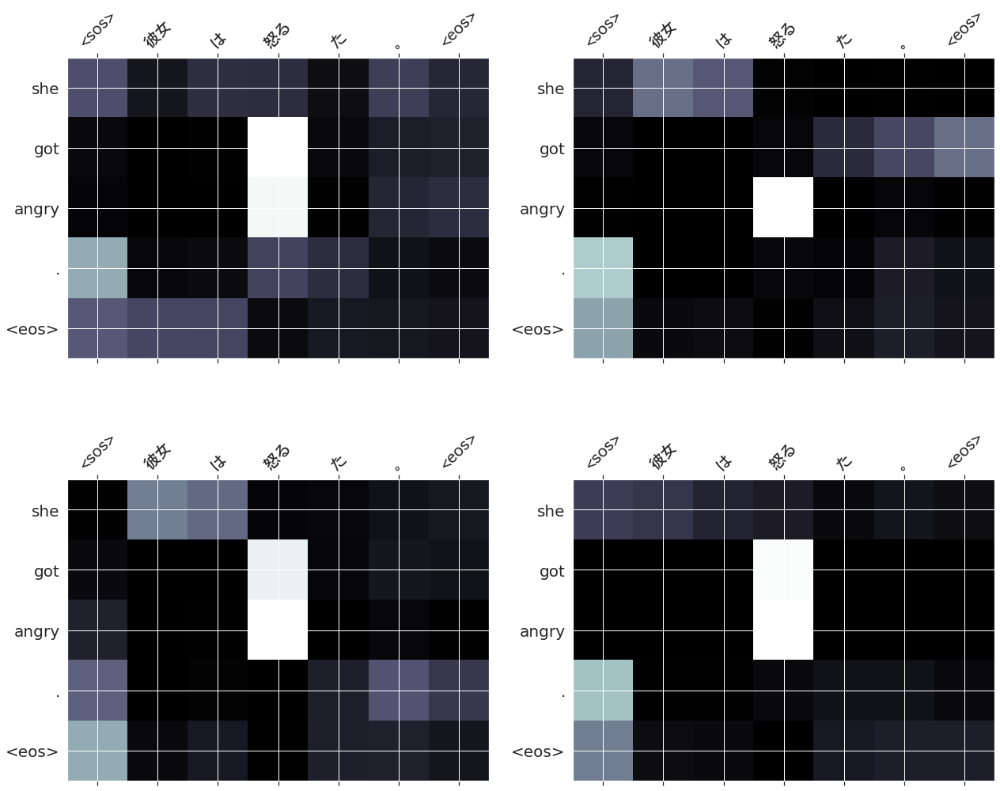

23
src      : 彼 は 外国 へ 行く う と 決心 する た 。
trg      : he decided to go abroad .
predicted: he decided to go abroad . <eos>
     blue: 100.00%


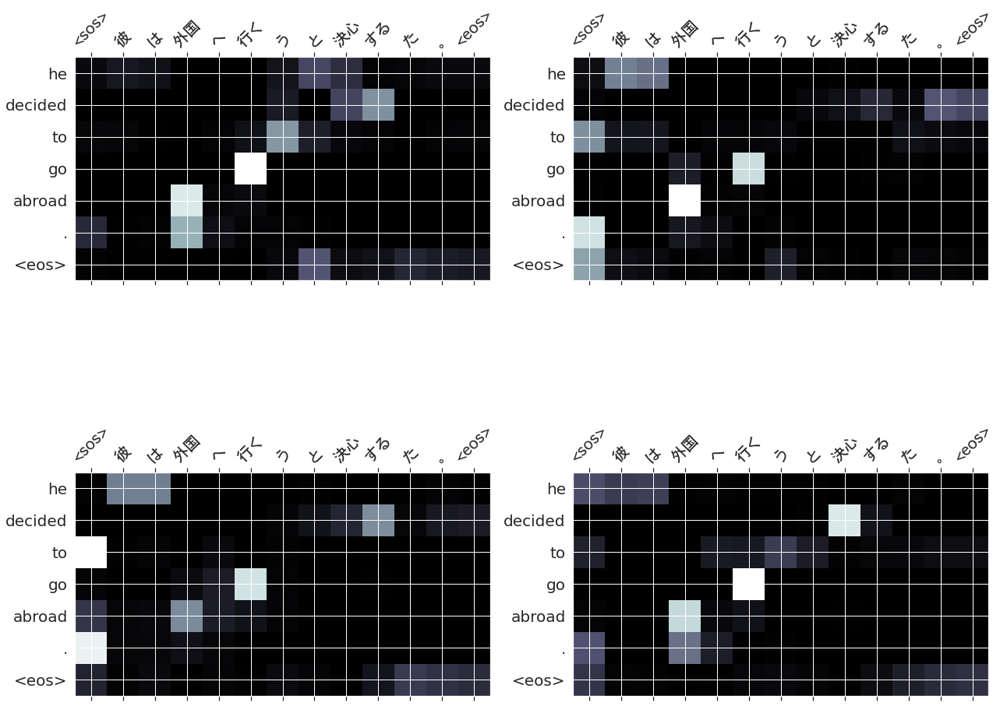

24
src      : 彼ら は となり に 住む で いる 。
trg      : they live next door .
predicted: they live next door . <eos>
     blue: 100.00%


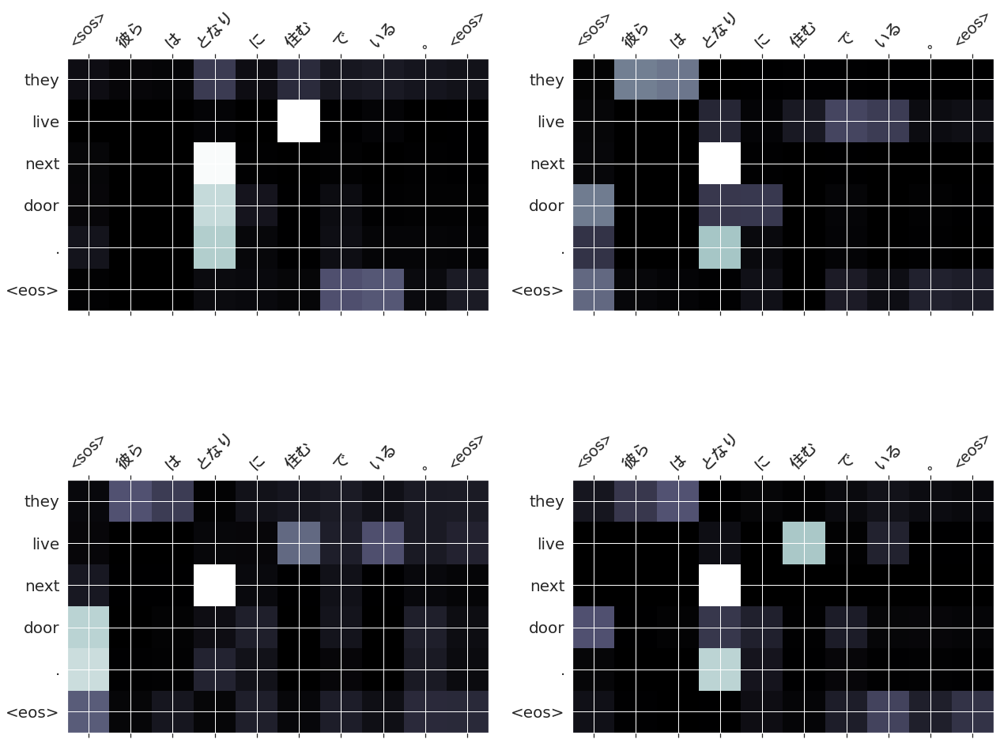

25
src      : 子供 達 は 凧 上げ を する て いる た 。
trg      : the children were flying kites .
predicted: the children were flying kites . <eos>
     blue: 100.00%


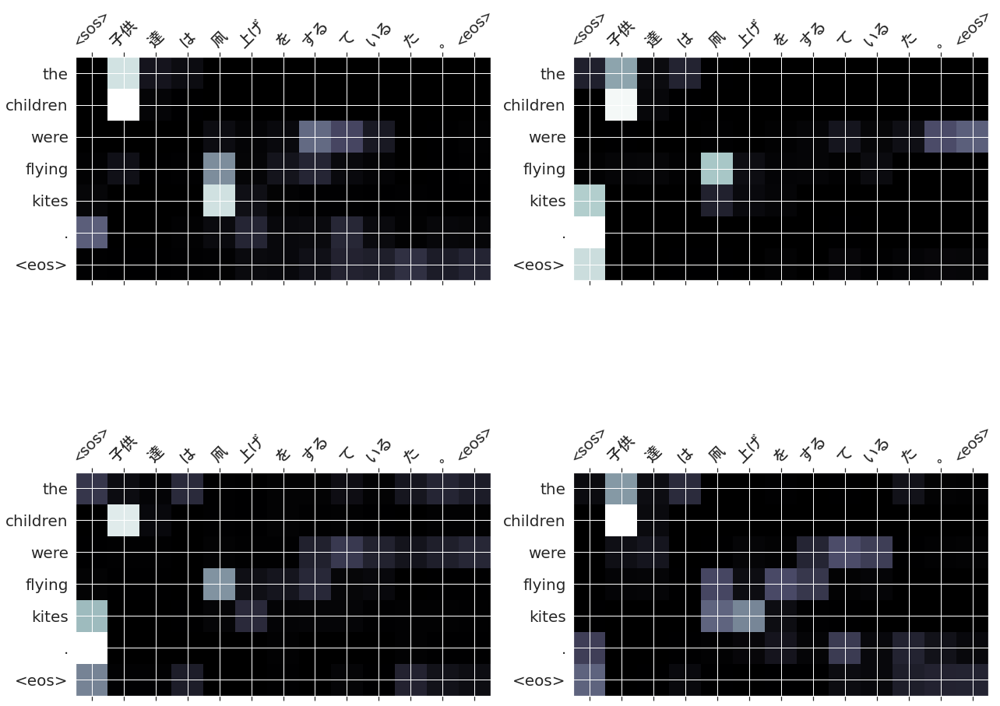

26
src      : 彼 は たばこ を 吸う ない と 約束 する た 。
trg      : he promised not to smoke .
predicted: he promised not to smoke . <eos>
     blue: 100.00%


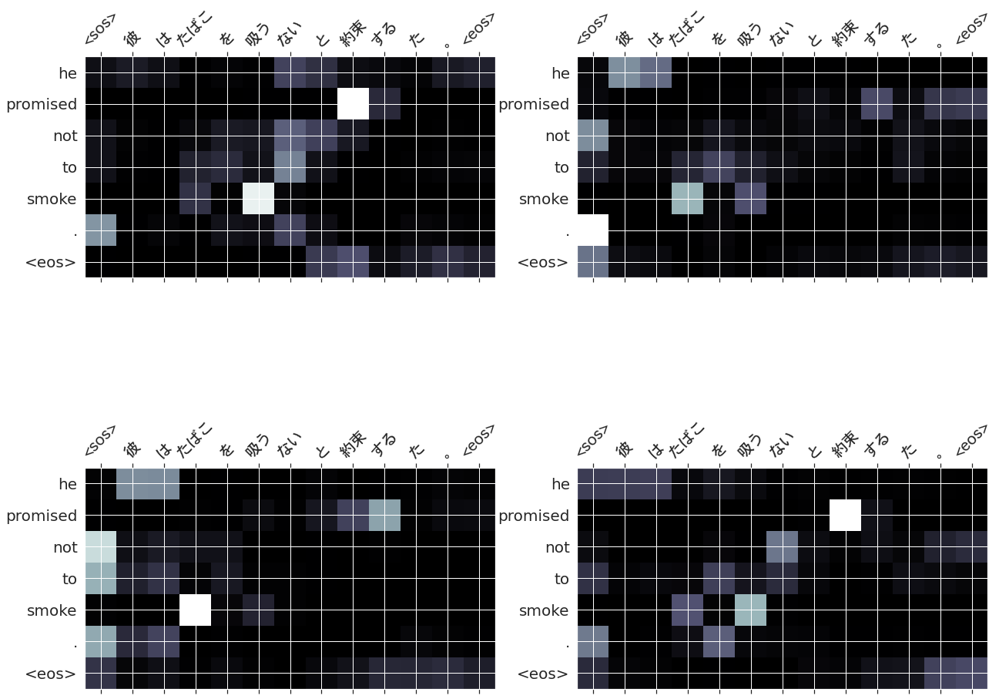

27
src      : 君 か 彼 の どちら か が まちがう て いる 。
trg      : either you or he is wrong .
predicted: either you or he is wrong . <eos>
     blue: 100.00%


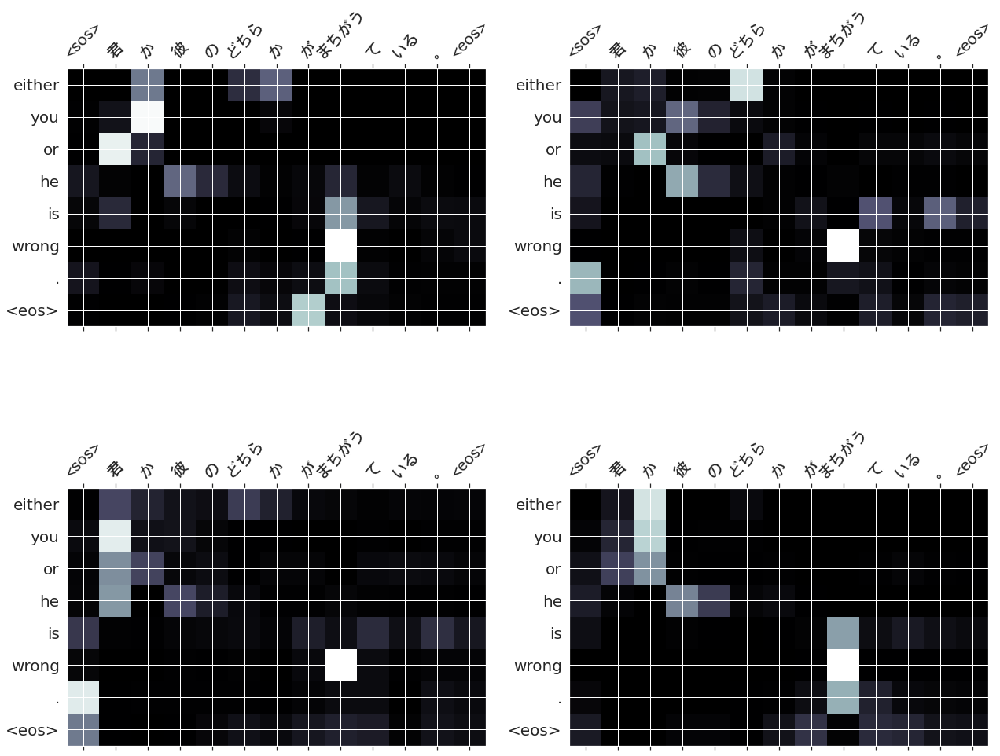

28
src      : 彼 は 科学 者 として 有名 だ 。
trg      : he is famous as a scientist .
predicted: he is famous as a scientist . <eos>
     blue: 100.00%


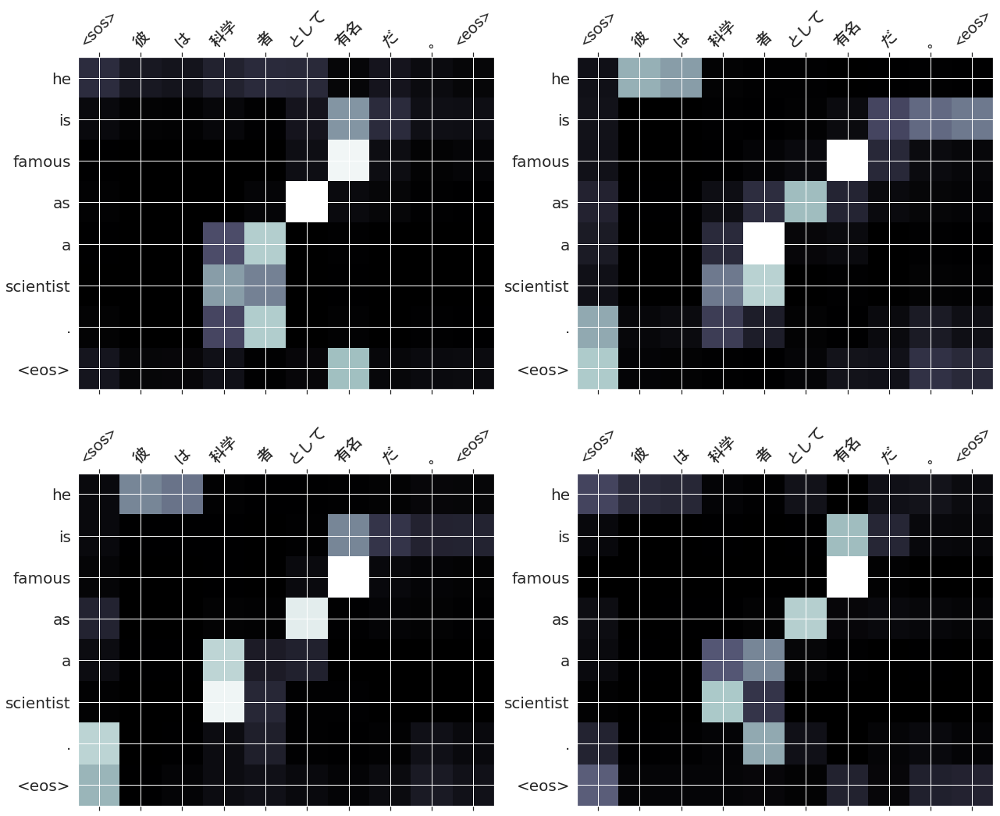

29
src      : 彼 は 夜空 を 見上げる た 。
trg      : he looked up at the night sky .
predicted: he looked up at the night sky . <eos>
     blue: 100.00%


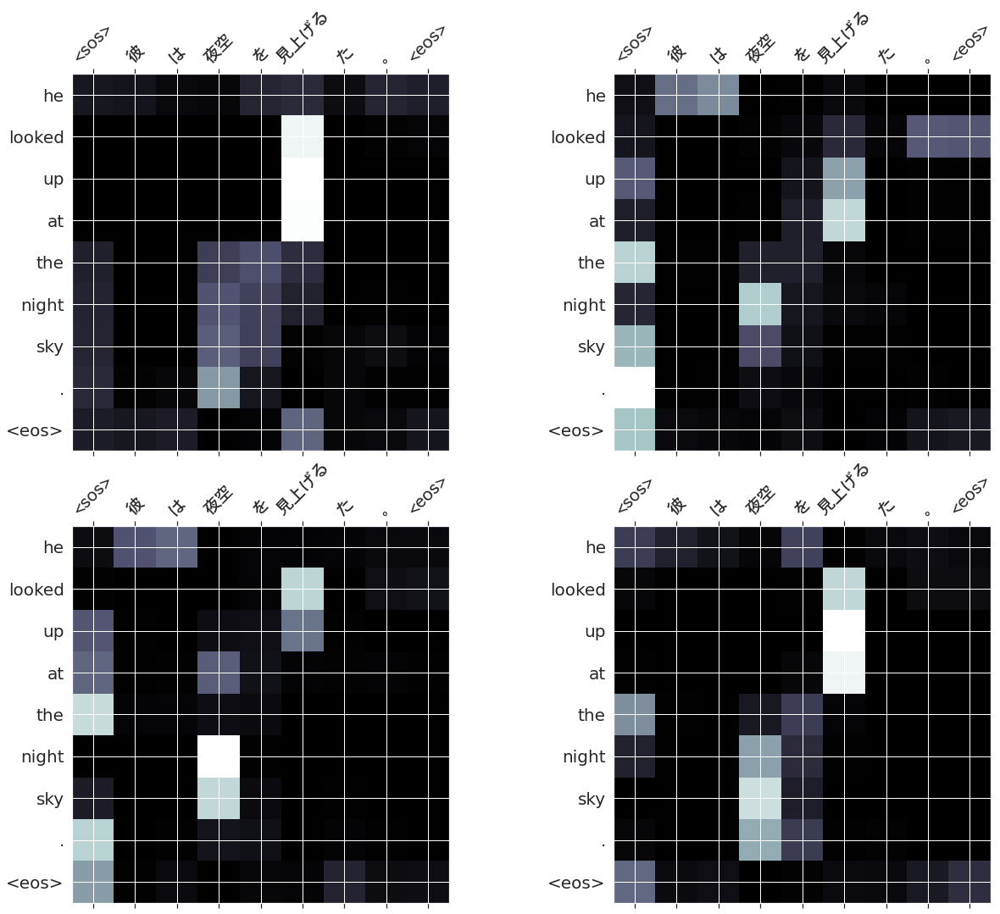

30
src      : もしか する た 彼 は 気 が 変わる かも しれる ない 。
trg      : he might change his mind .
predicted: he might change his mind . <eos>
     blue: 100.00%


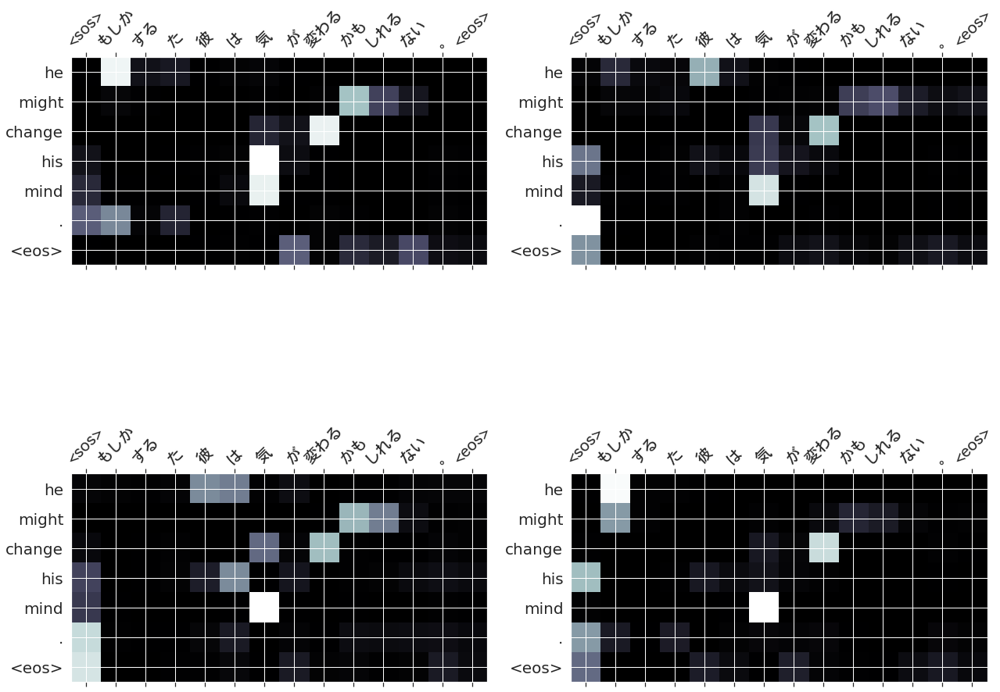

31
src      : 私 の 考え で は 、 彼 は 間違う て いる 。
trg      : in my opinion , he is wrong .
predicted: in my opinion , he is wrong . <eos>
     blue: 100.00%


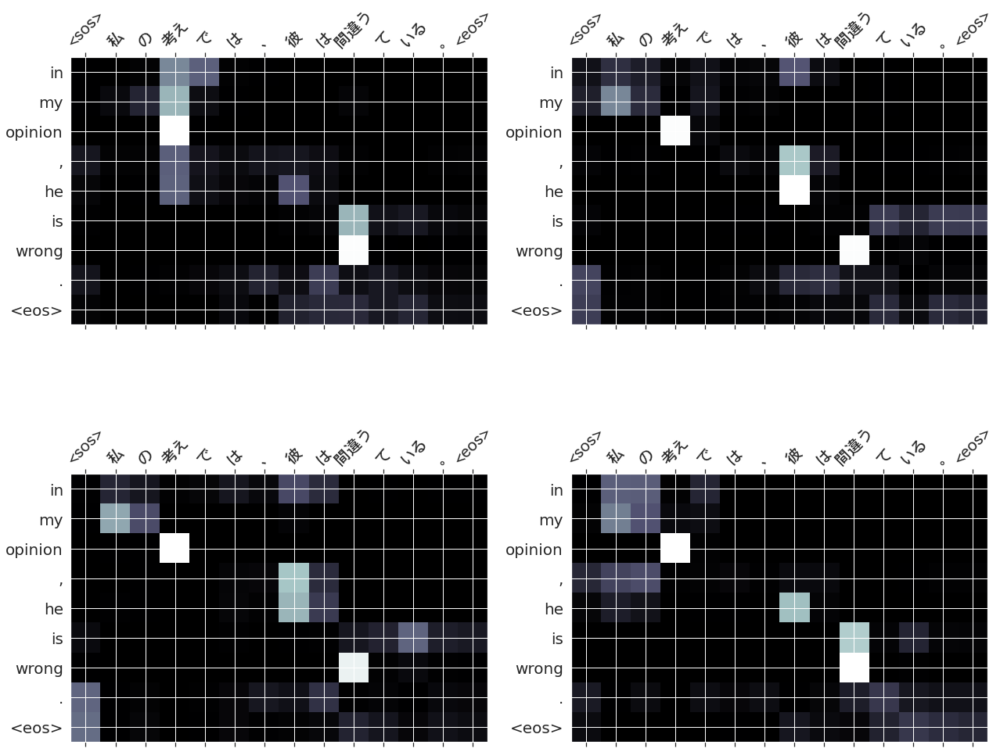

32
src      : 彼女 は 料理 が 下手 だ 。
trg      : she is a poor cook .
predicted: she is a poor cook . <eos>
     blue: 100.00%


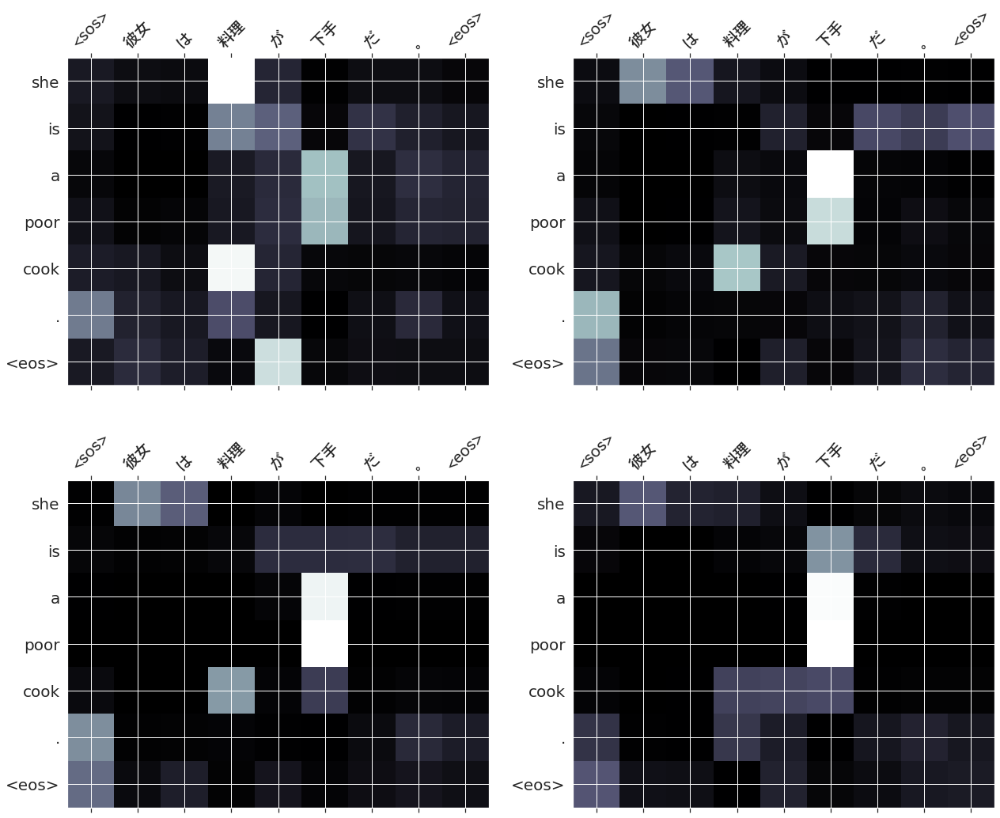

33
src      : ロケット は 上がる て いく た 。
trg      : the rocket went up .
predicted: the rocket went up . <eos>
     blue: 100.00%


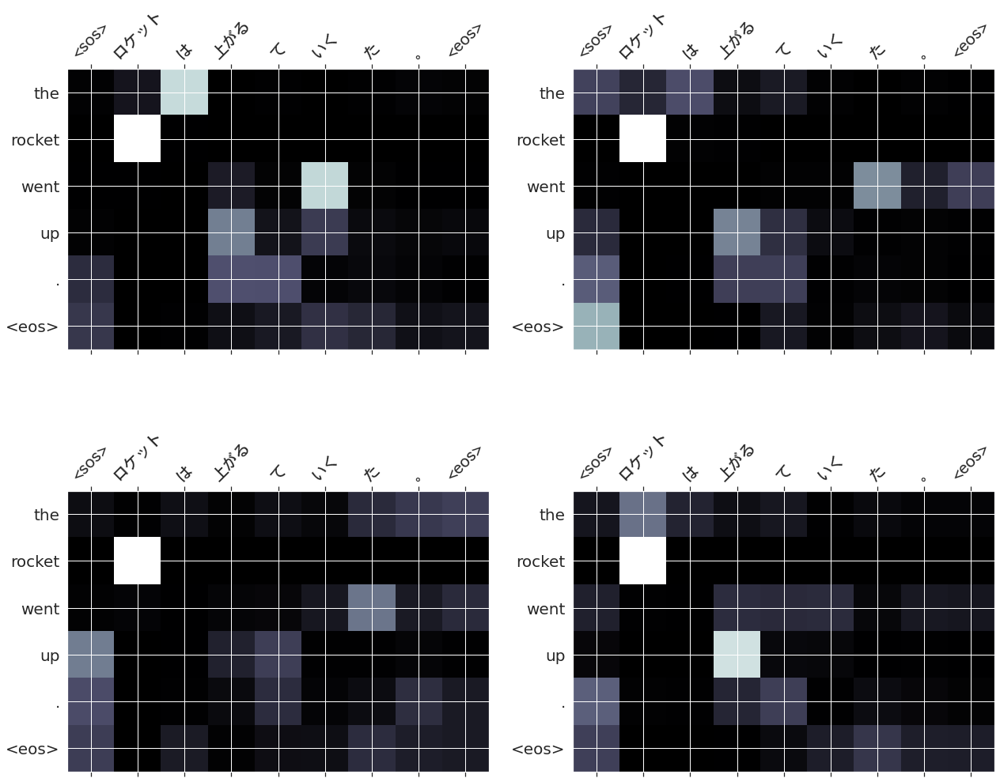

34
src      : そんな こと 言う べし だ は ない 。
trg      : you ought not to say such a thing .
predicted: you ought not to say such a thing . <eos>
     blue: 100.00%


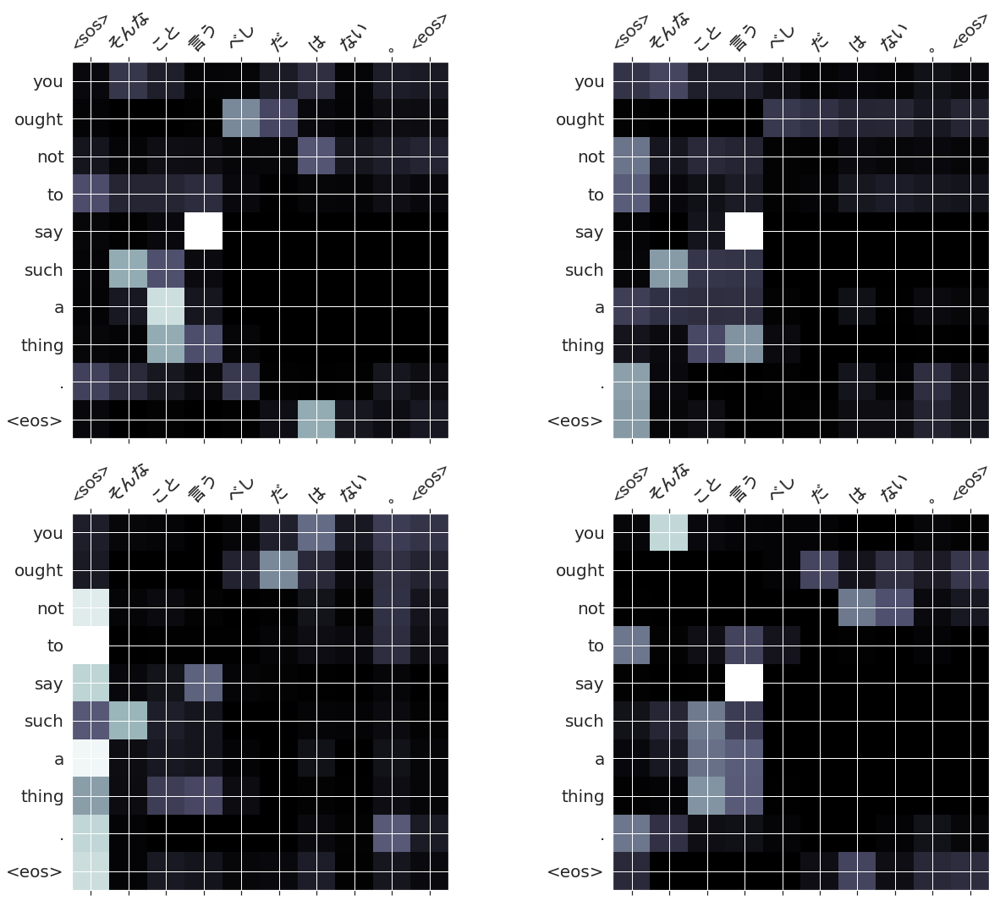

35
src      : 彼 は 自分 が 忙しい という こと を 私 に 言う た 。
trg      : he told me that he was busy .
predicted: he told me that he was busy . <eos>
     blue: 100.00%


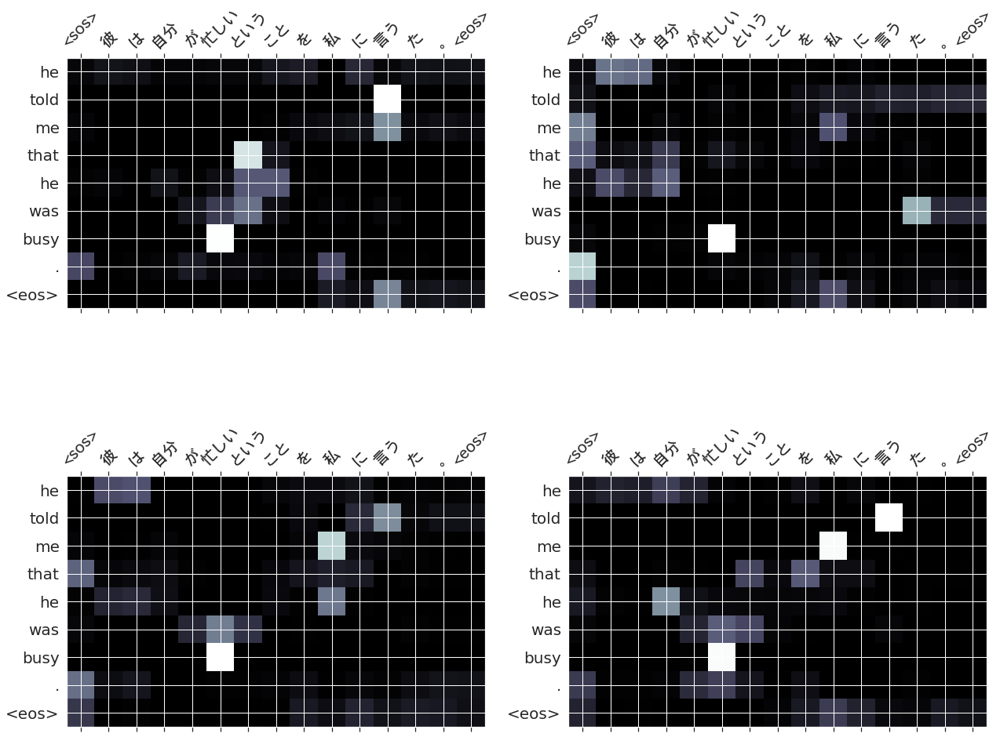

36
src      : 今日 の 午後 に は 晴れる です う 。
trg      : it will be fine this afternoon .
predicted: it will be fine this afternoon . <eos>
     blue: 100.00%


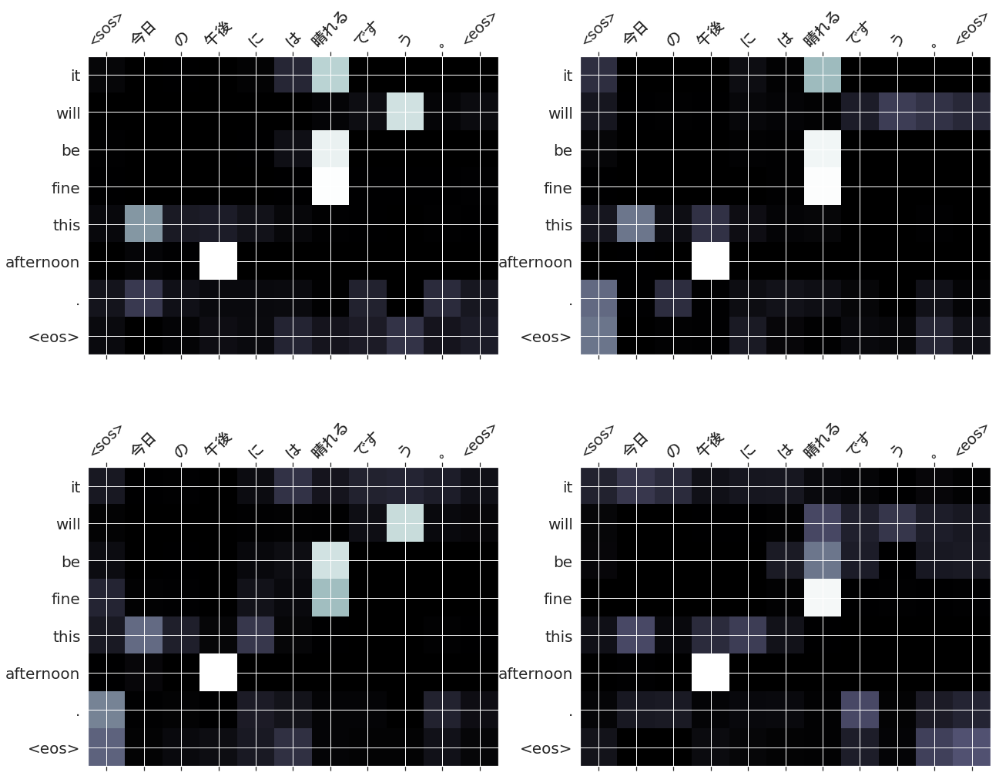

37
src      : 彼 は 映画 に 行く こと は まず 無い 。
trg      : he seldom , if ever , goes to the movies .
predicted: he seldom , if ever , goes to the movies . <eos>
     blue: 100.00%


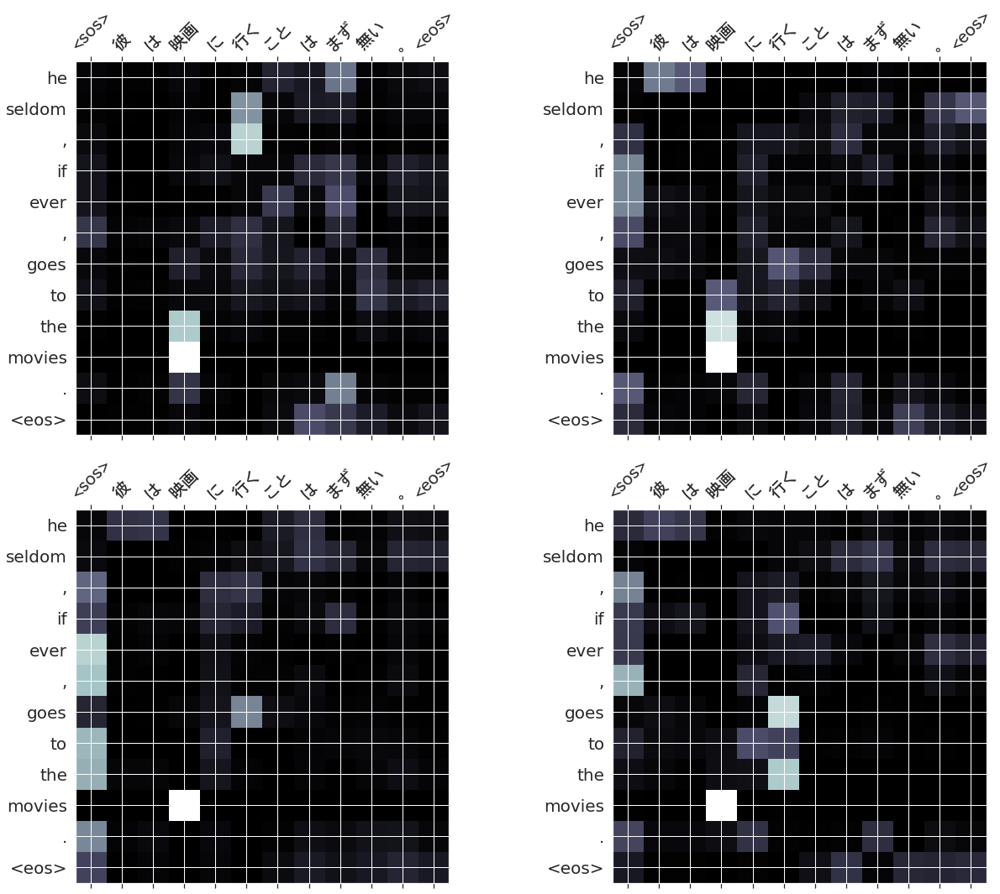

38
src      : 彼 は うまい いく よう に 強い 願う て いる 。
trg      : he is eager to succeed .
predicted: he is eager to succeed . <eos>
     blue: 100.00%


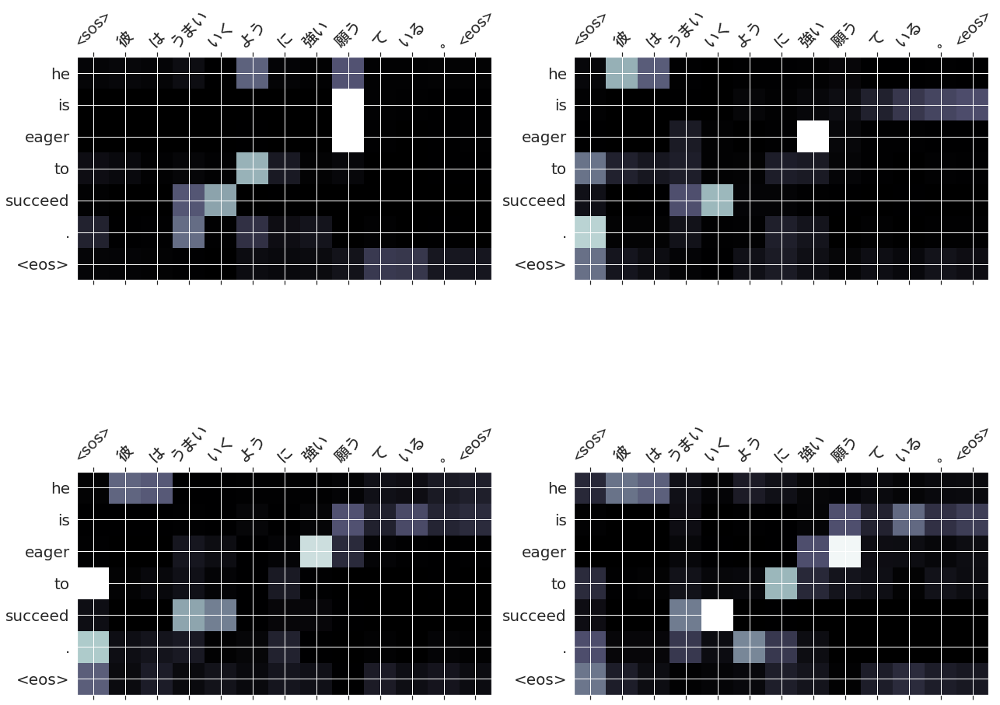

39
src      : 私 は 彼 に 私 が それら を 読める か どう か たずねる た 。
trg      : i asked him if i could read them .
predicted: i asked him if i could read them . <eos>
     blue: 100.00%


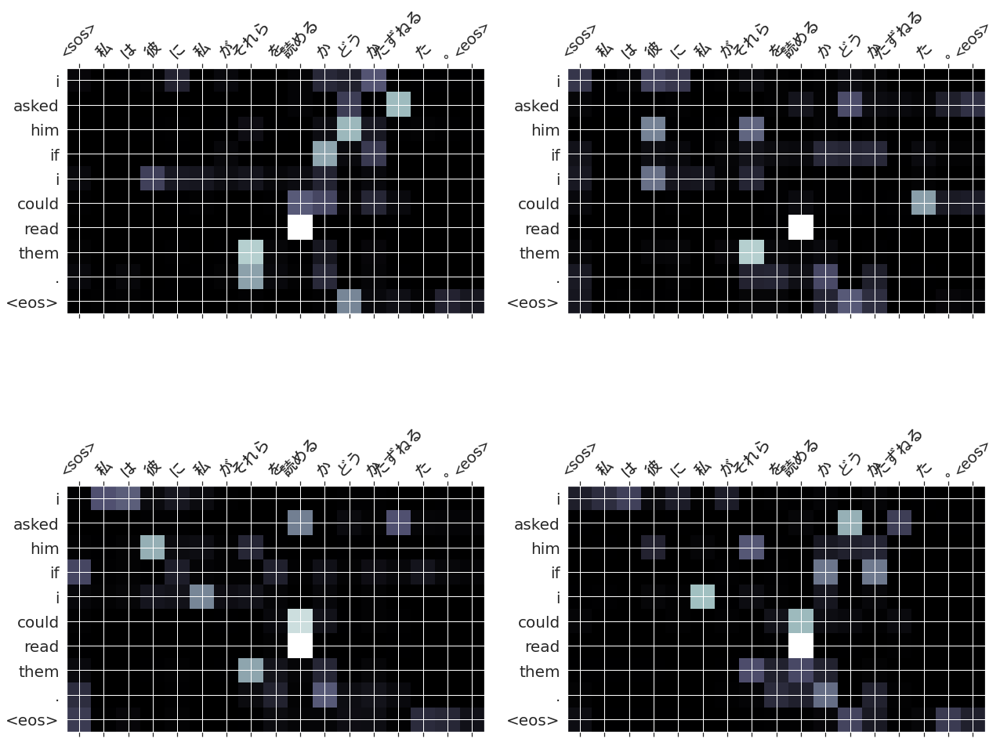

40
src      : 私 の 母 は 私 より 早い 起きる 。
trg      : my mother gets up earlier than i.
predicted: my mother gets up earlier than i. <eos>
     blue: 100.00%


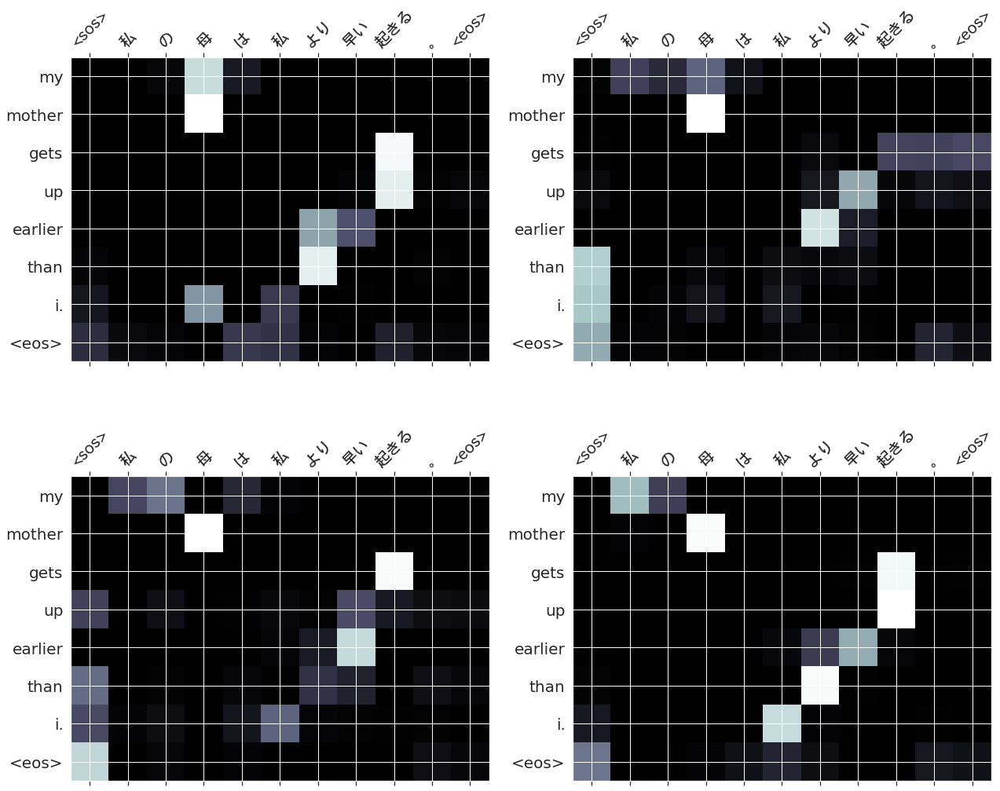

41
src      : 私 も 先生 です 。
trg      : i am a teacher , too .
predicted: i am a teacher , too . <eos>
     blue: 100.00%


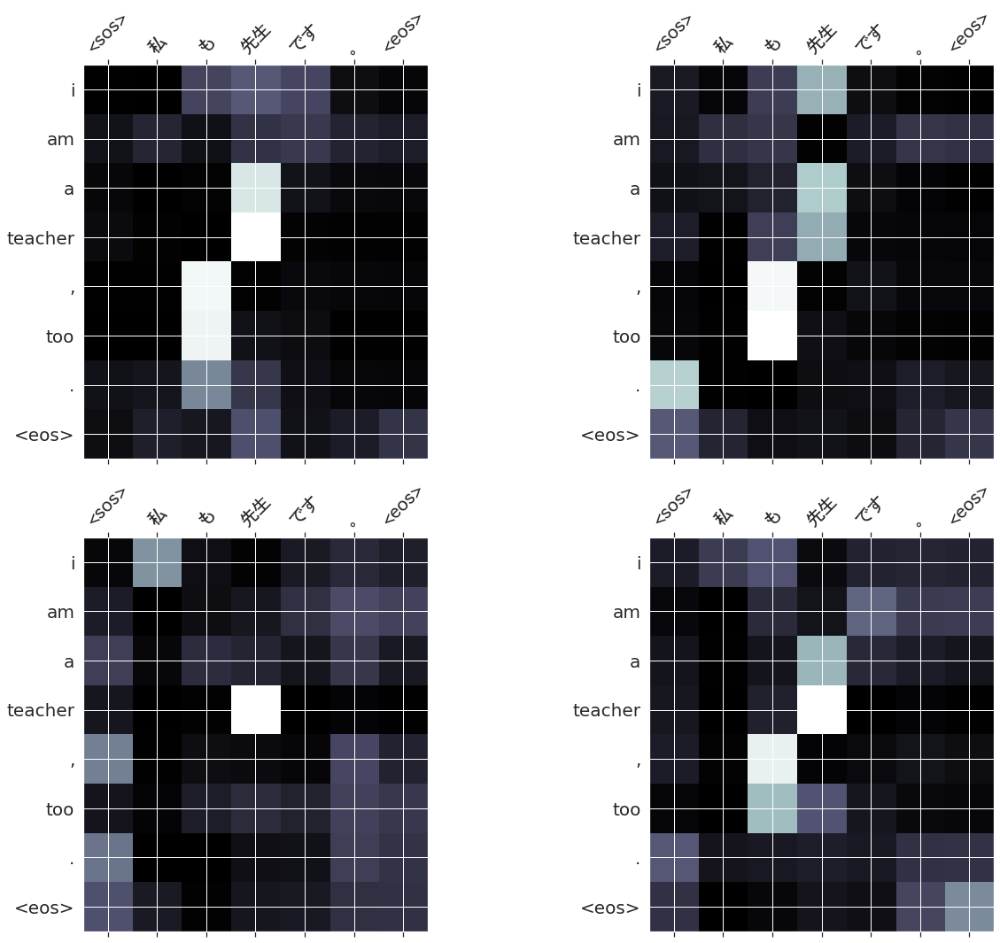

42
src      : 私 は 少し は お金 の 持ち合わせ が ある 。
trg      : i have a little money with me .
predicted: i have a little money with me . <eos>
     blue: 100.00%


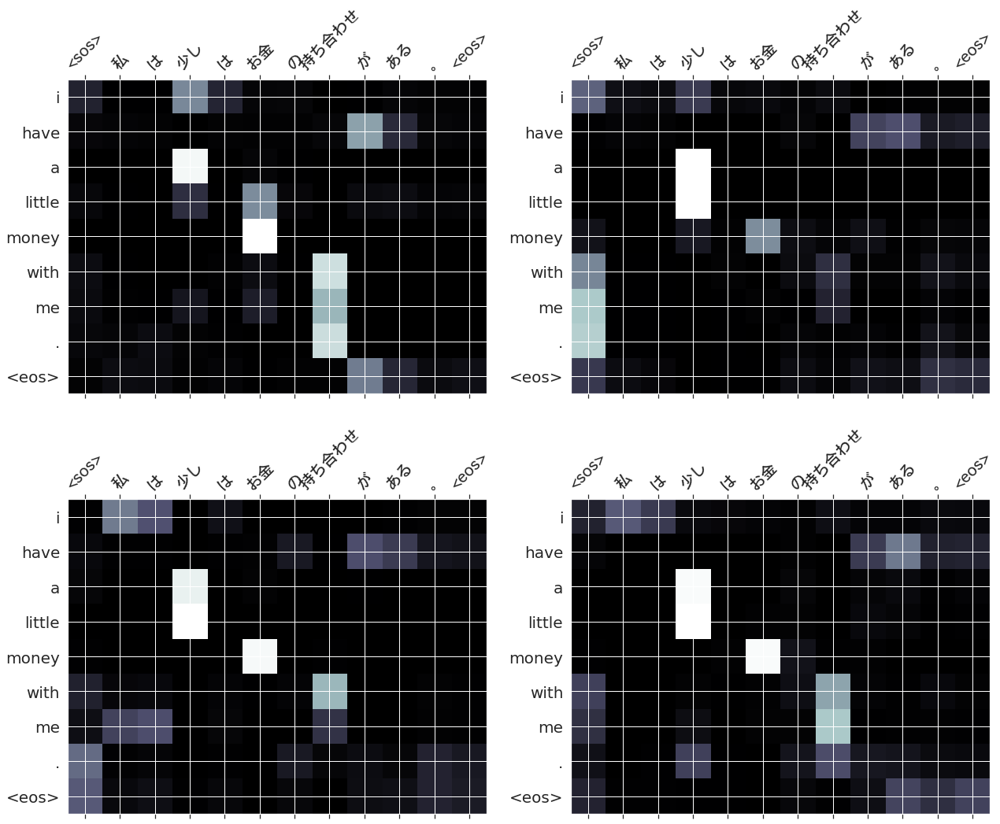

43
src      : 彼 は 駅 まで タクシー に 乗る た 。
trg      : he took a taxi to the station .
predicted: he took a taxi to the station . <eos>
     blue: 100.00%


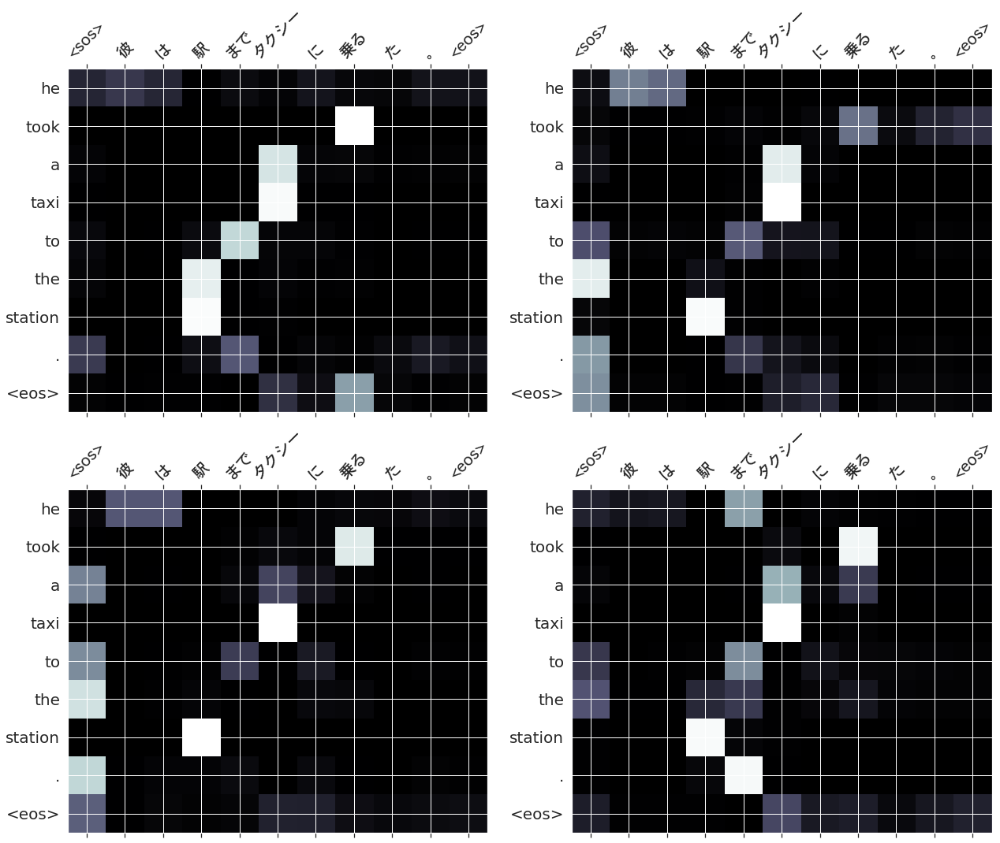

44
src      : トム は 私 より 背 が 高い 。
trg      : tom is taller than i.
predicted: tom is taller than i. <eos>
     blue: 100.00%


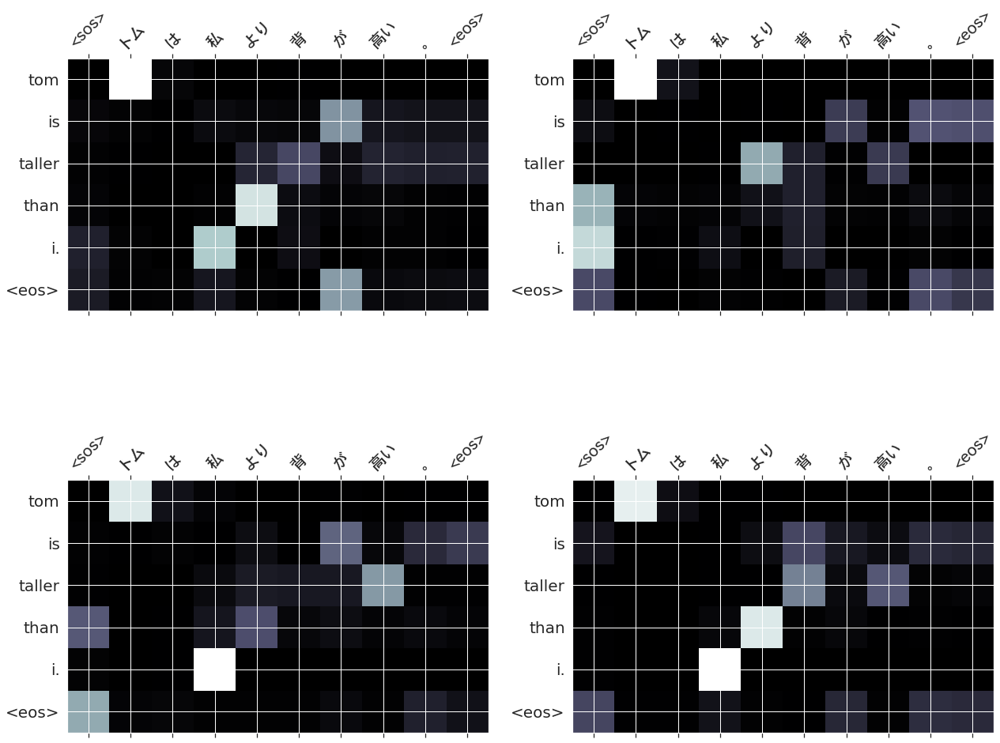

45
src      : 彼 は 兄さん と は 異なる 。
trg      : he differs from his brother .
predicted: he differs from his brother . <eos>
     blue: 100.00%


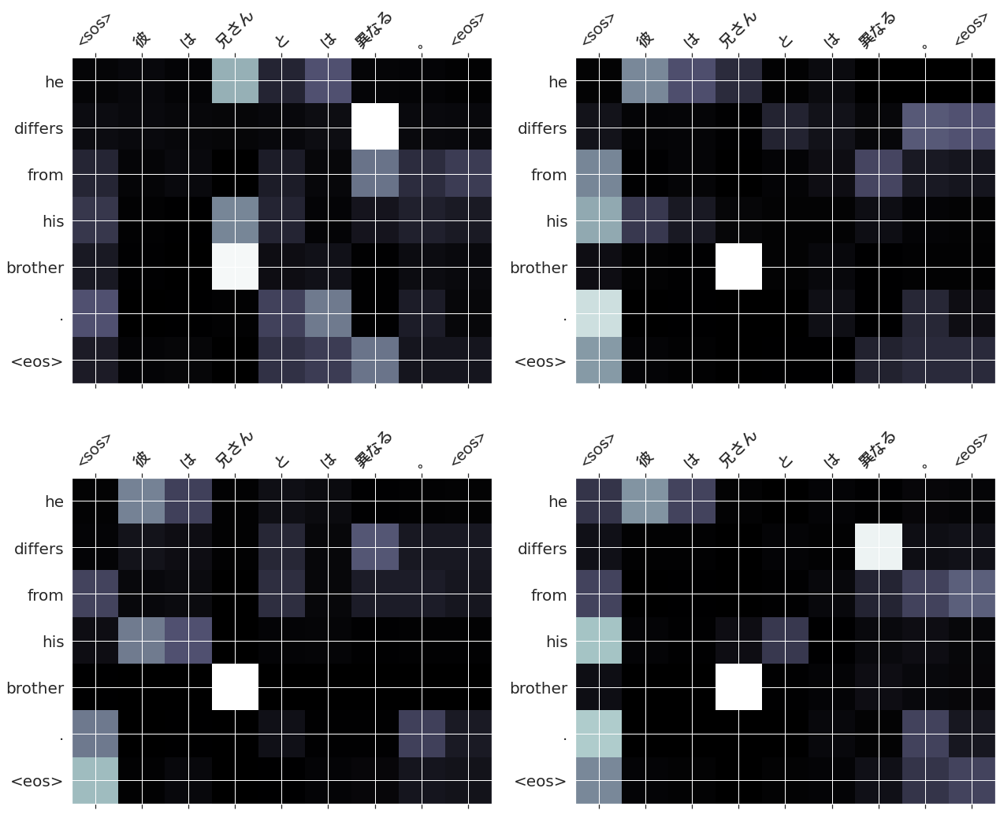

46
src      : ２つ の こと を 一 度 に する う として は いける ます ん 。
trg      : do n't try to do two things at a time .
predicted: do n't try to do two things at a time . <eos>
     blue: 100.00%


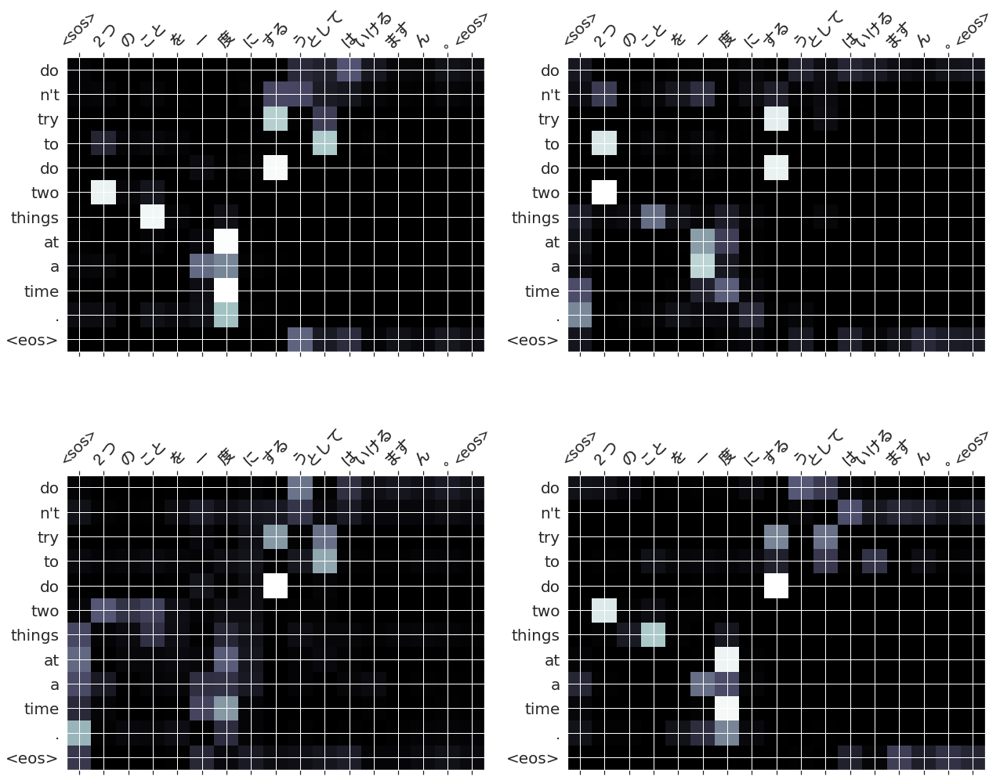

47
src      : ほら 、 ここ に 私 の 自転車 が ある ます 。
trg      : here is my bicycle .
predicted: here is my bicycle . <eos>
     blue: 100.00%


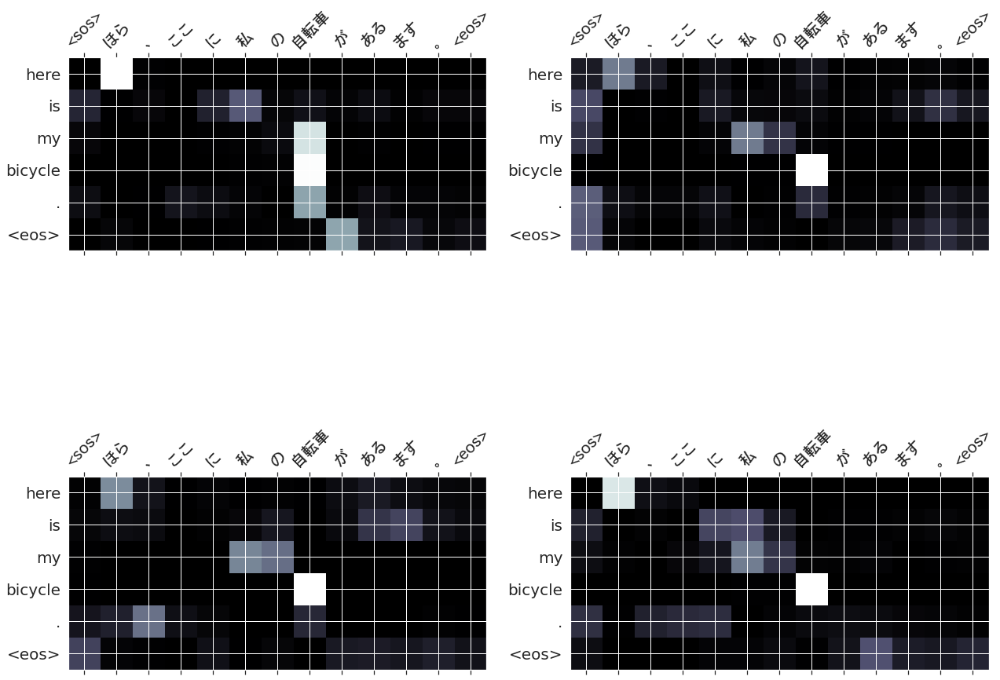

48
src      : あなた の 計画 に 賛成 です 。
trg      : i agree to your plan .
predicted: i agree to your plan . <eos>
     blue: 100.00%


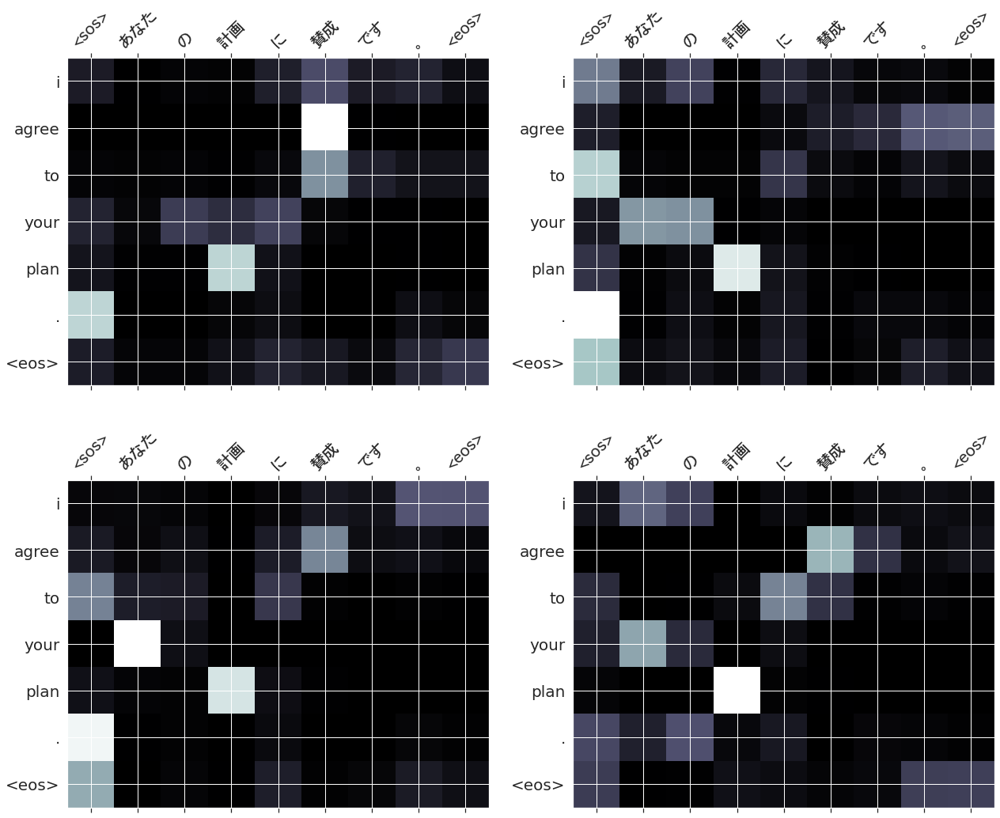

49
src      : この 鳥 は 飛ぶ こと が できる ない 。
trg      : this bird can not fly .
predicted: this bird can not fly . <eos>
     blue: 100.00%


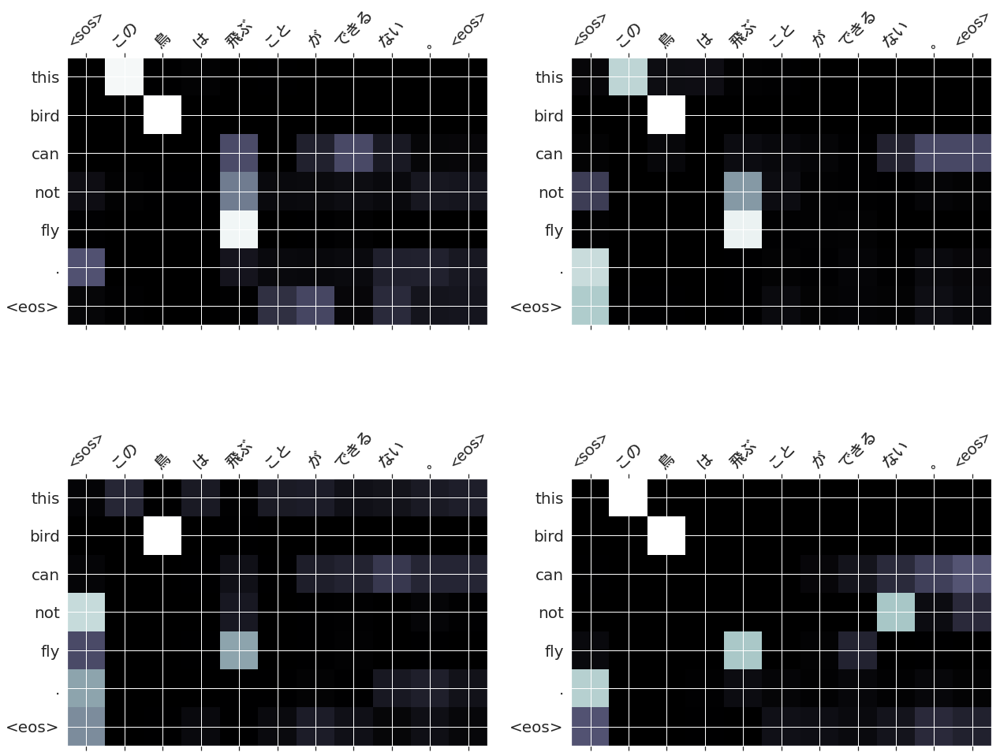

50
src      : 彼女 は 靴下 を 二 足 買う た 。
trg      : she bought two pairs of socks .
predicted: she bought two pairs of socks . <eos>
     blue: 100.00%


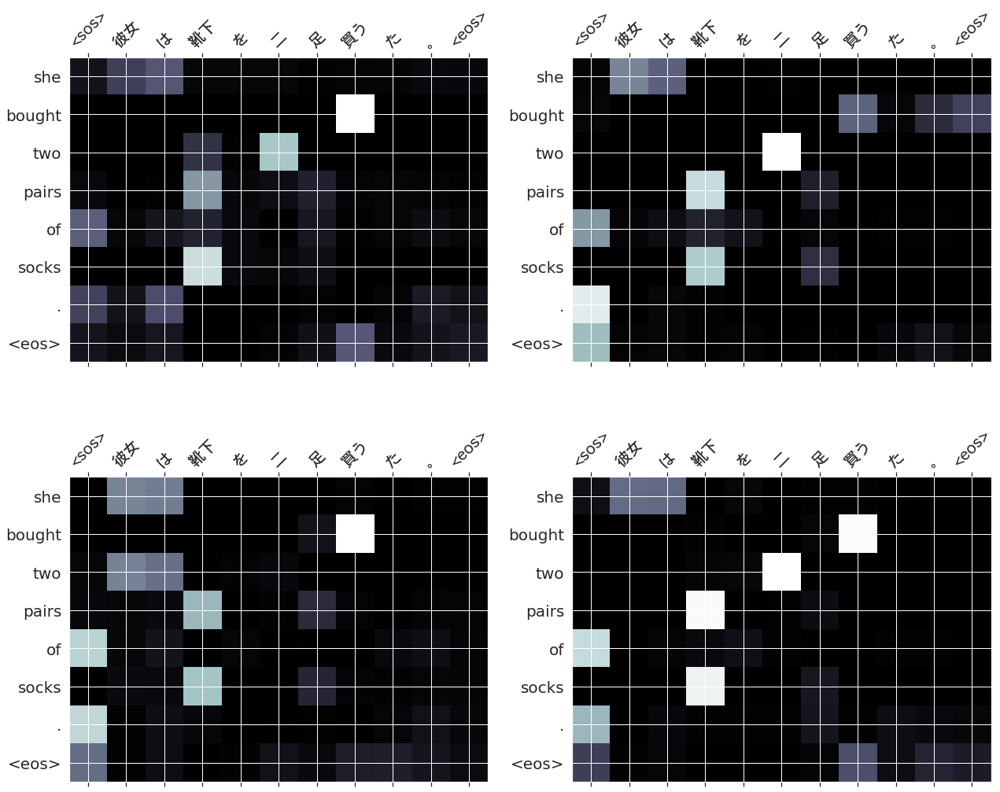

51
src      : 君 は 傘 を 持つ て いく た ほう が 良い 。
trg      : you had better take an umbrella with you .
predicted: you had better take an umbrella with you . <eos>
     blue: 100.00%


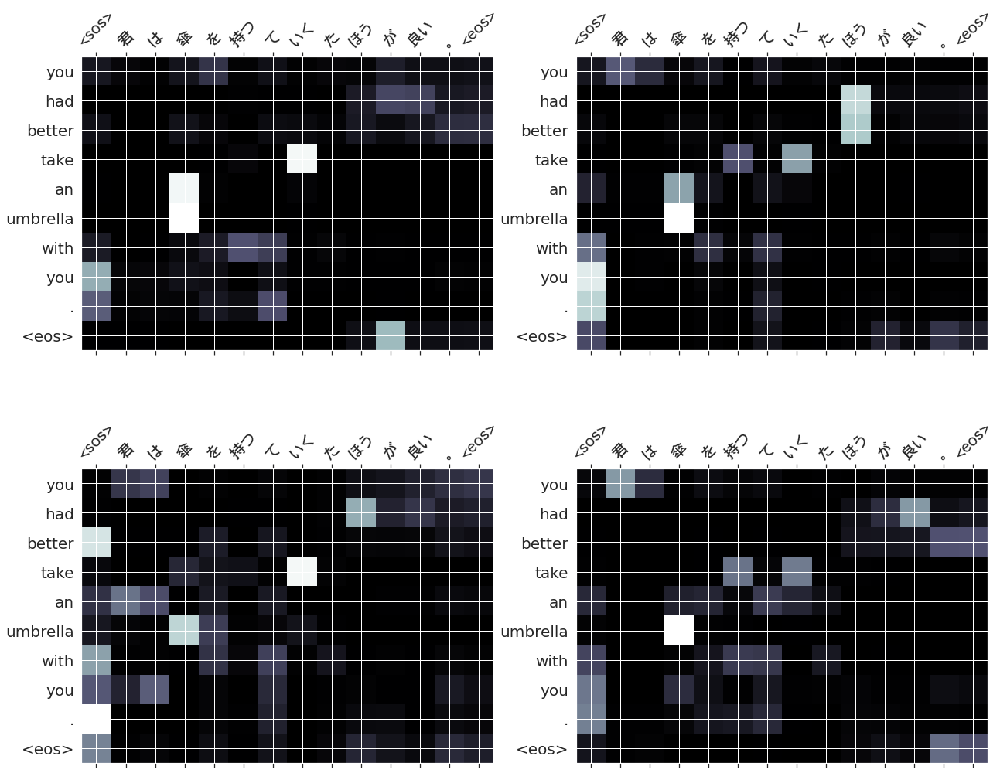

52
src      : この ケーキ は とても 甘い 。
trg      : this cake is very sweet .
predicted: this cake is very sweet . <eos>
     blue: 100.00%


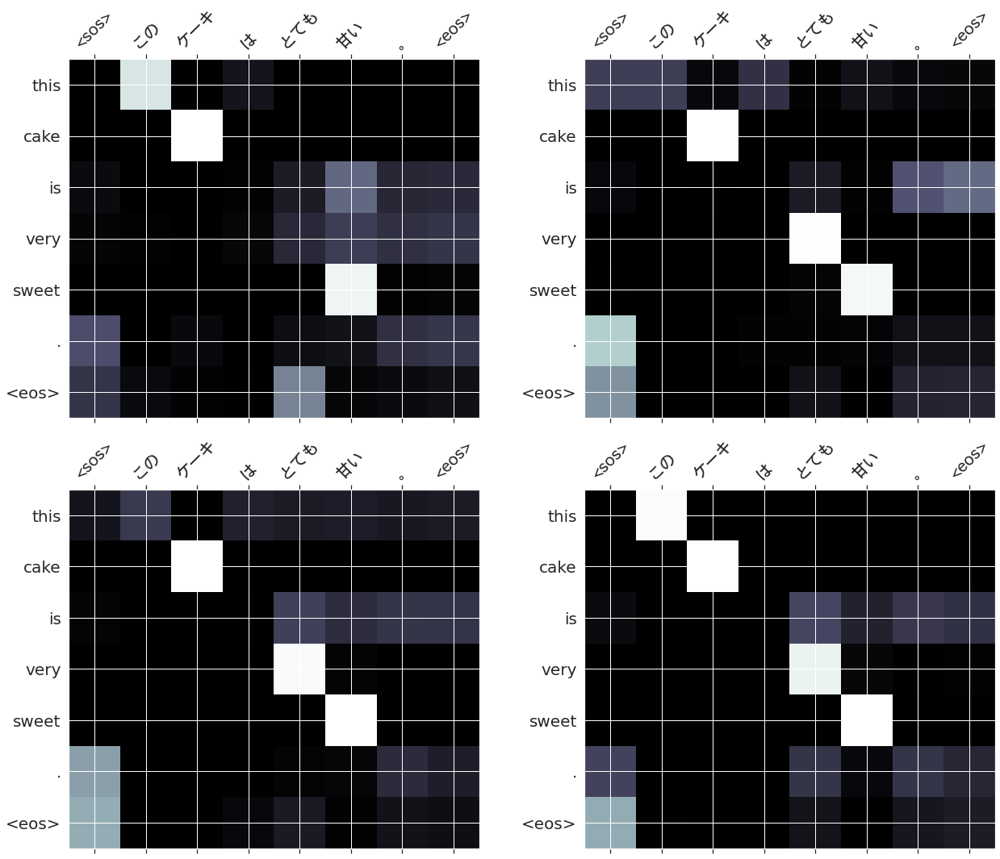

53
src      : アン は 彼ら の 指導 者 だ ある と 言う れる て いる 。
trg      : ann is said to be their leader .
predicted: ann is said to be their leader . <eos>
     blue: 100.00%


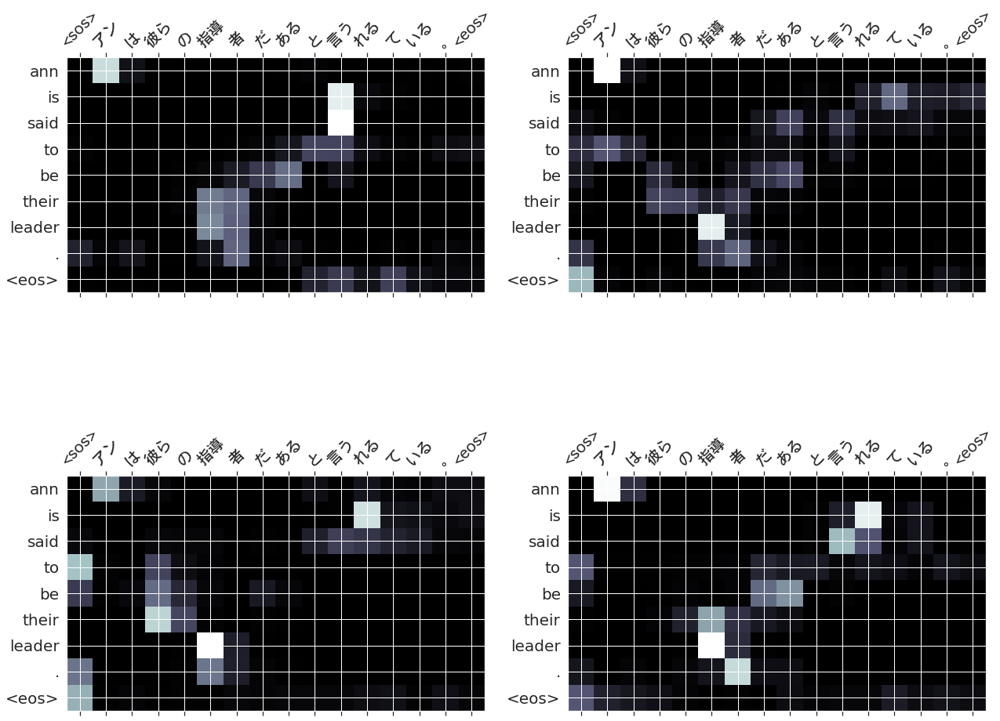

54
src      : 彼 は この 仕事 を 独力 で 完成 する た 。
trg      : he finished this work for himself .
predicted: he finished this work for himself . <eos>
     blue: 100.00%


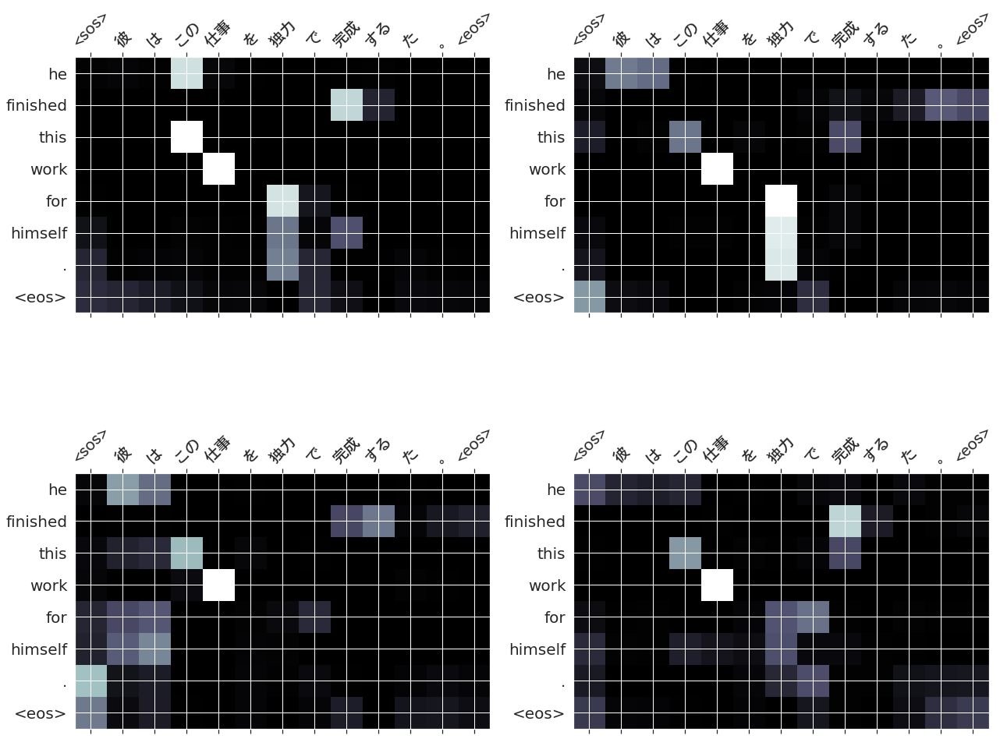

55
src      : 最善 を 尽くす だ 、 成功 する です う 。
trg      : if you do your best , you will succeed .
predicted: if you do your best , you will succeed . <eos>
     blue: 100.00%


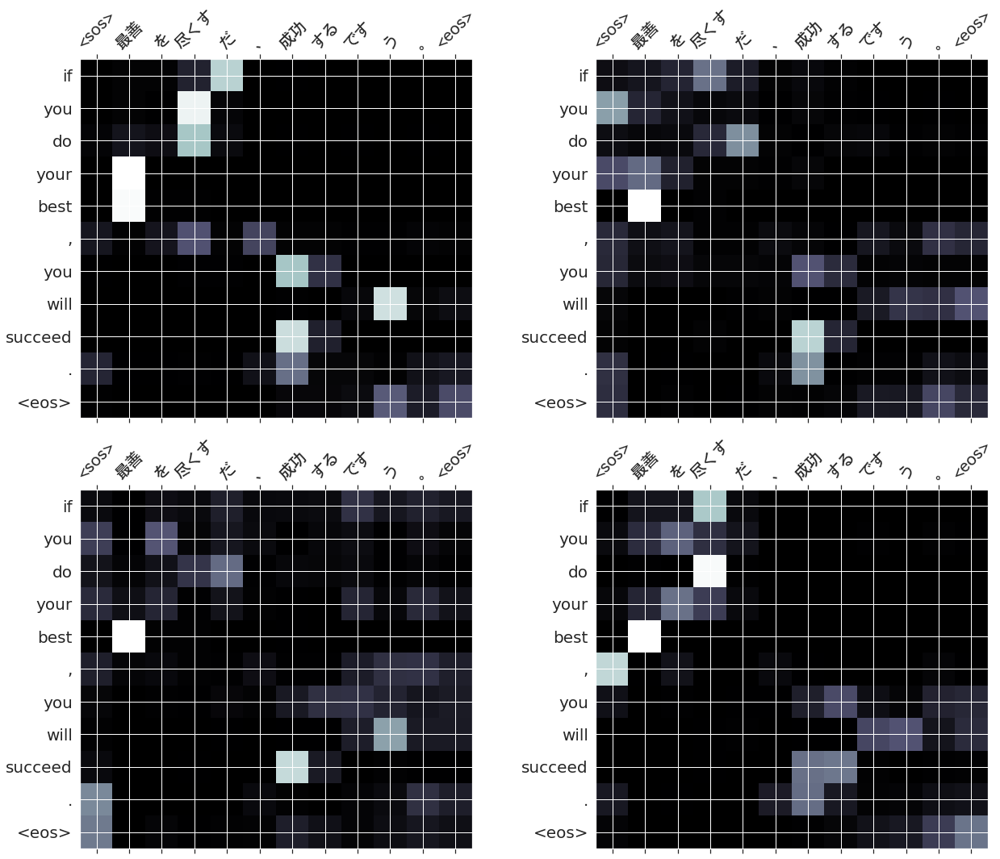

56
src      : その 事故 の ため に 彼 は 視力 を 失う た 。
trg      : the accident deprived him of his sight .
predicted: the accident deprived him of his sight . <eos>
     blue: 100.00%


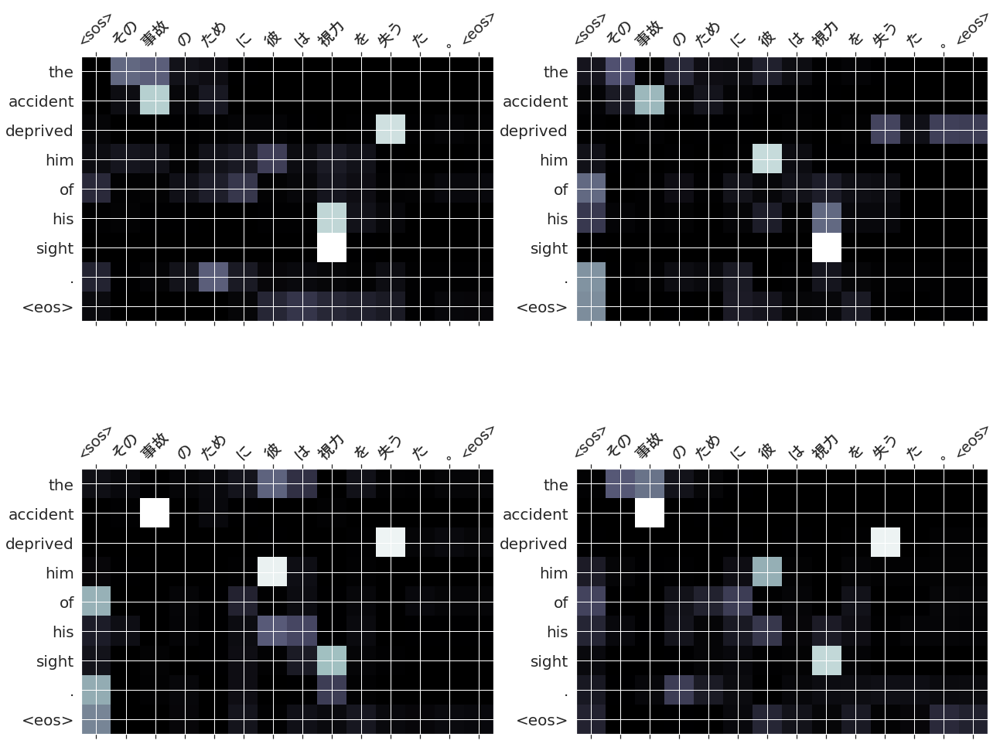

57
src      : 誰 が お母さん の 手伝い を する の です か 。
trg      : who helps your mother ?
predicted: who helps your mother ? <eos>
     blue: 100.00%


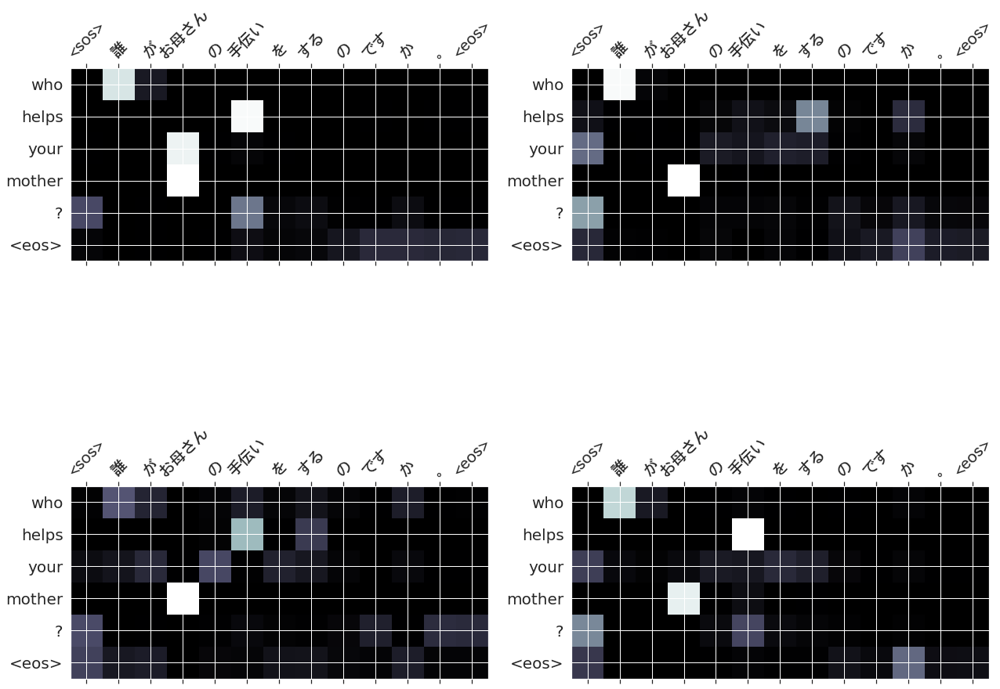

58
src      : 彼 が ジーンズ を 履く て いる の を 見る た 事 が 無い 。
trg      : i never saw him in jeans .
predicted: i never saw him in jeans . <eos>
     blue: 100.00%


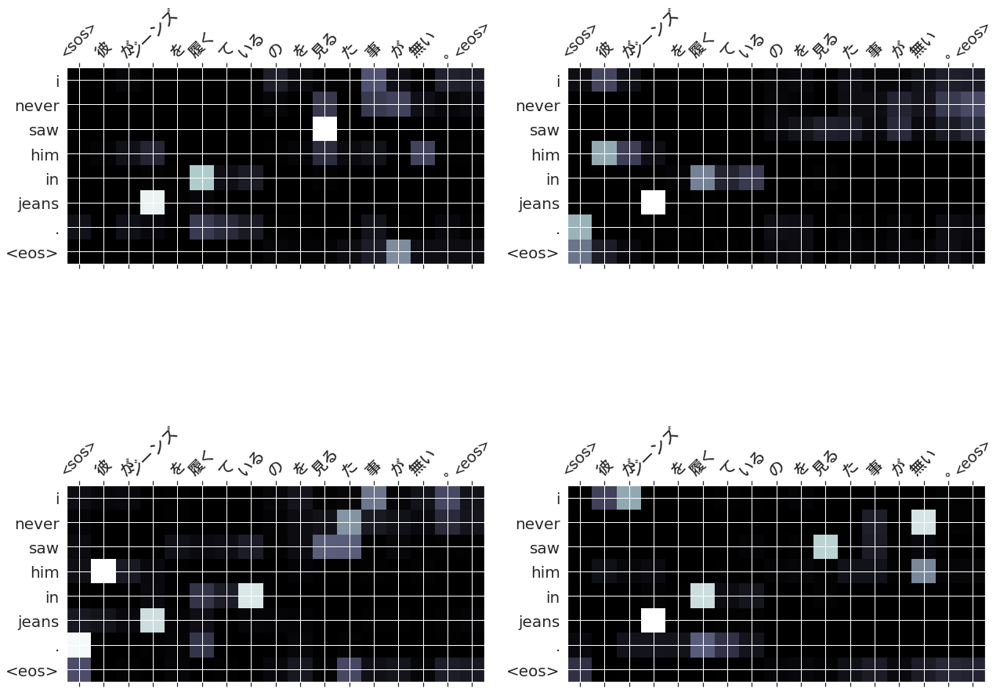

59
src      : 直子 さん は 速い 走る 事 が 出来る 。
trg      : naoko can run fast .
predicted: naoko can run fast . <eos>
     blue: 100.00%


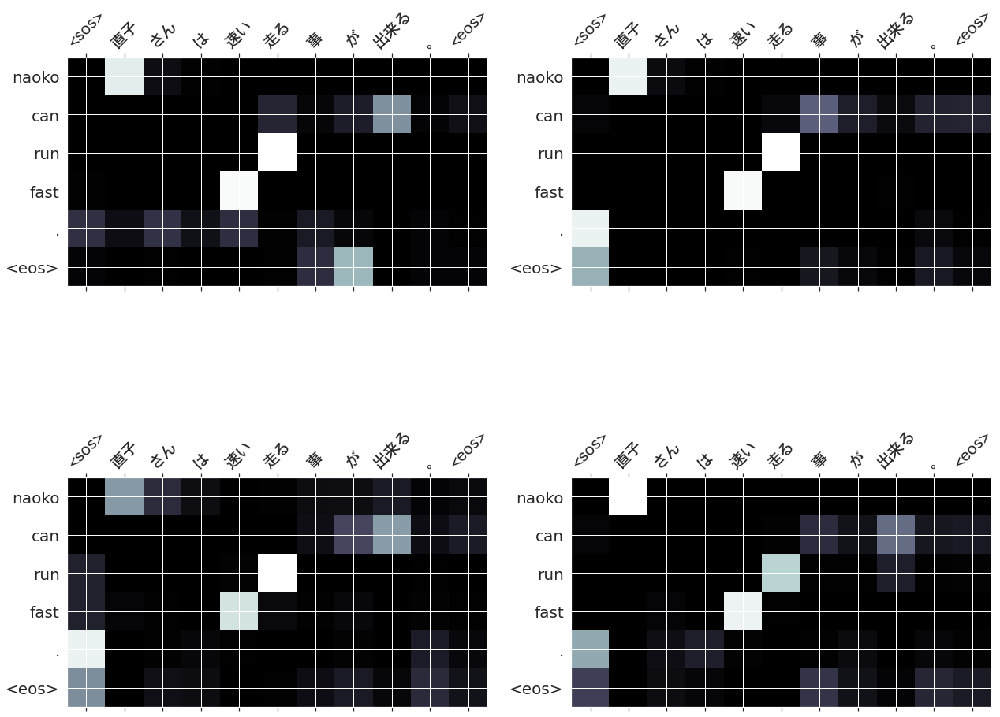

60
src      : 明日 の 朝 6 時 に 起こす て くださる 。
trg      : please wake me up at six tomorrow morning .
predicted: please wake me up at six tomorrow morning . <eos>
     blue: 100.00%


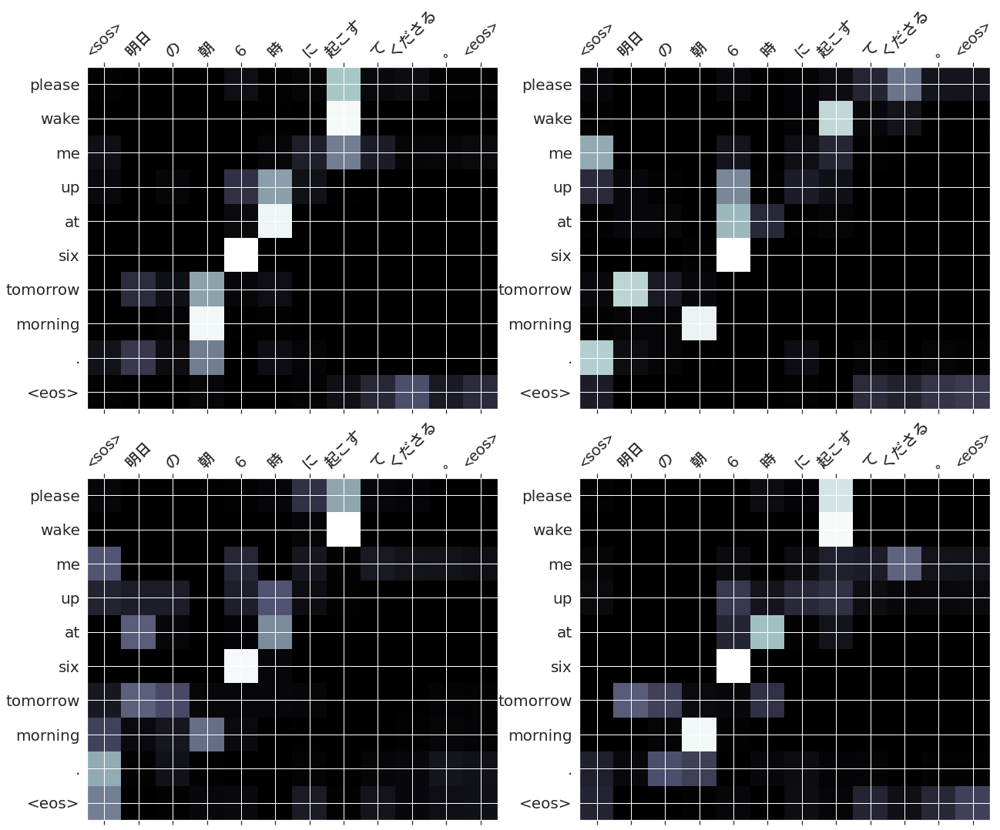

61
src      : 君 は もう少し 早い 来る べし だ た 。
trg      : you should have come a little earlier .
predicted: you should have come a little earlier . <eos>
     blue: 100.00%


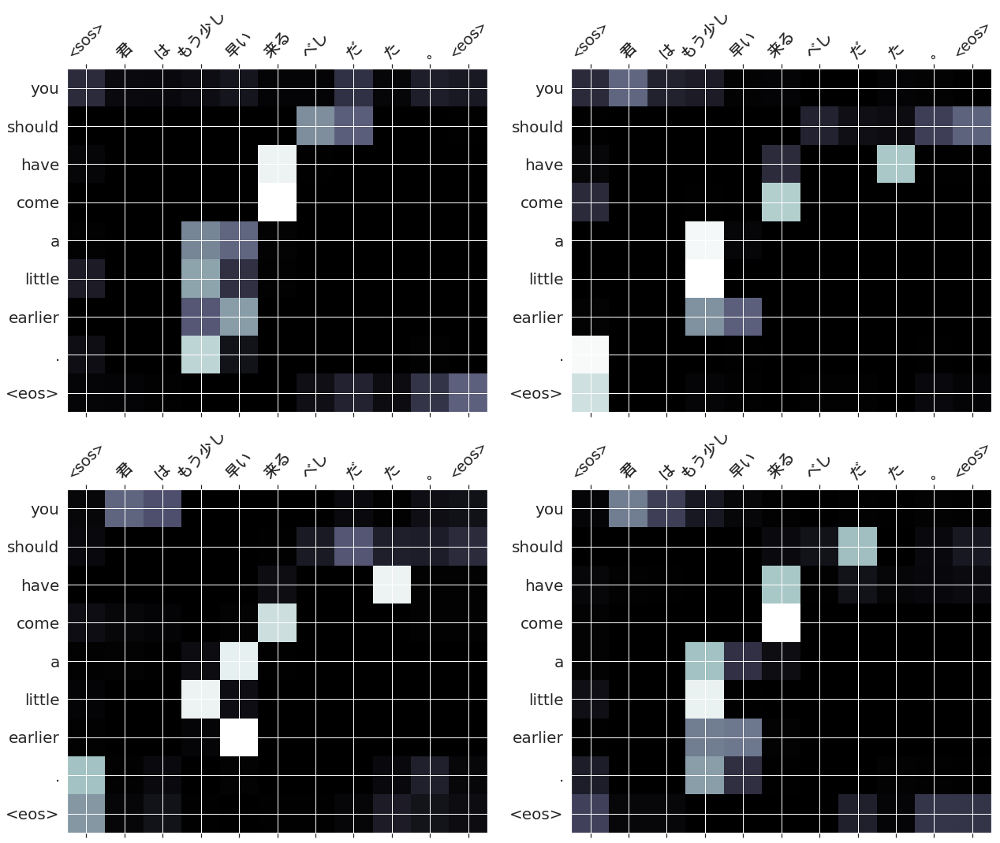

62
src      : 私 の 英語 は 決して 上手 だ は ない 。
trg      : my english is anything but good .
predicted: my english is anything but good . <eos>
     blue: 100.00%


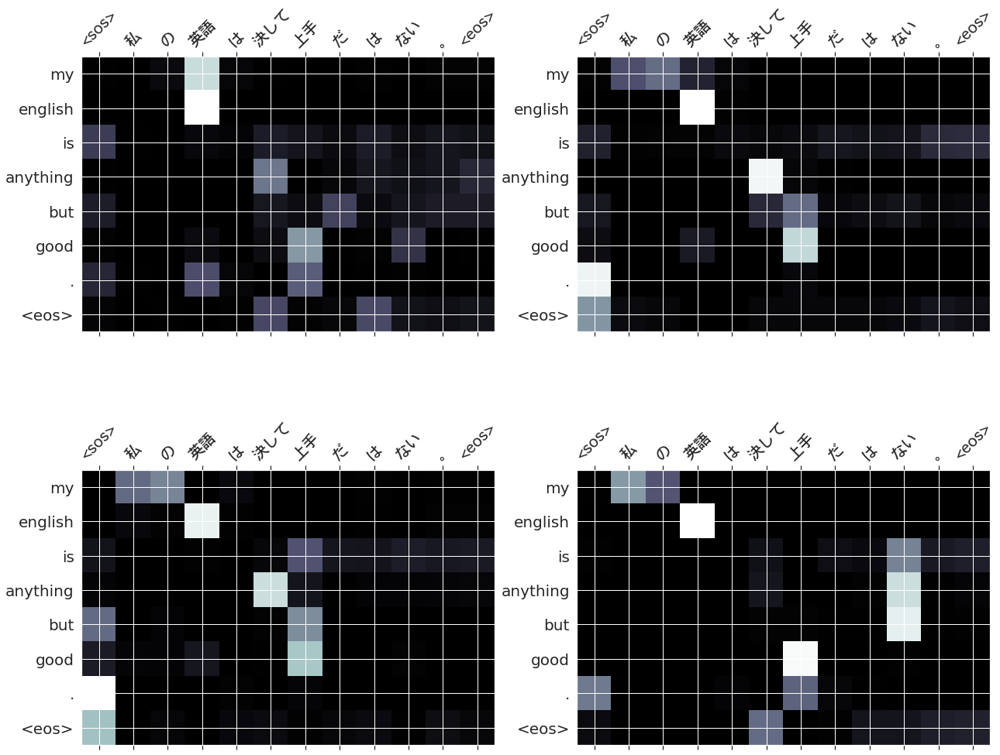

63
src      : 我々 と 一緒 に ここ に いる なさる 。
trg      : stay here with us .
predicted: stay here with us . <eos>
     blue: 100.00%


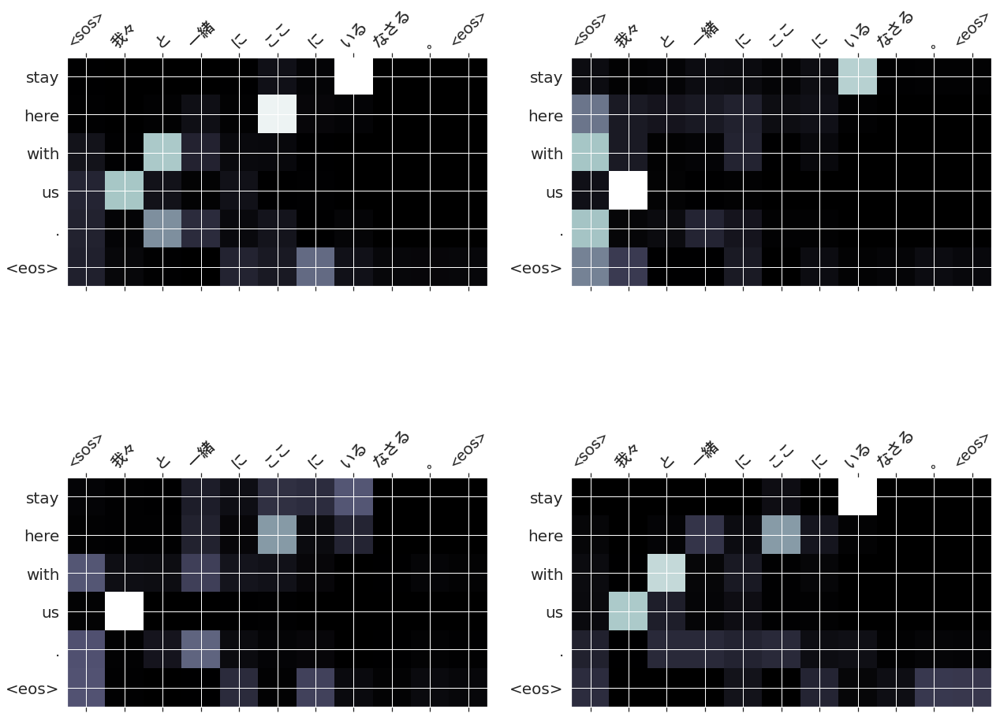

64
src      : 私 は 彼女 と 婚約 中 だ 。
trg      : i am engaged to her .
predicted: i am engaged to her . <eos>
     blue: 100.00%


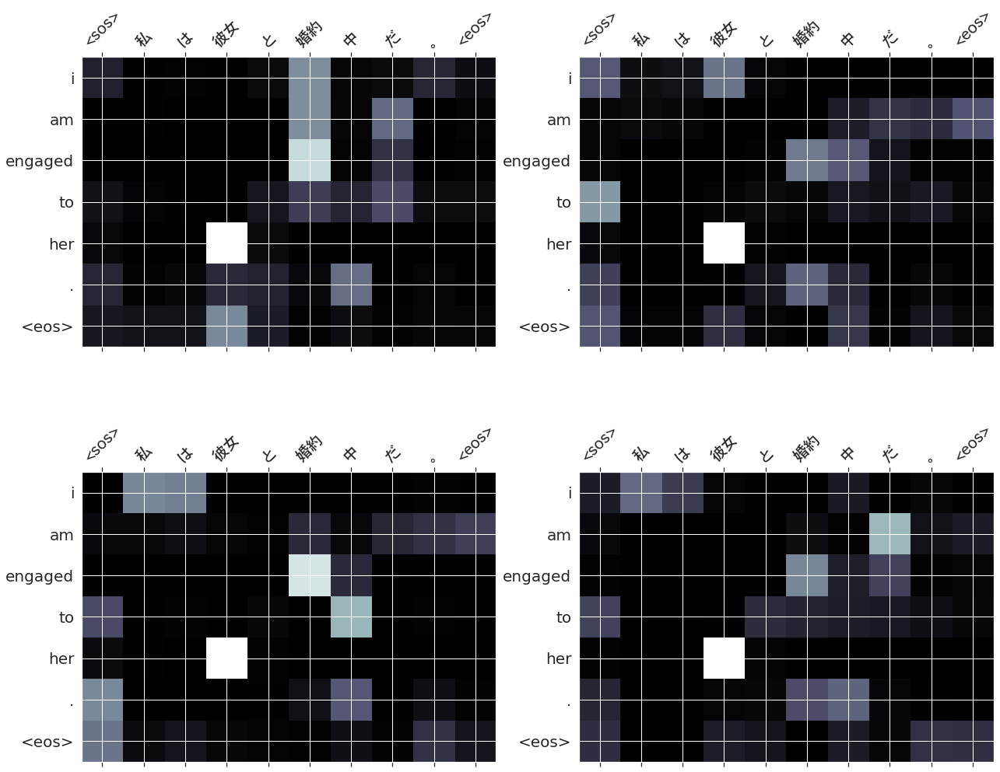

65
src      : 明日 で ５ 日間 雪 が 降り続く こと に なる 。
trg      : it will have been snowing for five days tomorrow .
predicted: it will have been snowing for five days tomorrow . <eos>
     blue: 100.00%


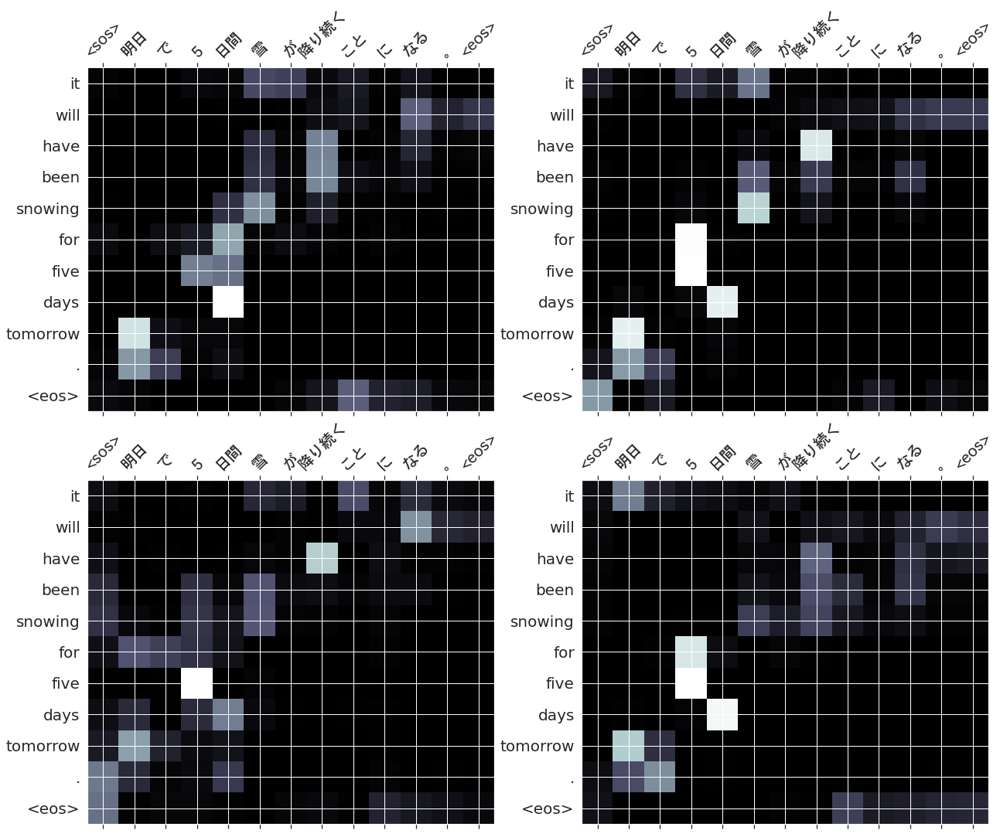

66
src      : 彼女 は 、 持つ て いる お金 を 全部 あなた に あげる だ う 。
trg      : she will give you what money she has .
predicted: she will give you what money she has . <eos>
     blue: 100.00%


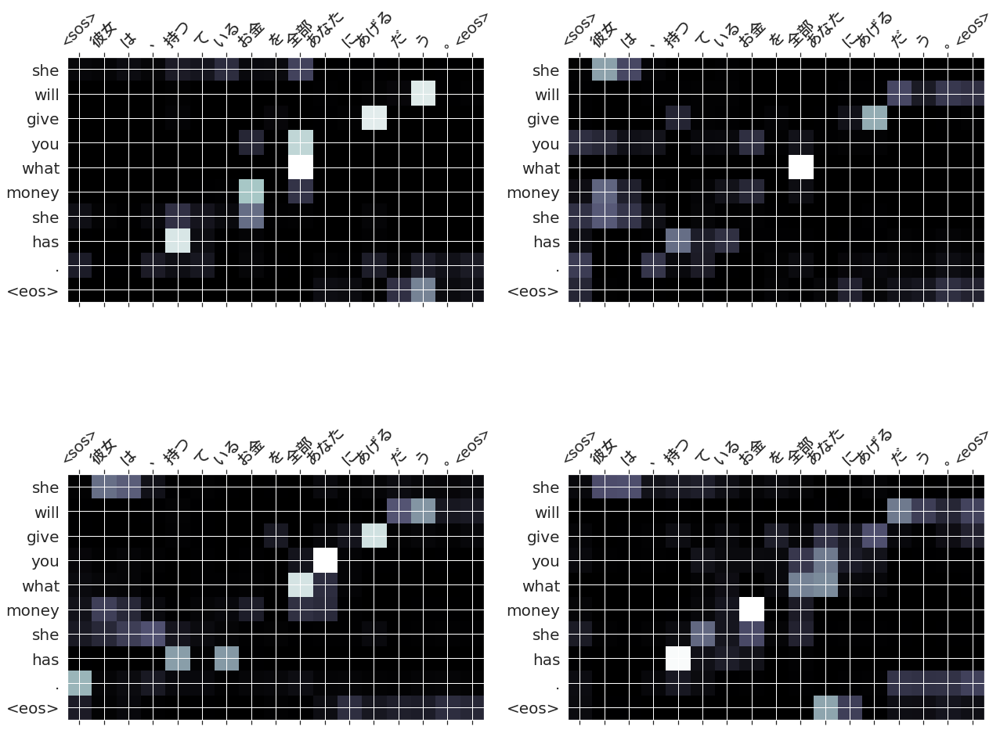

67
src      : 私 は 読書 を する 時間 が ない 。
trg      : i have no time to read .
predicted: i have no time to read . <eos>
     blue: 100.00%


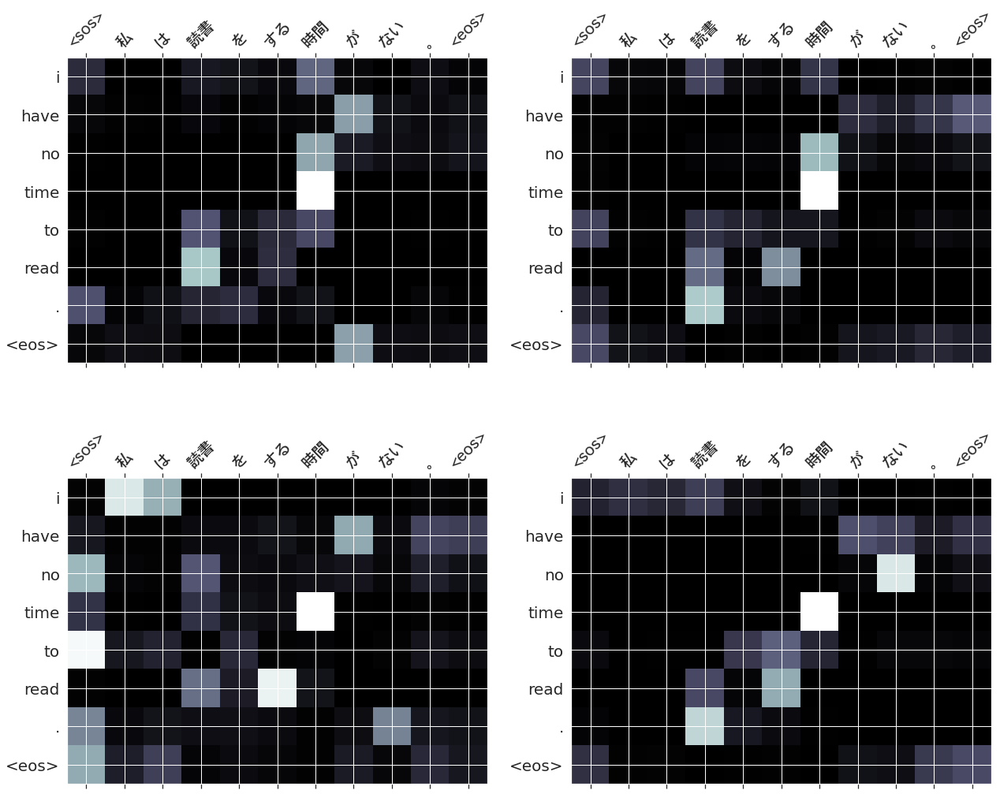

68
src      : 彼 は あなた の 安否 を 尋ねる て いる た 。
trg      : he was asking about your health .
predicted: he was asking about your health . <eos>
     blue: 100.00%


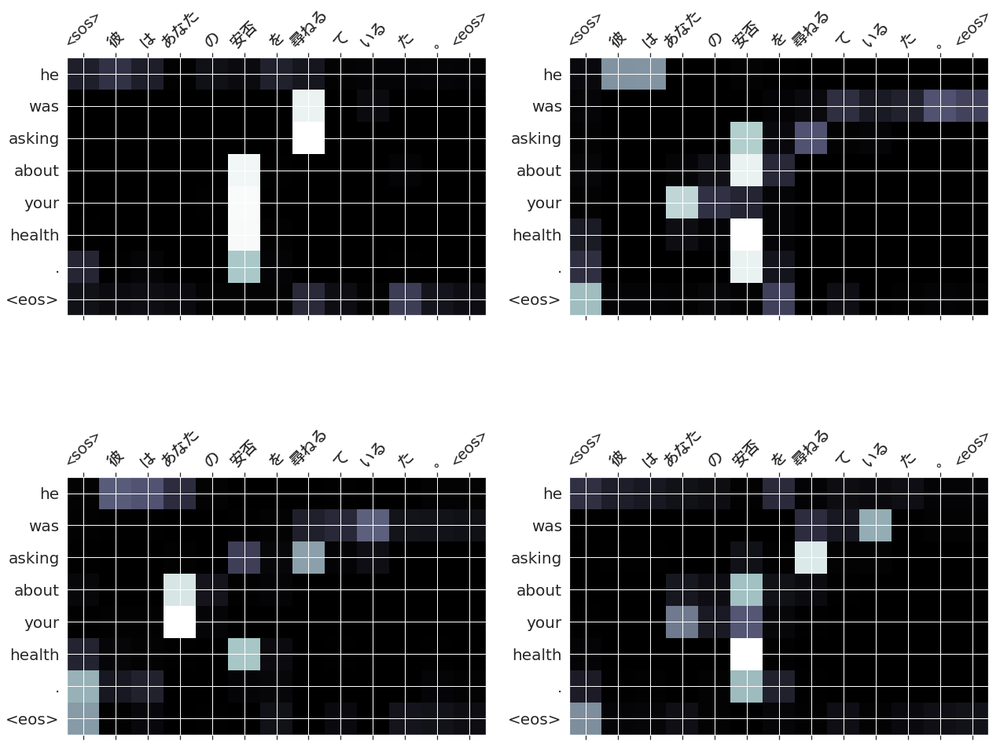

69
src      : 私 は 彼 に そこ へ 行く て ほしい た 。
trg      : i wanted him to go there .
predicted: i wanted him to go there . <eos>
     blue: 100.00%


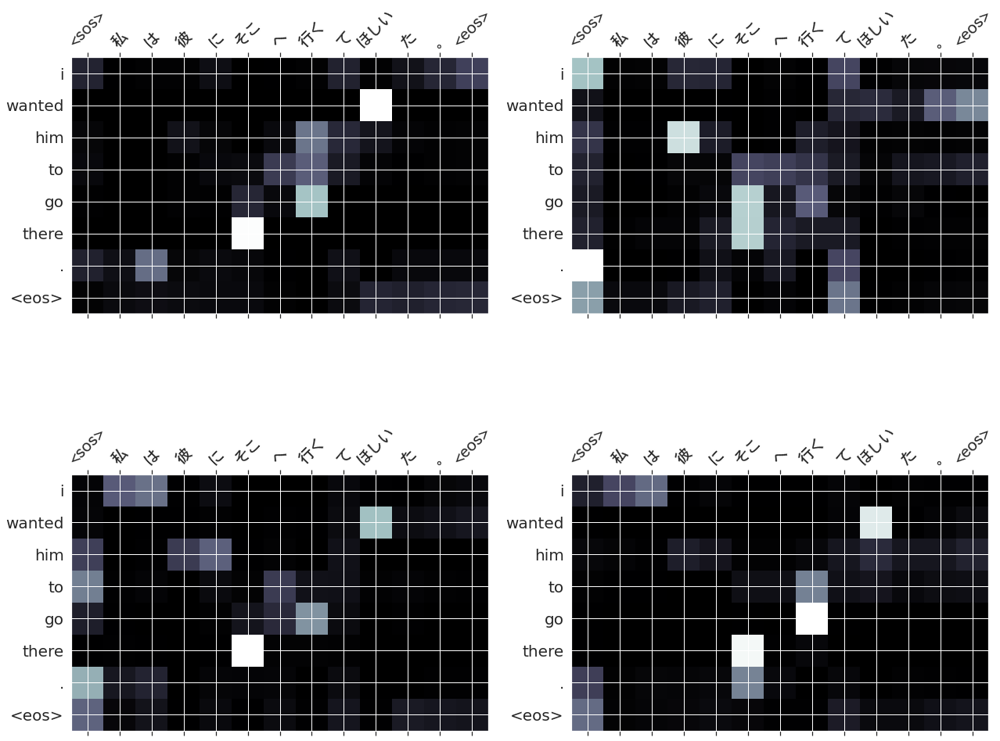

70
src      : 彼 に 何 が 起こる た の です か 。
trg      : what happened to him ?
predicted: what happened to him ? <eos>
     blue: 100.00%


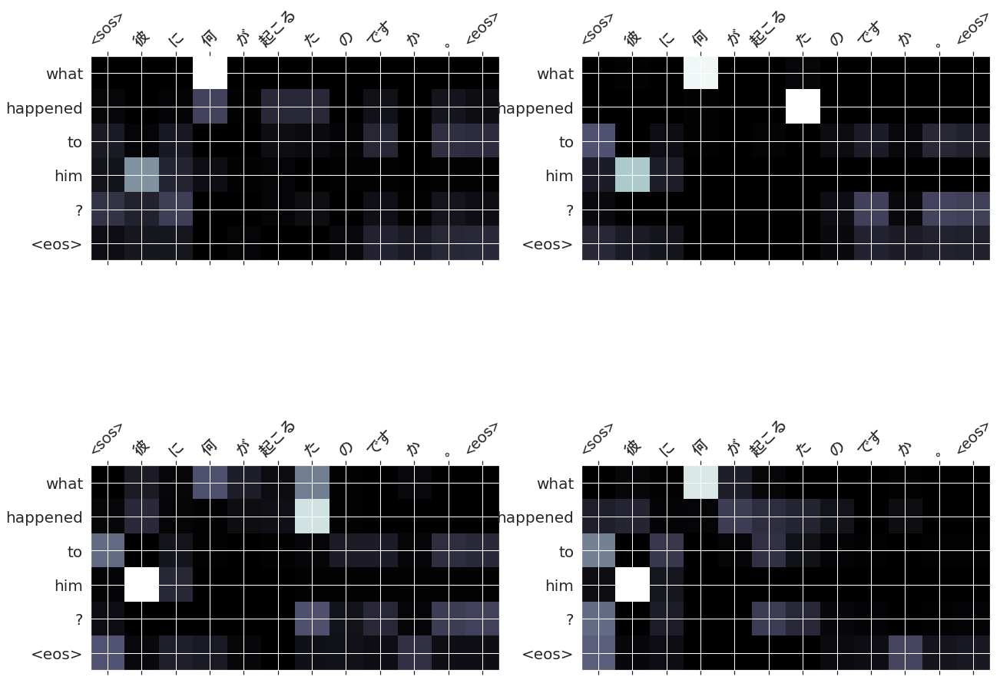

71
src      : 彼 は 社会 にとって 危険 人物 だ 。
trg      : he is a danger to society .
predicted: he is a danger to society . <eos>
     blue: 100.00%


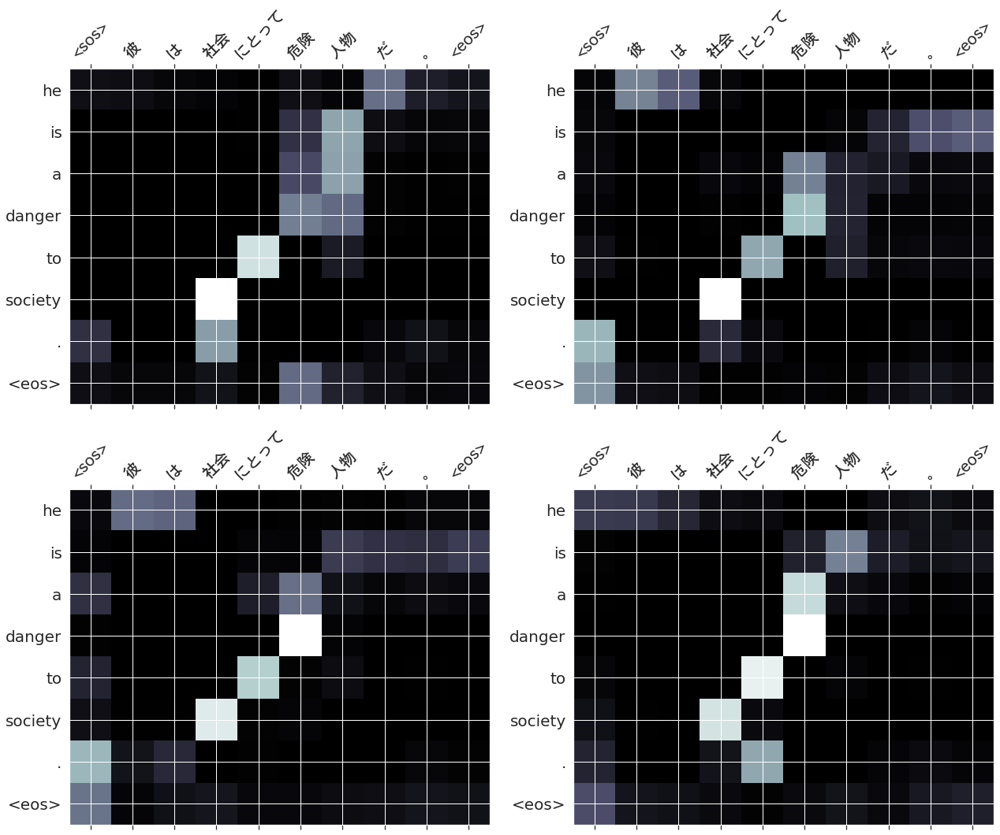

72
src      : 私 は それ を する より むしろ 死ぬ たい 。
trg      : i would rather die than do it .
predicted: i would rather die than do it . <eos>
     blue: 100.00%


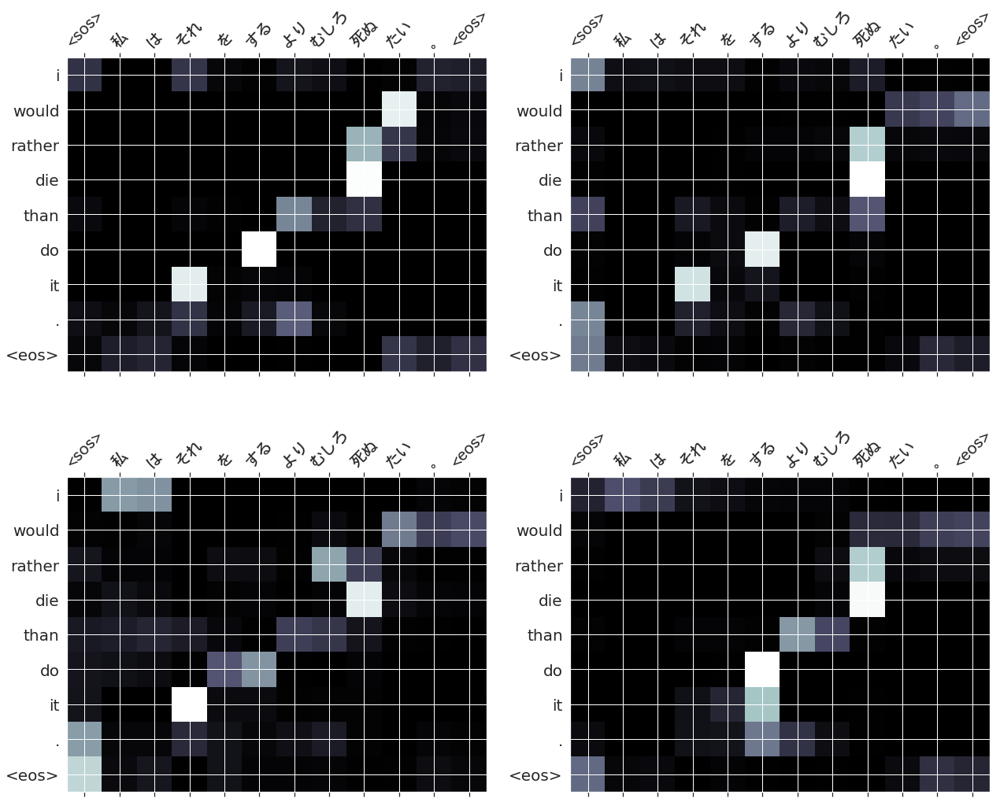

73
src      : 彼 は 一生 独身 の まま だ た 。
trg      : he remained single all his life .
predicted: he remained single all his life . <eos>
     blue: 100.00%


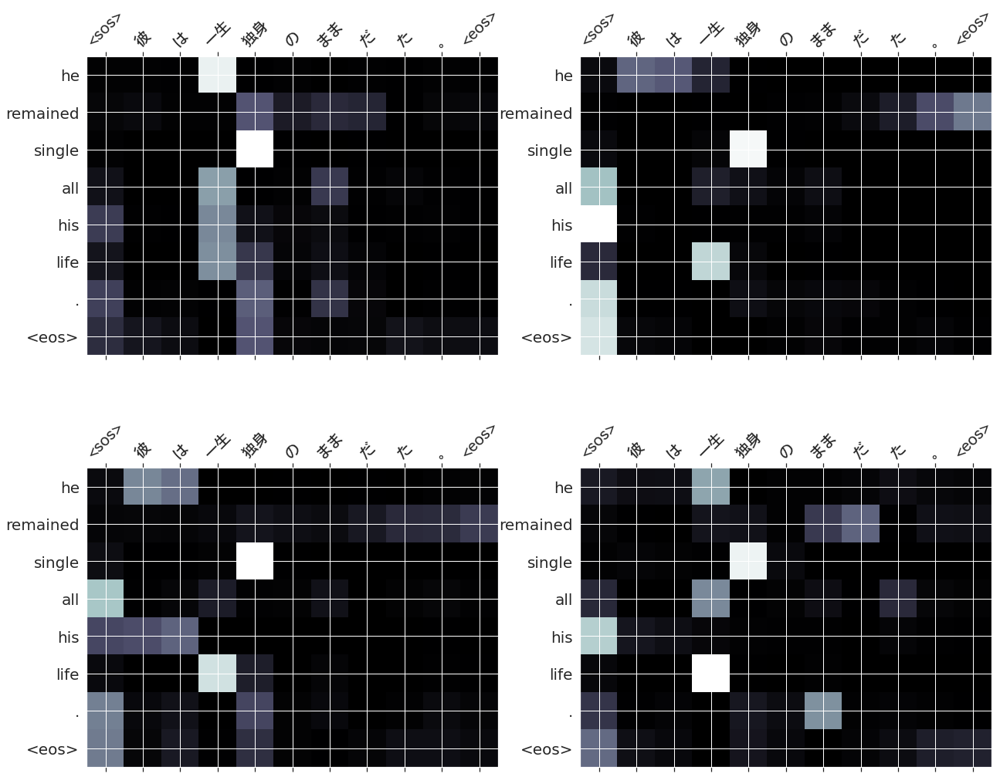

74
src      : 彼女 は 私 と 行く の を 断る た 。
trg      : she refused to go with me .
predicted: she refused to go with me . <eos>
     blue: 100.00%


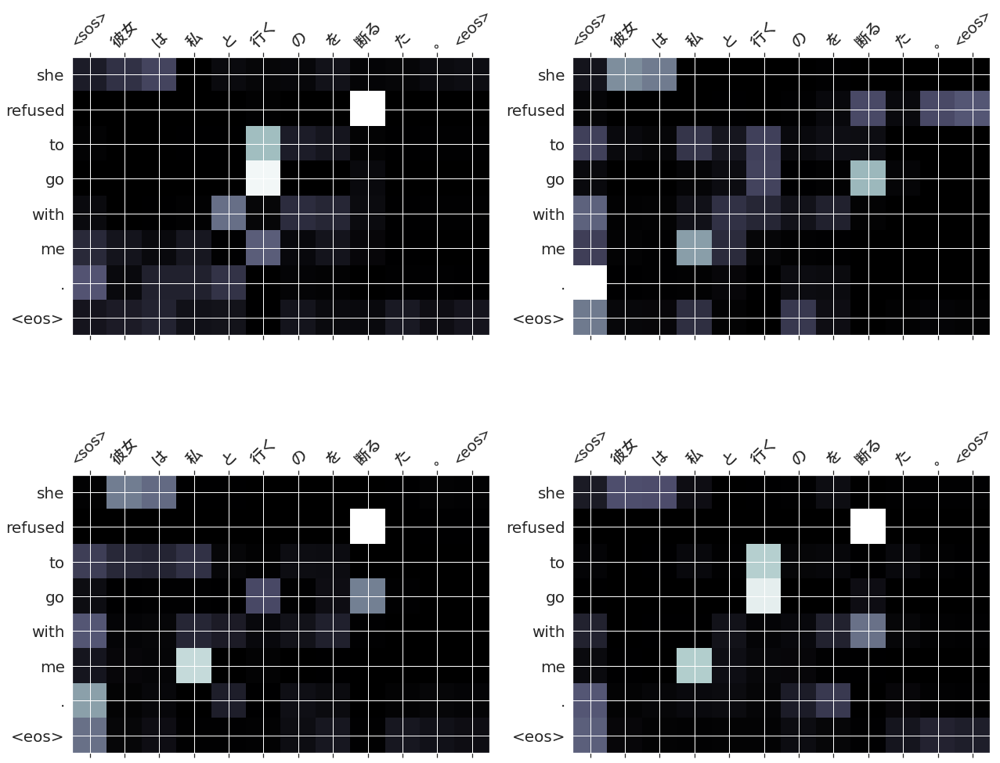

75
src      : 彼ら は 血 が つながる て いる 。
trg      : they are related by blood .
predicted: they are related by blood . <eos>
     blue: 100.00%


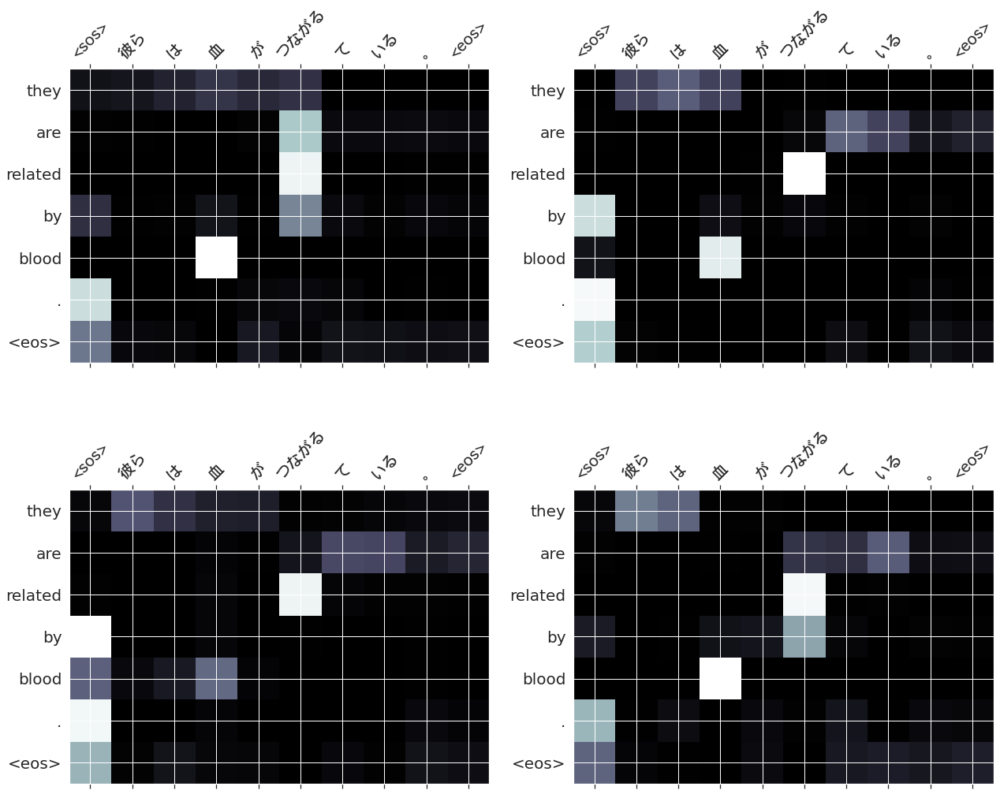

76
src      : あの 映画 は いかが です た か 。
trg      : how did you like that movie ?
predicted: how did you like that movie ? <eos>
     blue: 100.00%


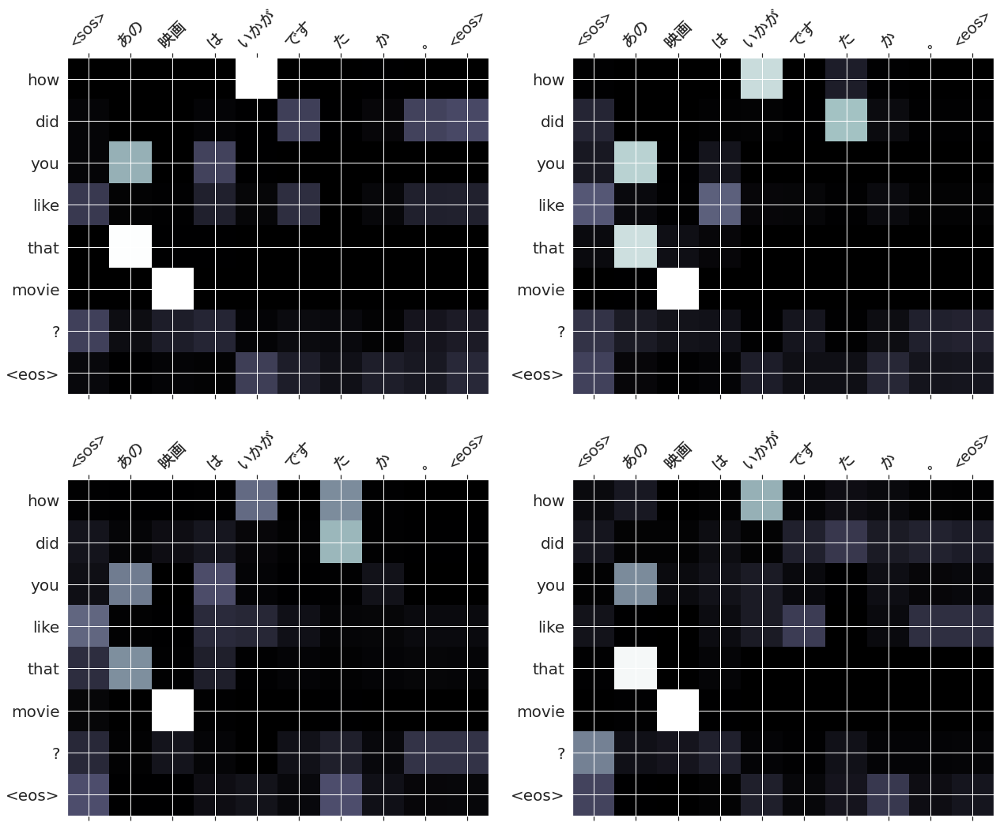

77
src      : 駅 へ は どう 行く た いい か 教える て くださる ます ん か 。
trg      : could you tell me how to get to the station ?
predicted: could you tell me how to get to the station ? <eos>
     blue: 100.00%


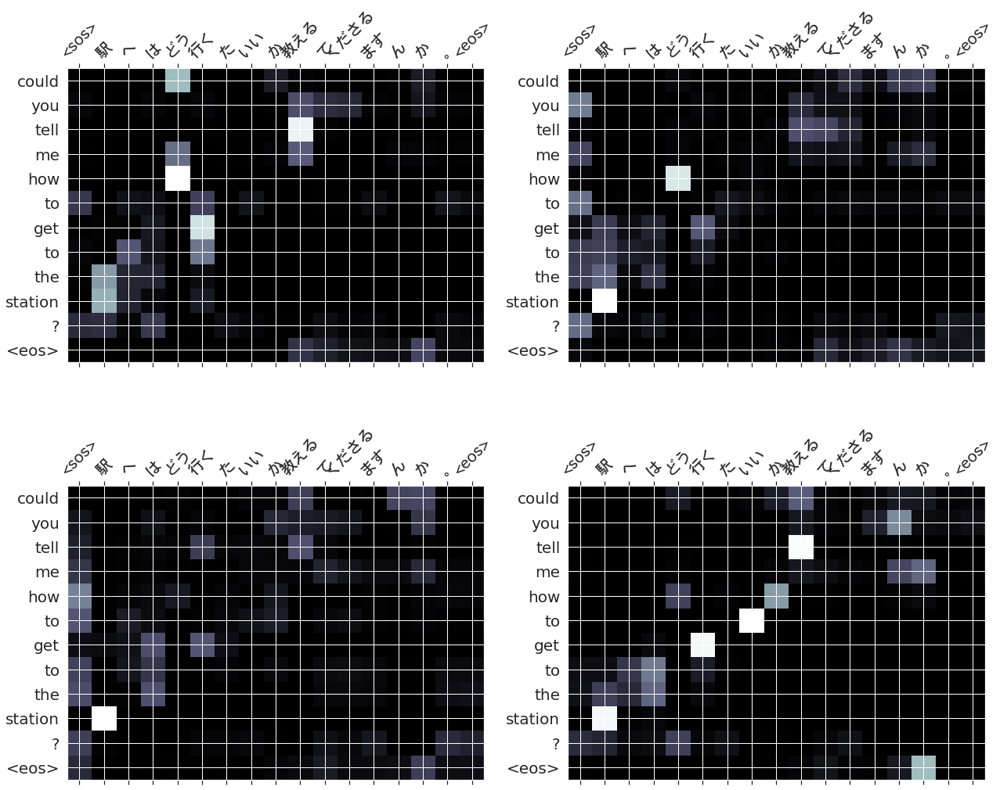

78
src      : 向こう を 走る て いる 男 の 人 は 私 の 叔父 です 。
trg      : the man running over there is my uncle .
predicted: the man running over there is my uncle . <eos>
     blue: 100.00%


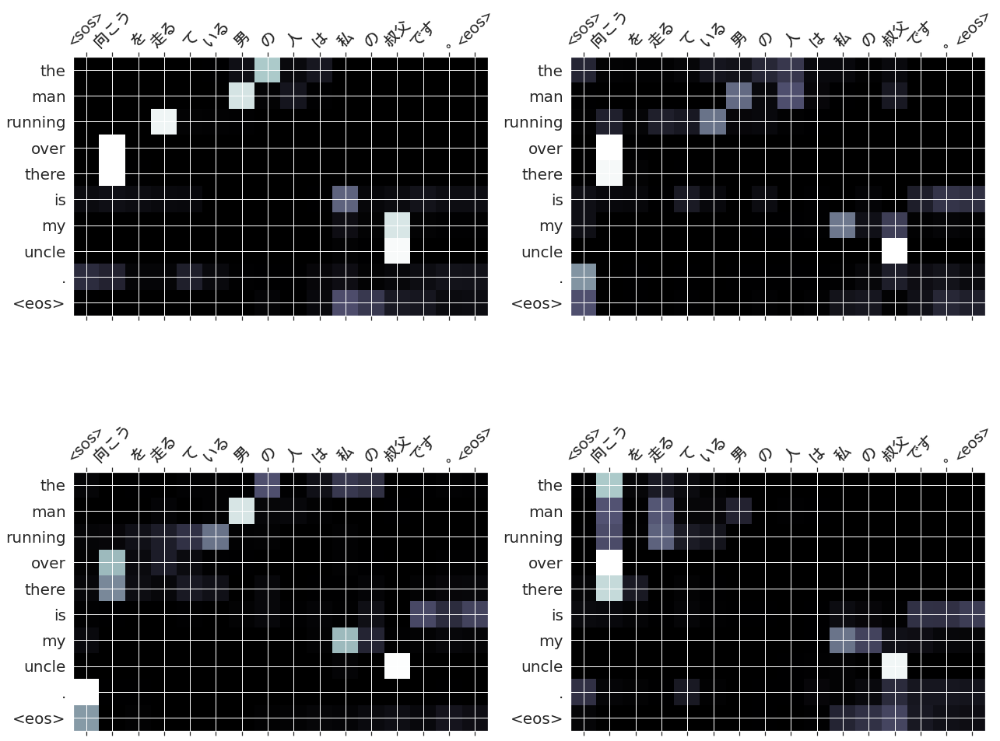

79
src      : 海外 に は 行う た こと が ある ます ん 。
trg      : i 've never been abroad .
predicted: i 've never been abroad . <eos>
     blue: 100.00%


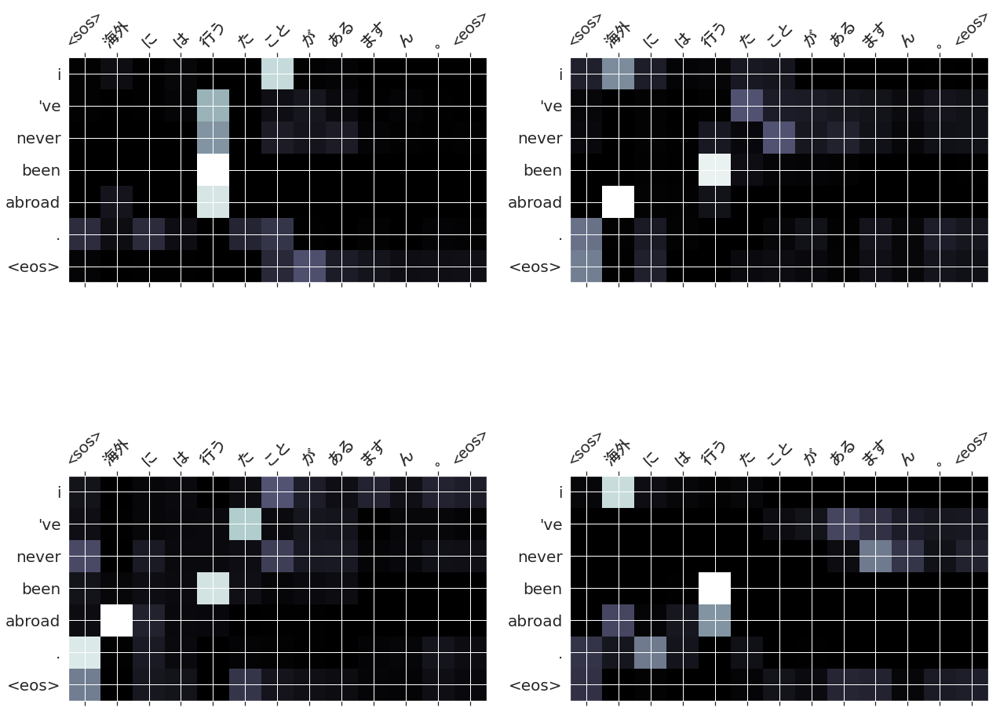

80
src      : 私 は 今朝 早い 彼 に 会う た 。
trg      : i met him early this morning .
predicted: i met him early this morning . <eos>
     blue: 100.00%


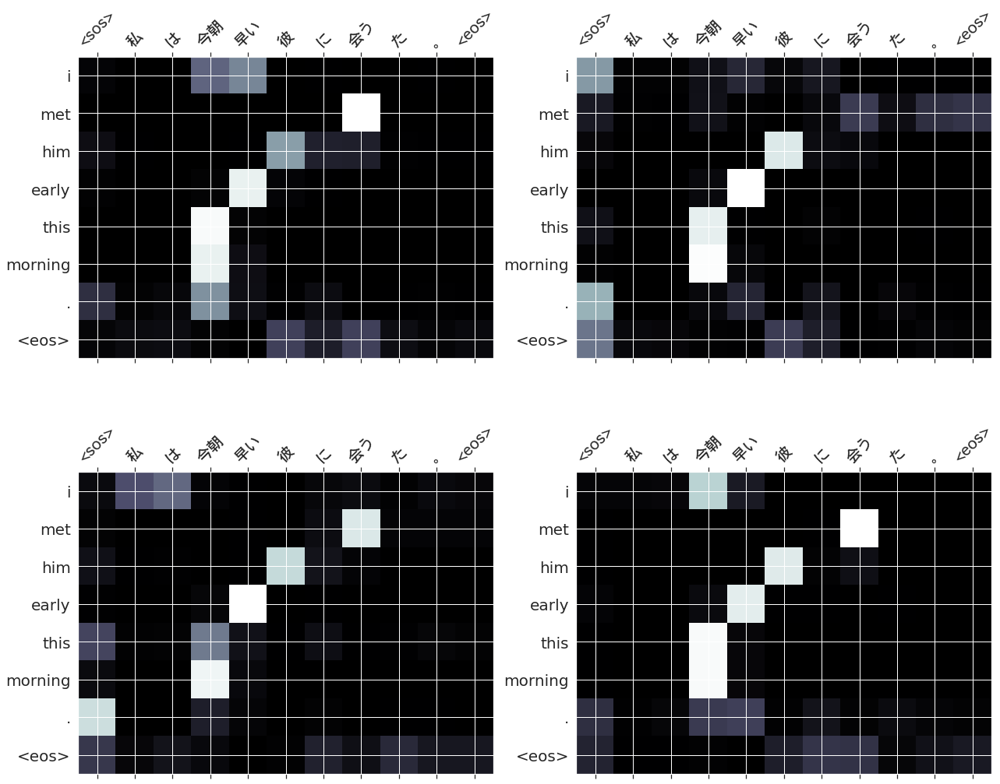

81
src      : 私 達 は 車 が 欲しい 。
trg      : we want a car .
predicted: we want a car . <eos>
     blue: 100.00%


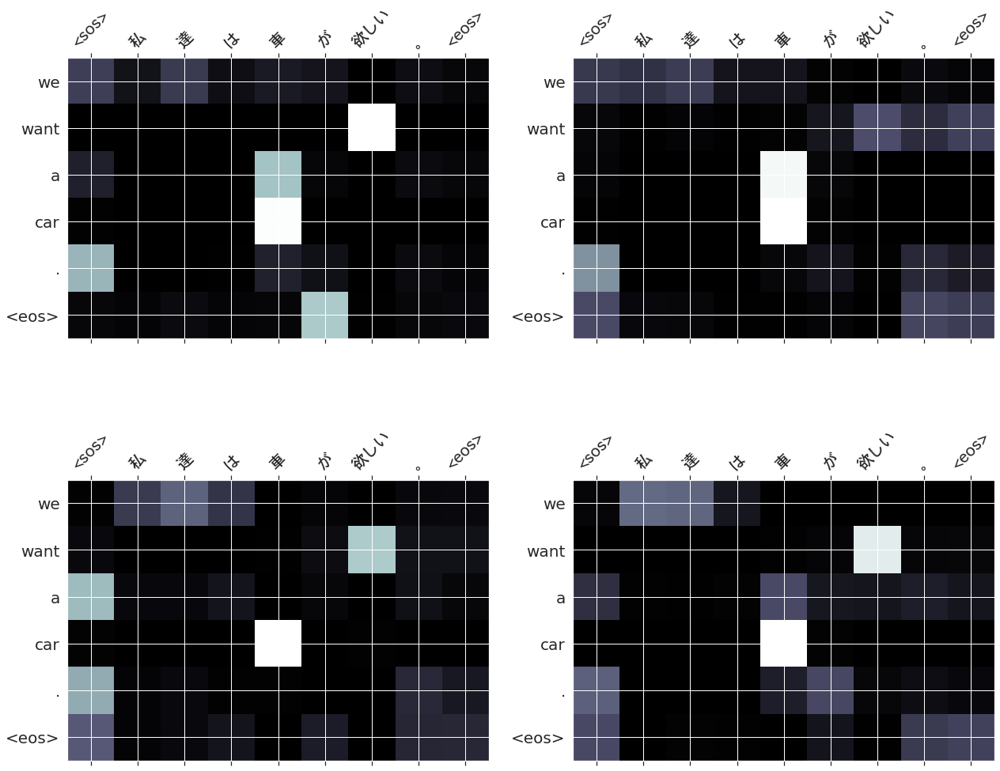

82
src      : 彼ら は この 町 に 住む で いる 。
trg      : they live in this town .
predicted: they live in this town . <eos>
     blue: 100.00%


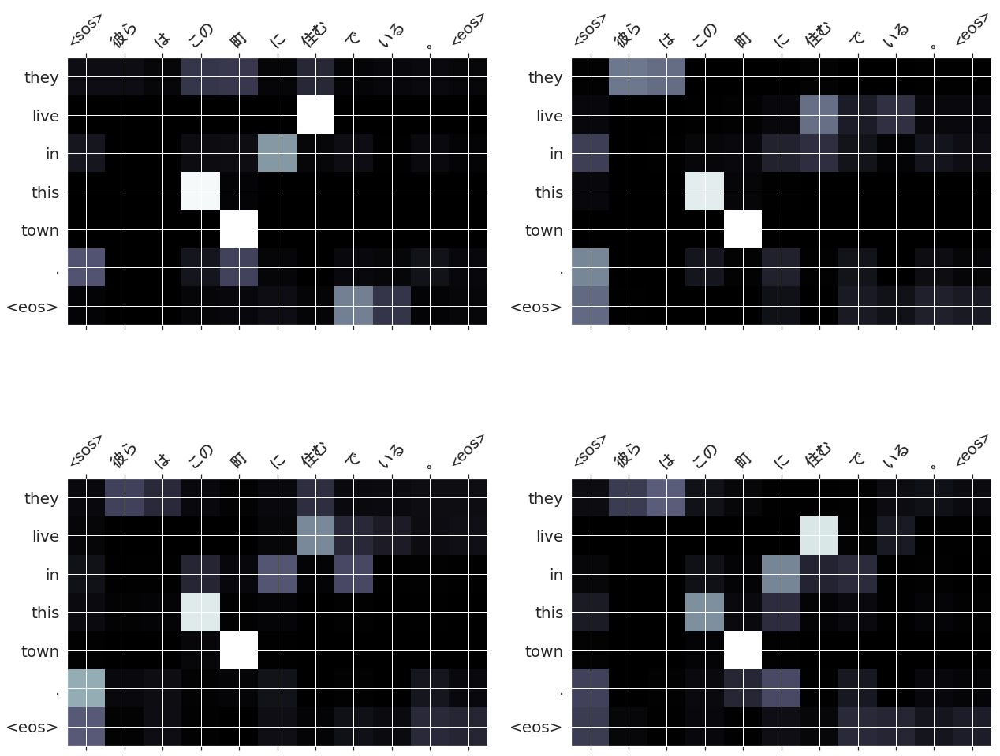

83
src      : 村 の 東 に 接す て 湖 が ある 。
trg      : there is a lake on the east of the village .
predicted: there is a lake on the east of the village . <eos>
     blue: 100.00%


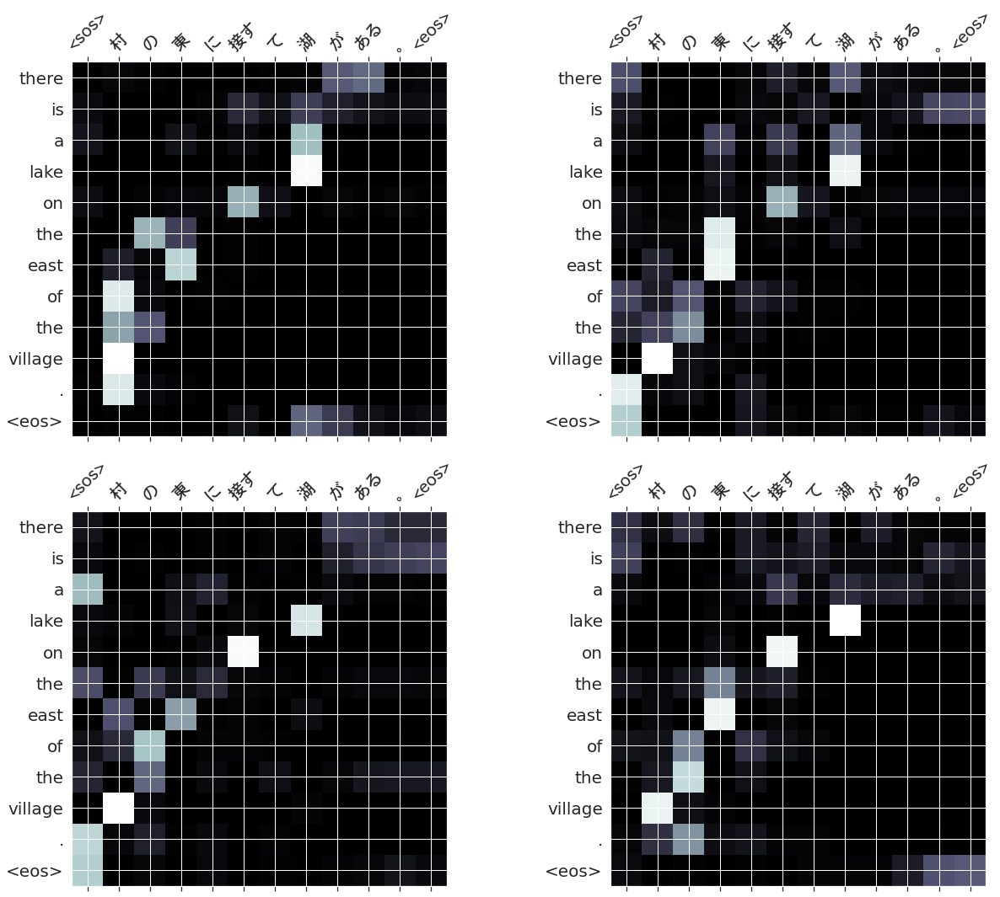

84
src      : 私 は 今年 二 足 の 靴 を はく つぶす た 。
trg      : i 've worn out two pairs of shoes this year .
predicted: i 've worn out two pairs of shoes this year . <eos>
     blue: 100.00%


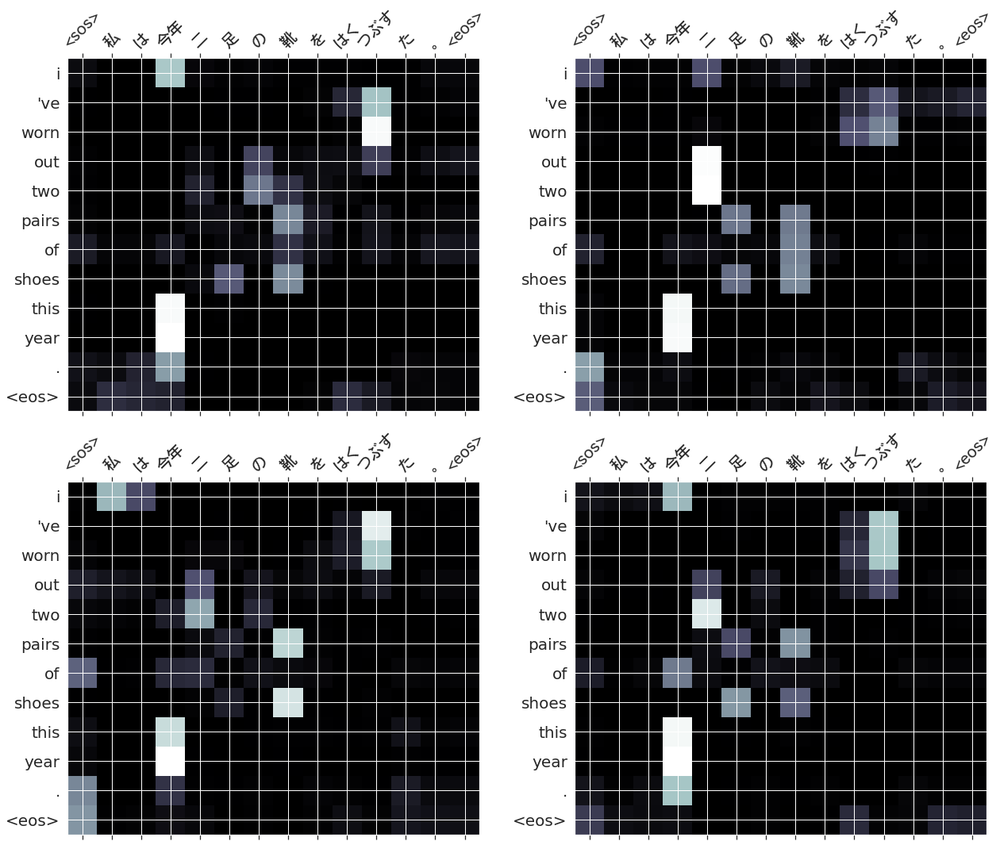

85
src      : 先生 は 彼ら に 川 で 泳ぐ ない よう に と 言う た 。
trg      : the teacher told them not to swim in the river .
predicted: the teacher told them not to swim in the river . <eos>
     blue: 100.00%


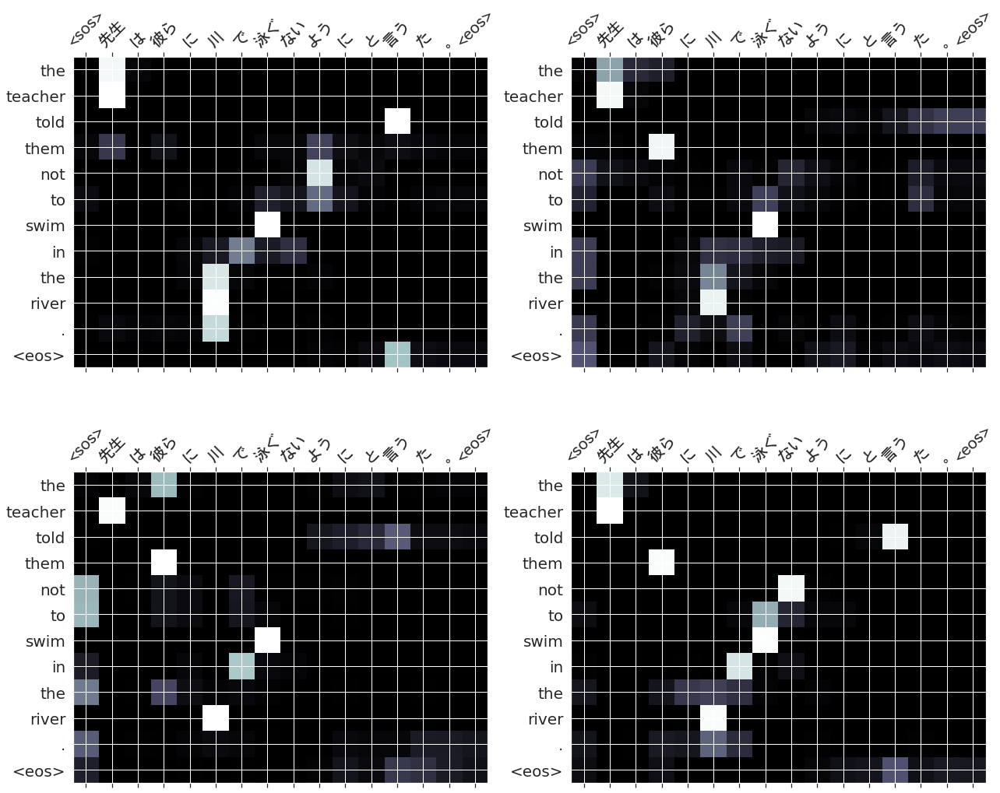

86
src      : 窓側 の 席 は ある か 。
trg      : do you have a window seat ?
predicted: do you have a window seat ? <eos>
     blue: 100.00%


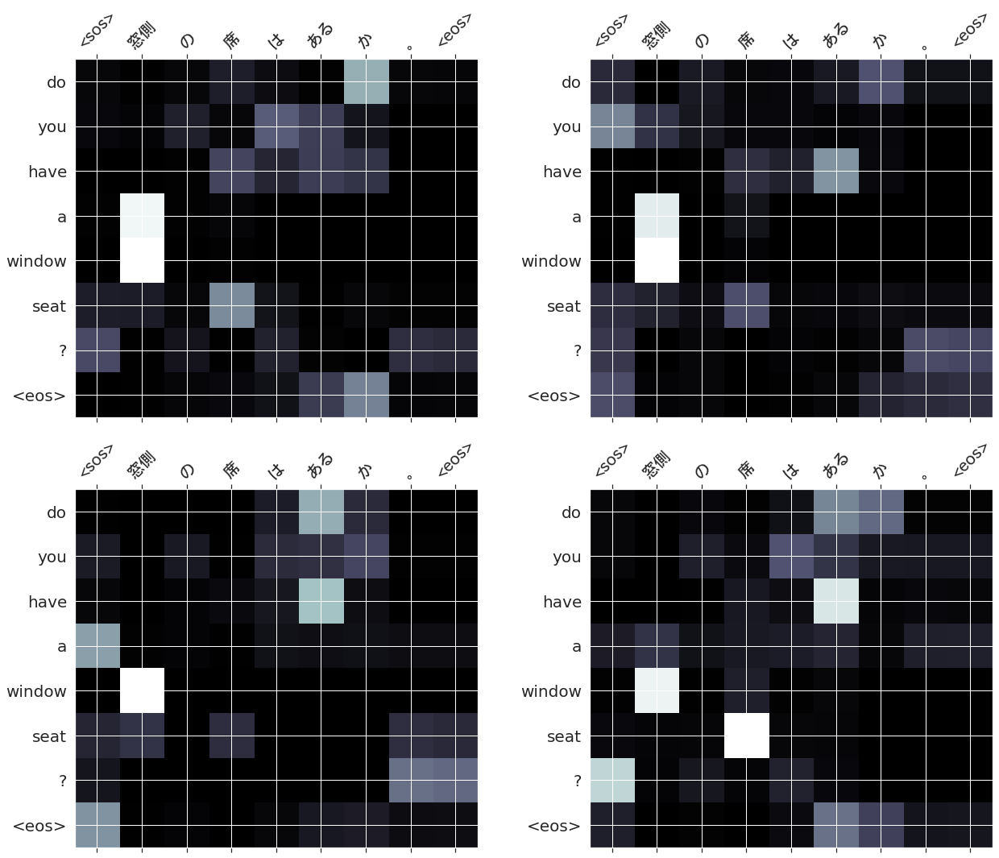

87
src      : 彼 は その 知らせ に 驚く た 。
trg      : he was surprised at the news .
predicted: he was surprised at the news . <eos>
     blue: 100.00%


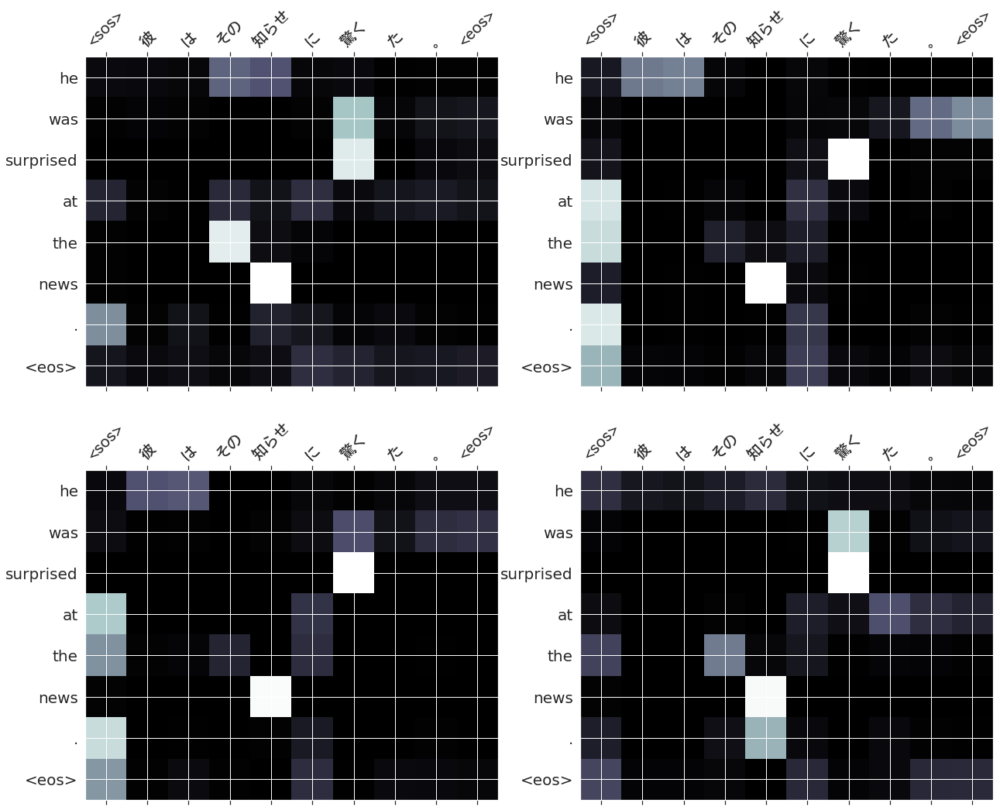

88
src      : 牛乳 は 私 の 身体 に 合う ない 。
trg      : milk does not agree with me .
predicted: milk does not agree with me . <eos>
     blue: 100.00%


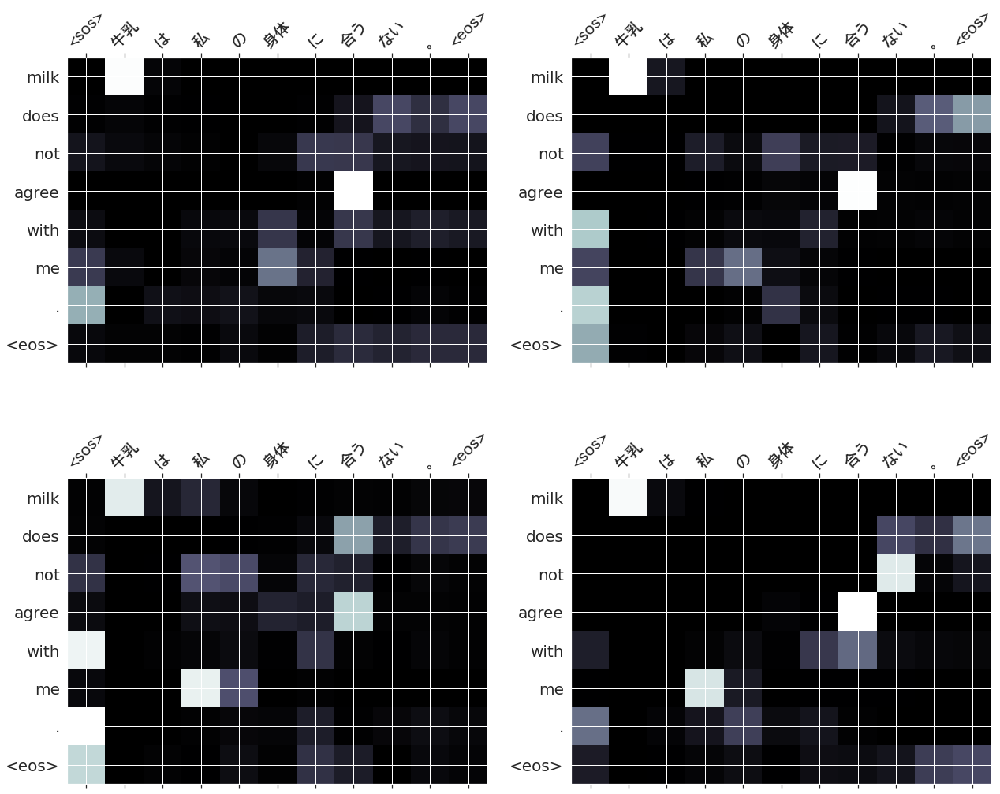

89
src      : 私 は 濃い 赤色 の 方 が 好き だ 。
trg      : i like dark red better .
predicted: i like dark red better . <eos>
     blue: 100.00%


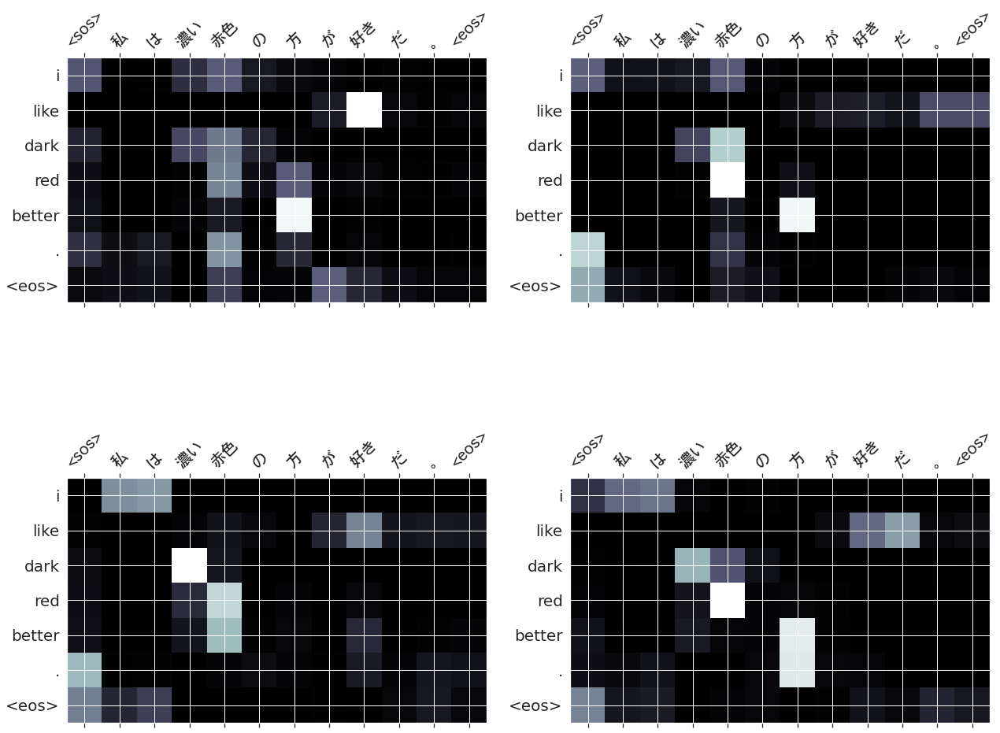

90
src      : 果物 を 御 自由 に 取る て お 食べる くださる 。
trg      : please help yourself to the fruit .
predicted: please help yourself to the fruit . <eos>
     blue: 100.00%


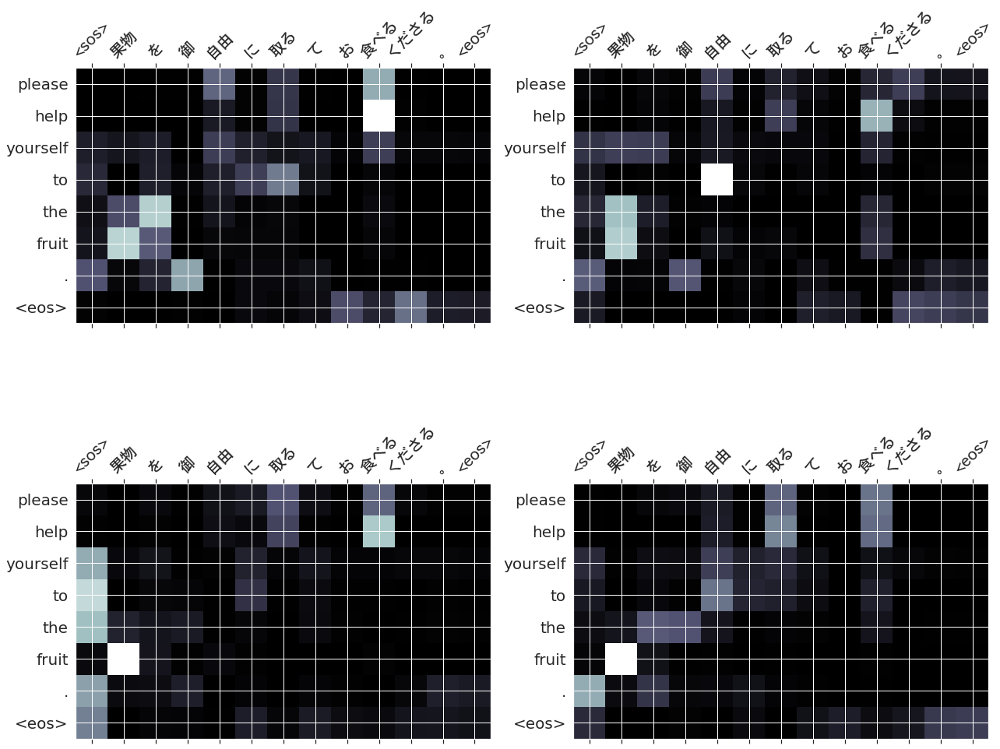

91
src      : 私 は テニス を する ため に その 公園 に 行く ます た 。
trg      : i went to the park to play tennis .
predicted: i went to the park to play tennis . <eos>
     blue: 100.00%


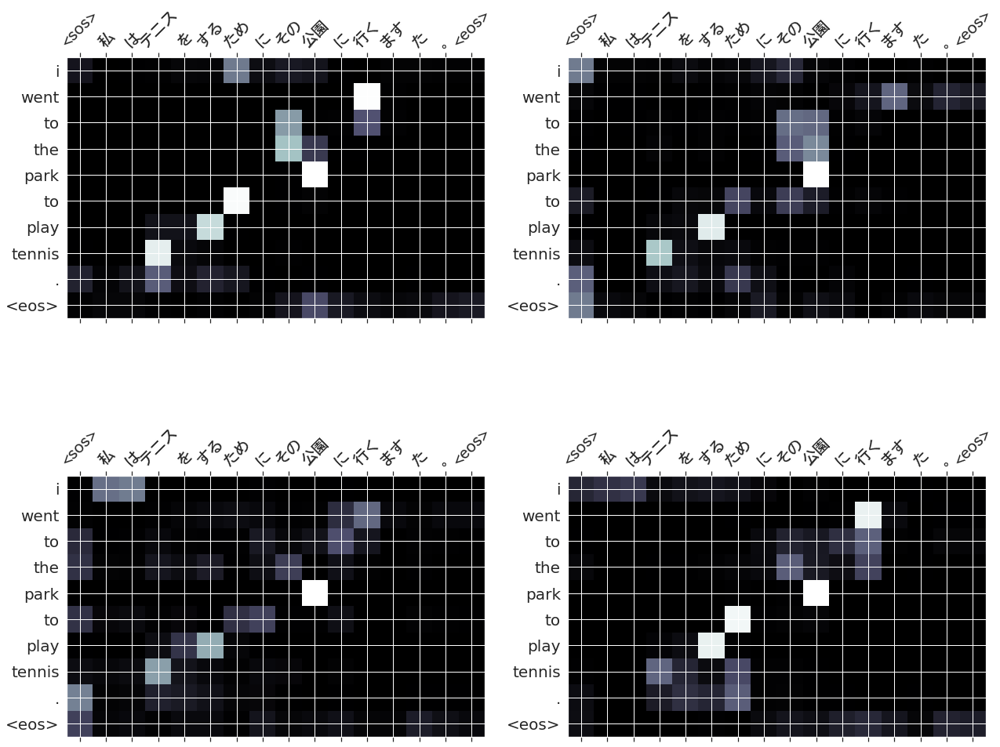

92
src      : あなた が 私 に する て もらう たい こと を 言う て くださる 。
trg      : tell me what you want me to do .
predicted: tell me what you want me to do . <eos>
     blue: 100.00%


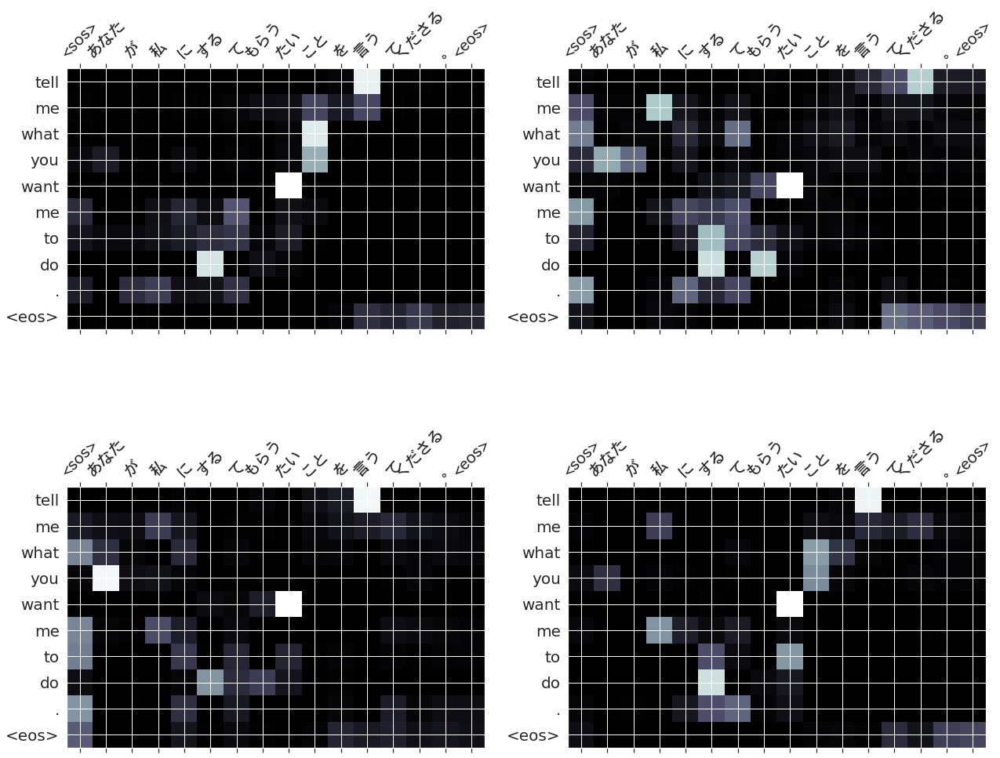

93
src      : 私 達 は 法律 に 従う 義務 が ある 。
trg      : we are bound to obey the law .
predicted: we are bound to obey the law . <eos>
     blue: 100.00%


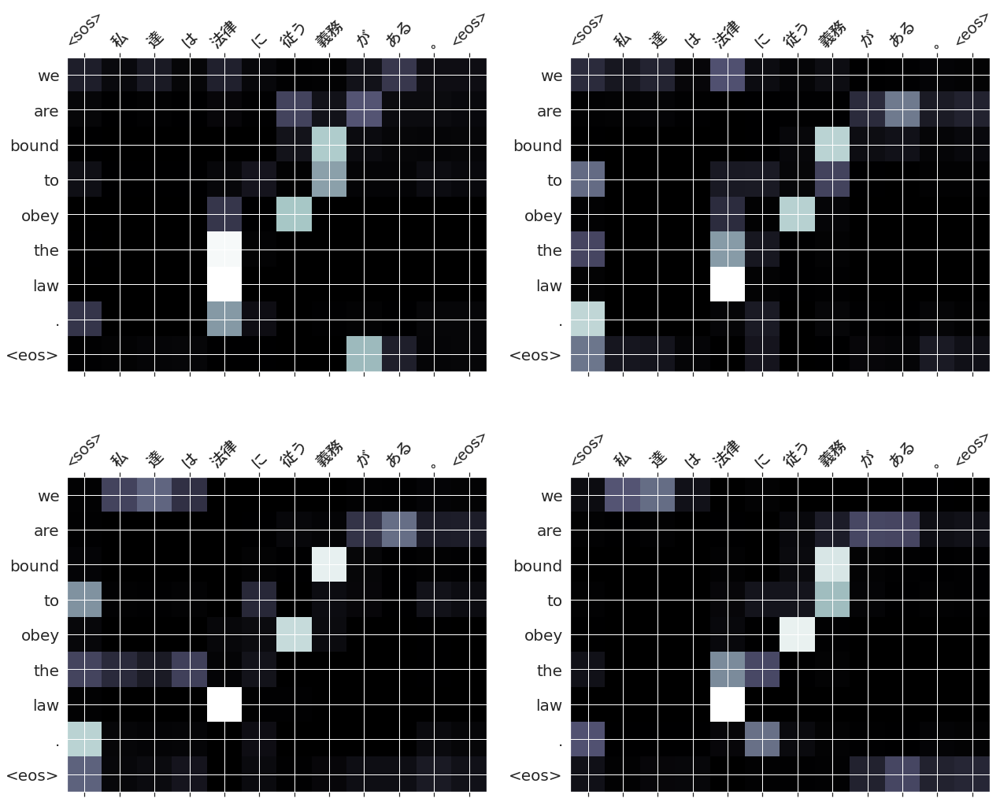

94
src      : あなた は お母さん を 手伝う ない ば なる ない 。
trg      : you must help your mother .
predicted: you must help your mother . <eos>
     blue: 100.00%


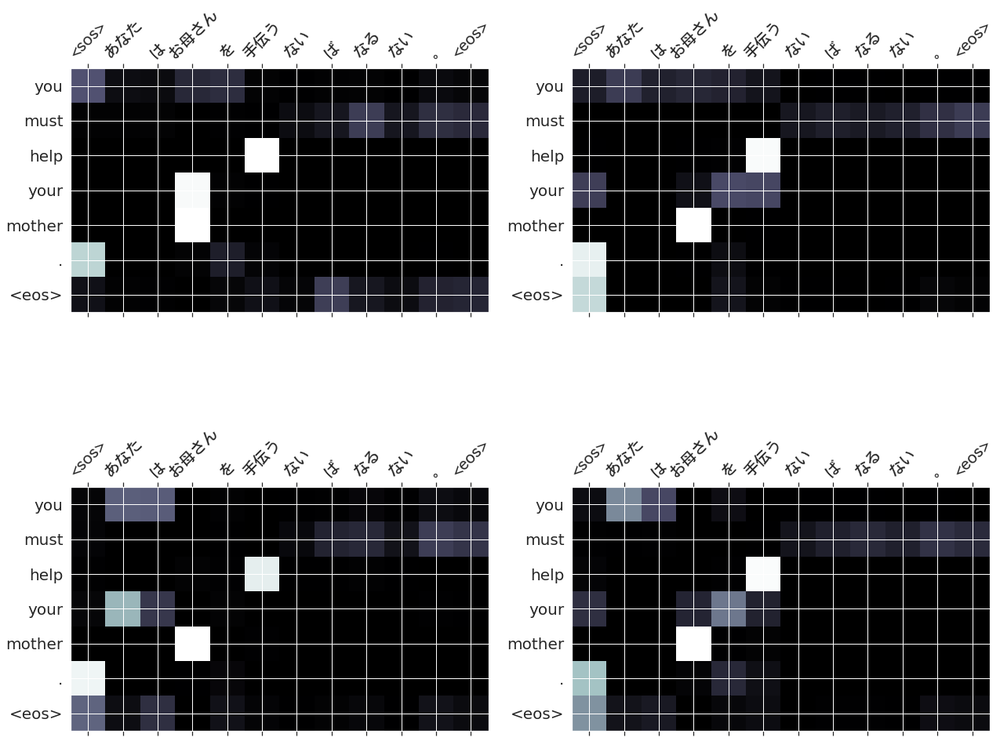

95
src      : おじ は その 時計 を くれる た 。
trg      : my uncle gave me the watch .
predicted: my uncle gave me the watch . <eos>
     blue: 100.00%


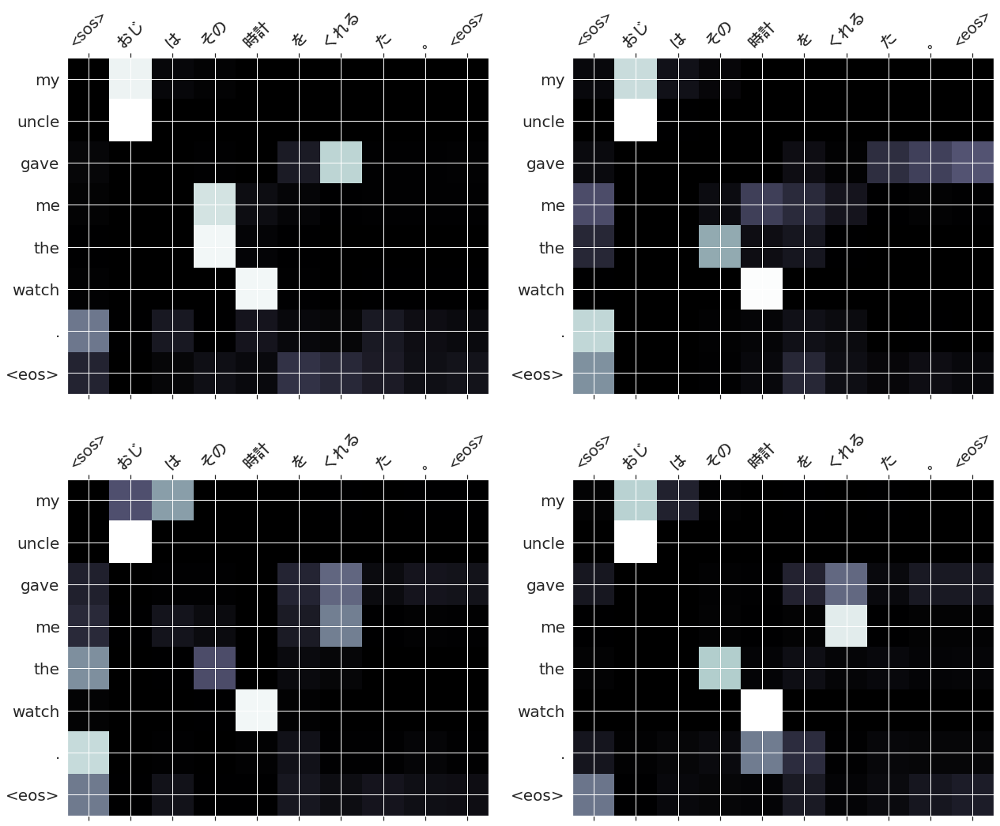

96
src      : 私 は それ を 明日 の 午後 まで に 終える ます 。
trg      : i will finish it by tomorrow afternoon .
predicted: i will finish it by tomorrow afternoon . <eos>
     blue: 100.00%


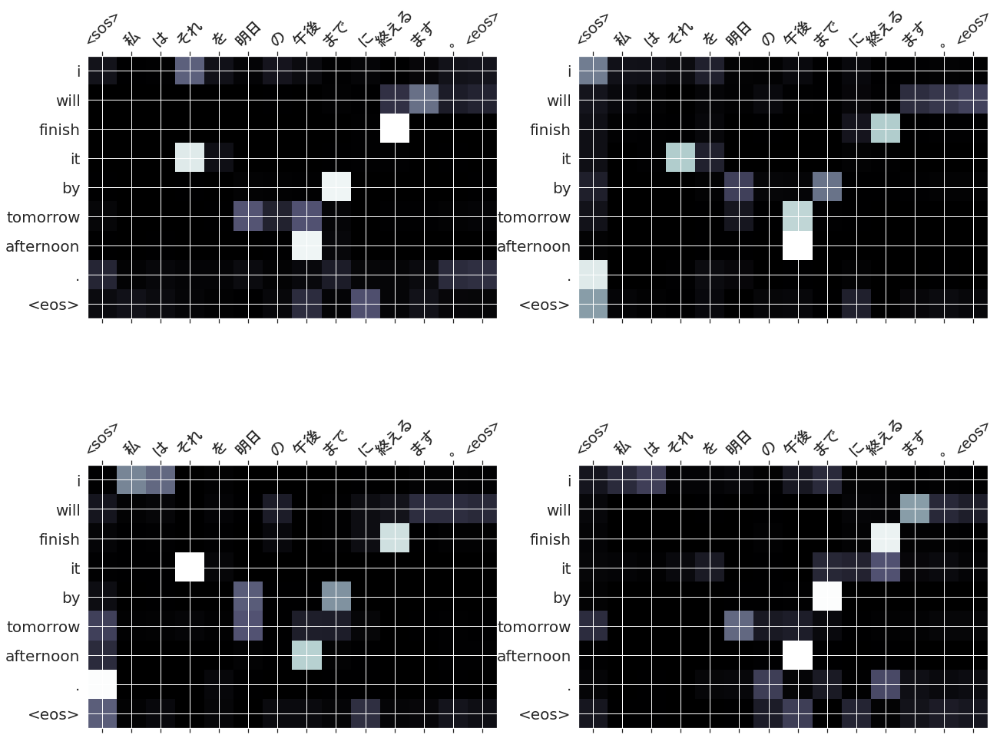

97
src      : 彼 は よい 生徒 です 。
trg      : he is a good student .
predicted: he is a good student . <eos>
     blue: 100.00%


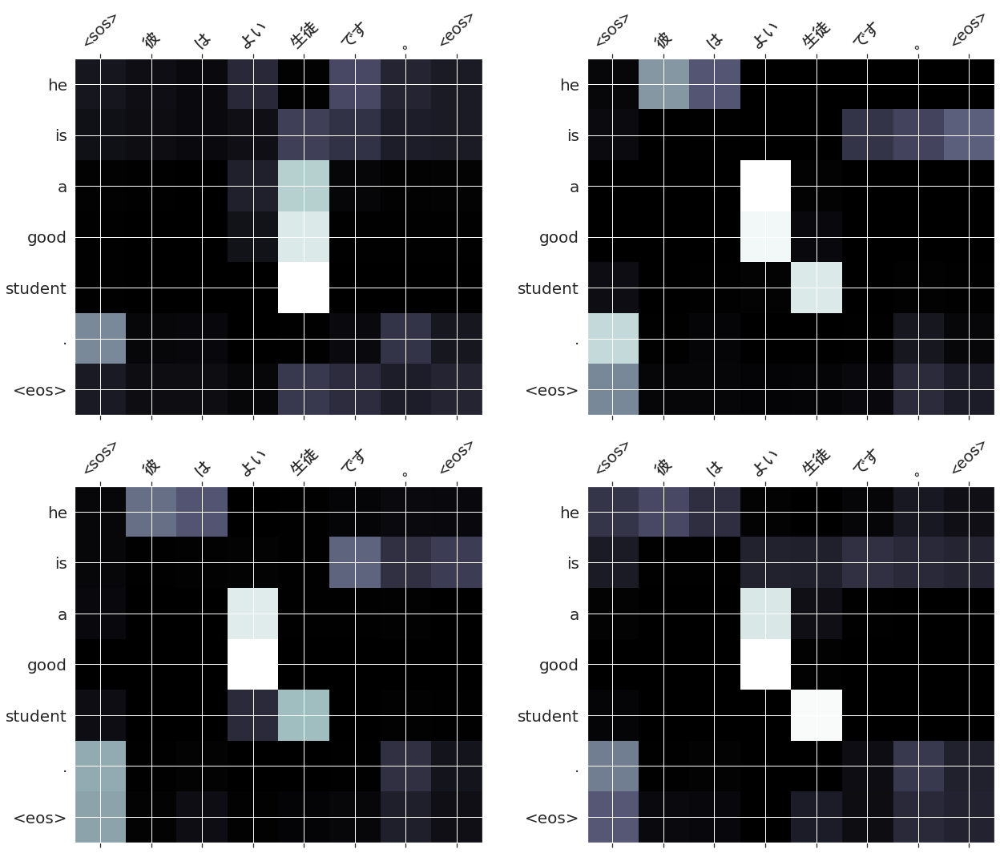

98
src      : 私 は 彼 に どこ へ 行く ところ だ の か と たずねる た 。
trg      : i asked him where he was going .
predicted: i asked him where he was going . <eos>
     blue: 100.00%


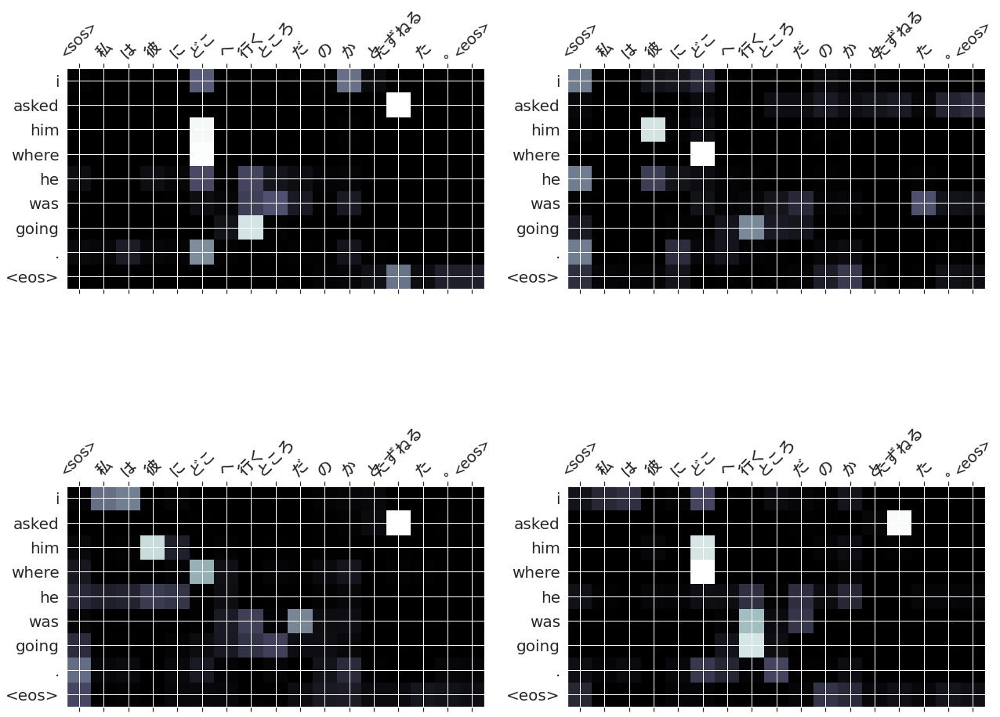

99
src      : 私 は すぐ に 医者 を 呼ぶ に やる ない ば なる ない 。
trg      : i must send for the doctor at once .
predicted: i must send for the doctor at once . <eos>
     blue: 100.00%


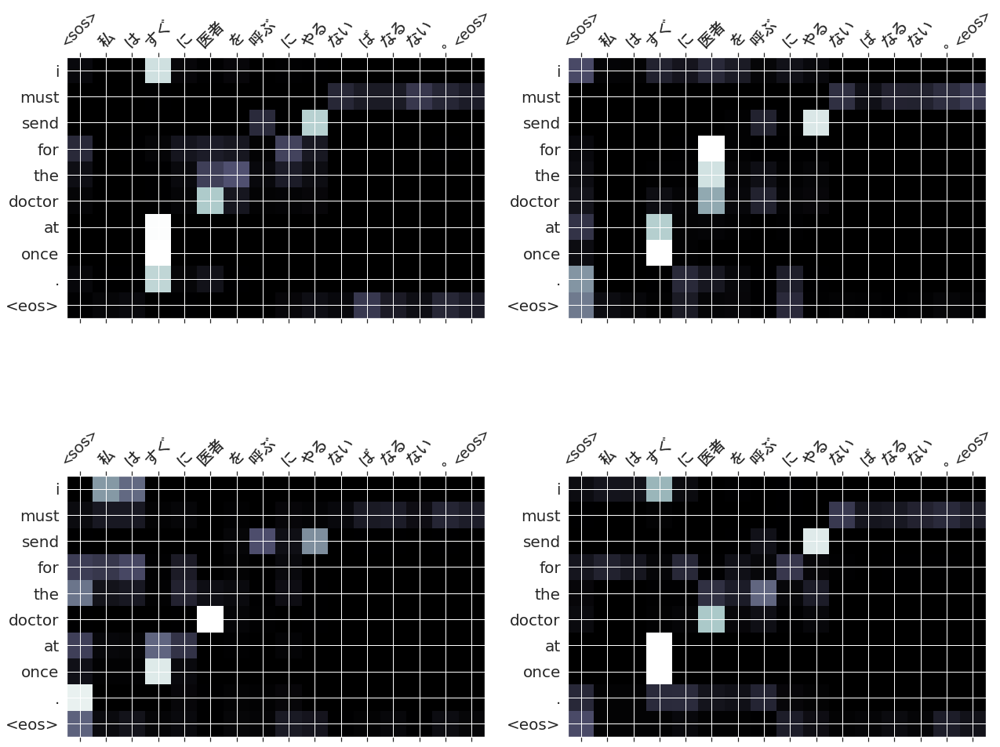

100
src      : 今年 の クリスマス は 日曜日 に あたる 。
trg      : christmas falls on sunday this year .
predicted: christmas falls on sunday this year . <eos>
     blue: 100.00%


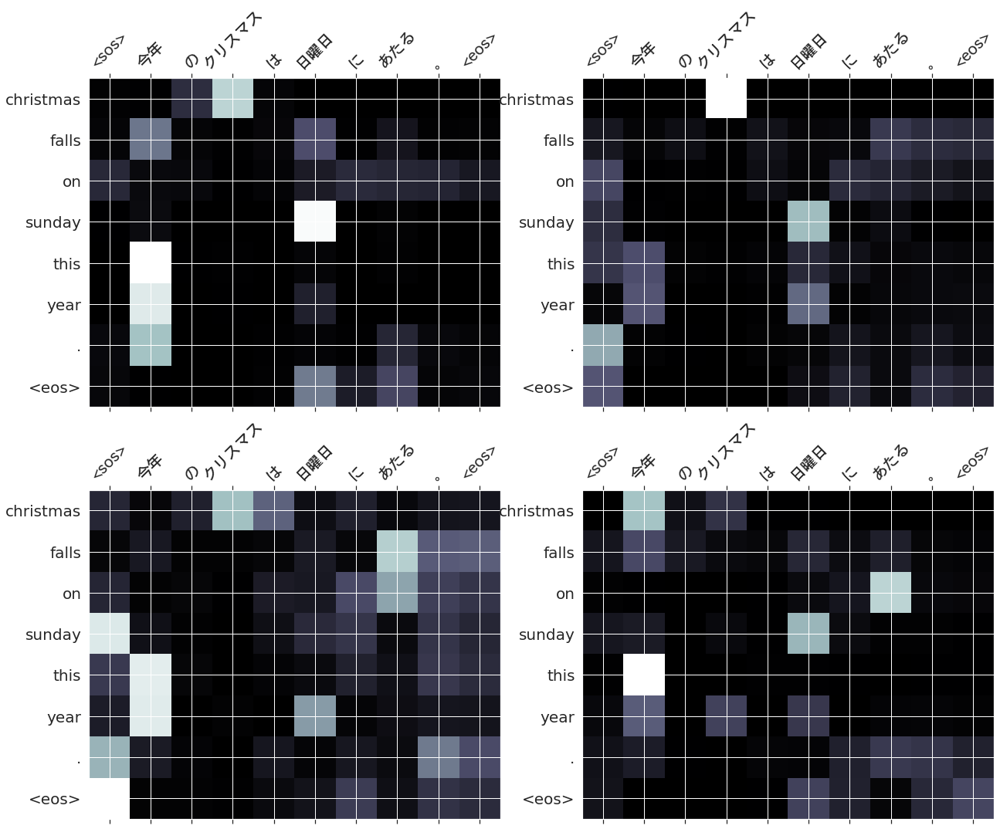

101
src      : 彼 が 言う た こと を あなた は 信じる ます か 。
trg      : do you believe what he said ?
predicted: do you believe what he said ? <eos>
     blue: 100.00%


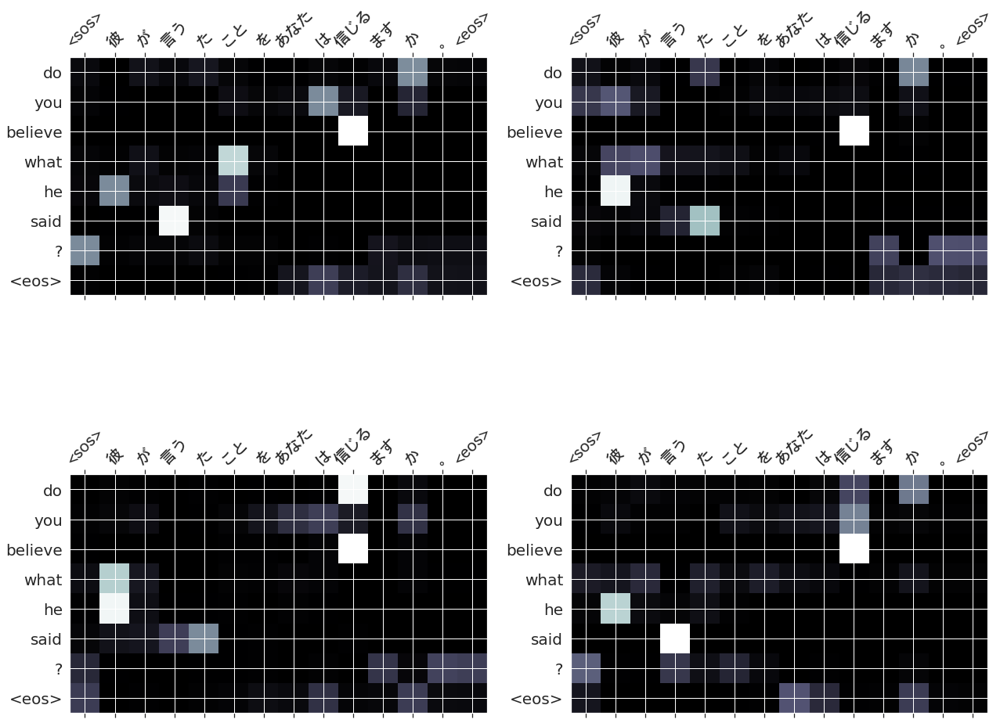

102
src      : 雨 は 四 日間 降り続く た 。
trg      : the rain lasted four days .
predicted: the rain lasted four days . <eos>
     blue: 100.00%


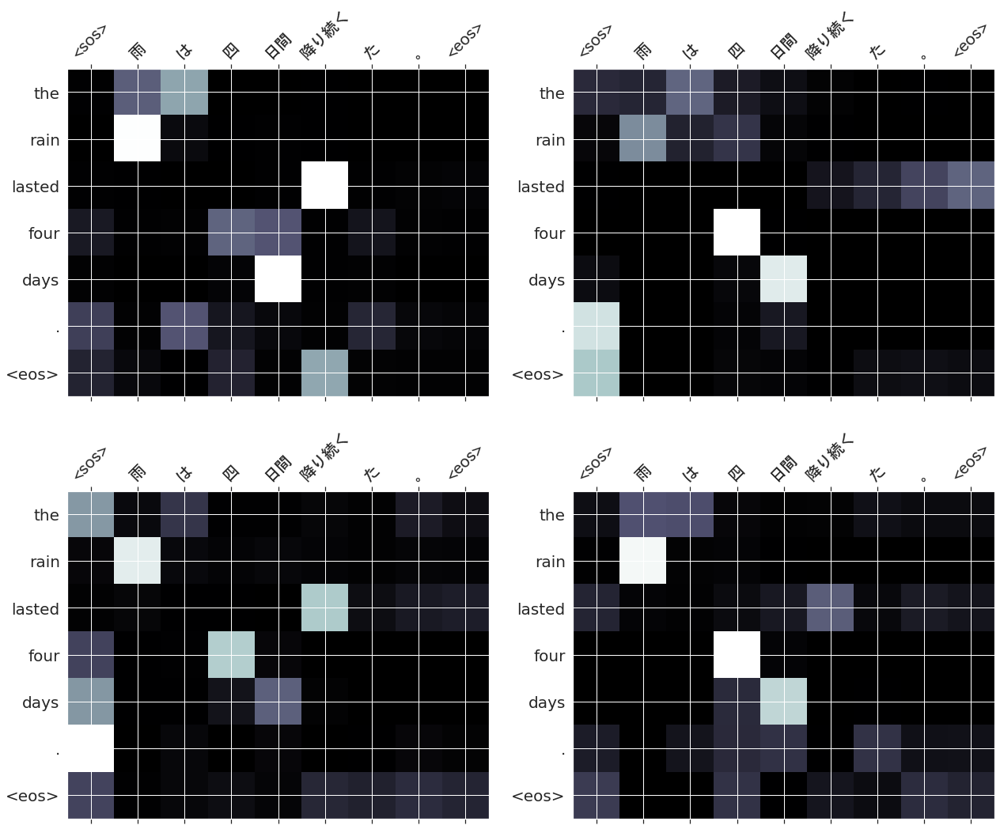

103
src      : 私 の 父 は 英語 と 同様 に フランス語 も 話せる 。
trg      : my father can speak french as well as english .
predicted: my father can speak french as well as english . <eos>
     blue: 100.00%


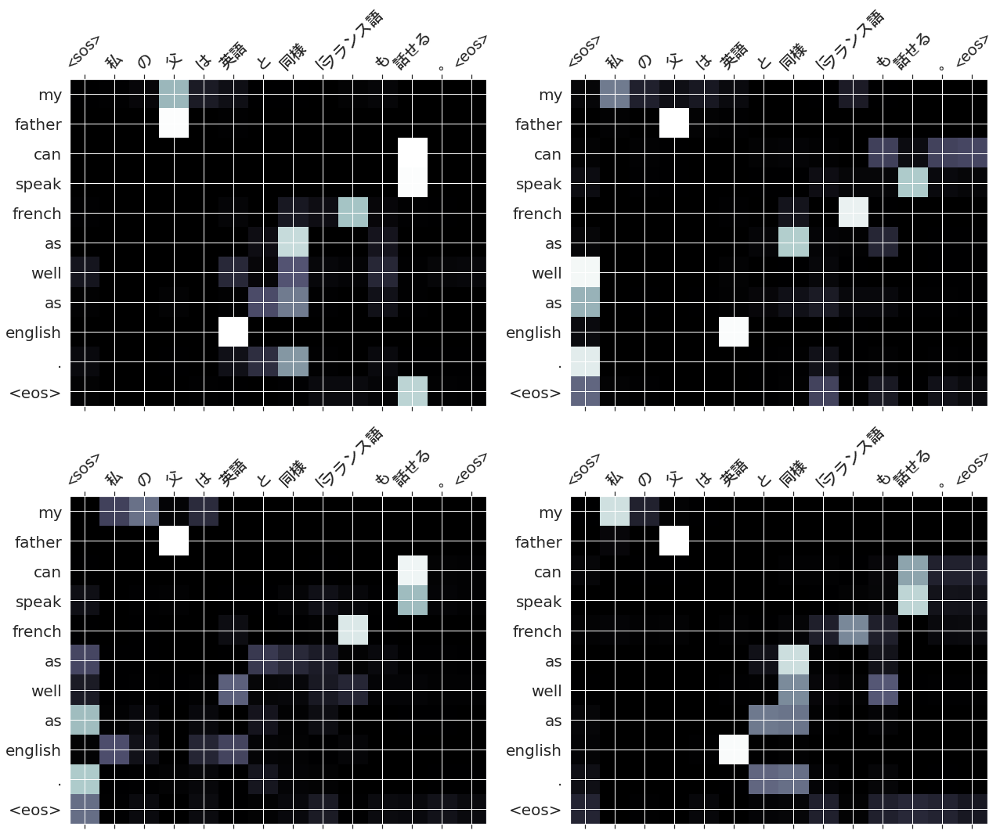

104
src      : あなた は 馬 に 乗る こと が できる ます か 。
trg      : can you ride a horse ?
predicted: can you ride a horse ? <eos>
     blue: 100.00%


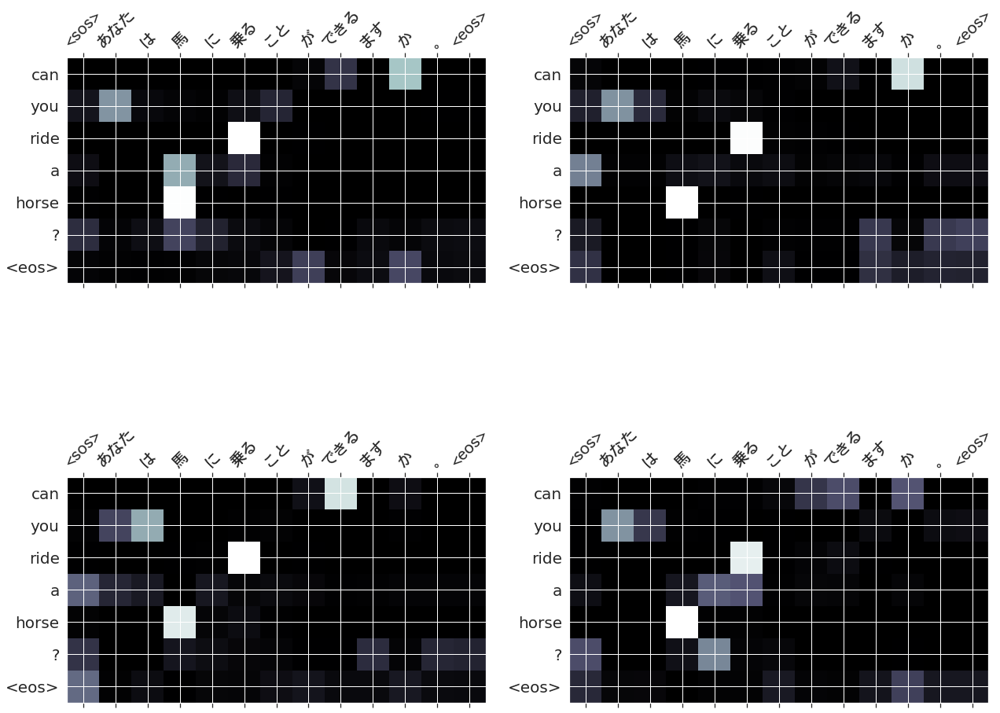

105
src      : その 音 で 私 は 目覚める た 。
trg      : the noise woke me .
predicted: the noise woke me . <eos>
     blue: 100.00%


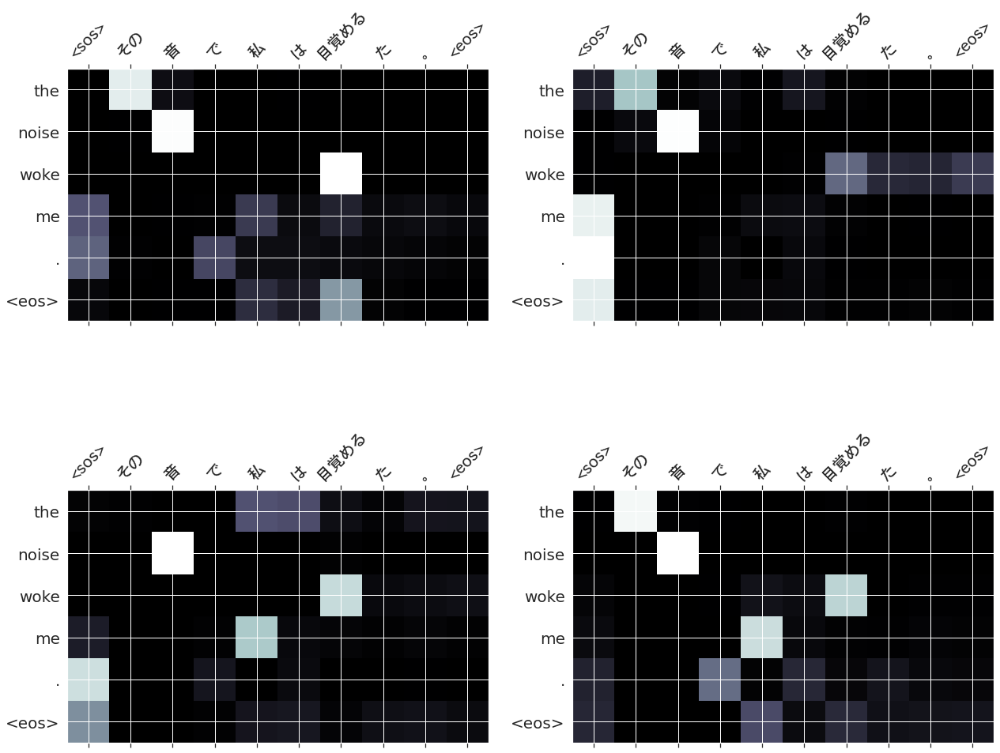

106
src      : 私 は 棚 から 本 を とる た 。
trg      : i took a book from the shelf .
predicted: i took a book from the shelf . <eos>
     blue: 100.00%


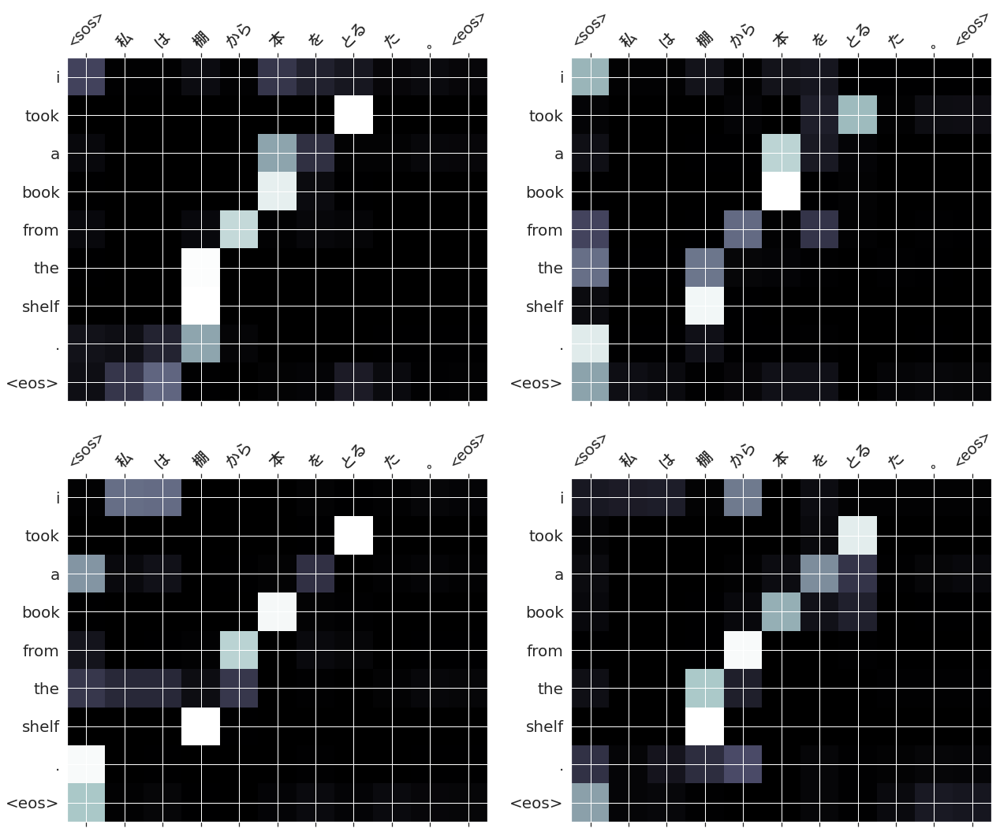

107
src      : それ は 高い ない た 。
trg      : it was n't expensive .
predicted: it was n't expensive . <eos>
     blue: 100.00%


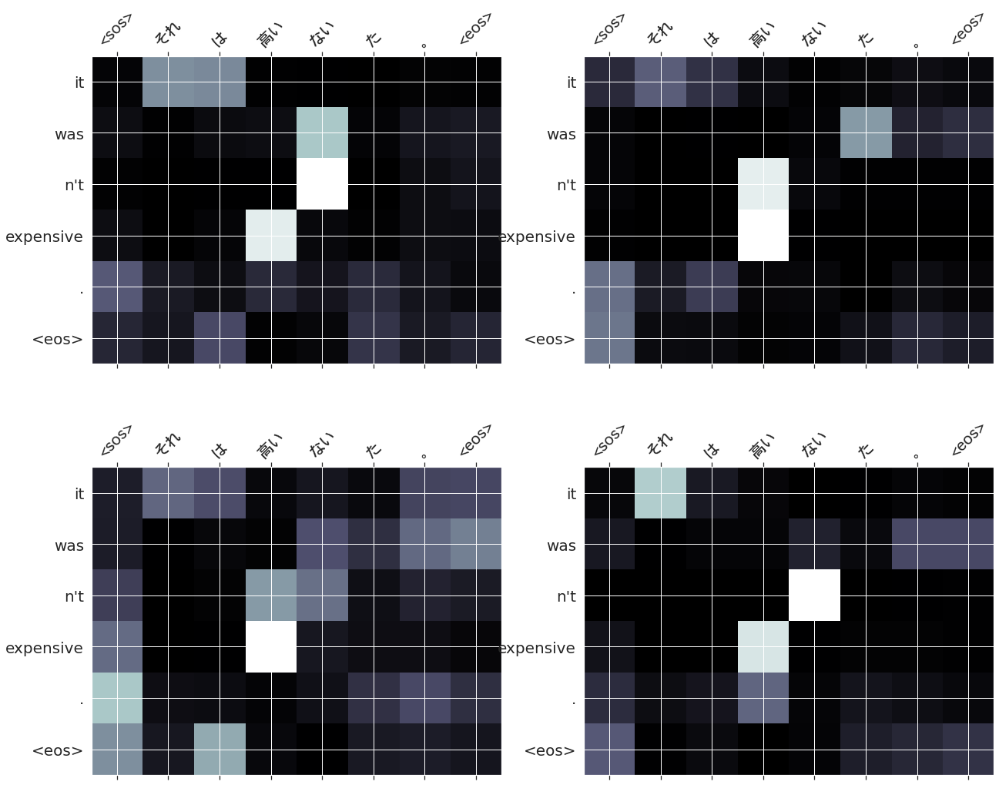

108
src      : 部屋 は 煙 で いっぱい だ た 。
trg      : the room was full of smoke .
predicted: the room was full of smoke . <eos>
     blue: 100.00%


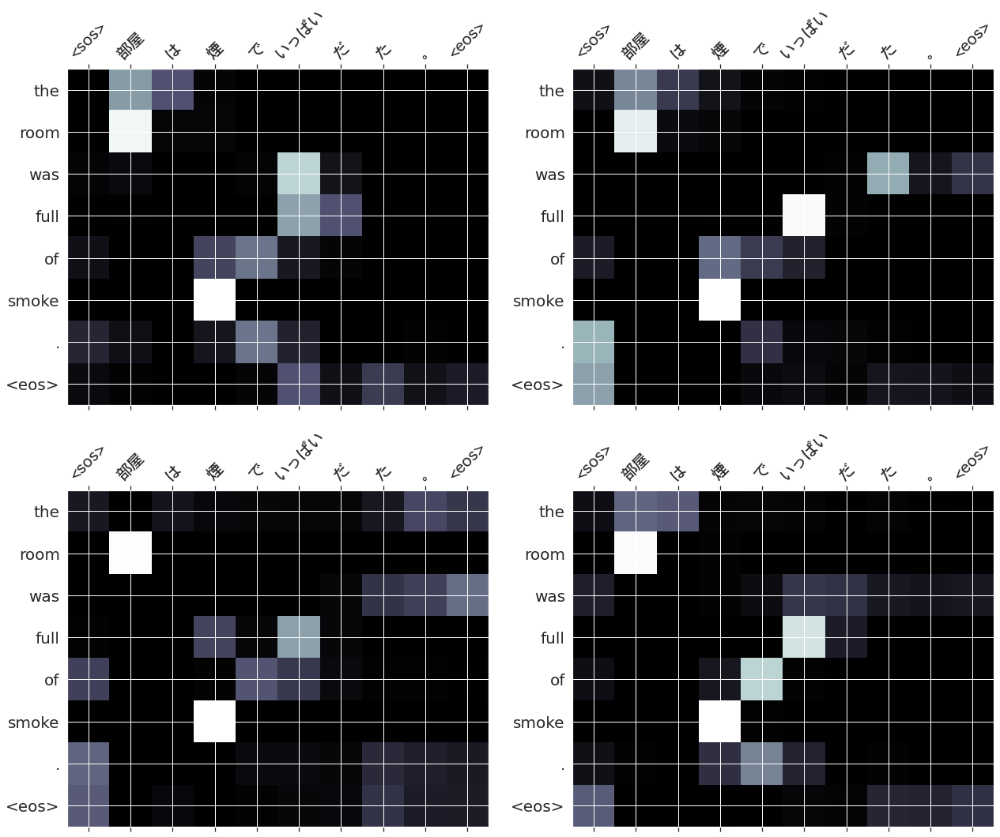

109
src      : 朝 早い 起きる なさる 。
trg      : get up early in the morning .
predicted: get up early in the morning . <eos>
     blue: 100.00%


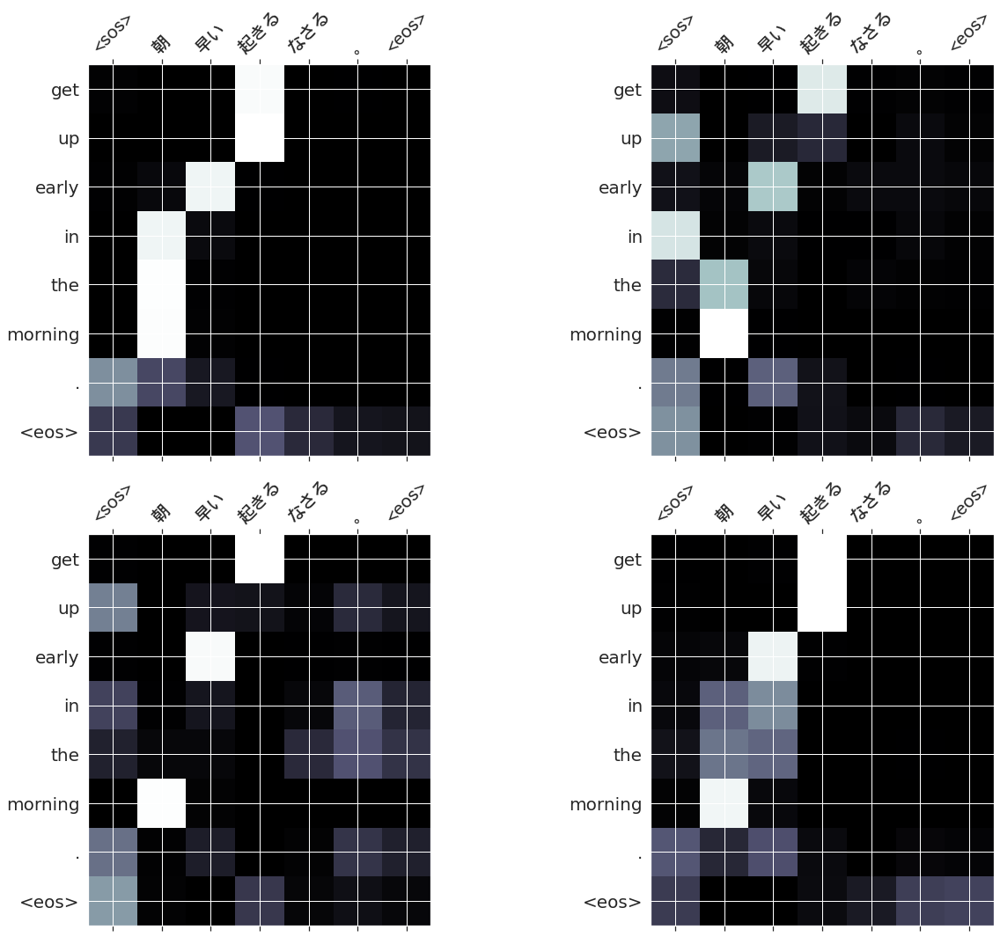

110
src      : お金 が 幸福 を もたらす と は 限る ない 。
trg      : money does not always bring happiness .
predicted: money does not always bring happiness . <eos>
     blue: 100.00%


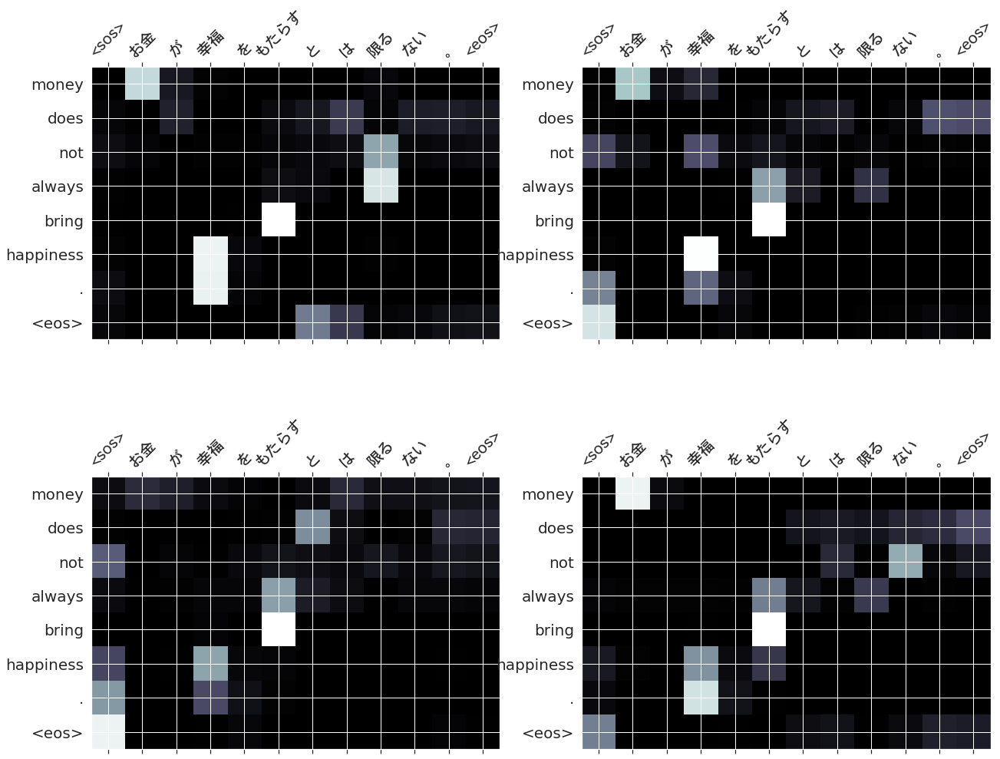

111
src      : あなた は その 窓 を 開ける て も よい 。
trg      : you may open the window .
predicted: you may open the window . <eos>
     blue: 100.00%


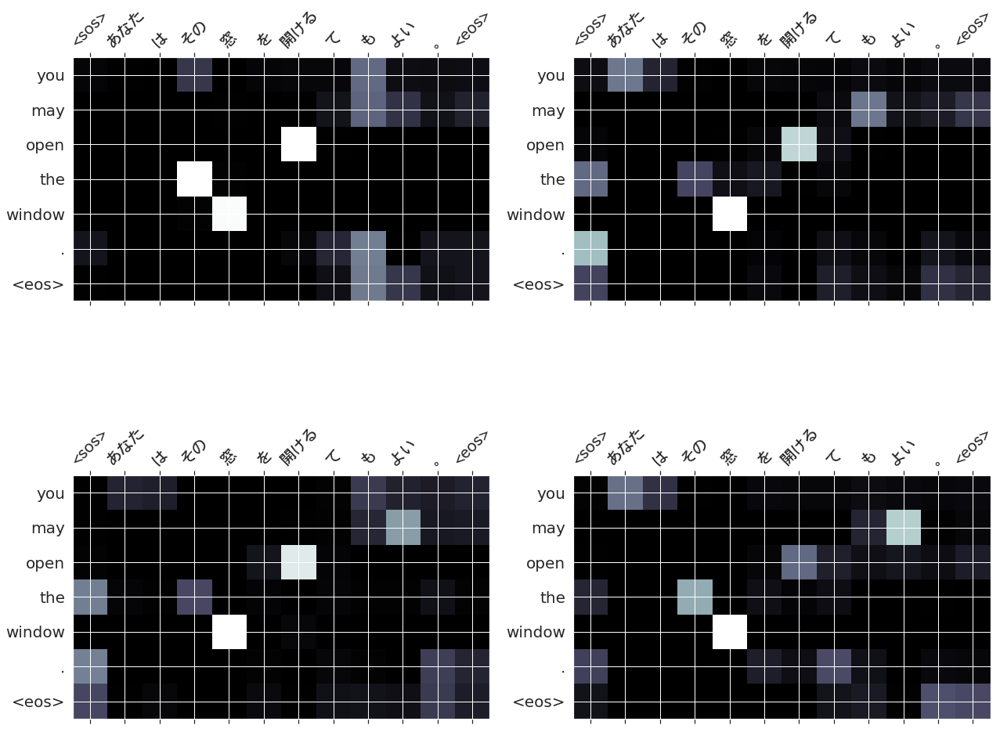

112
src      : その 男 は ２ 本 の 電線 を つなぐ だ 。
trg      : the man connected two wires .
predicted: the man connected two wires . <eos>
     blue: 100.00%


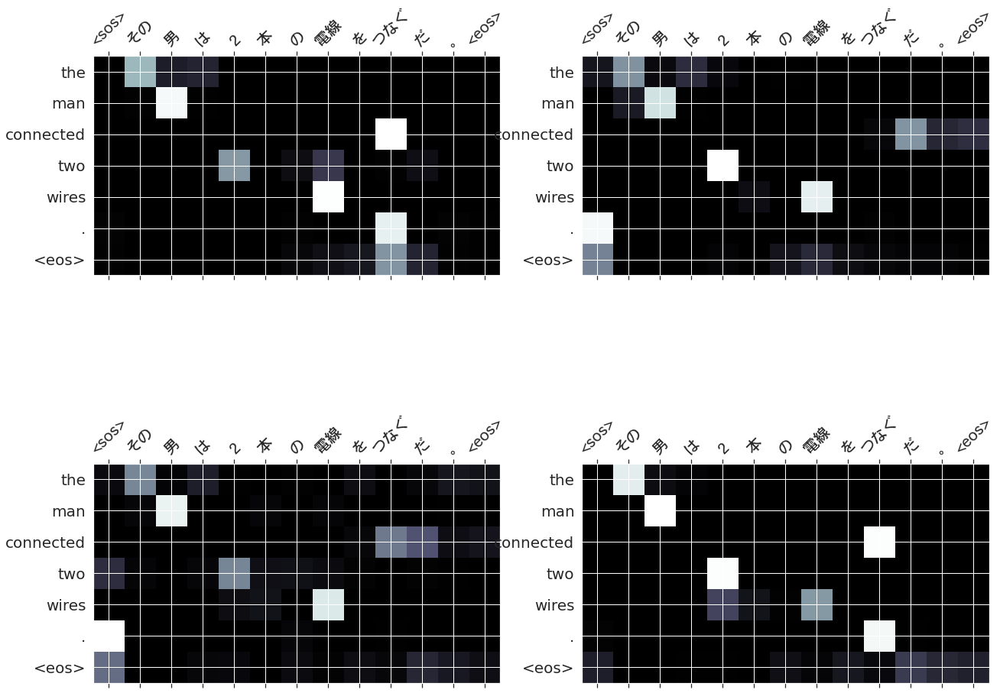

113
src      : 私 は メアリー が 外国 へ 行く た こと を 知る て いる 。
trg      : i know that mary went abroad .
predicted: i know that mary went abroad . <eos>
     blue: 100.00%


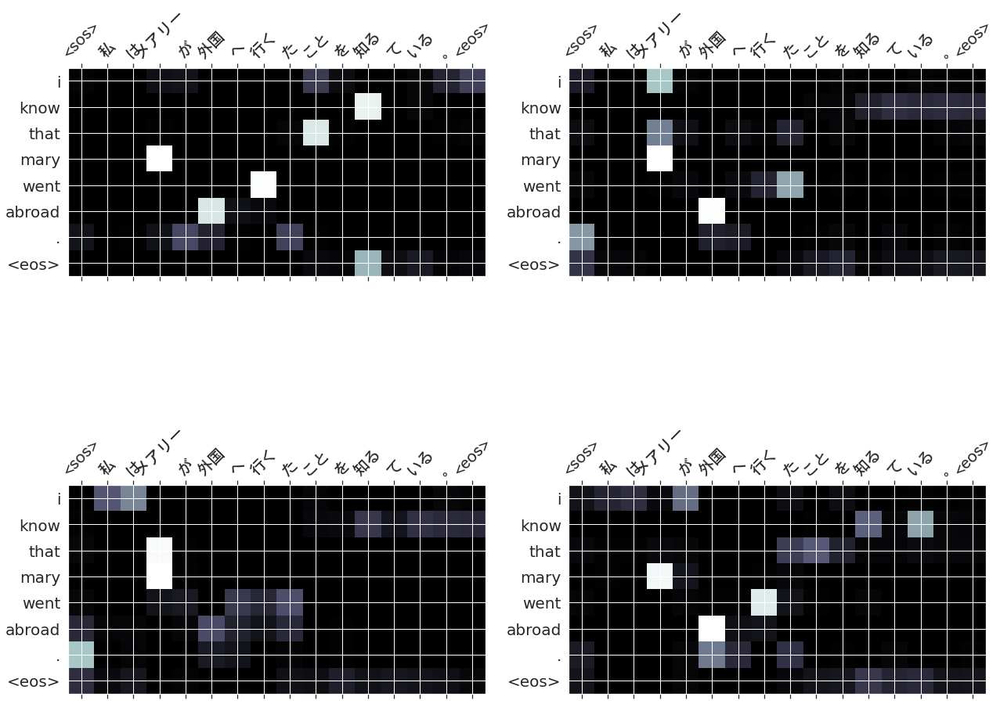

114
src      : まったく ひどい 日 だ た わ 。
trg      : it was a terrible day .
predicted: it was a terrible day . <eos>
     blue: 100.00%


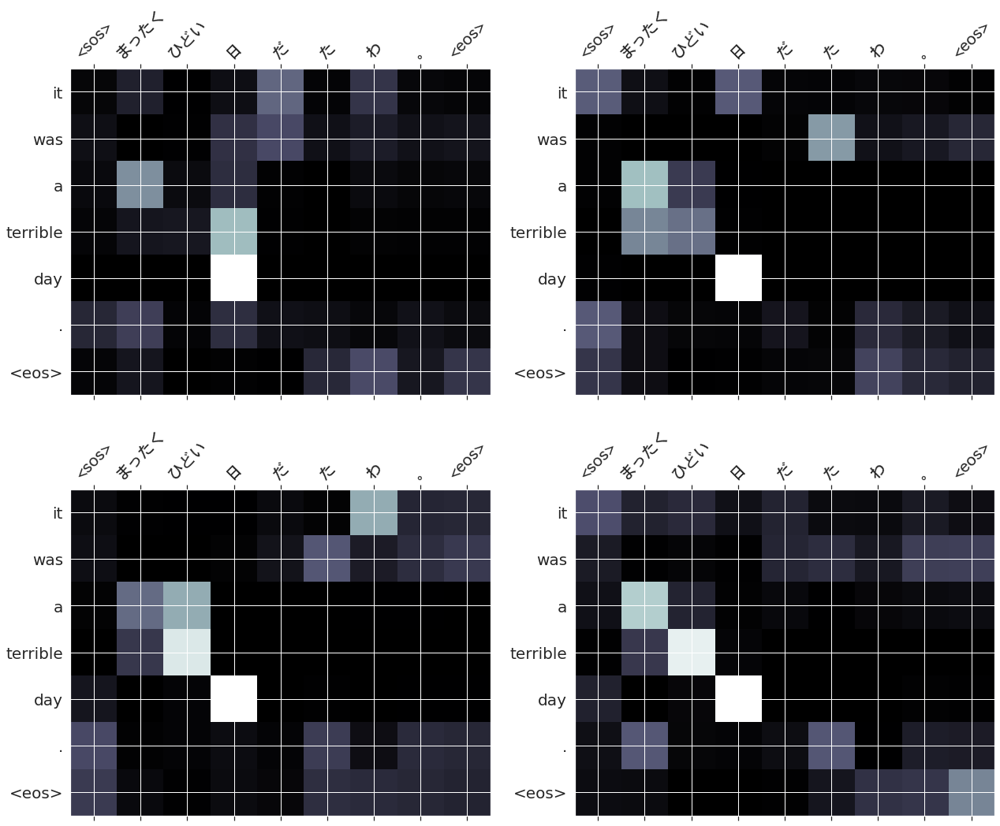

115
src      : 彼 は 私 と 同じ カメラ を 持つ て いる 。
trg      : he has the same camera as i have .
predicted: he has the same camera as i have . <eos>
     blue: 100.00%


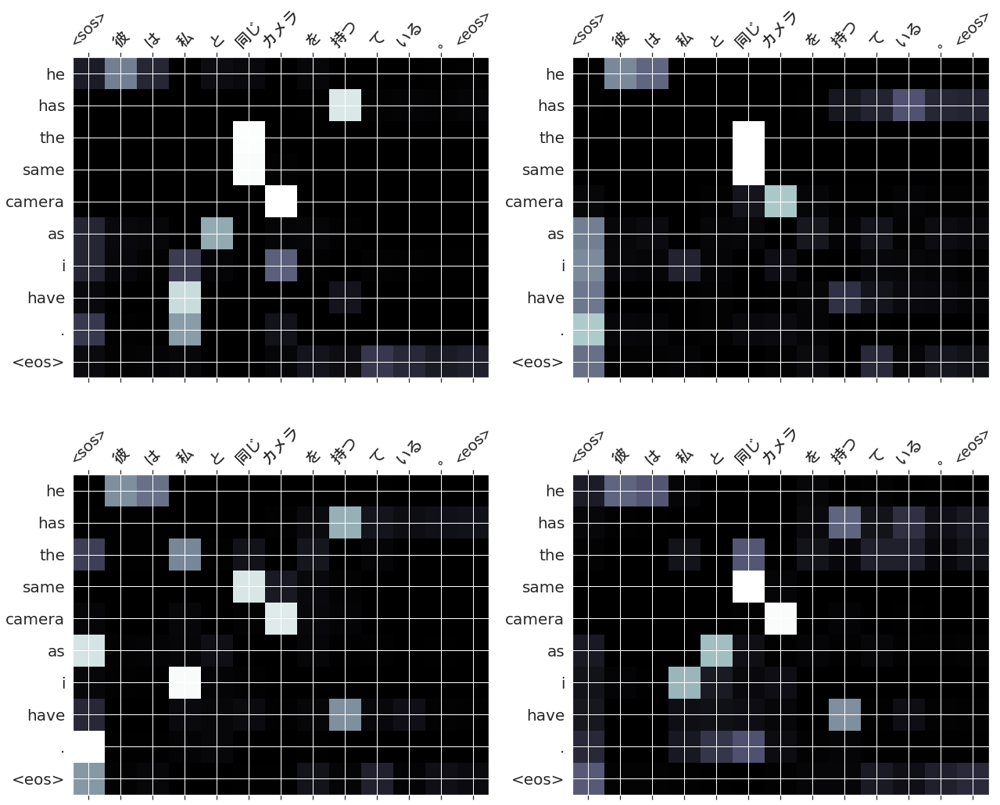

116
src      : 病気 の ため ジェーン は 学校 に 行ける ます ん です た 。
trg      : illness prevented jane from going to school .
predicted: illness prevented jane from going to school . <eos>
     blue: 100.00%


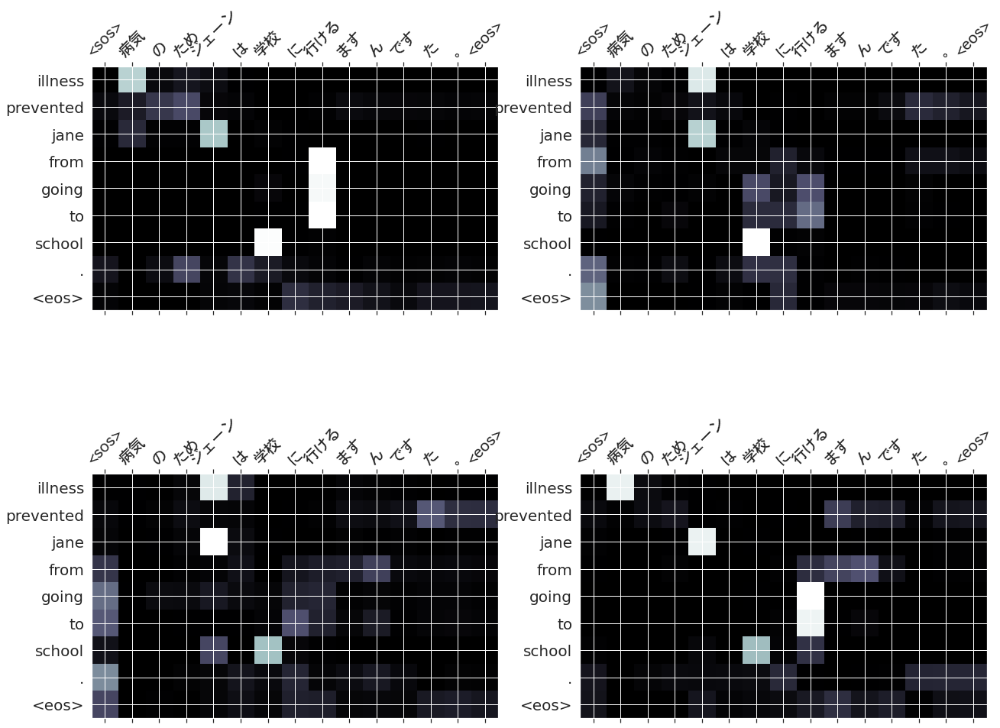

117
src      : 土壇場 で 言葉 が 旨い 言える ない た 。
trg      : words failed me at the last minute .
predicted: words failed me at the last minute . <eos>
     blue: 100.00%


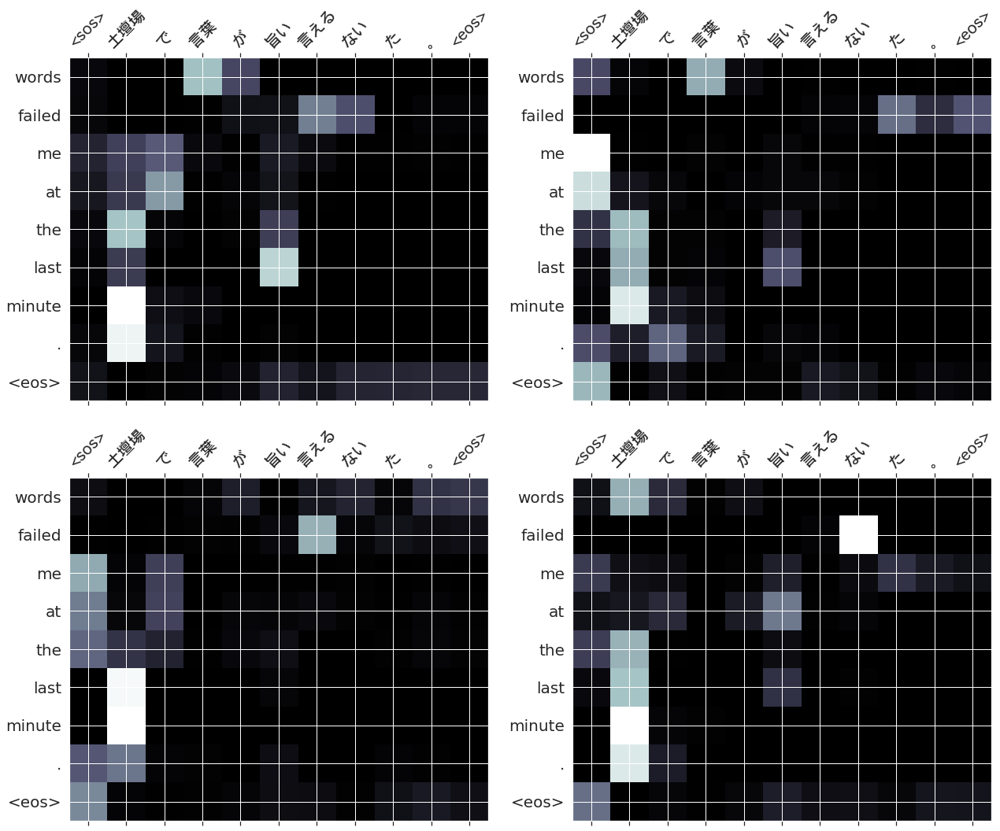

118
src      : ここ から 公園 まで ２ マイル ある ます 。
trg      : it is two miles from here to the park .
predicted: it is two miles from here to the park . <eos>
     blue: 100.00%


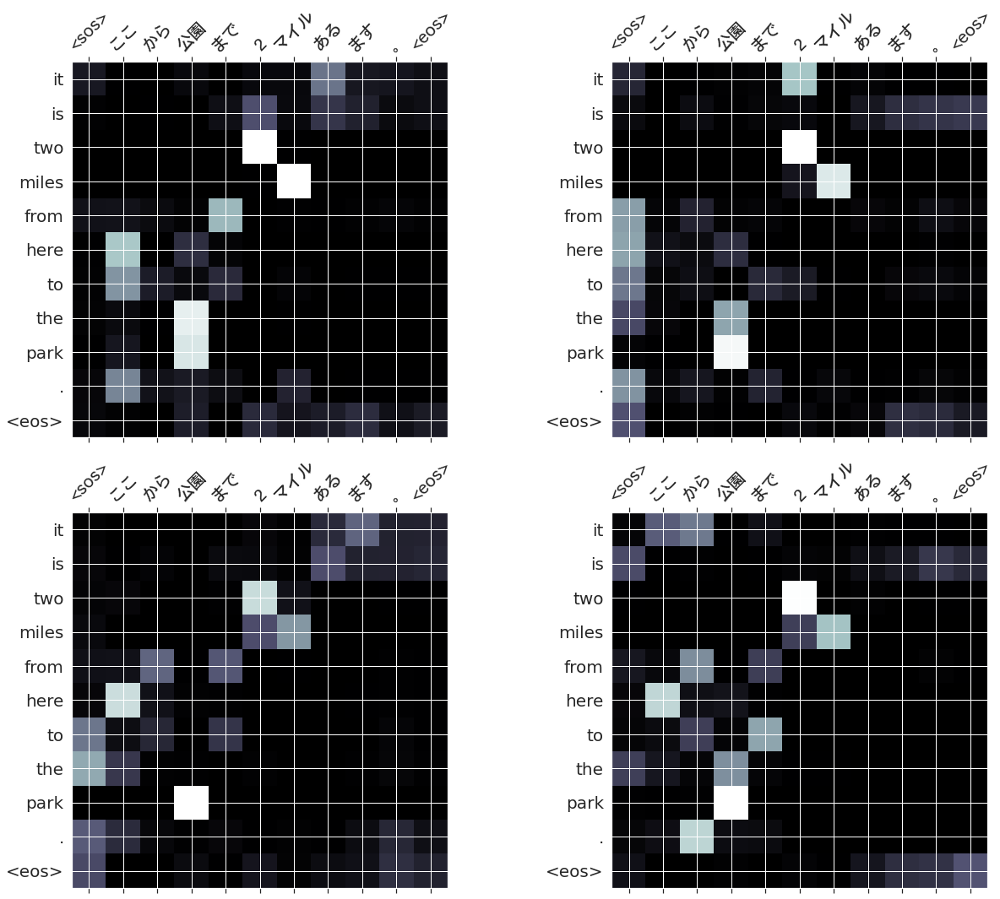

119
src      : 彼女 は 彼 に それ を 与える た 。
trg      : she gave it to him .
predicted: she gave it to him . <eos>
     blue: 100.00%


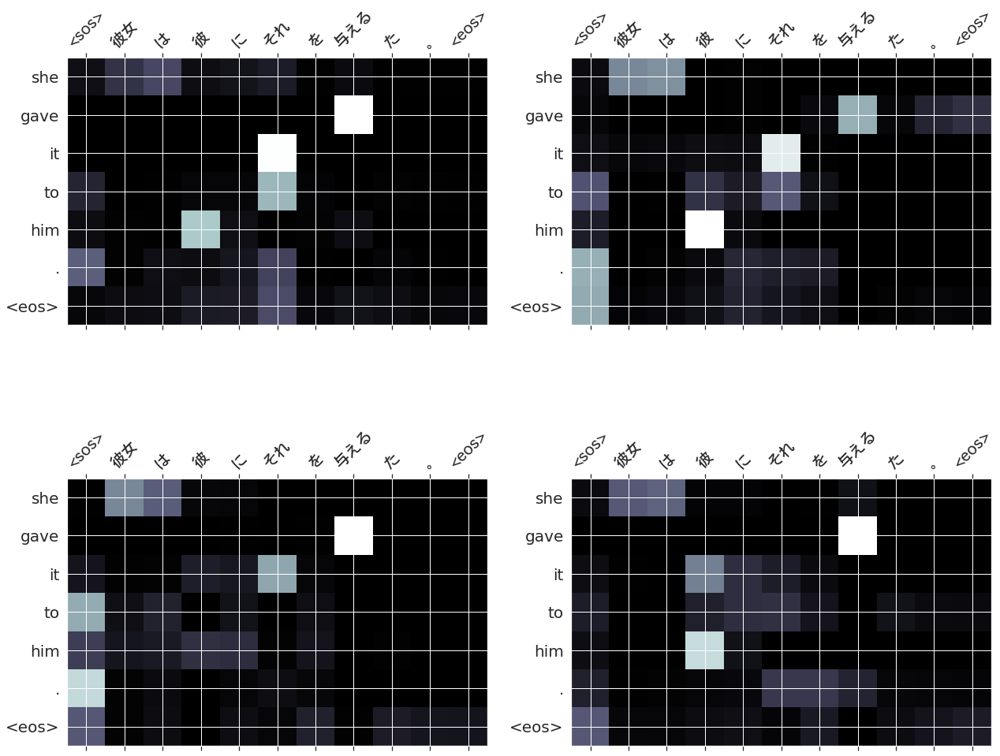

120
src      : 暴風 の ため 私 たち の 飛行機 は 離陸 できる ない た 。
trg      : the storm prevented our plane from taking off .
predicted: the storm prevented our plane from taking off . <eos>
     blue: 100.00%


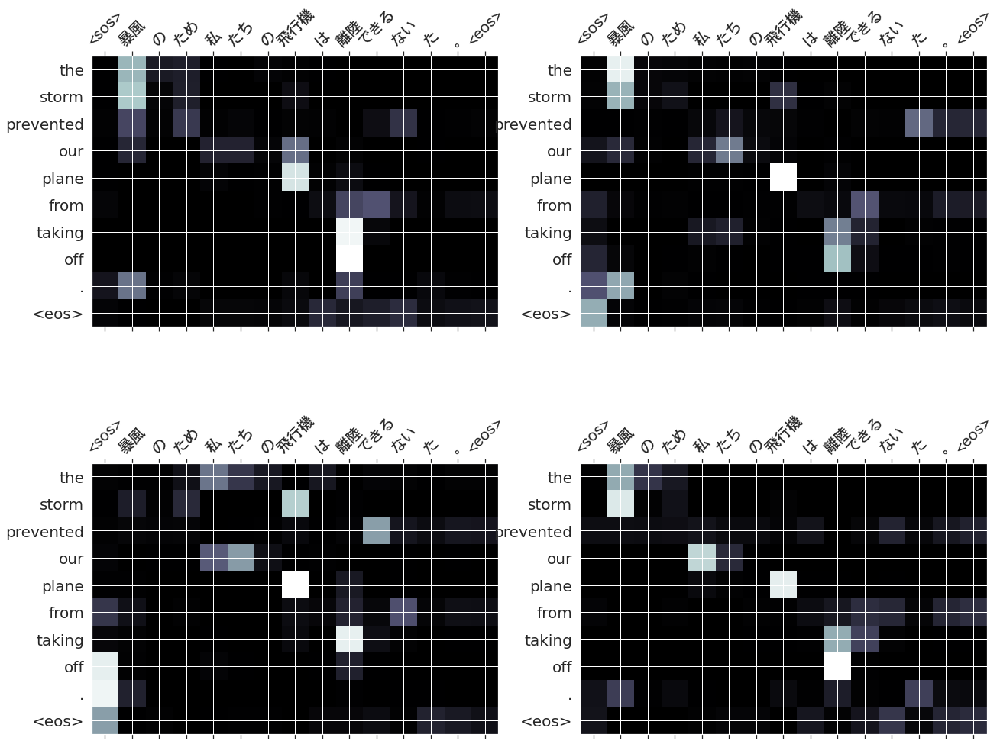

121
src      : 私 は 来月 、 仕事 で シドニー に 行く です う 。
trg      : i will go to sydney on business next month .
predicted: i will go to sydney on business next month . <eos>
     blue: 100.00%


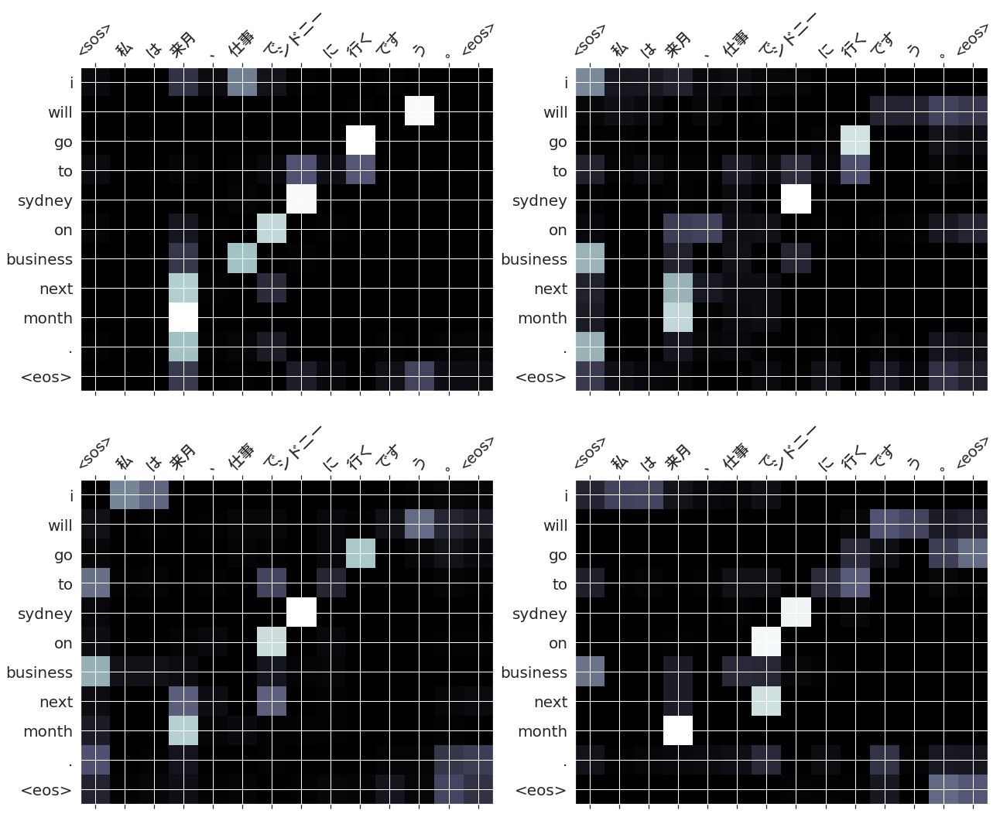

122
src      : 日曜 に 配達 する て いる ます か 。
trg      : do you deliver on sundays ?
predicted: do you deliver on sundays ? <eos>
     blue: 100.00%


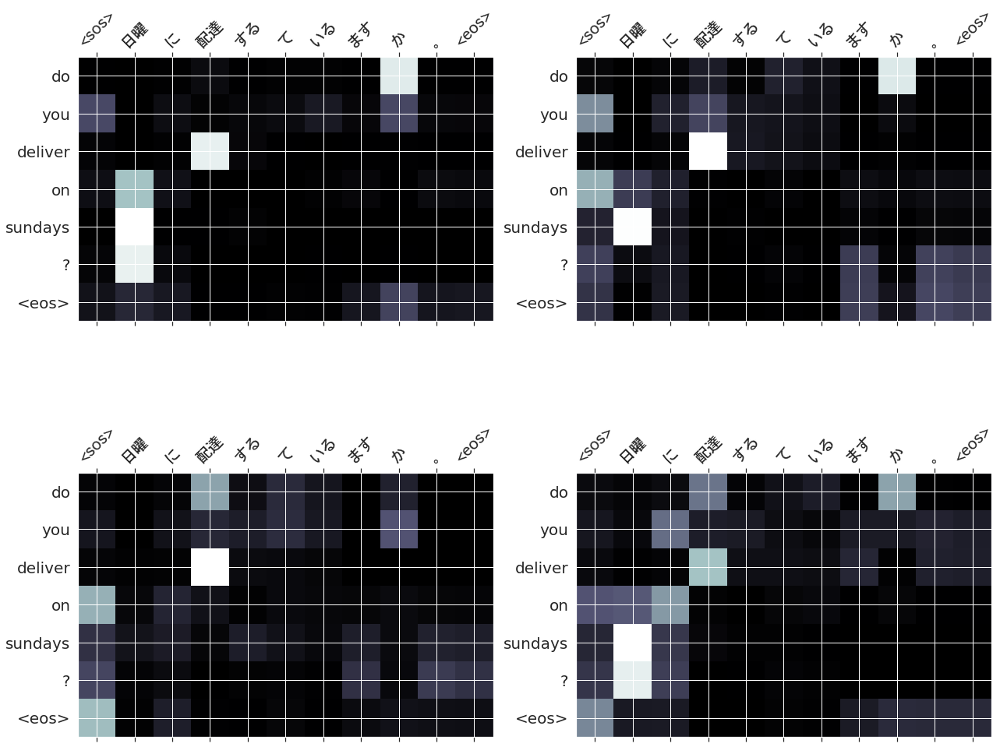

123
src      : 彼 は 私 と 同様 歌手 で は ない 。
trg      : he is no more a singer than i am .
predicted: he is no more a singer than i am . <eos>
     blue: 100.00%


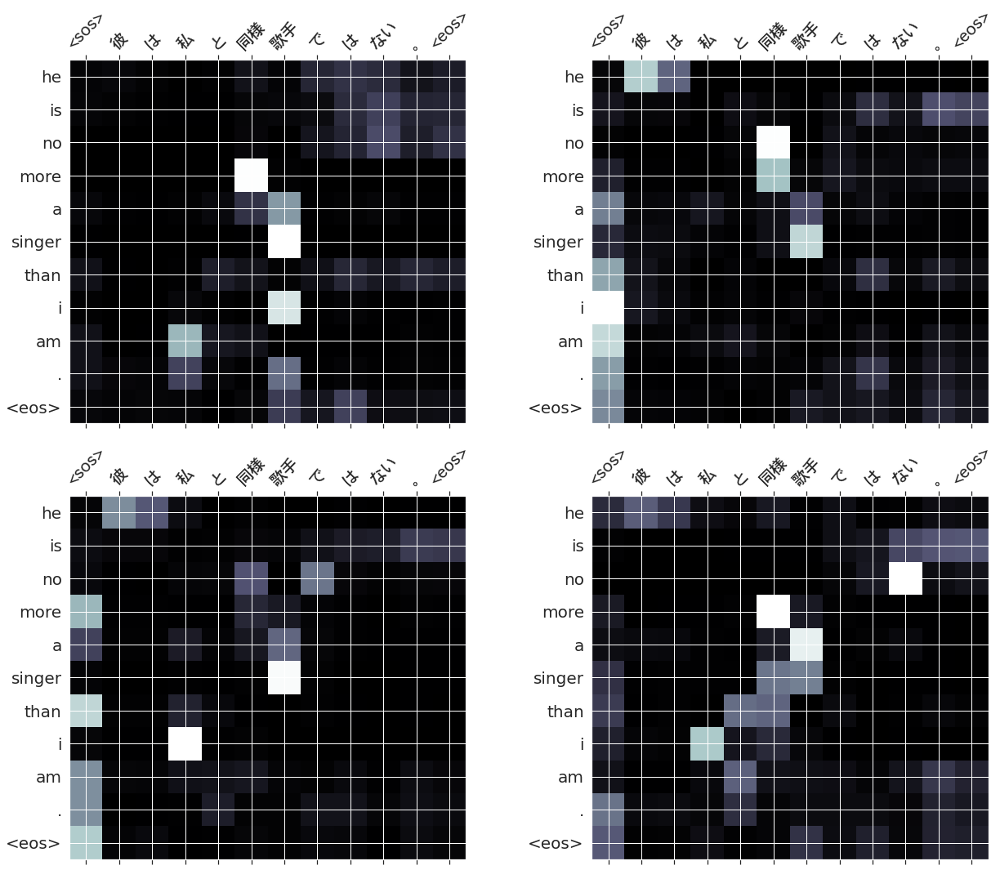

124
src      : 彼女 は やっと その ホテル に 着く た 。
trg      : she finally reached the hotel .
predicted: she finally reached the hotel . <eos>
     blue: 100.00%


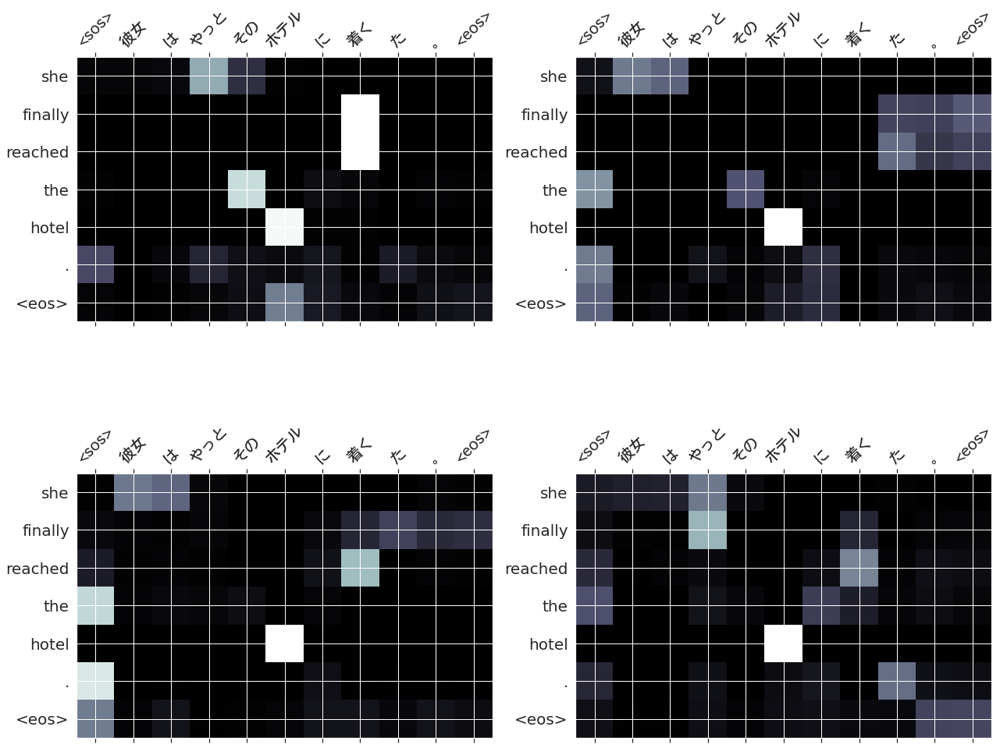

125
src      : この 靴 は 少し 緩い 。
trg      : these shoes are a little loose .
predicted: these shoes are a little loose . <eos>
     blue: 100.00%


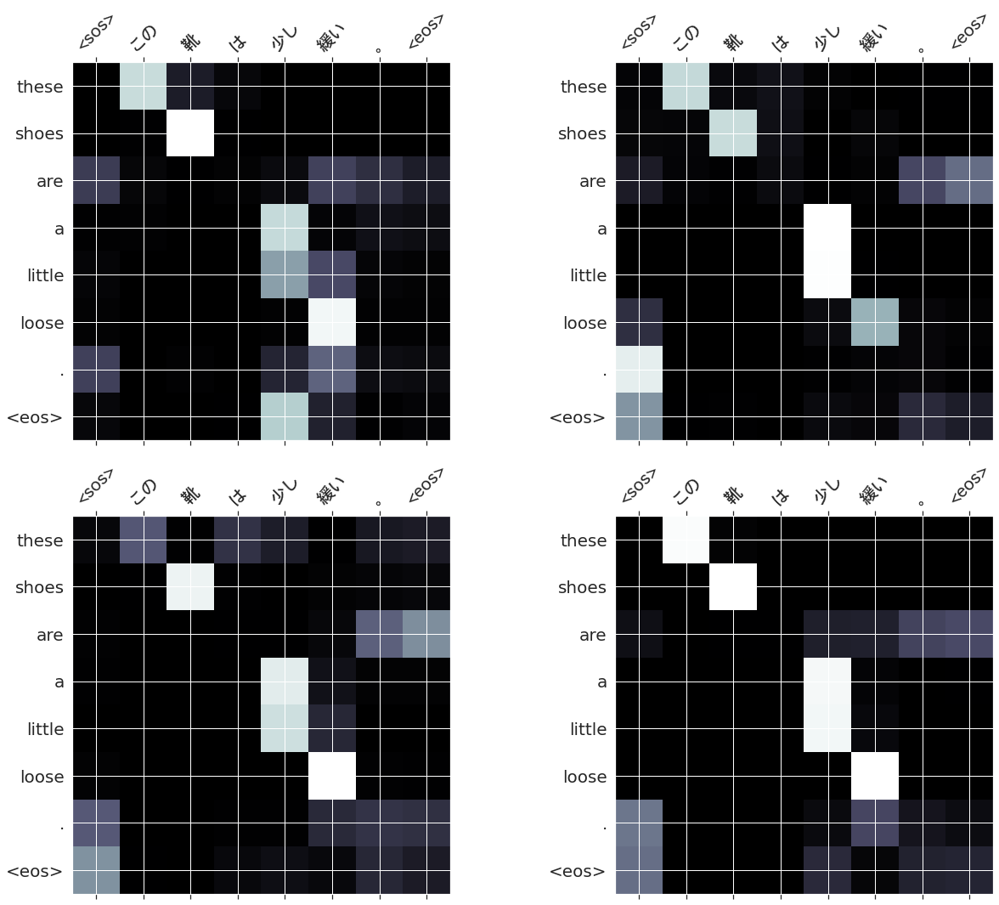

126
src      : 我々 は お互い に 身振り で 意思 を 伝える ある た 。
trg      : we communicated with each other by gesture .
predicted: we communicated with each other by gesture . <eos>
     blue: 100.00%


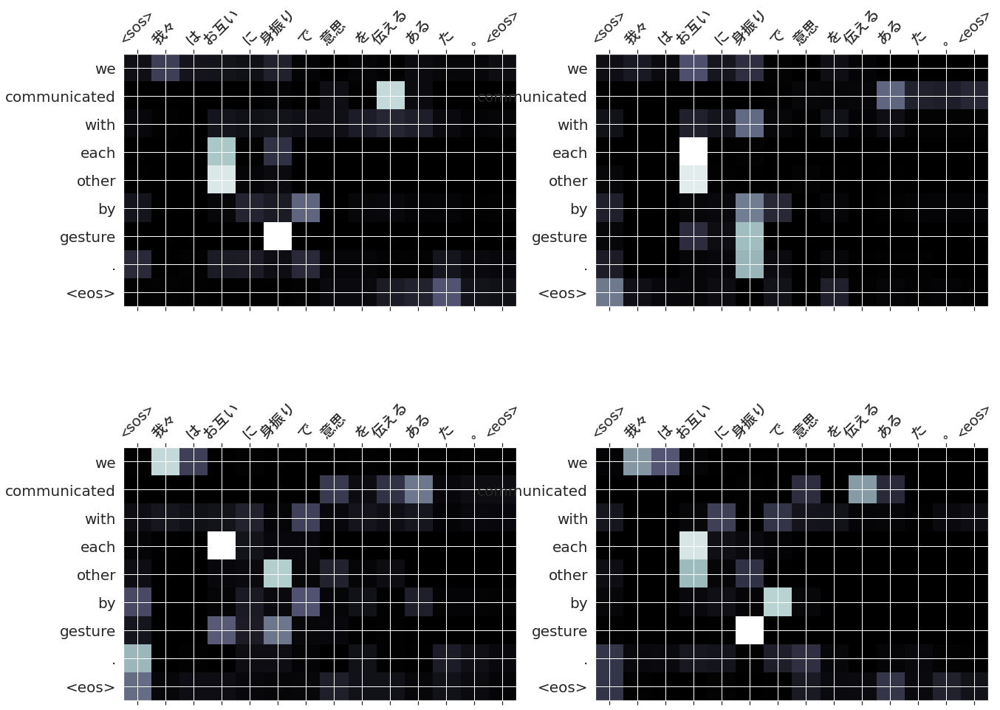

127
src      : 口 に 食物 を いっぱい 入れる て しゃべる な 。
trg      : do n't speak with your mouth full .
predicted: do n't speak with your mouth full . <eos>
     blue: 100.00%


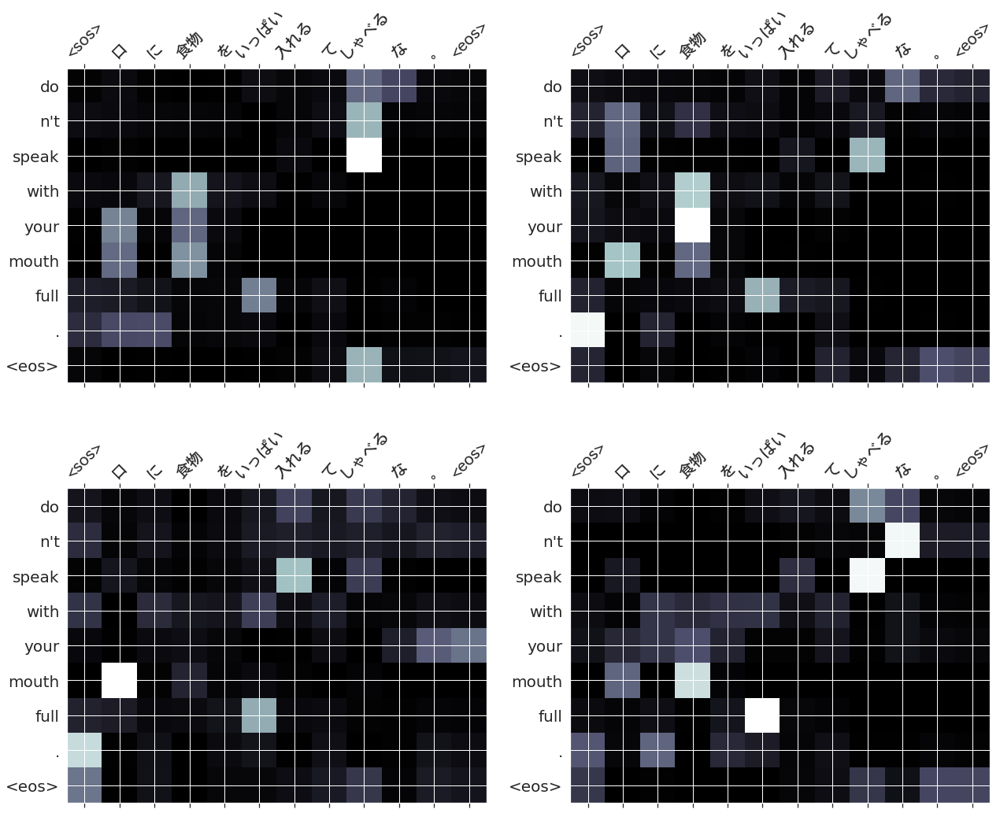

128
src      : 彼 は その 旅行 の ため に お金 を 貯める た 。
trg      : he saved money for the trip .
predicted: he saved money for the trip . <eos>
     blue: 100.00%


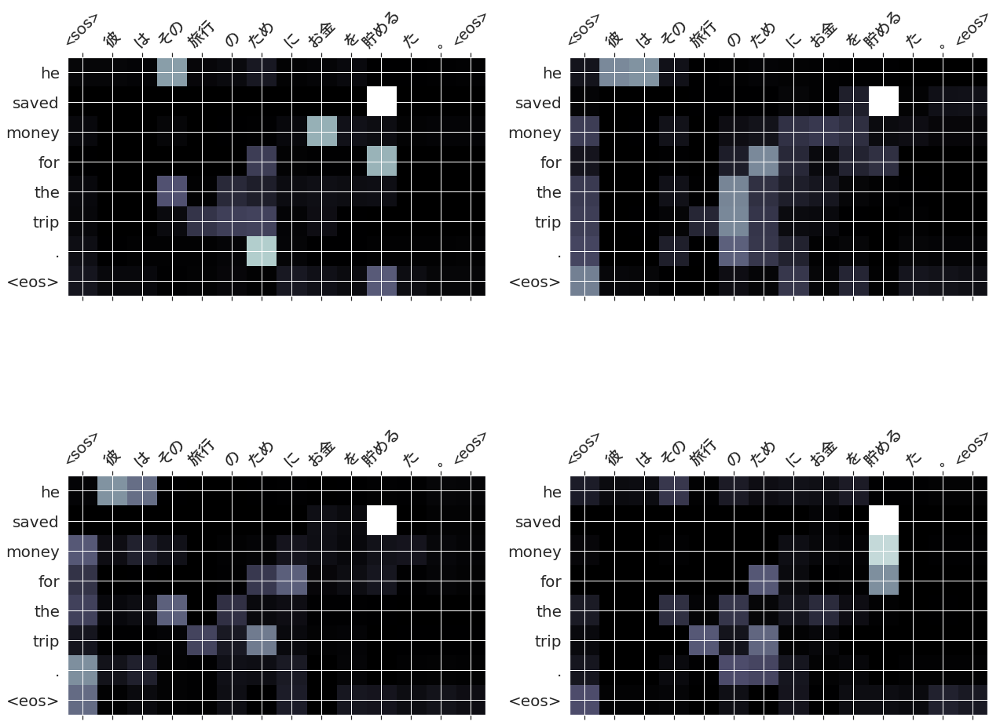

129
src      : 医者 は すぐ 手術 する こと に する た 。
trg      : the doctor decided to operate at once .
predicted: the doctor decided to operate at once . <eos>
     blue: 100.00%


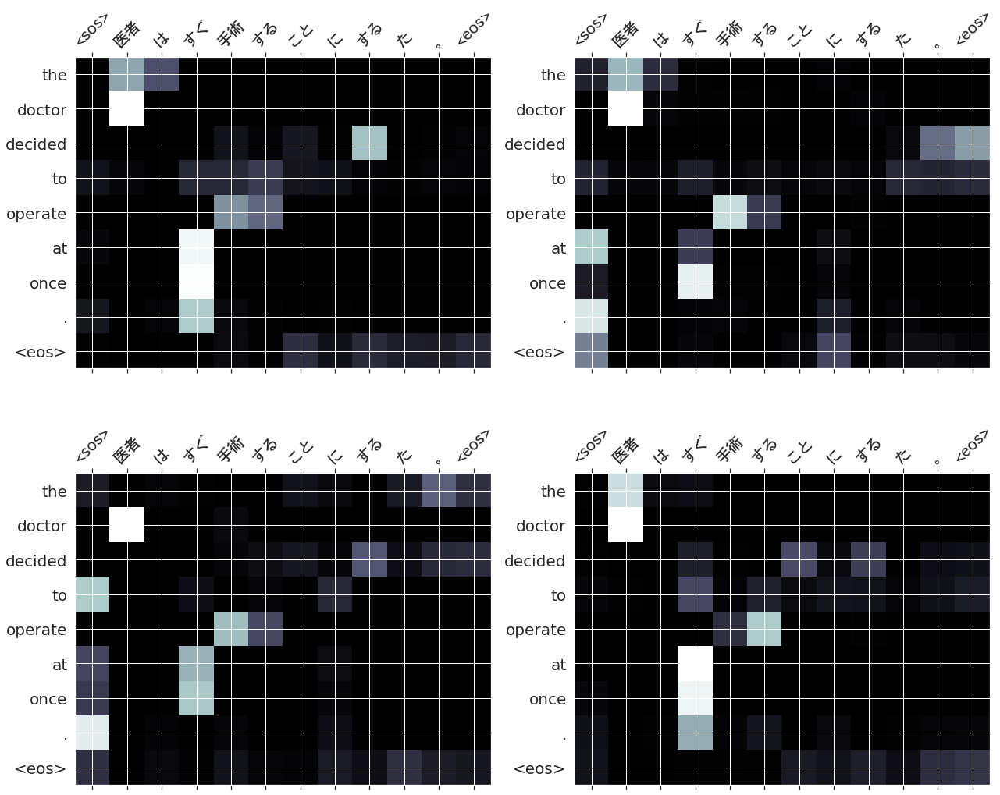

130
src      : 私 達 は 田舎 の 美しい さ を 保存 する べし だ 。
trg      : we should preserve the beauties of the countryside .
predicted: we should preserve the beauties of the countryside . <eos>
     blue: 100.00%


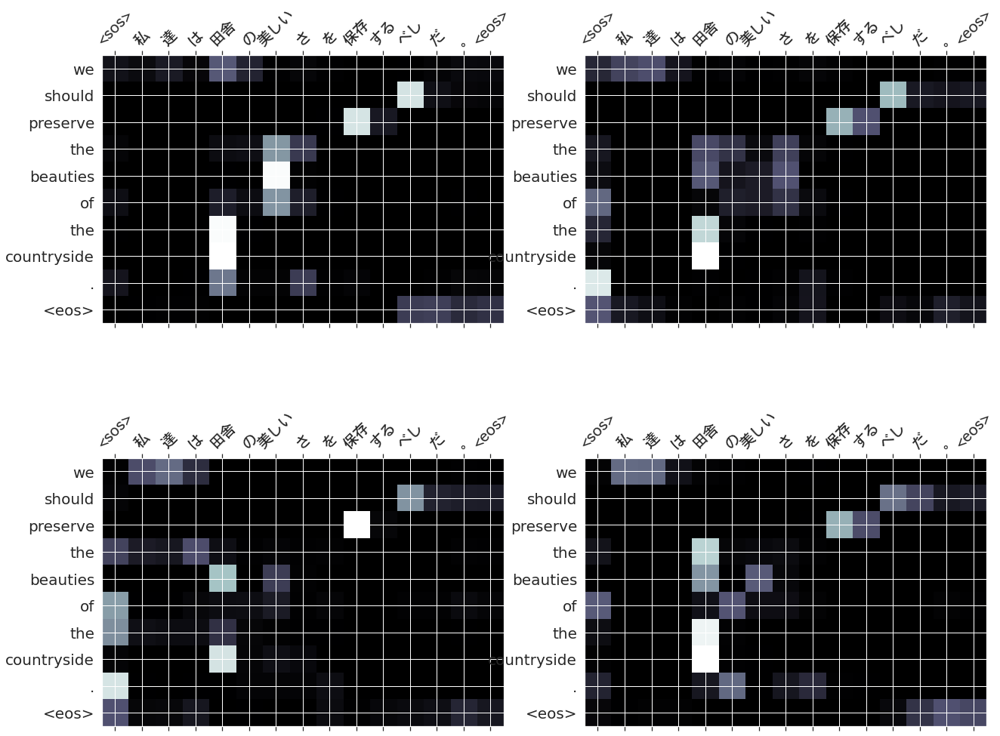

131
src      : こんな 美しい 日の入り を 見る た こと が ある ます か 。
trg      : have you ever seen such a beautiful sunset ?
predicted: have you ever seen such a beautiful sunset ? <eos>
     blue: 100.00%


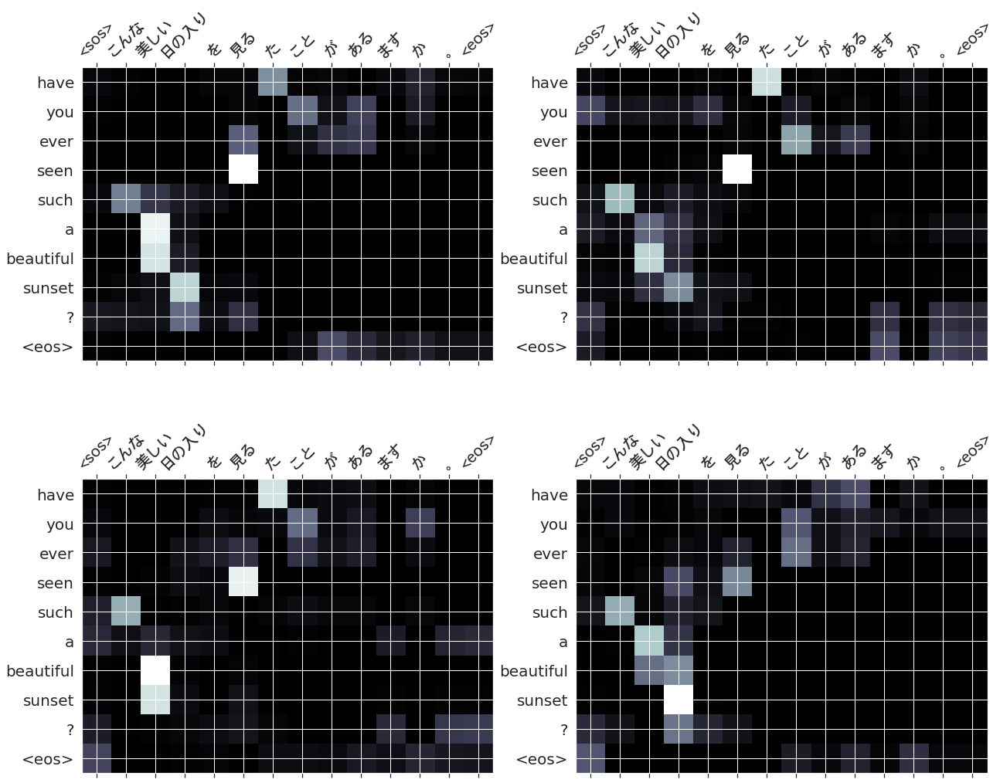

132
src      : 私 は 新入生 です 。
trg      : i am a new student .
predicted: i am a new student . <eos>
     blue: 100.00%


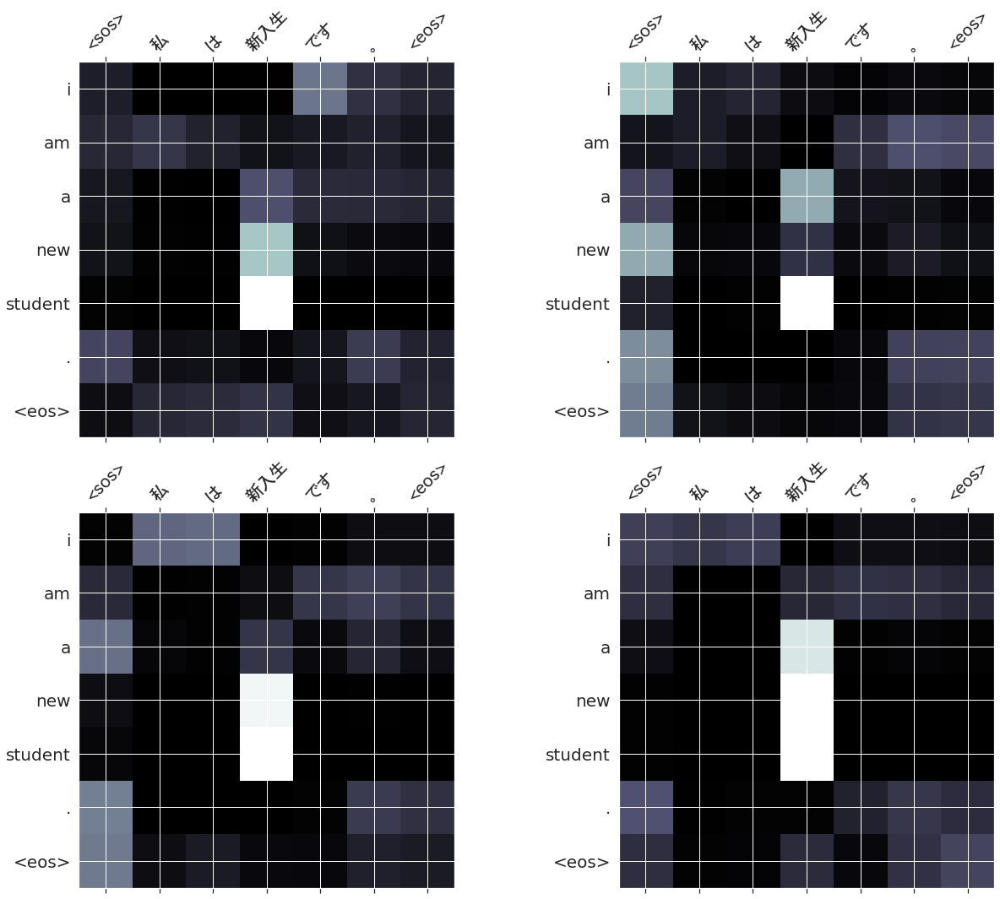

133
src      : ジュディー さん は 私 に 微笑む だ 。
trg      : judy smiled at me .
predicted: judy smiled at me . <eos>
     blue: 100.00%


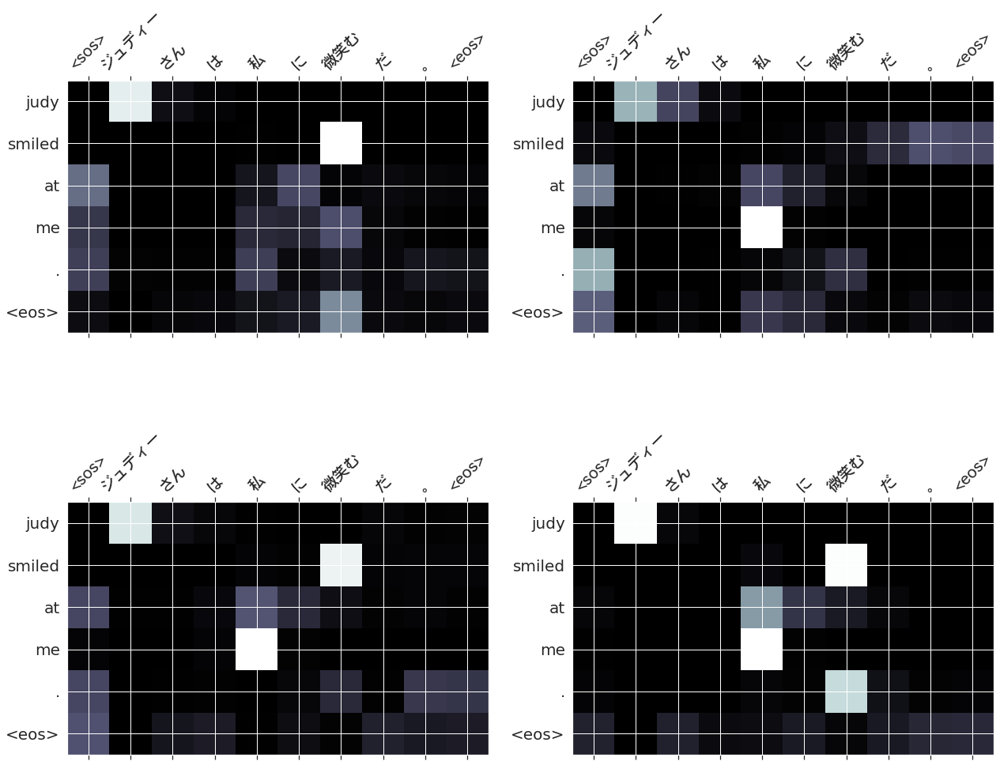

134
src      : 音楽 を 勉強 する ため に この 国 へ やってくる た 。
trg      : i came to this country for the purpose of studying music .
predicted: i came to this country for the purpose of studying music . <eos>
     blue: 100.00%


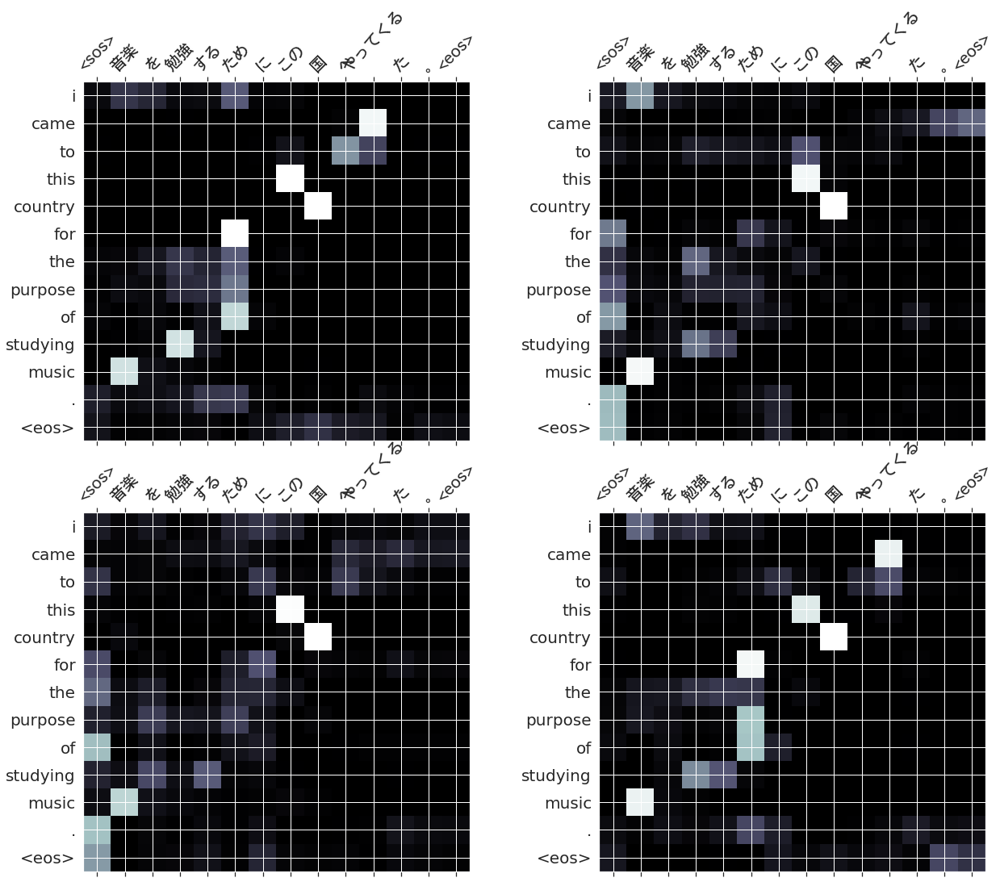

135
src      : フレッド は 怠け者 です 。
trg      : fred is a lazy fellow .
predicted: fred is a lazy fellow . <eos>
     blue: 100.00%


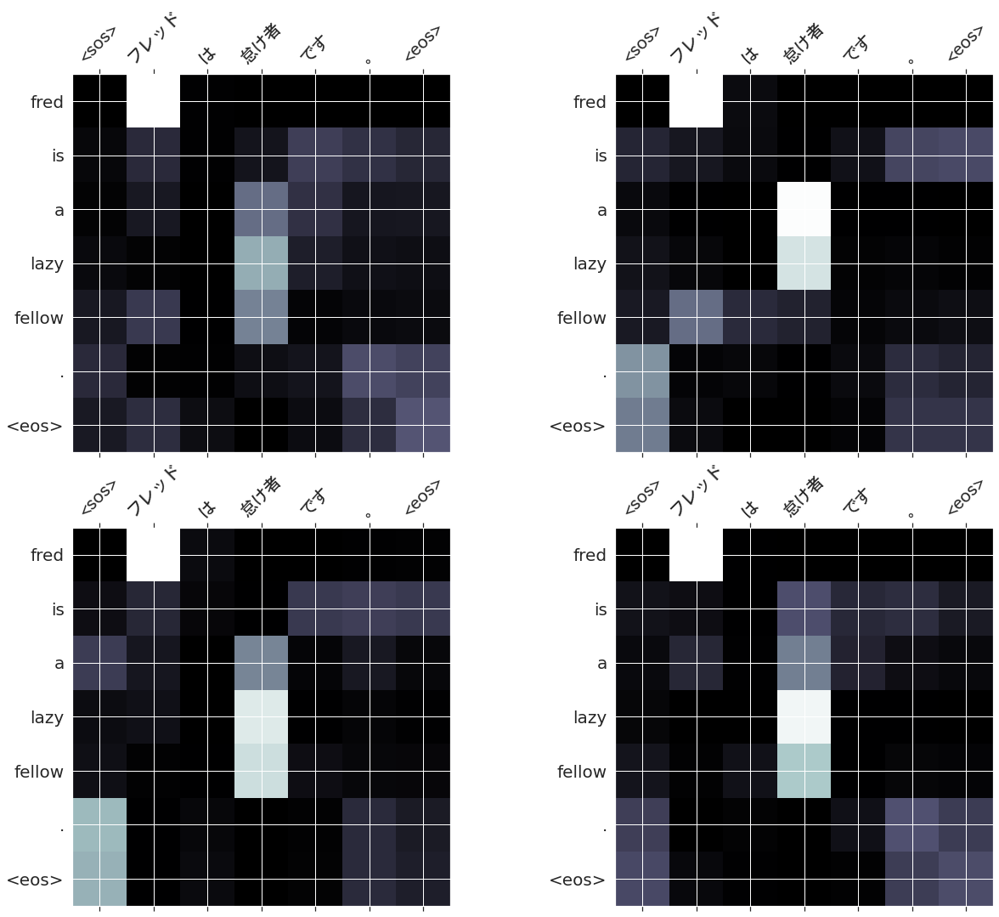

136
src      : この 学校 は 私 たち の もの です 。
trg      : this school is ours .
predicted: this school is ours . <eos>
     blue: 100.00%


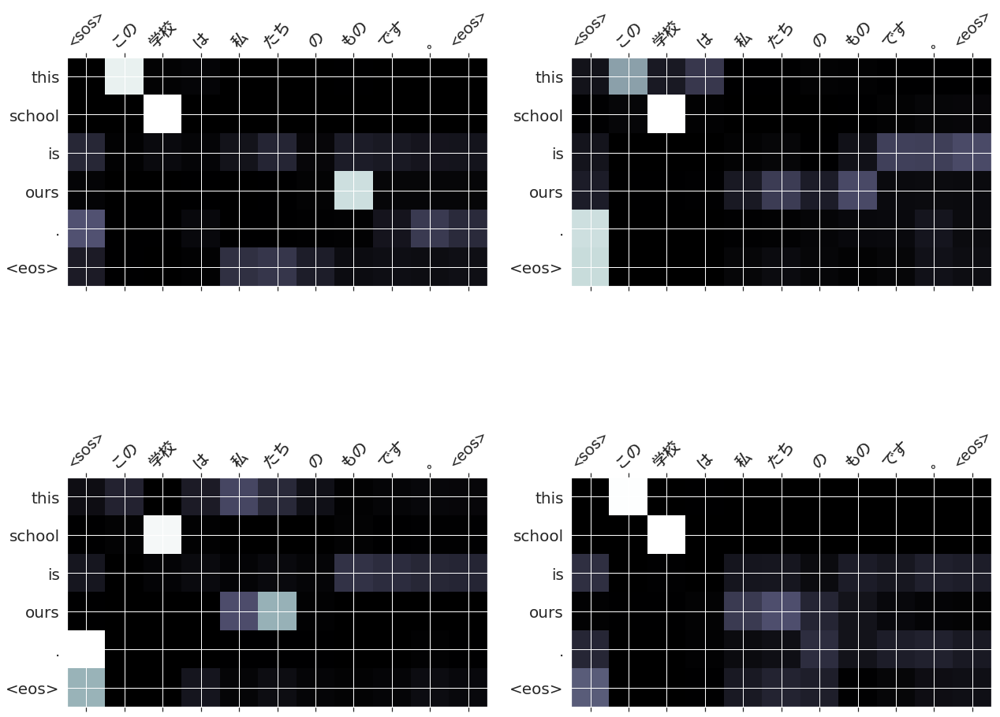

137
src      : 佐知子 さん は ジュディ さん より も 人気 が ある ます 。
trg      : sachiko is more popular than judy .
predicted: sachiko is more popular than judy . <eos>
     blue: 100.00%


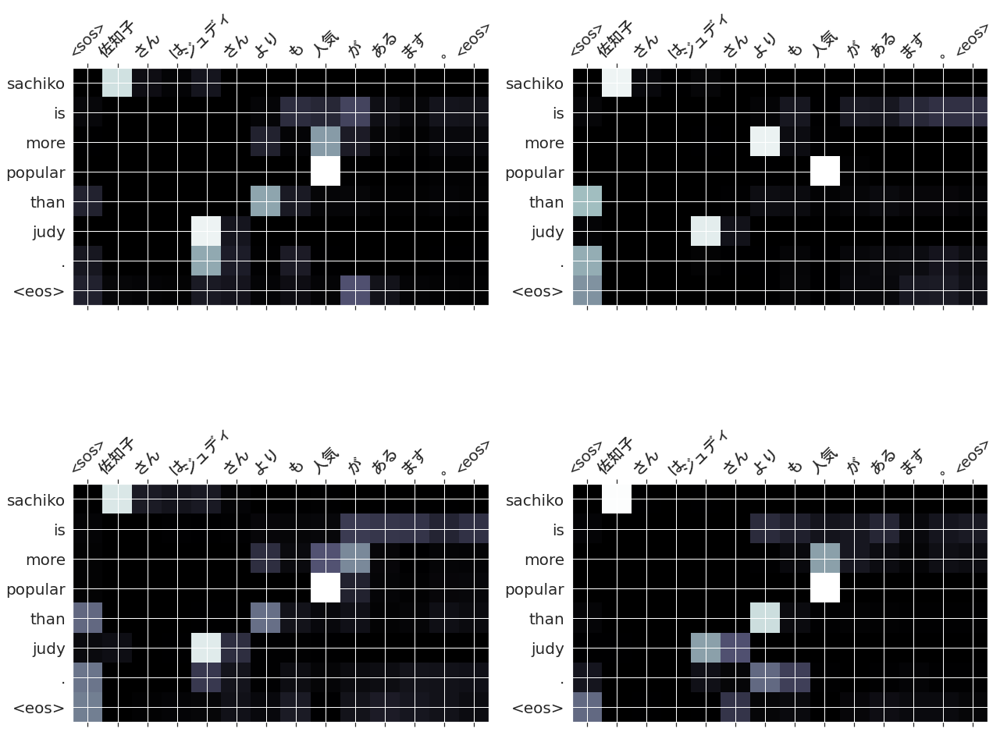

138
src      : 彼 の 乗る た 列車 は 東京 駅 に 着く た 。
trg      : his train arrived at tokyo station .
predicted: his train arrived at tokyo station . <eos>
     blue: 100.00%


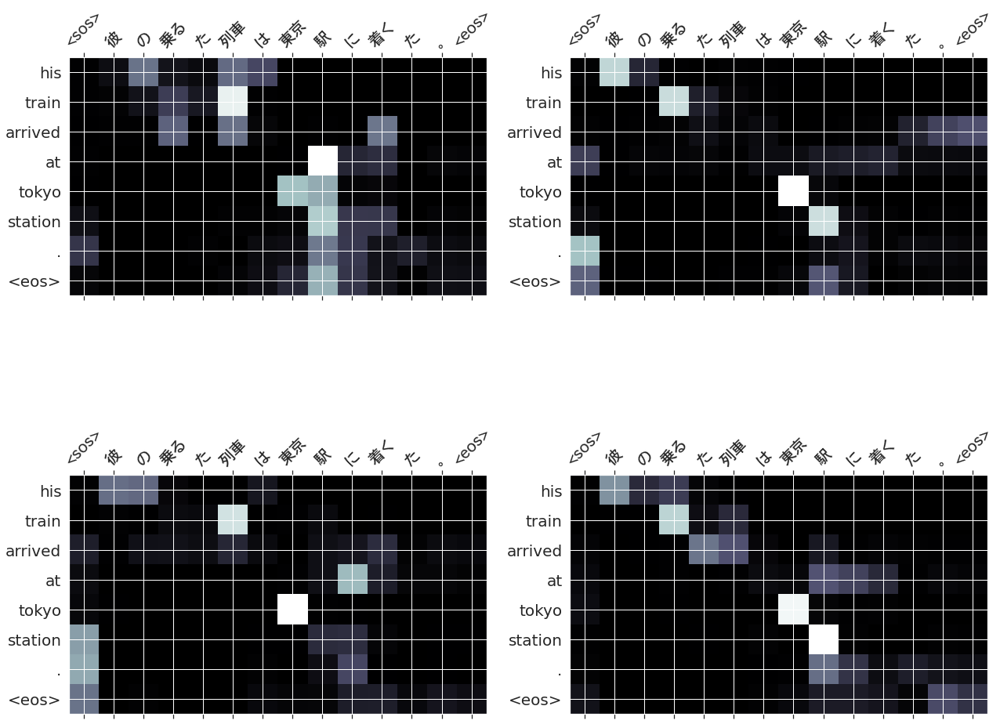

139
src      : 私 は イギリス へ 行く た こと が ある ます ん 。
trg      : i have never been to england .
predicted: i have never been to england . <eos>
     blue: 100.00%


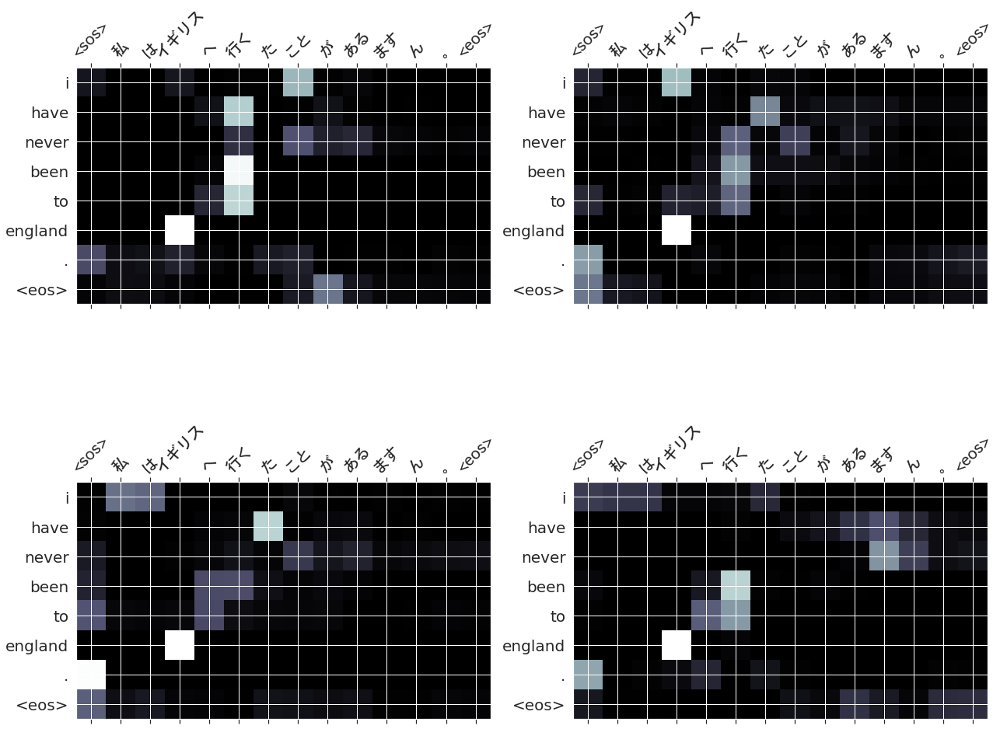

140
src      : 子供 は 衣食 を 親 に 頼る て いる 。
trg      : children depend on their parents for food and clothing .
predicted: children depend on their parents for food and clothing . <eos>
     blue: 100.00%


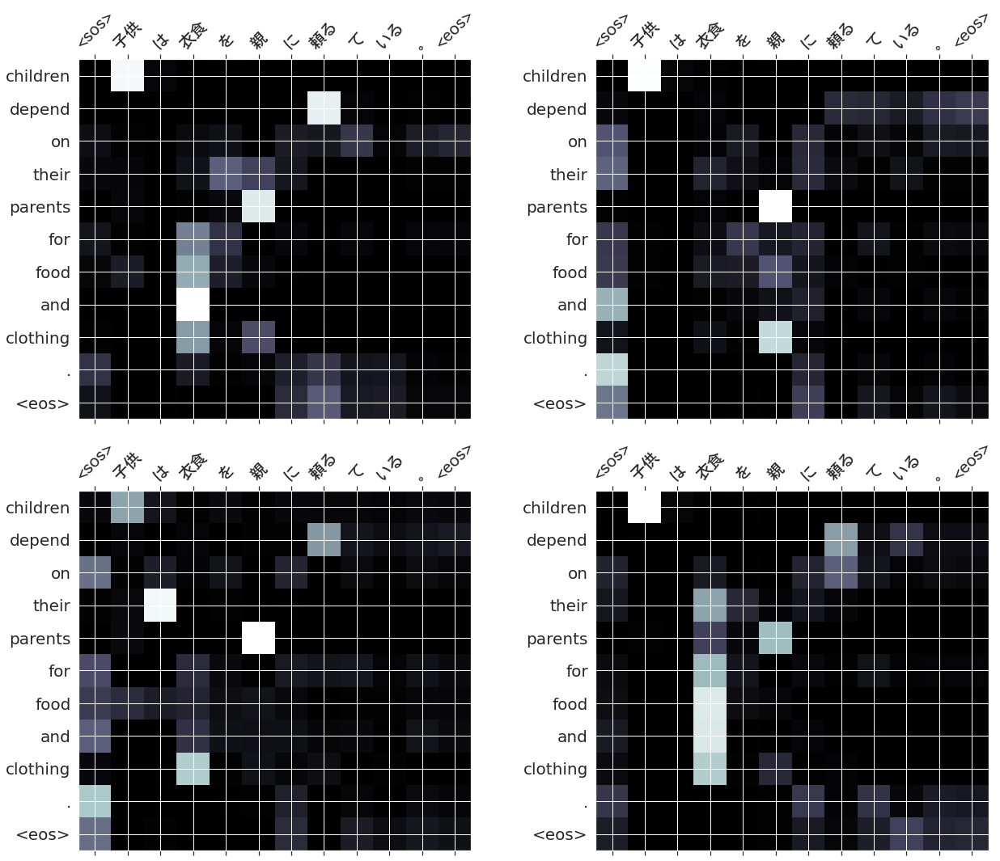

141
src      : 彼 は ちょうど 今 帰宅 する た ところ だ 。
trg      : he has just come home .
predicted: he has just come home . <eos>
     blue: 100.00%


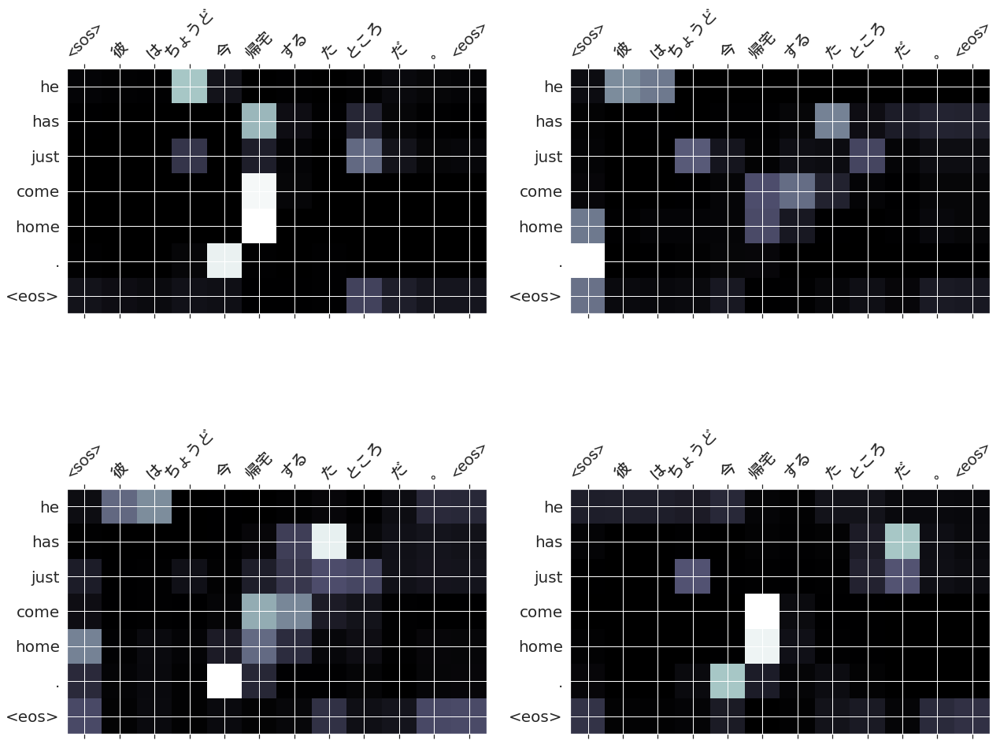

142
src      : この 通り を 横断 する の は 大変 危険 だ 。
trg      : it is very dangerous to cross this street .
predicted: it is very dangerous to cross this street . <eos>
     blue: 100.00%


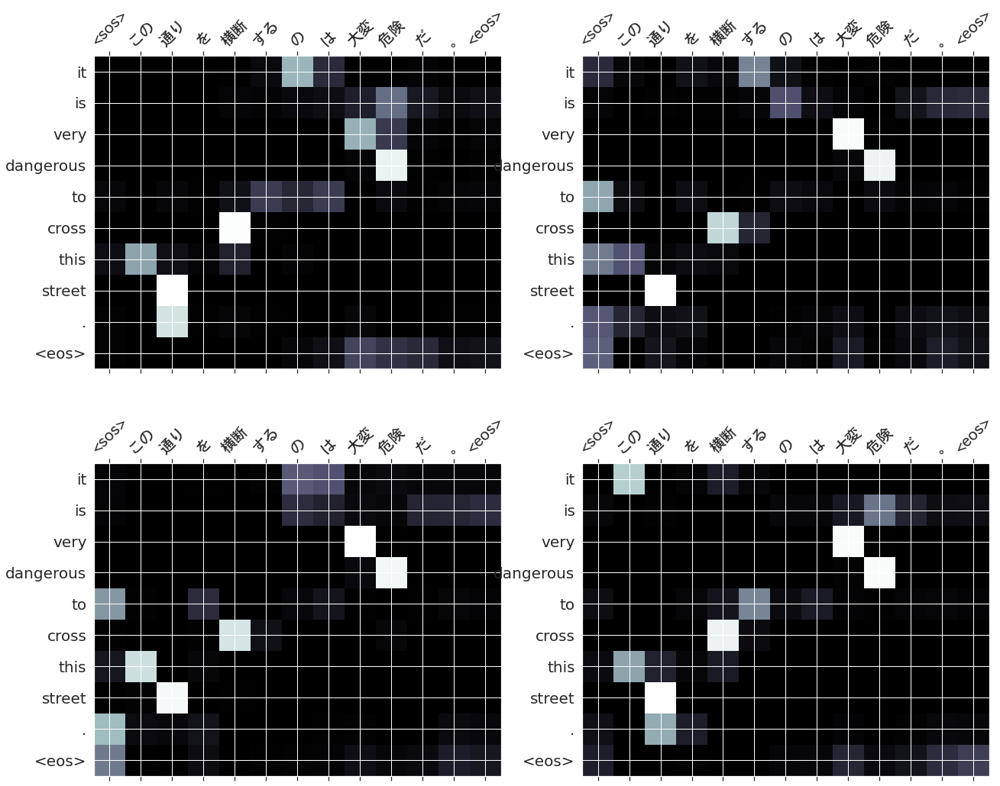

143
src      : パン と ミルク が 必要 だ 。
trg      : i need some bread and milk .
predicted: i need some bread and milk . <eos>
     blue: 100.00%


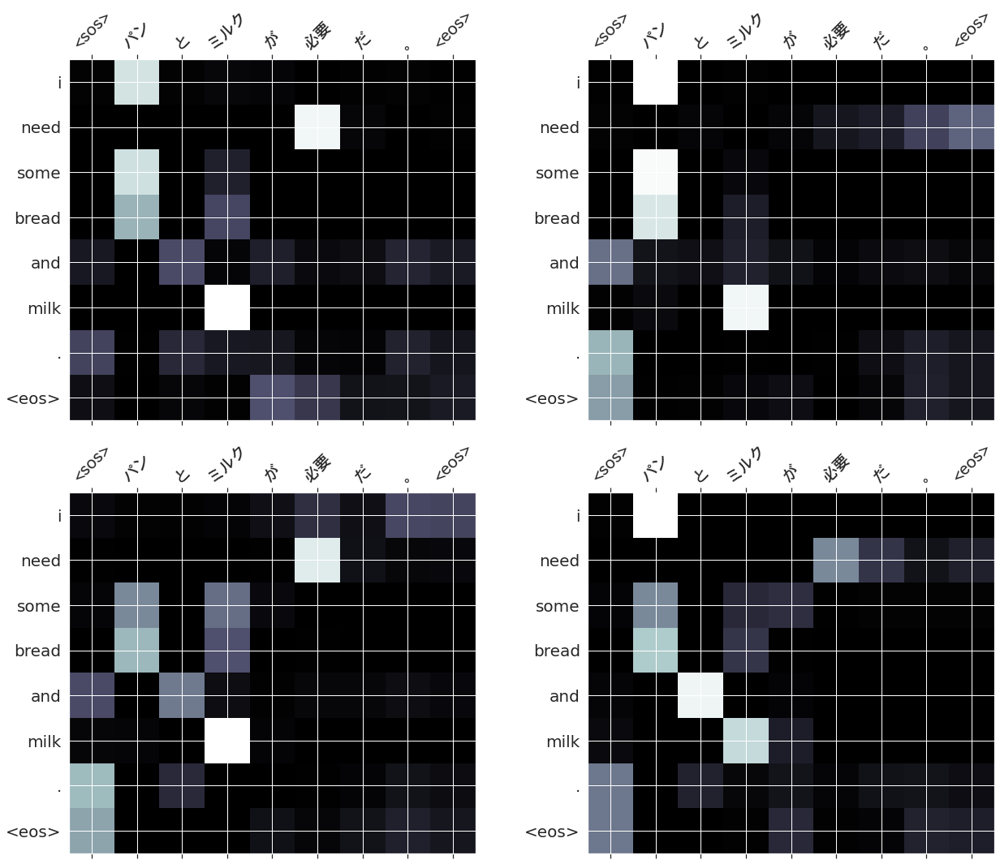

144
src      : その 大臣 は 内閣 から の 辞職 を 余儀ない する れる た 。
trg      : the minister was obliged to resign from the cabinet .
predicted: the minister was obliged to resign from the cabinet . <eos>
     blue: 100.00%


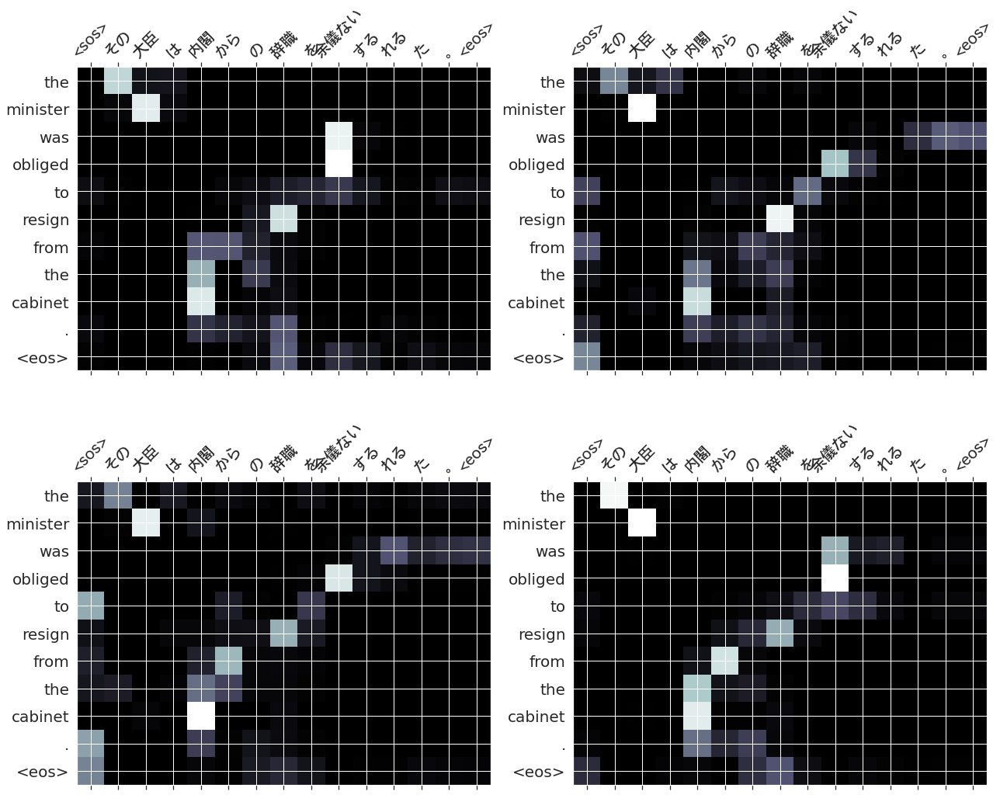

145
src      : 私 たち の 先生 は 車 で 学校 に 来る ます 。
trg      : our teacher comes to school by car .
predicted: our teacher comes to school by car . <eos>
     blue: 100.00%


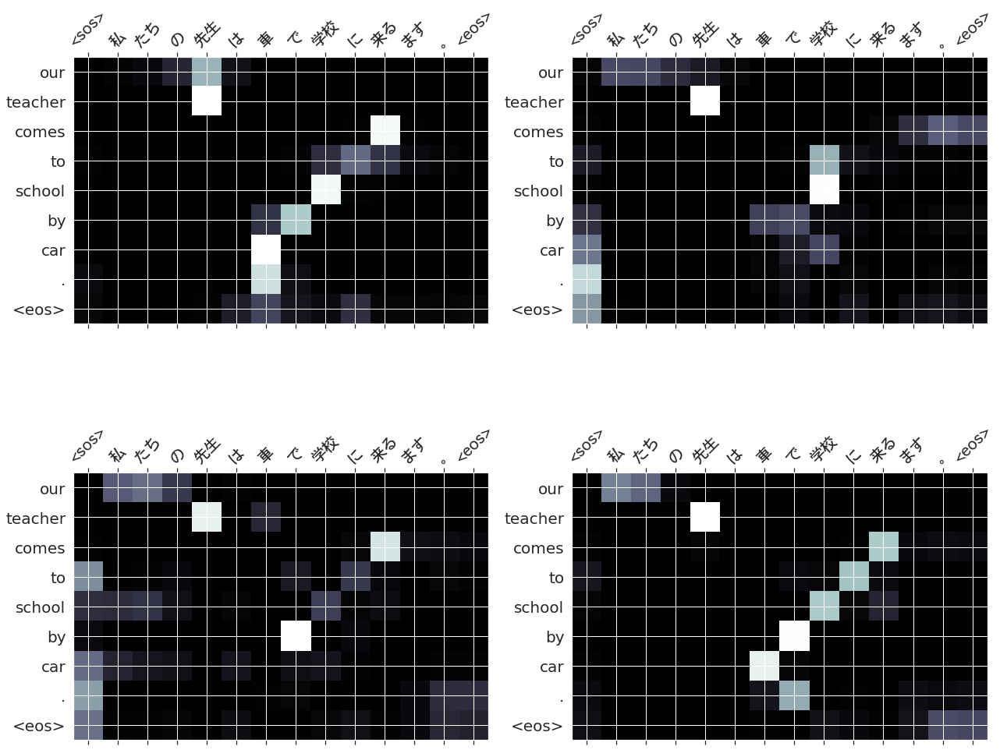

146
src      : この 漢字 は どういう 意味 です か 。
trg      : what does this kanji mean ?
predicted: what does this kanji mean ? <eos>
     blue: 100.00%


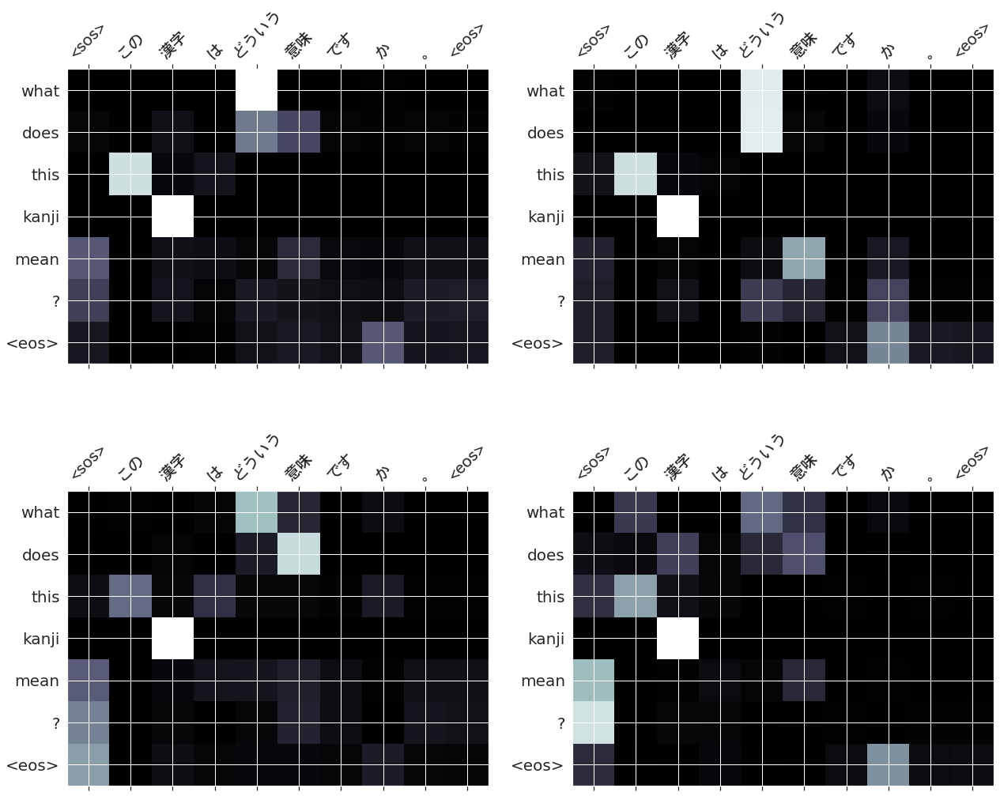

147
src      : 君 は 何 が ほしい 。
trg      : what do you want ?
predicted: what do you want ? <eos>
     blue: 100.00%


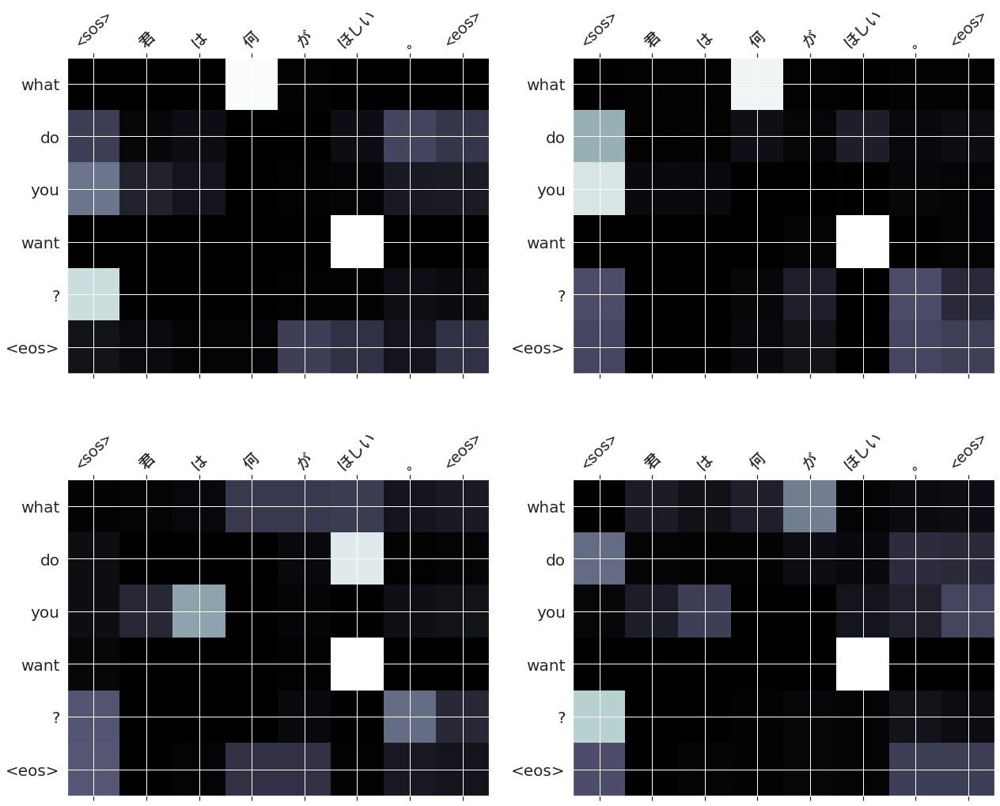

148
src      : その 事故 は 彼 の 不注意 だ 運転 の ため だ ある た 。
trg      : the accident was due to his careless driving .
predicted: the accident was due to his careless driving . <eos>
     blue: 100.00%


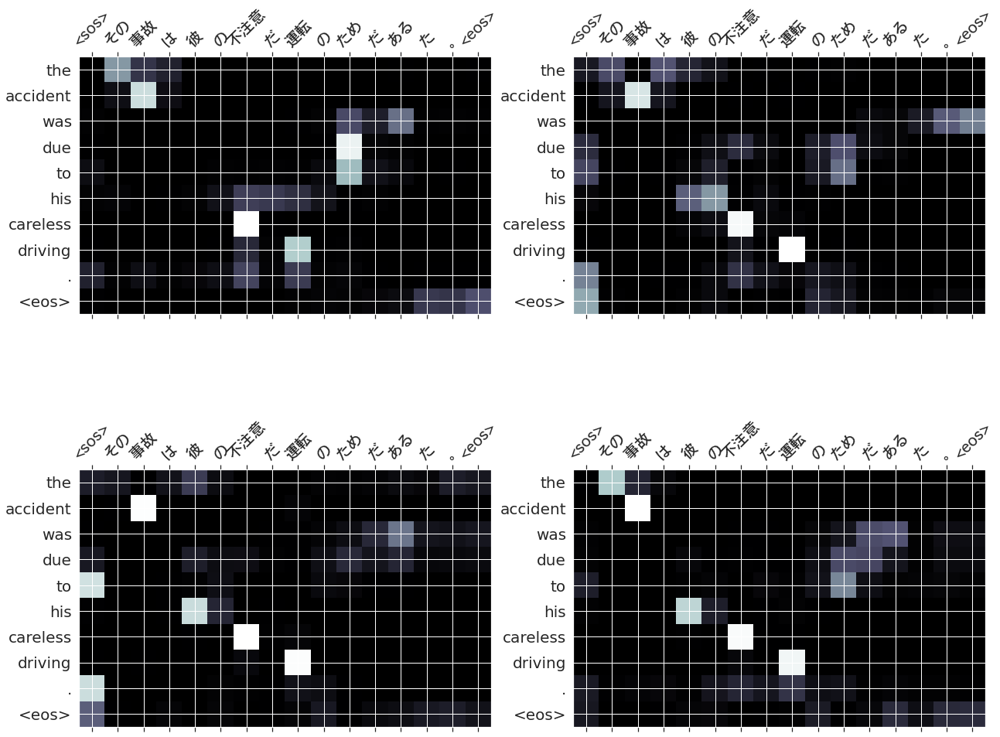

149
src      : 東京 タワー へ 行く 道 を 教える て 頂ける ます ん か 。
trg      : could you tell me the way to tokyo tower ?
predicted: could you tell me the way to tokyo tower ? <eos>
     blue: 100.00%


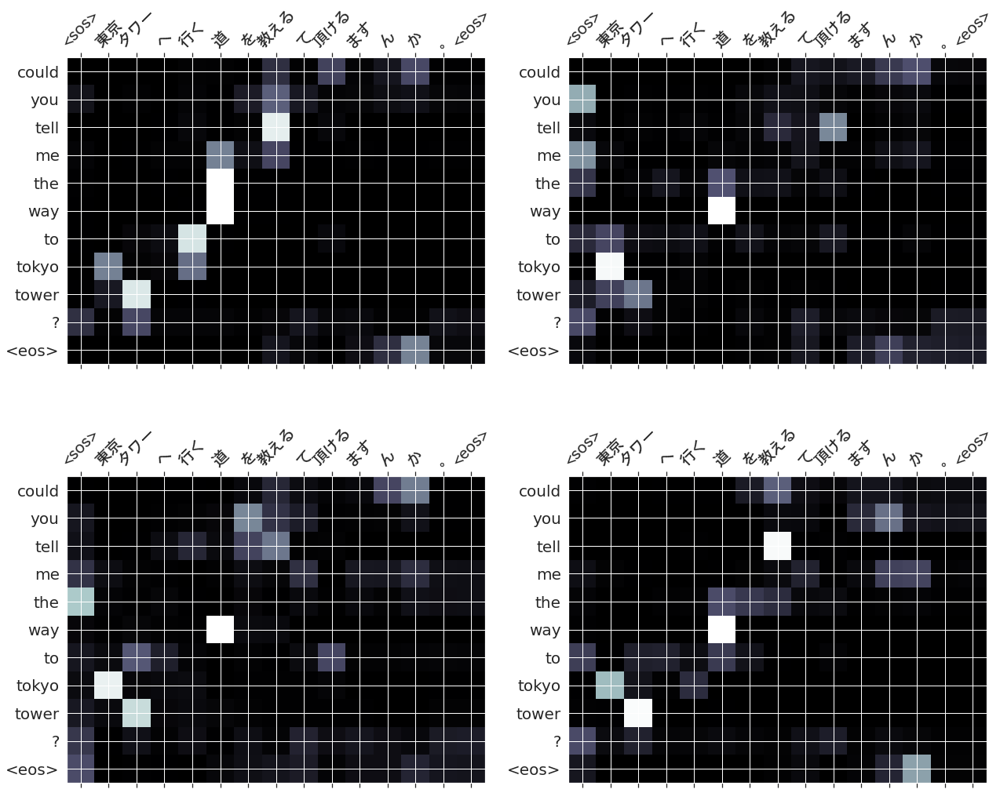

150
src      : 寝る 前 に それ を 終える なさる 。
trg      : finish it before you go to bed .
predicted: finish it before you go to bed . <eos>
     blue: 100.00%


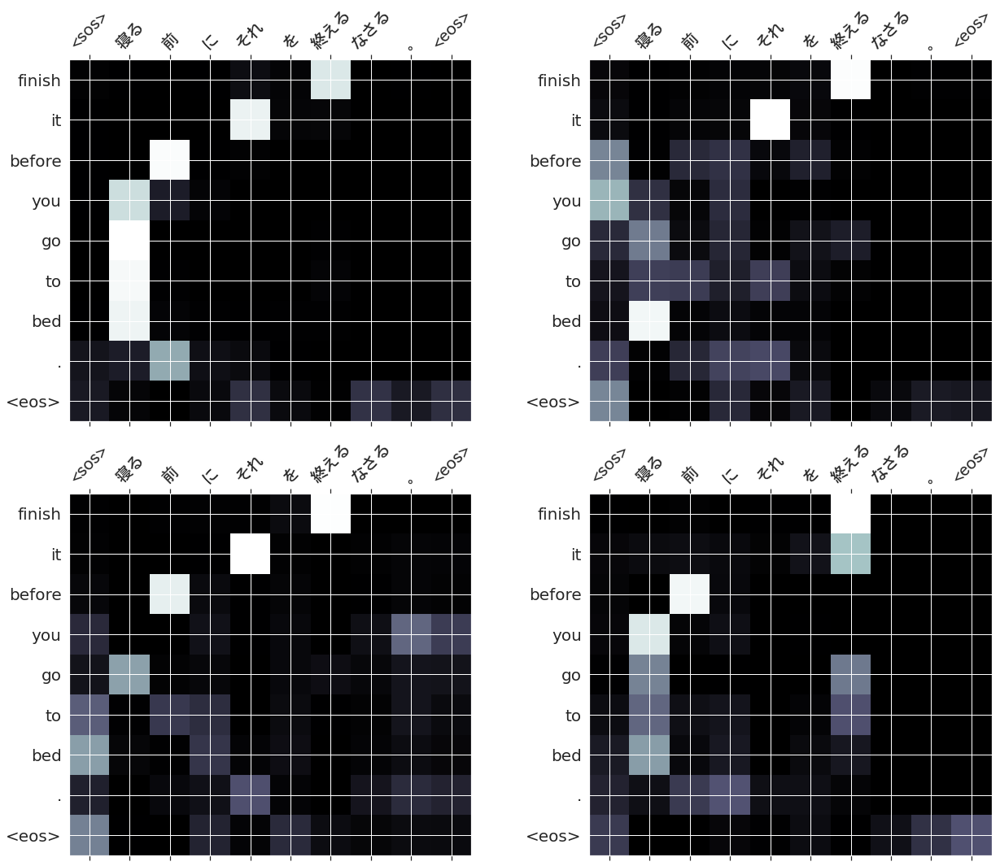

151
src      : あの 山 は どれ くらい の 高い さ が ある ます か 。
trg      : how high is that mountain ?
predicted: how high is that mountain ? <eos>
     blue: 100.00%


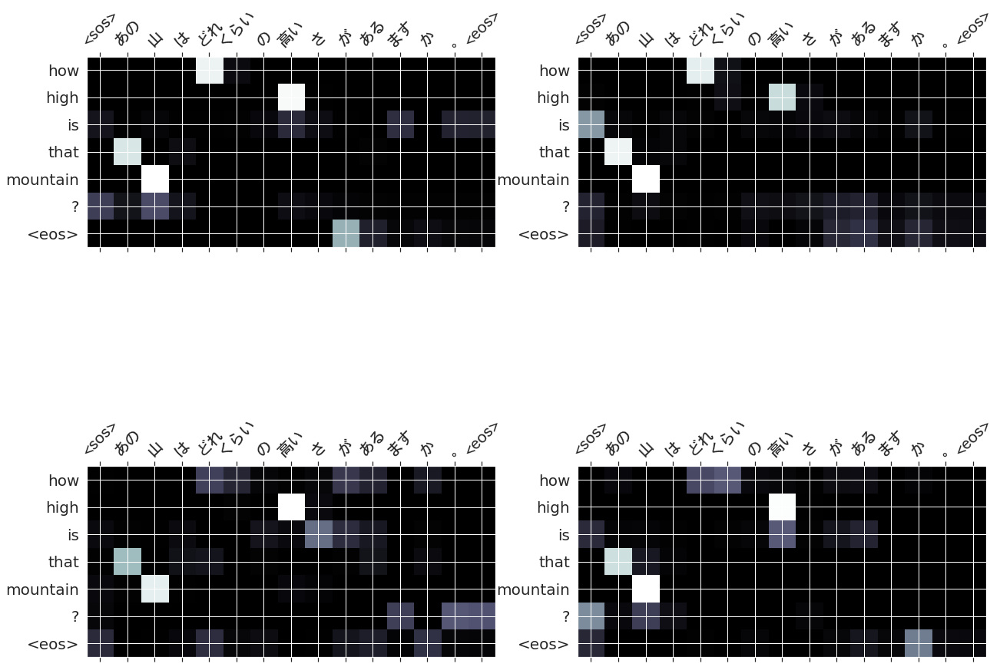

152
src      : 私 は 日曜日 は たいてい ジーンズ を はく て いる 。
trg      : i usually wear jeans on sunday .
predicted: i usually wear jeans on sunday . <eos>
     blue: 100.00%


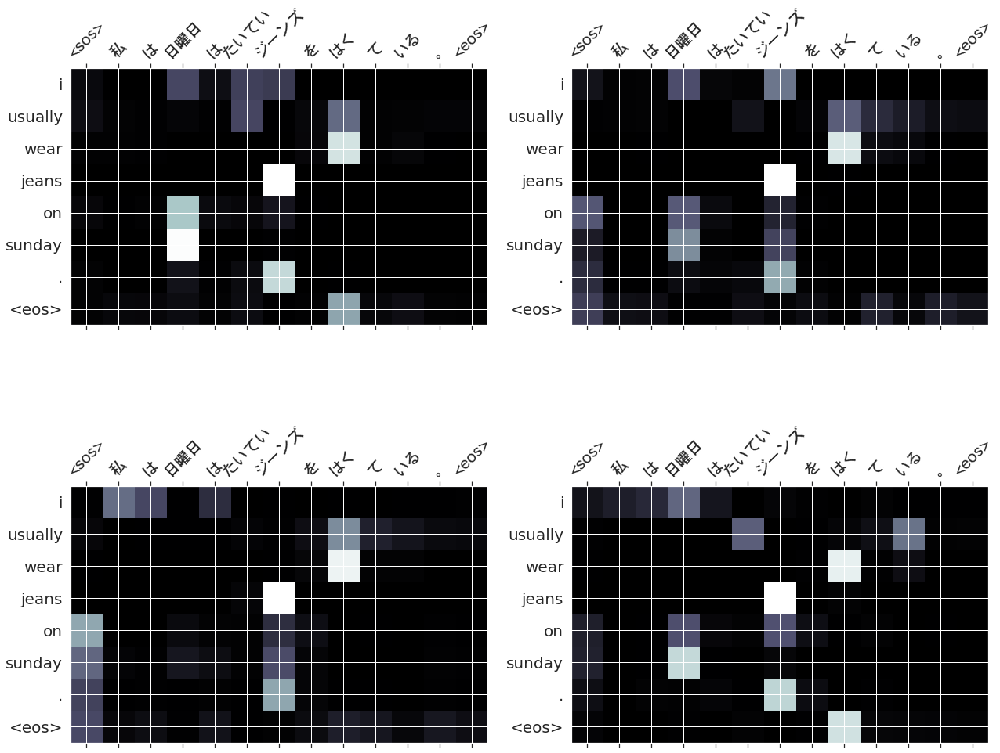

153
src      : 砂糖 は ポット に ある ます か 。
trg      : is there any sugar in the pot ?
predicted: is there any sugar in the pot ? <eos>
     blue: 100.00%


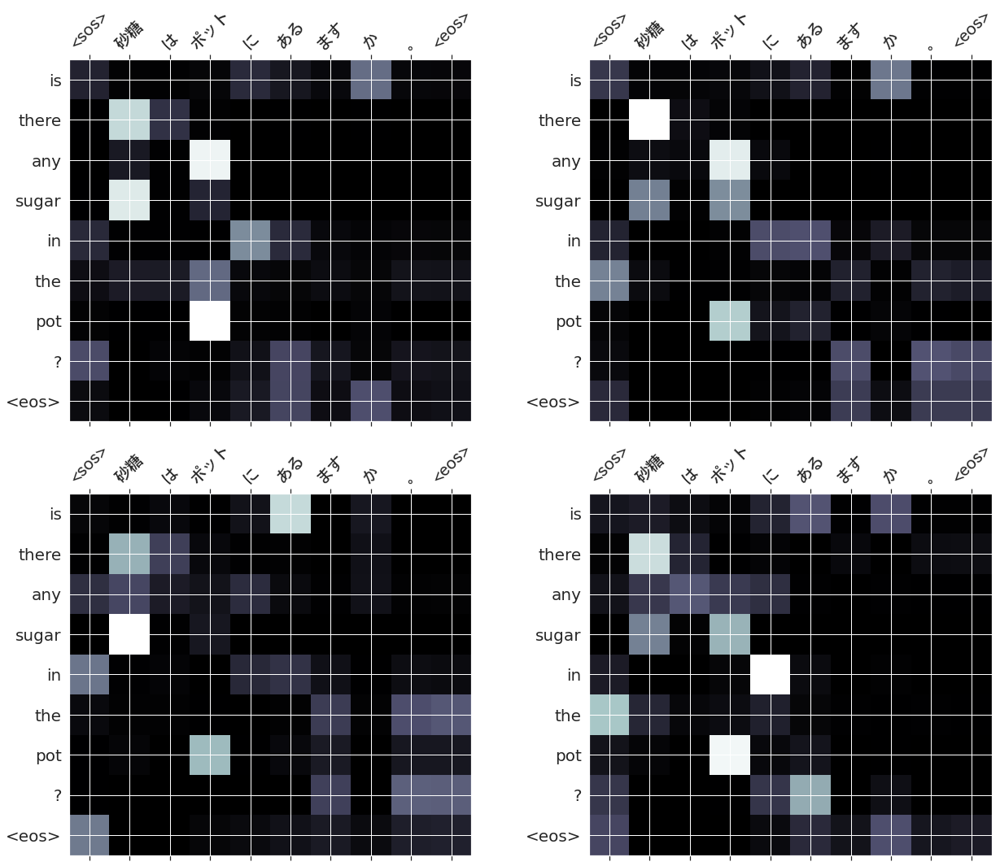

154
src      : 曇る て いる ます 。
trg      : it 's cloudy .
predicted: it 's cloudy . <eos>
     blue: 100.00%


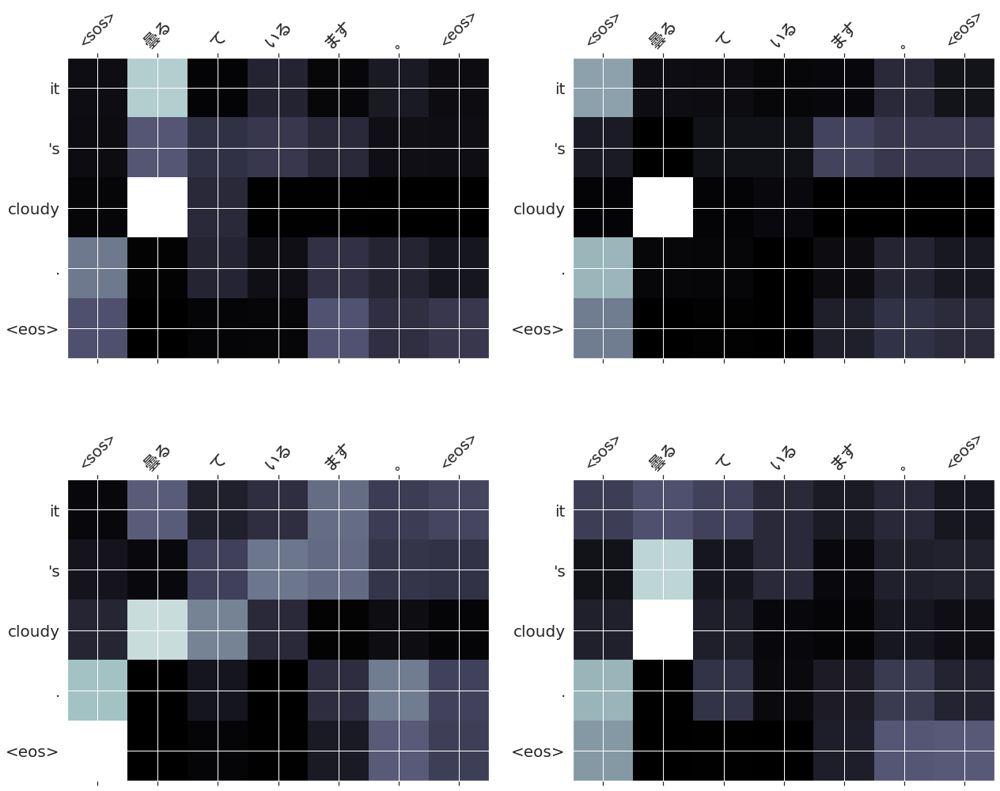

155
src      : いい 日 です ね 。
trg      : it 's a nice day , is n't it ?
predicted: it 's a nice day , is n't it ? <eos>
     blue: 100.00%


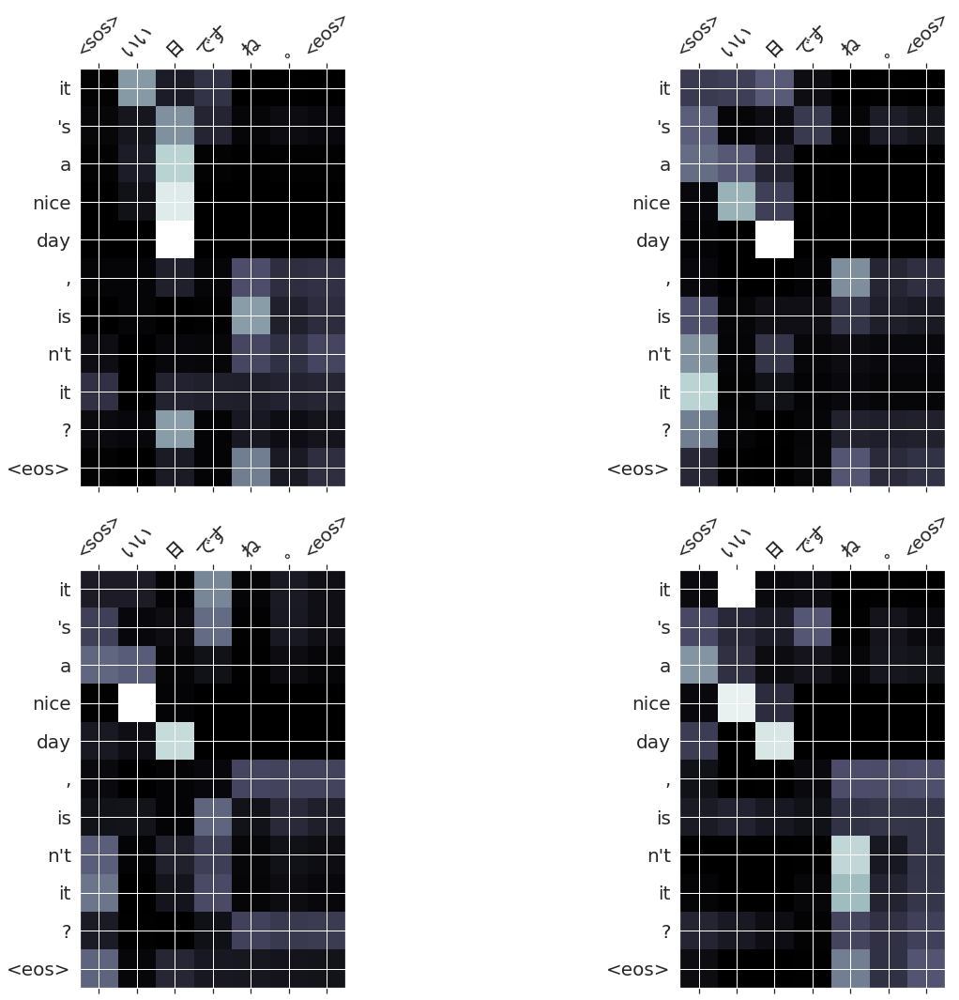

156
src      : その 銀行 は どこ に ある ます か 。
trg      : where is the bank ?
predicted: where is the bank ? <eos>
     blue: 100.00%


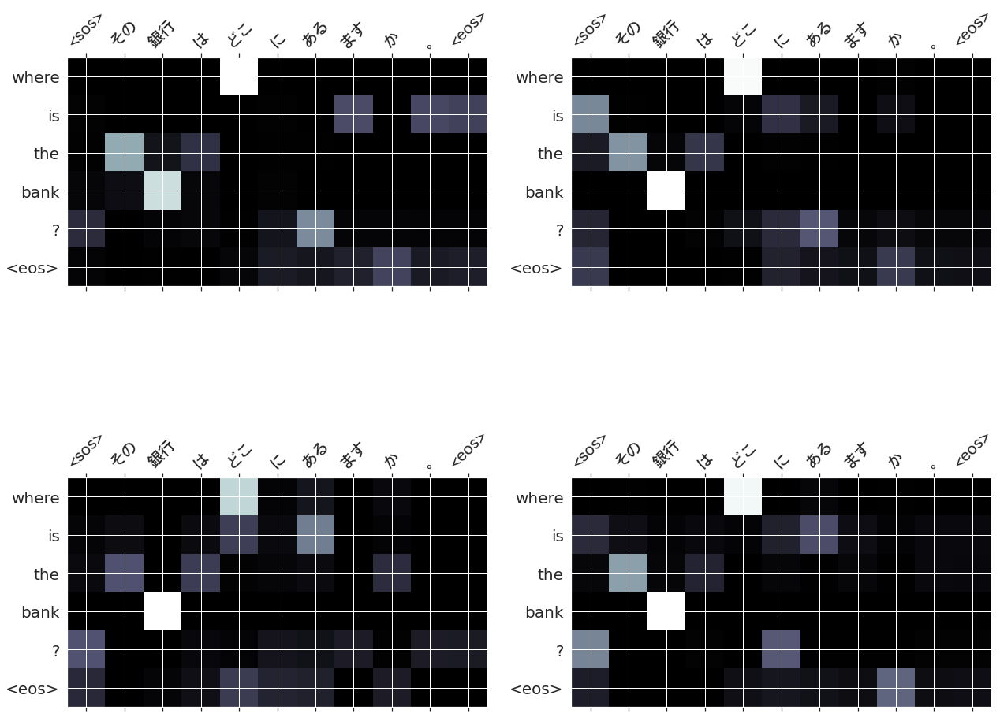

157
src      : その 兵士 は 戦死 する た 。
trg      : the soldier was killed in action .
predicted: the soldier was killed in action . <eos>
     blue: 100.00%


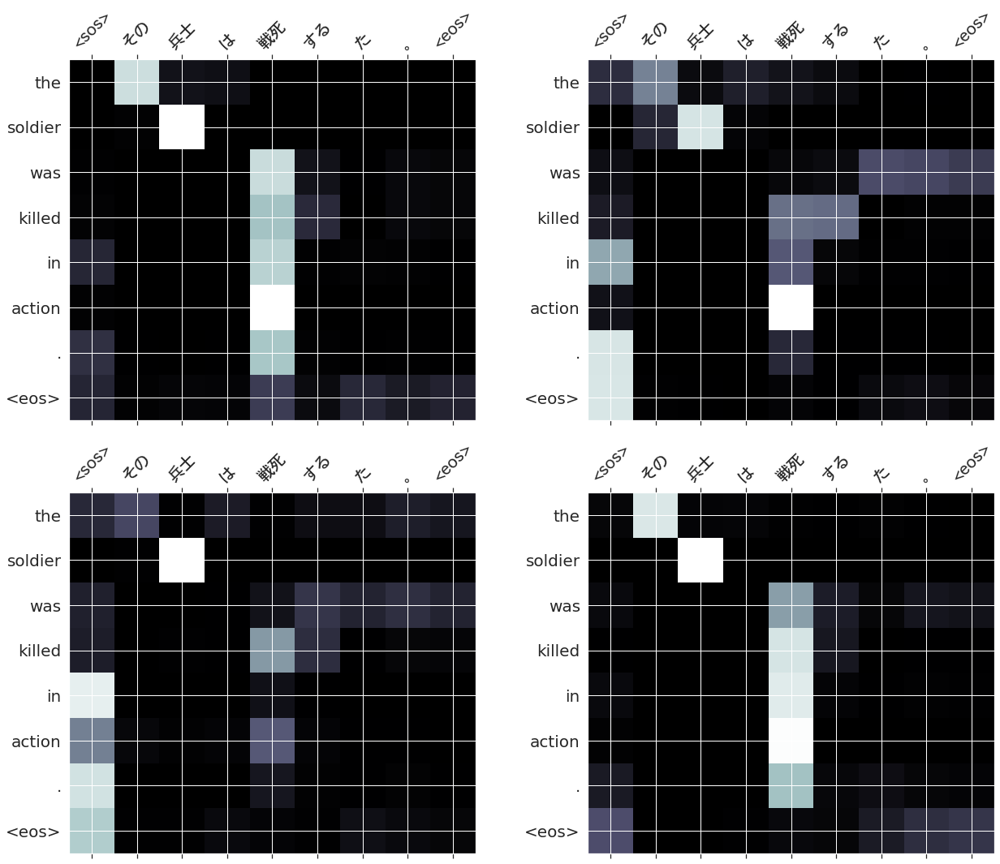

158
src      : 彼女 は 私 の 部屋 を きれい に する と 約束 する た 。
trg      : she promised me to clean my room .
predicted: she promised me to clean my room . <eos>
     blue: 100.00%


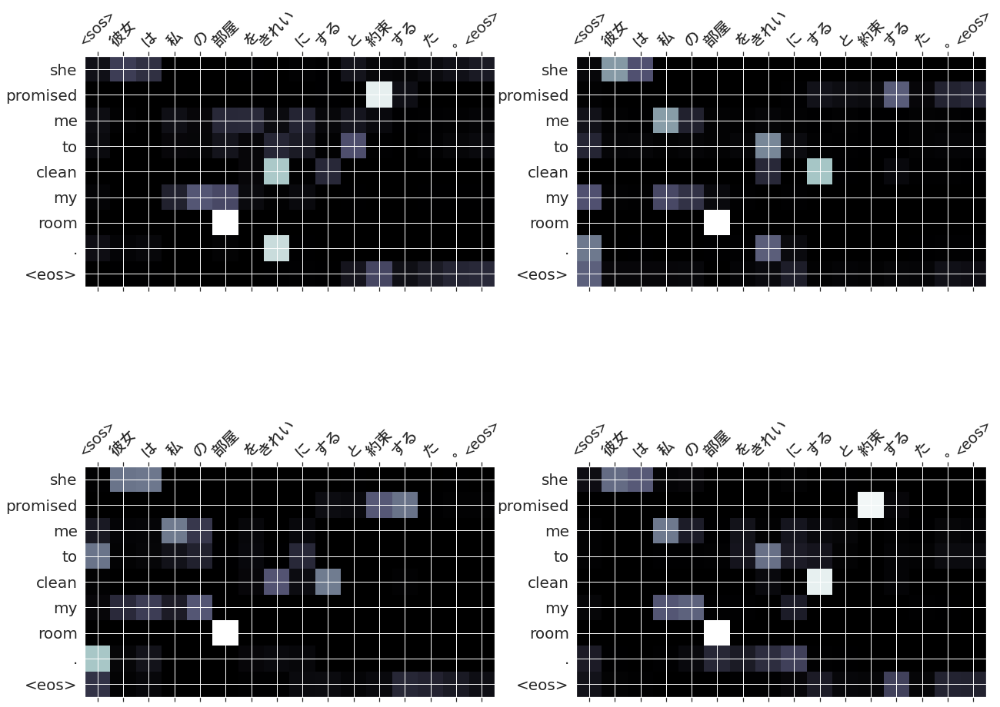

159
src      : 私 たち は 夏 の 間 は 田舎 で 暮らす ます 。
trg      : we live in the country during the summer .
predicted: we live in the country during the summer . <eos>
     blue: 100.00%


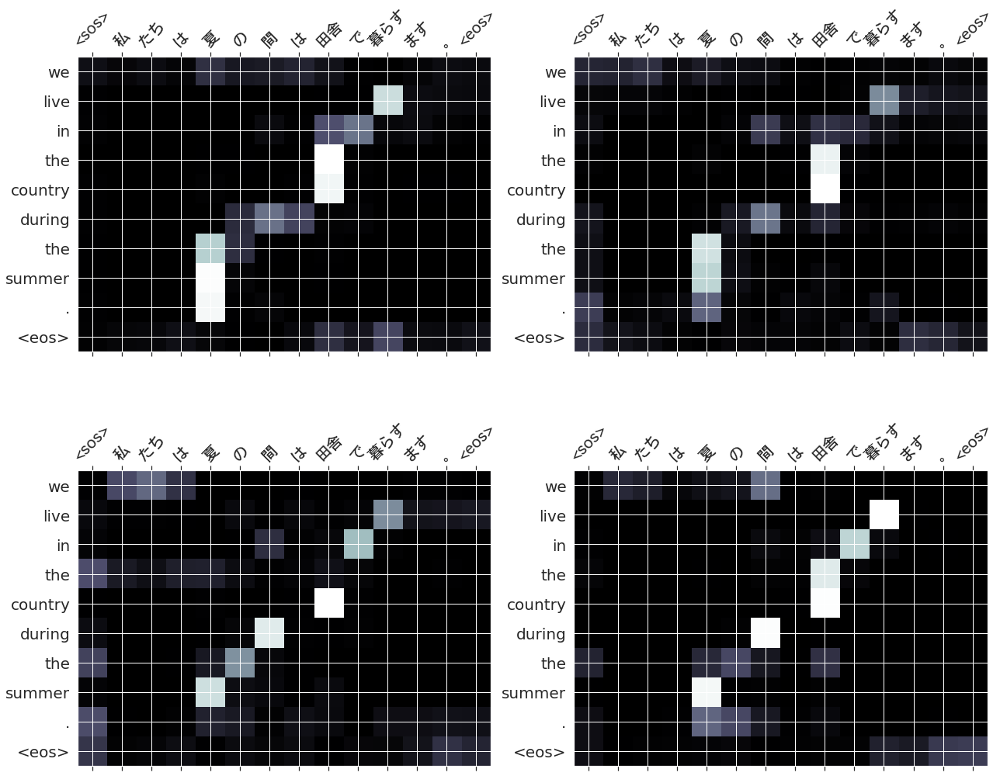

160
src      : 目 を 開く なさる 。
trg      : open your eyes .
predicted: open your eyes . <eos>
     blue: 100.00%


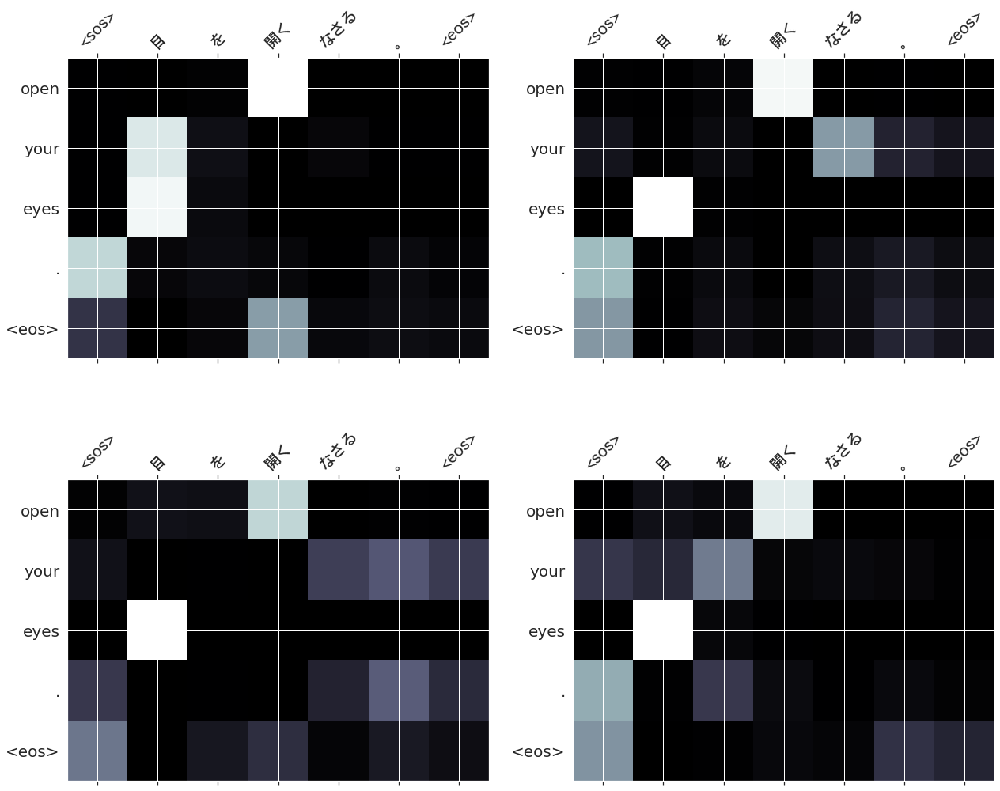

161
src      : そう 思う かい ？
trg      : do you think so ?
predicted: do you think so ? <eos>
     blue: 100.00%


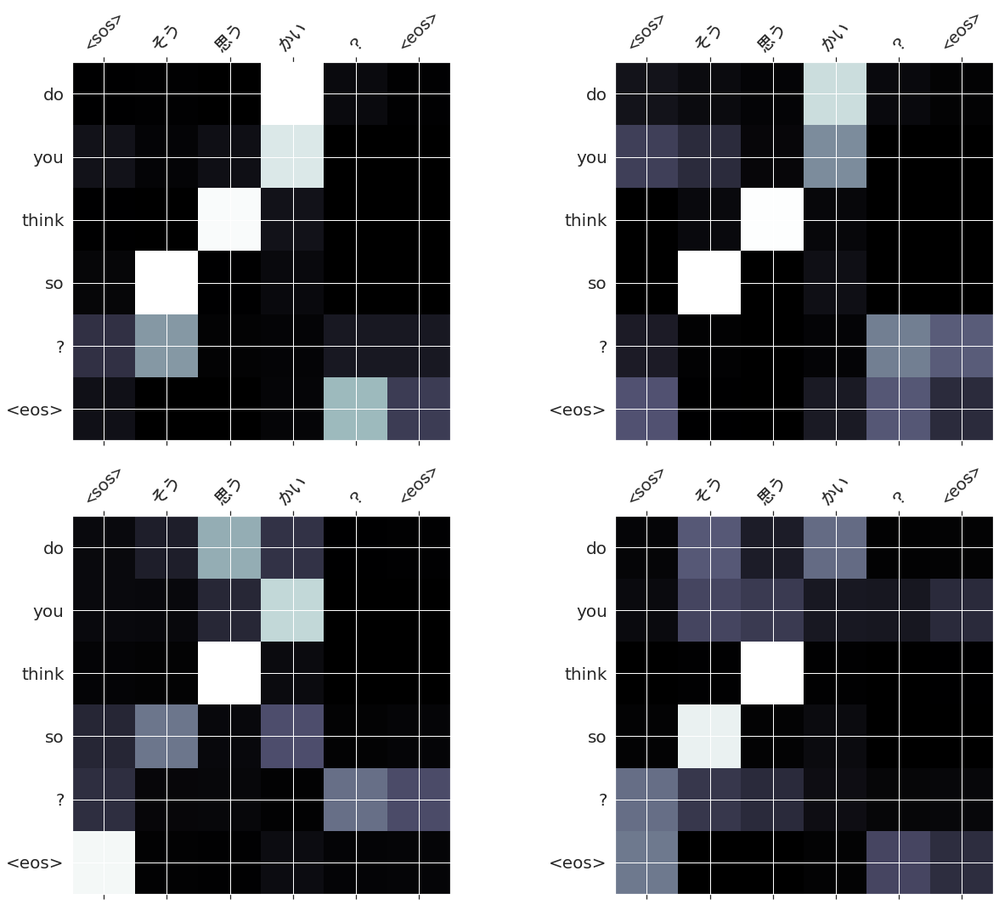

162
src      : ピカソ の 絵 は 、 私 に は 奇妙 に 思える 。
trg      : picasso 's paintings seem strange to me .
predicted: picasso 's paintings seem strange to me . <eos>
     blue: 100.00%


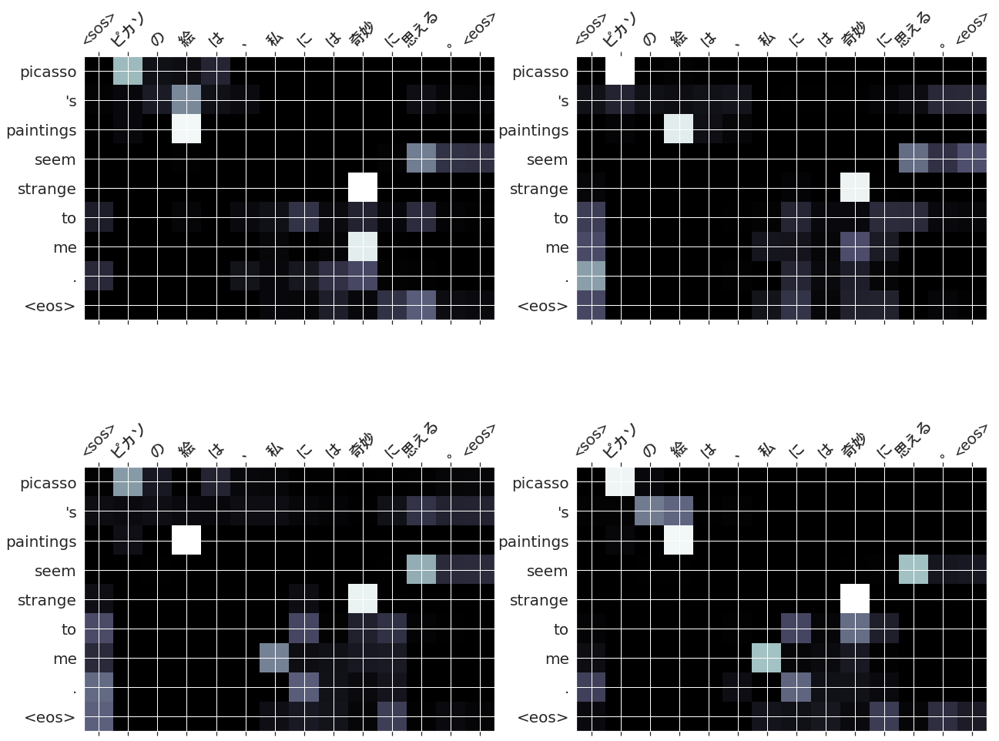

163
src      : その 会社 は 広告 に たくさん の お金 を 使う て ます 。
trg      : the company spends a lot of money on advertising .
predicted: the company spends a lot of money on advertising . <eos>
     blue: 100.00%


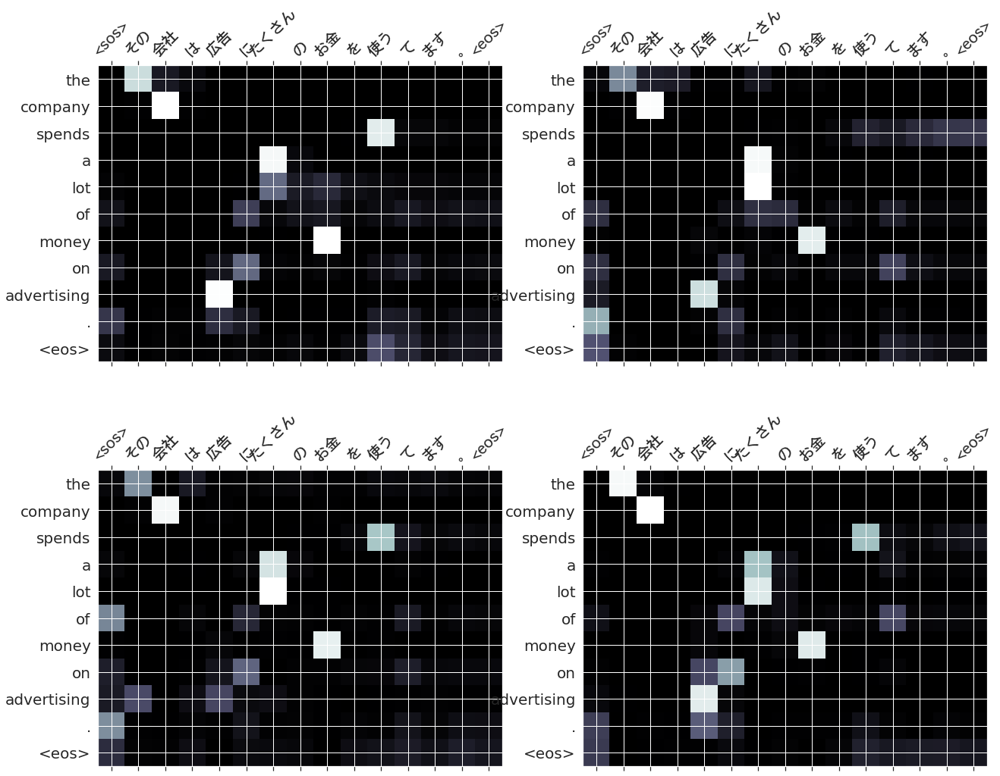

164
src      : 健康 が 富 より 大切 だ ある の は 言うまでもない 。
trg      : it goes without saying that health is more important than wealth .
predicted: it goes without saying that health is more important than wealth . <eos>
     blue: 100.00%


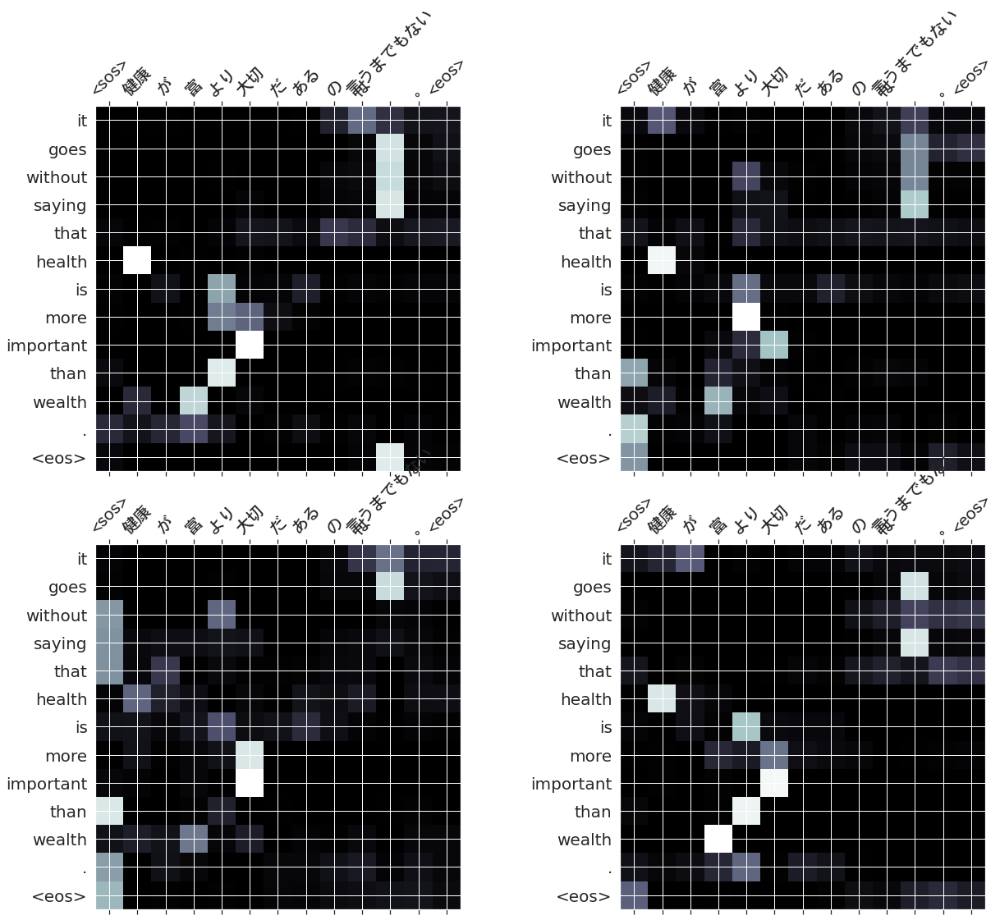

165
src      : この 本 は 読む 価値 が ある と 思う ます か 。
trg      : do you think this book is worth reading ?
predicted: do you think this book is worth reading ? <eos>
     blue: 100.00%


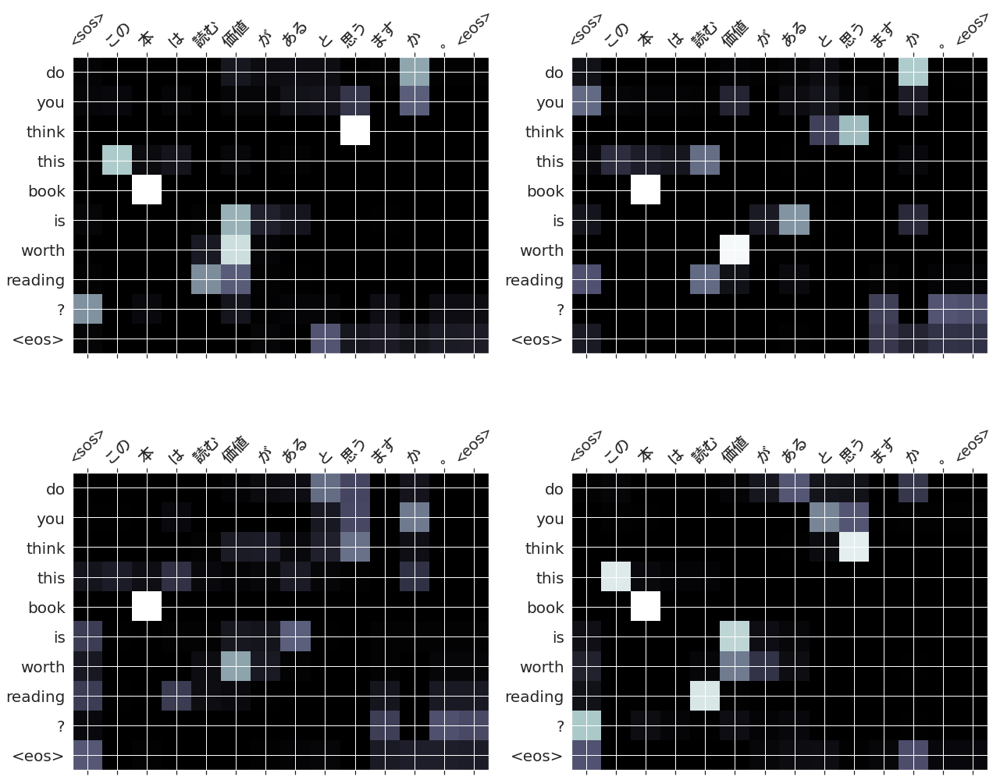

166
src      : 私 は もう 食べる たい ない 。
trg      : i do n't want to eat any more .
predicted: i do n't want to eat any more . <eos>
     blue: 100.00%


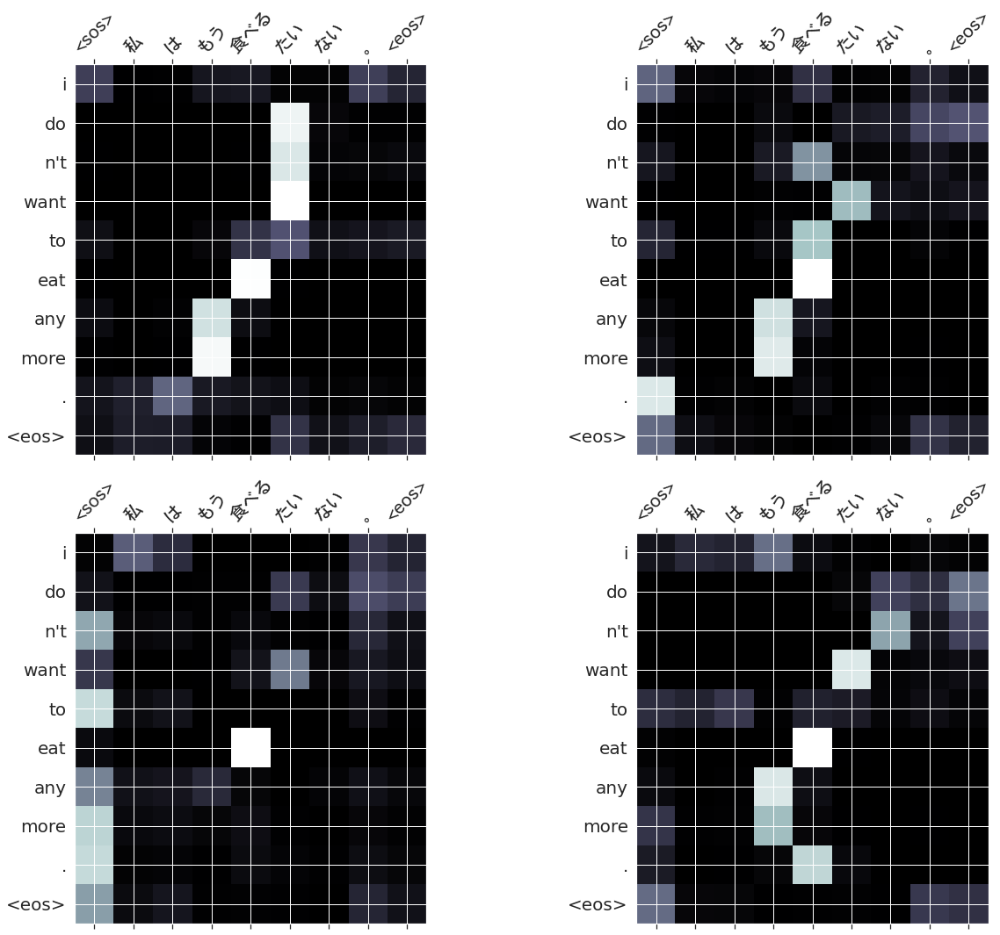

167
src      : どちら の 本 で も 取る なさる 。
trg      : you can take either book .
predicted: take whichever book you do . <eos>
     blue: 90.36%


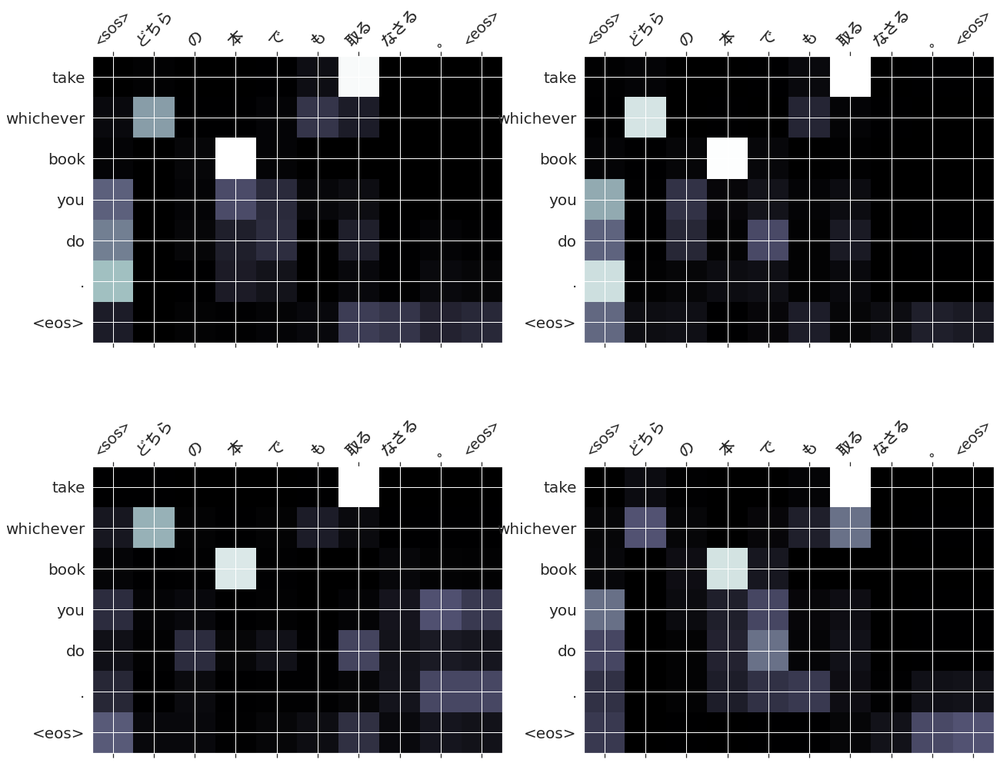

168
src      : 人口 は 増加 する つつ ある 。
trg      : the population is increasing .
predicted: the population is increasing . <eos>
     blue: 100.00%


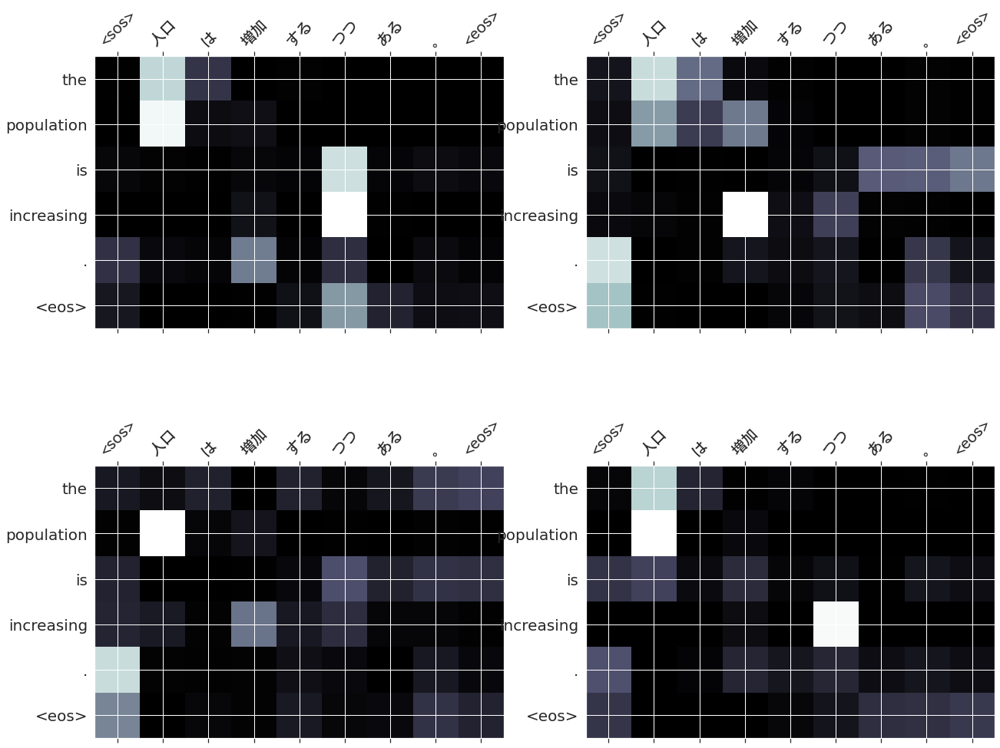

169
src      : 彼 は しばしば 父 の 車 を 運転 する 。
trg      : he often drives his father 's car .
predicted: he often drives his father 's car . <eos>
     blue: 100.00%


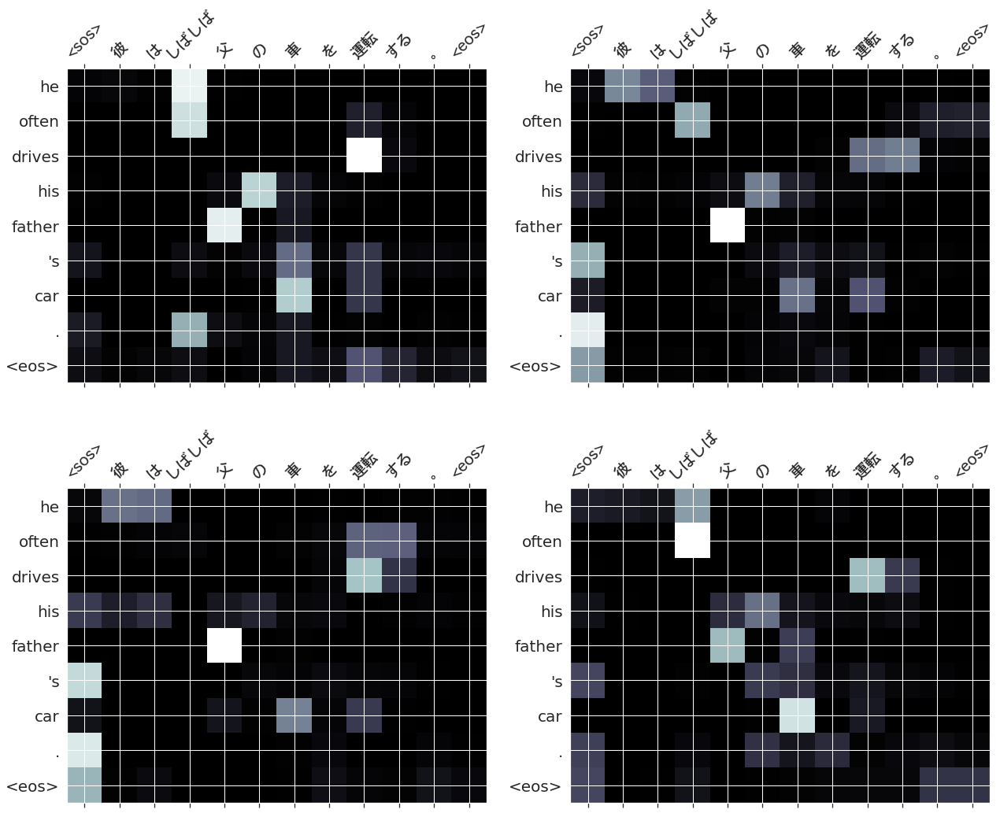

170
src      : その こと を 話す て よ 。
trg      : tell me about it .
predicted: tell me about it . <eos>
     blue: 100.00%


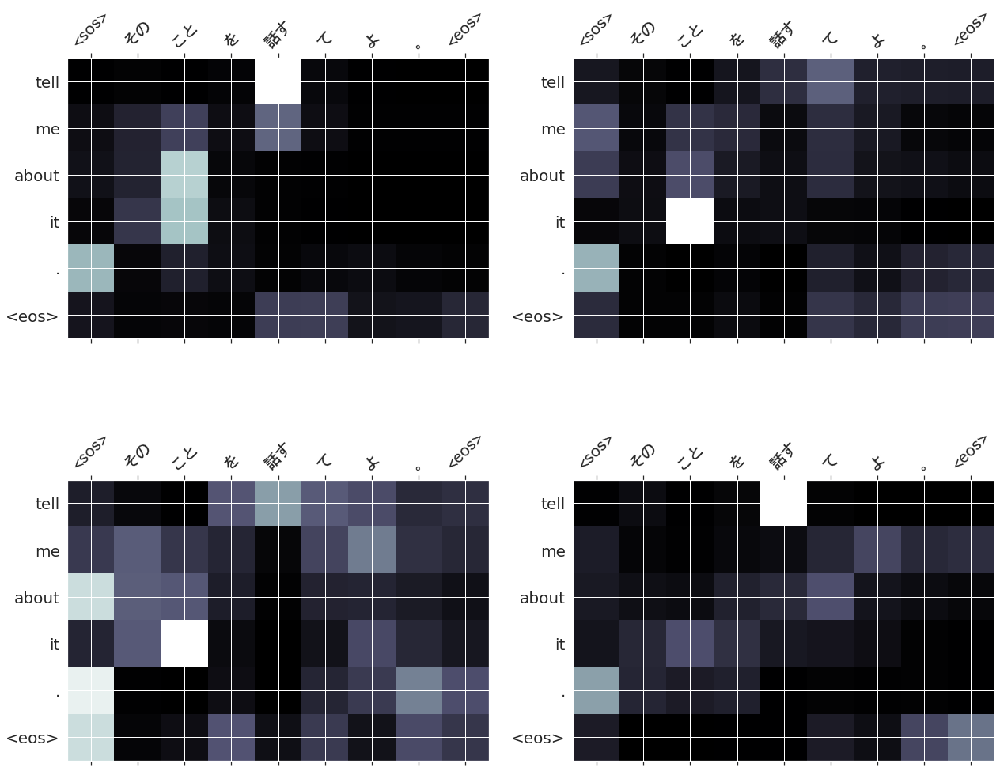

171
src      : 私 の 兄 は テニス を する の が 得意 だ 。
trg      : my brother is good at playing tennis .
predicted: my brother is good at playing tennis . <eos>
     blue: 100.00%


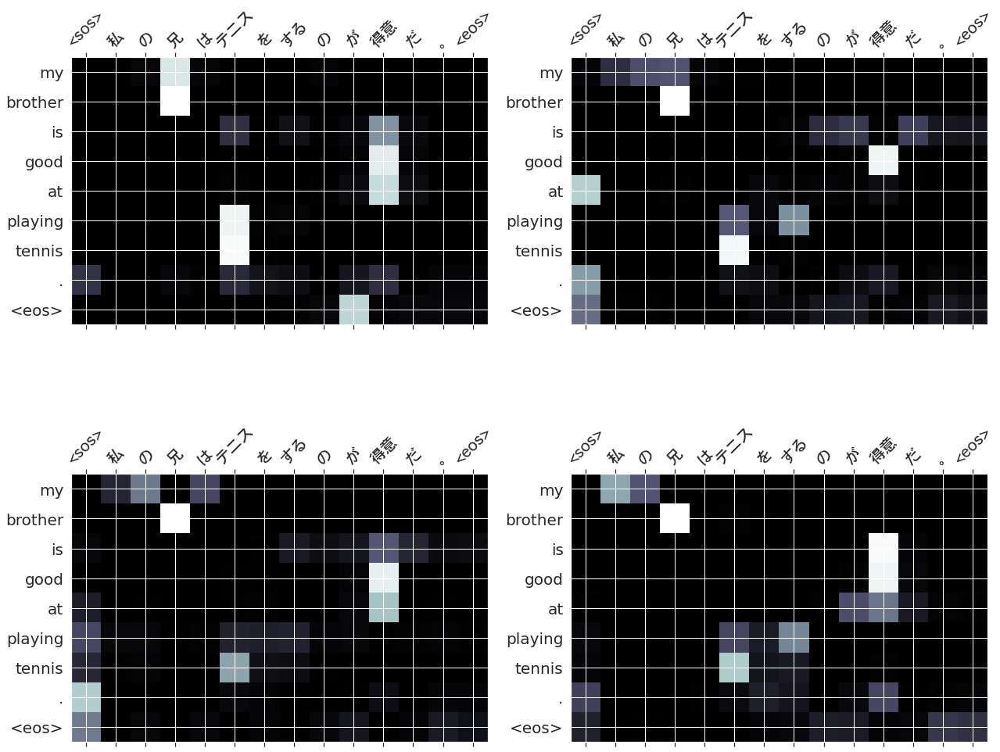

172
src      : 私 は 宿題 を 終える た ところ だ 。
trg      : i have just finished my homework .
predicted: i have just finished my homework . <eos>
     blue: 100.00%


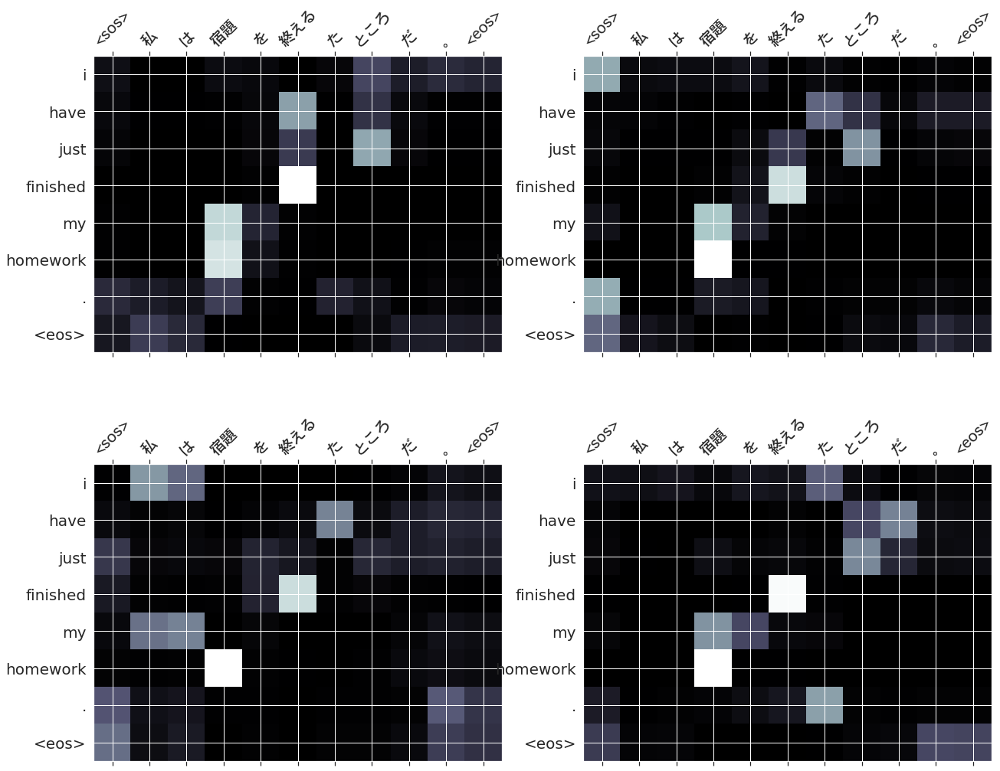

173
src      : その 学生 は 先生 を 侮辱 する た 。
trg      : the student insulted the teacher .
predicted: the student insulted the teacher . <eos>
     blue: 100.00%


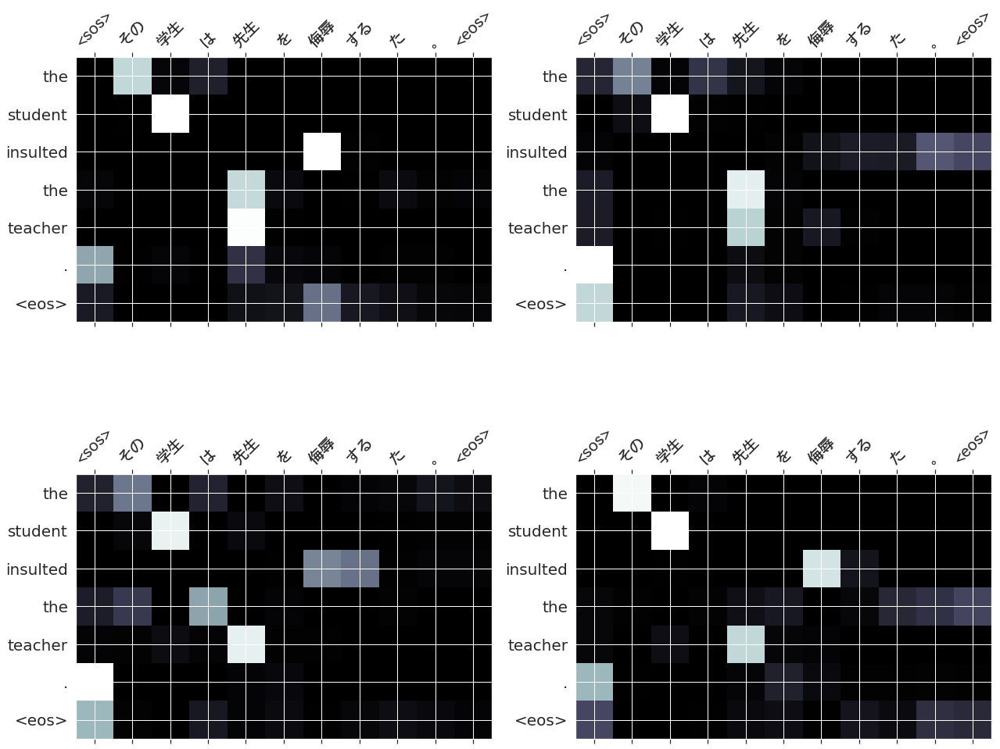

174
src      : たくさん の 人々 が その 広告 に だます れる た 。
trg      : many people were deceived by the advertisement .
predicted: many people were deceived by the advertisement . <eos>
     blue: 100.00%


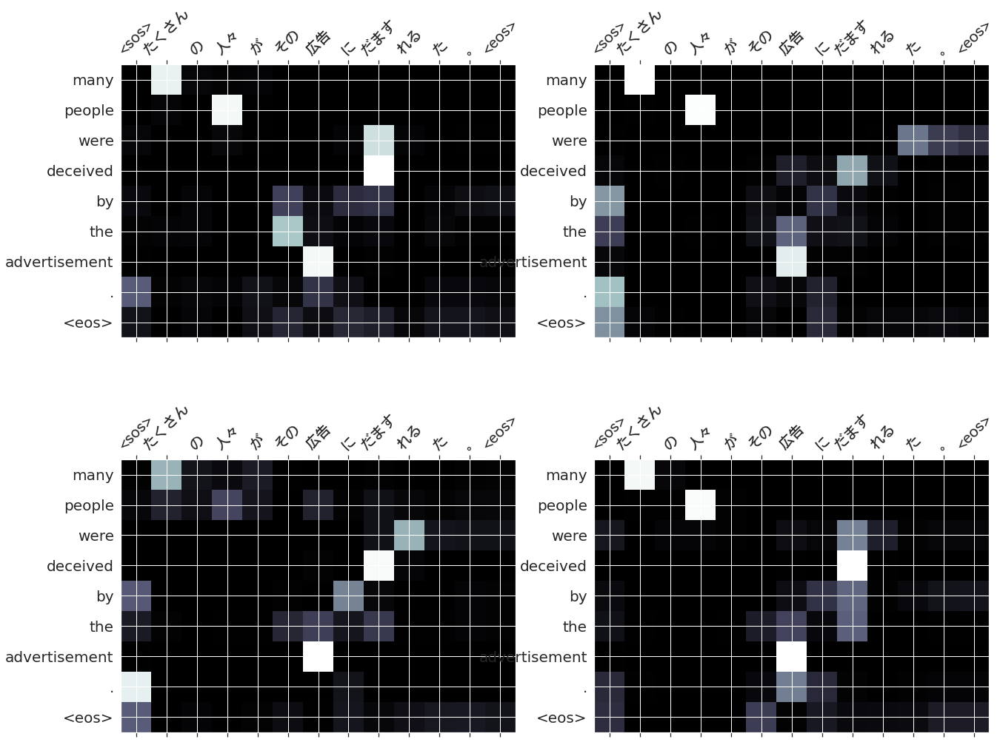

175
src      : 私 は 体重 を 減らす たい 。
trg      : i want to lose weight .
predicted: i want to lose weight . <eos>
     blue: 100.00%


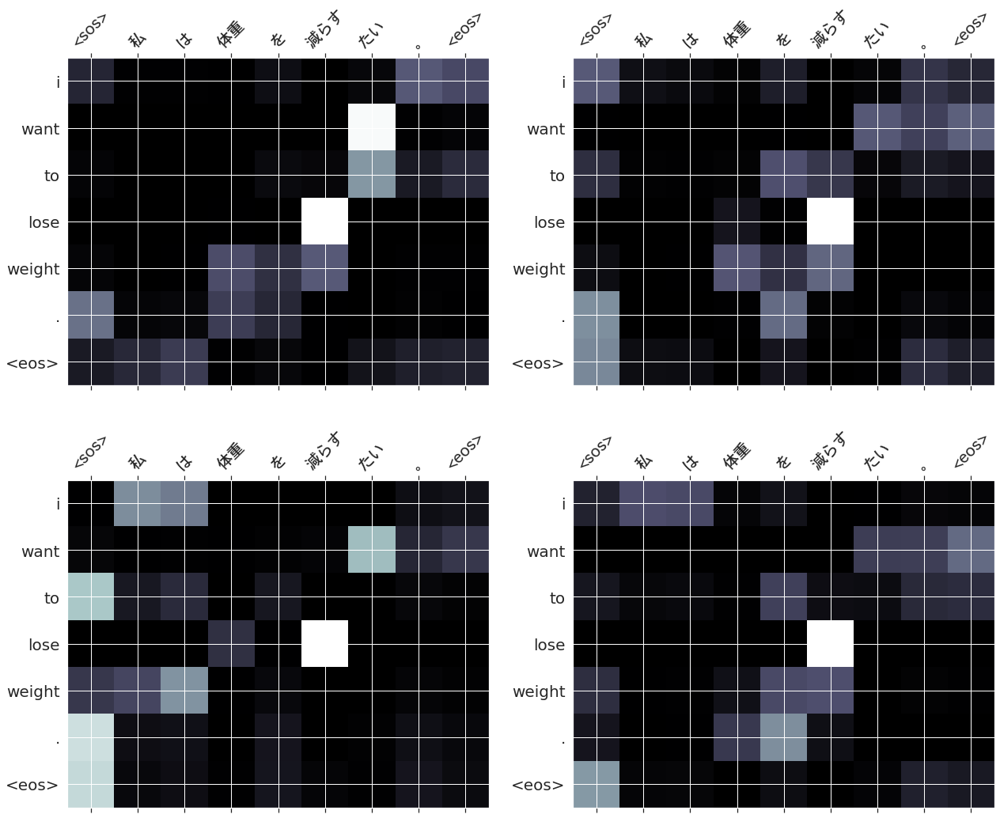

176
src      : あなた は 何 か ほか の こと を 考える てる た よう です ね 。
trg      : you seem to have thought of something else .
predicted: you seem to have thought of something else . <eos>
     blue: 100.00%


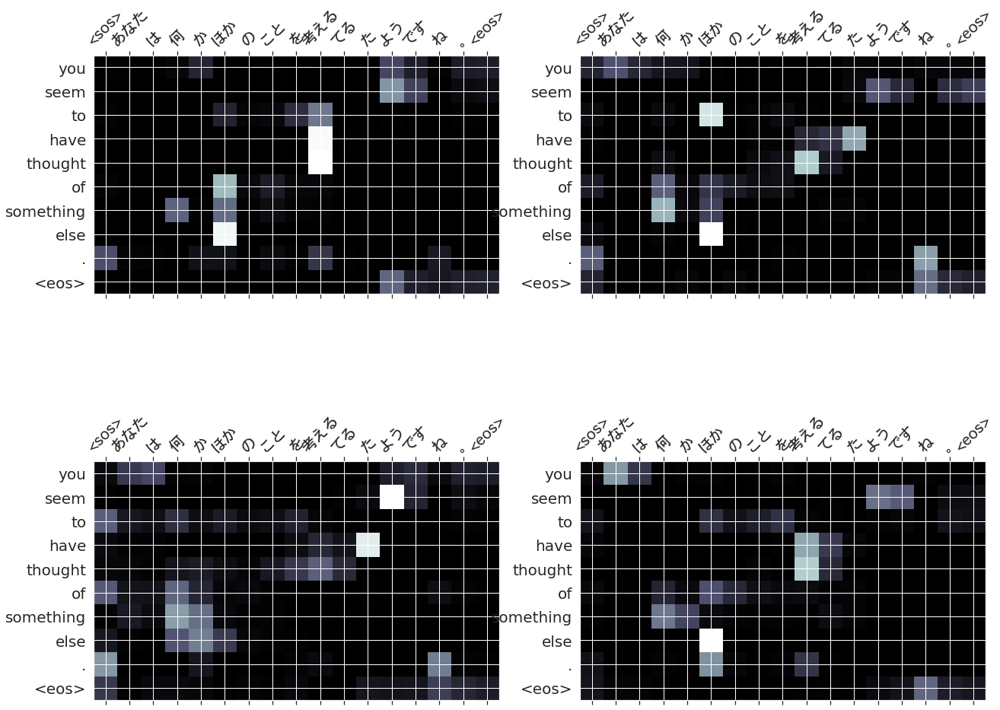

177
src      : 彼 は たいへん 注意深い 。
trg      : he is very careful .
predicted: he is very careful . <eos>
     blue: 100.00%


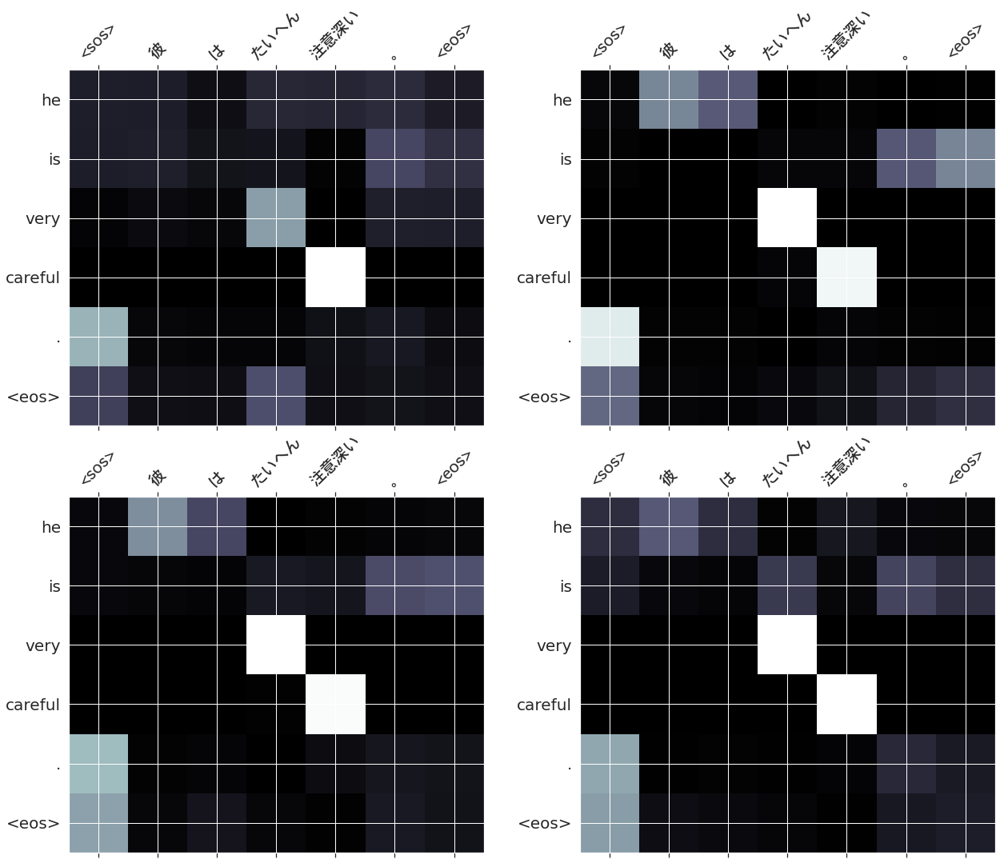

178
src      : なべ を 焦げ付く せる て は だめ だ よ 。
trg      : do n't let the pan boil dry .
predicted: do n't let the pan boil dry . <eos>
     blue: 100.00%


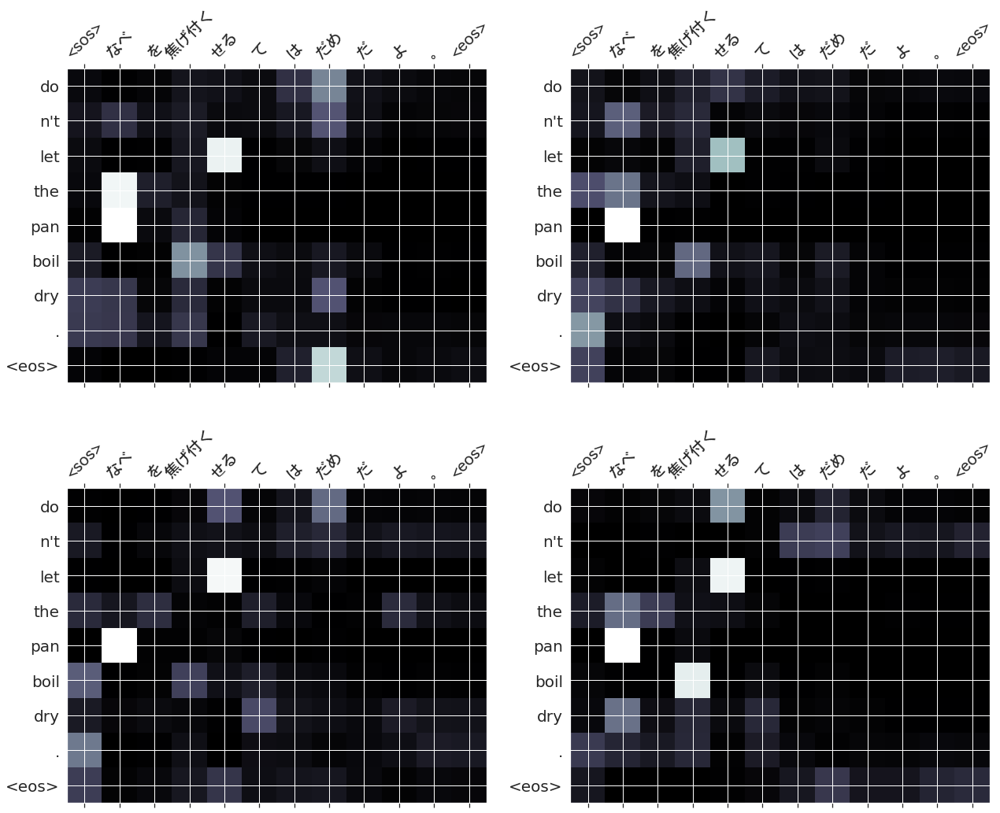

179
src      : 彼 の 話 は 本当 かも しれる ない 。
trg      : his story may be true .
predicted: his story may be true . <eos>
     blue: 100.00%


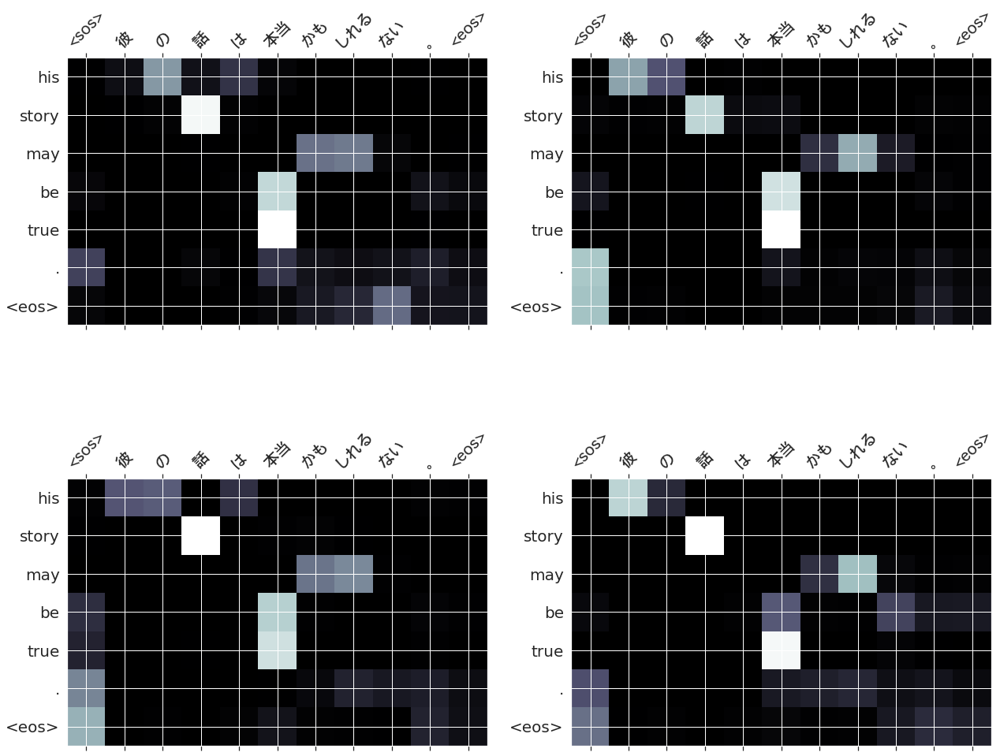

180
src      : 慈愛 は 我が家 から はじまる 。
trg      : charity begins at home .
predicted: charity begins at home . <eos>
     blue: 100.00%


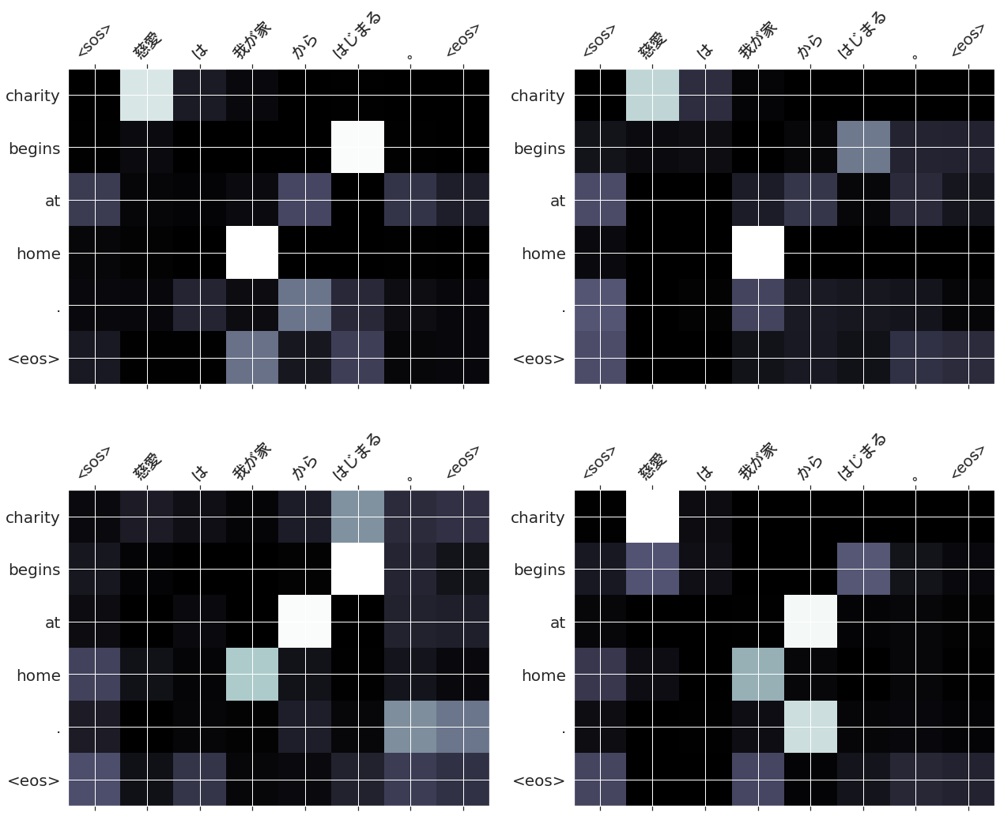

181
src      : ブライアン は 憂鬱 そう に 見える 。
trg      : brian looks blue .
predicted: brian looks blue . <eos>
     blue: 100.00%


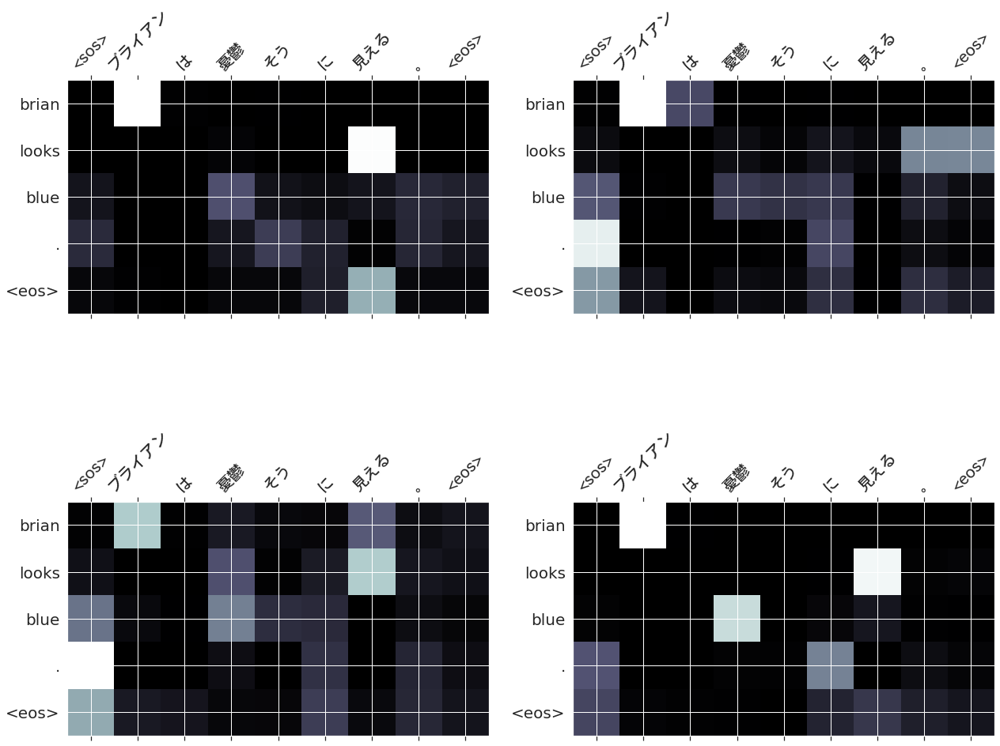

In [51]:
idxs = list(range(len(test_data)))
random.shuffle(idxs)

count = 1

for example_idx in idxs:
    # example_idx = random.randint(0, 1219)
    src = vars(test_data.examples[example_idx])['src']
    trg = vars(test_data.examples[example_idx])['trg']
    translation, attention = translate_sentence(src, SRC, TRG, model, device, max_trg, src_tokenize)
    result = [translation[0]]
    
    blue = sentence_blue(trg, translation, 4)
    if blue < .9:
        continue


    for token in translation:
        if token != result[-1]:
            result.append(token)
    if reverse_src:
        src.reverse()

    if reverse_trg:
        trg.reverse()
        translation.reverse()

    print(count)

    print(f'src      : {" ".join(src)}')
    print(f'trg      : {" ".join(trg)}')
    print(f'predicted: {" ".join(translation)}')
    print(f'     blue: {100 * blue:.2f}%')
    display_attention(src, translation, attention, n_heads = DEC_HEADS, n_rows = DEC_HEADS/2, n_cols = 2, fontprop_x=fontprop_x, fontprop_y=fontprop_y, reverse_trg=reverse_trg)

    count += 1
    # if count > 50:
    #     break